## AUTHOR: RICHARD FRIMPONG

### STAGE 1-ENVIRONMENT SETUP AND DATA IMPORT

Python: 3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]
pandas: 2.0.3, numpy: 1.23.5, scikit-learn: 1.2.1
Dataset Shape: (3900, 19)

Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer ID               3900 non-null   int64  
 1   Age                       3900 non-null   int64  
 2   Gender                    3900 non-null   object 
 3   Item Purchased            3900 non-null   object 
 4   Category                  3900 non-null   object 
 5   Purchase Amount (USD)     3900 non-null   int64  
 6   Location                  3900 non-null   object 
 7   Size                      3900 non-null   object 
 8   Color                     3900 non-null   object 
 9   Season                    3900 non-null   object 
 10  Review Rating  

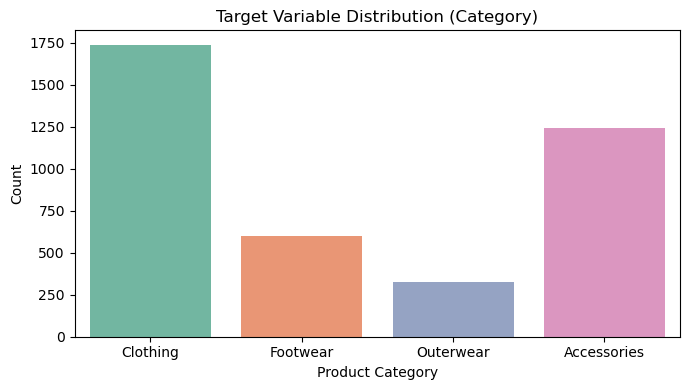


Missing Values Per Column:
Customer ID                 0
Age                         0
Gender                      0
Item Purchased              0
Category                    0
Purchase Amount (USD)       0
Location                    0
Size                        0
Color                       0
Season                      0
Review Rating               0
Subscription Status         0
Payment Method              0
Shipping Type               0
Discount Applied            0
Promo Code Used             0
Previous Purchases          0
Preferred Payment Method    0
Frequency of Purchases      0
dtype: int64

Duplicate Records Detected: 0

Unique Categories in Target:
['Clothing' 'Footwear' 'Outerwear' 'Accessories']

Dropped 'Customer ID' from df_work (identifier – not predictive).

Pearson Correlation (Numeric Features):
                            Age  Purchase Amount (USD)  Review Rating  \
Age                    1.000000              -0.010424      -0.021949   
Purchase Amount (USD) -0

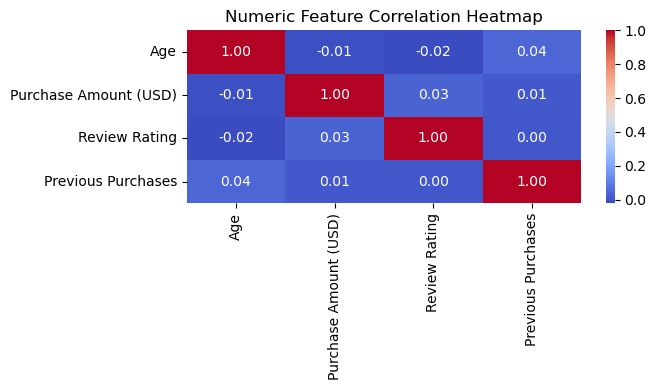

Potential outliers in Age: 0
Potential outliers in Purchase Amount (USD): 0
Potential outliers in Review Rating: 0
Potential outliers in Previous Purchases: 0

Stage 1 complete. Data loaded and validated (no modelling transformations applied).


In [1]:
# ================================================================
# STAGE 1 - ENVIRONMENT SETUP, DATA IMPORT, AND FIRST DATA CHECKS
# CRISP-DM Phase: Data Understanding
# ================================================================
# Why this stage exists:
# - Load the dataset safely and reproducibly
# - Confirm it is usable (no missing values, no duplicates, correct data types)
# - Understand the prediction target ("Category") and whether it is imbalanced
# - Explore basic relationships between numeric fields (to inform modelling later)
#
# Important professional rule:
# - We do NOT encode labels or scale features here.
#   Those steps belong inside the modelling pipeline (later stages) to prevent
#   "data leakage" — where the model accidentally learns from information that
#   would not be available in real deployment.
# ================================================================

# -------------------------
# 1) Import required libraries
# -------------------------
import sys
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# Machine learning imports are kept here because later stages will use them,
# but we will NOT train models or transform features in Stage 1.
import sklearn

# -------------------------
# 2) Reproducibility: fix randomness
# -------------------------
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# -------------------------
# 3) Version printing (helps employers reproduce results)
# -------------------------
print(f"Python: {sys.version}")
print(f"pandas: {pd.__version__}, numpy: {np.__version__}, scikit-learn: {sklearn.__version__}")

# -------------------------
# 4) File paths (makes the notebook reusable across machines)
# -------------------------
DATA_PATH = Path("Customer Shopping Trends Dataset.csv") 

if not DATA_PATH.exists():
    raise FileNotFoundError(
        f"Could not find dataset at: {DATA_PATH.resolve()}\n"
        "Tip: Place the CSV in the same folder as this notebook, or update DATA_PATH."
    )

# -------------------------
# 5) Load dataset (single source of truth)
# -------------------------
# Dataset: Customer Shopping Trends (Kaggle)
# Rows: 3,900 | Columns: 19 | Target: 'Category'
# Ethical note: dataset is anonymised; no direct personal identifiers like names/emails/phone numbers.
df_raw = pd.read_csv(DATA_PATH)

# Create working copies:
# - df_eda: used for charts and descriptive analysis (keeps categories as text)
# - df_work: used for cleaning steps that do NOT change meaning (e.g., dropping ID)
df_eda = df_raw.copy()
df_work = df_raw.copy()

# -------------------------
# 6) Quick dataset overview
# -------------------------
print("Dataset Shape:", df_raw.shape)

print("\nData Types and Non-Null Counts:")
df_raw.info()

print("\nBasic Statistical Summary (Numerical Features):")
print(df_raw.describe())

# -------------------------
# 7) Target variable distribution (imbalance check)
# -------------------------
# Why this matters:
# - If one category appears far more than others, a model can "cheat" by mostly predicting
#   the majority class and still look good on accuracy. This is why we later use metrics
#   like Macro F1 and consider balancing methods.
target_col = "Category"

print("\nTarget Variable Distribution (counts):")
print(df_raw[target_col].value_counts())

print("\nTarget Variable Distribution (percentages):")
print((df_raw[target_col].value_counts(normalize=True) * 100).round(2))

plt.figure(figsize=(7, 4))
sns.countplot(x=target_col, data=df_raw, palette="Set2")
plt.title("Target Variable Distribution (Category)")
plt.xlabel("Product Category")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# -------------------------
# 8) Data integrity checks (missing values + duplicates)
# -------------------------
print("\nMissing Values Per Column:")
print(df_raw.isnull().sum())

duplicate_count = df_raw.duplicated().sum()
print(f"\nDuplicate Records Detected: {duplicate_count}")

print("\nUnique Categories in Target:")
print(df_raw[target_col].unique())

# -------------------------
# 9) Drop non-predictive identifier (for modelling copy only)
# -------------------------
# Why this matters:
# - "Customer ID" is a unique identifier, not a meaningful customer trait.
# - Including it can cause models to learn meaningless patterns and reduces credibility.
id_col = "Customer ID"
if id_col in df_work.columns:
    df_work = df_work.drop(columns=[id_col])
    print("\nDropped 'Customer ID' from df_work (identifier – not predictive).")

# -------------------------
# 10) Numeric feature relationship check (correlation heatmap)
# -------------------------
# Why this matters:
# - Strong correlation between numeric features can indicate redundancy.
# - Here it also gives us intuition about whether numeric features move together.
numeric_features = ["Age", "Purchase Amount (USD)", "Review Rating", "Previous Purchases"]

corr_matrix = df_work[numeric_features].corr(method="pearson")
print("\nPearson Correlation (Numeric Features):")
print(corr_matrix)

plt.figure(figsize=(7, 4))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Numeric Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

# -------------------------
# 11) Outlier scan (IQR method)
# -------------------------
# Why we do this:
# - It checks whether values are extreme compared to the rest of the data.
# - In retail, extremes can be real customers (e.g., high spending),
#   so we do NOT automatically remove them.
def detect_outliers_iqr(series: pd.Series) -> pd.Series:
    """Return the subset of values flagged as potential outliers by the IQR rule."""
    q1, q3 = series.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr
    return series[(series < lower) | (series > upper)]

for col in numeric_features:
    outliers = detect_outliers_iqr(df_work[col])
    print(f"Potential outliers in {col}: {len(outliers)}")

# Professional note:
# - We keep outliers unless we can justify they are data errors.
# - Later we can test robust models or transformations if needed.

# -------------------------
# 12) Output objects for later stages
# -------------------------
# df_eda  -> use for charts and association testing with readable category labels
# df_work -> use for modelling pipeline later (still NOT encoded/scaled here)
print("\nStage 1 complete. Data loaded and validated (no modelling transformations applied).")

### STAGE 2 - EXPLORATORY DATA ANALYSIS (EDA)

Dataset Dimensions: 3900 rows × 19 columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer ID               3900 non-null   int64  
 1   Age                       3900 non-null   int64  
 2   Gender                    3900 non-null   object 
 3   Item Purchased            3900 non-null   object 
 4   Category                  3900 non-null   object 
 5   Purchase Amount (USD)     3900 non-null   int64  
 6   Location                  3900 non-null   object 
 7   Size                      3900 non-null   object 
 8   Color                     3900 non-null   object 
 9   Season                    3900 non-null   object 
 10  Review Rating             3900 non-null   float64
 11  Subscription Status       3900 non-null   object 
 12  Payment Method            3900 non-null   object 
 13  Shipping Type       

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Payment Method,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Preferred Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Credit Card,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Bank Transfer,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Cash,Free Shipping,Yes,Yes,23,Credit Card,Weekly



Target Variable Distribution:


,Count,Percentage (%)
Category,,
Clothing,1737,44.54
Accessories,1240,31.79
Footwear,599,15.36
Outerwear,324,8.31


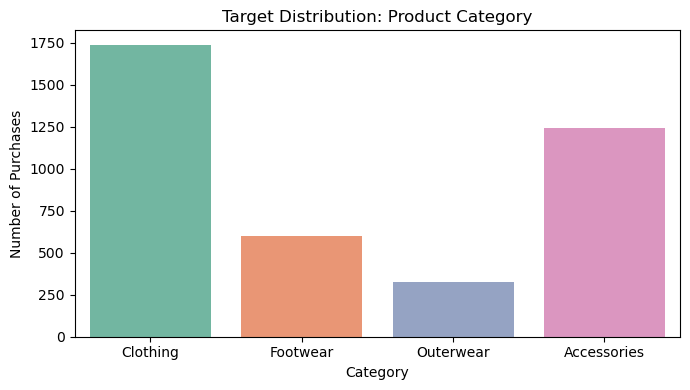


Numeric Feature Summary:


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis
Age,3900.0,44.068462,15.207589,18.0,31.0,44.0,57.0,70.0,-0.006380,-1.195087
Purchase Amount (USD),3900.0,59.764359,23.685392,20.0,39.0,60.0,81.0,100.0,0.012702,-1.236594
Review Rating,3900.0,3.749949,0.716223,2.5,3.1,3.7,4.4,5.0,0.004525,-1.179628
Previous Purchases,3900.0,25.351538,14.447125,1.0,13.0,25.0,38.0,50.0,0.003121,-1.190187


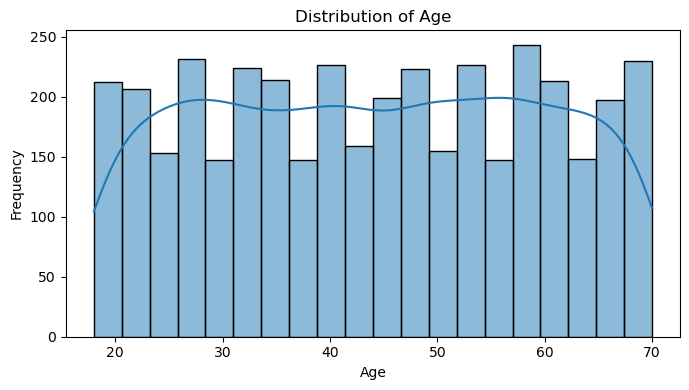

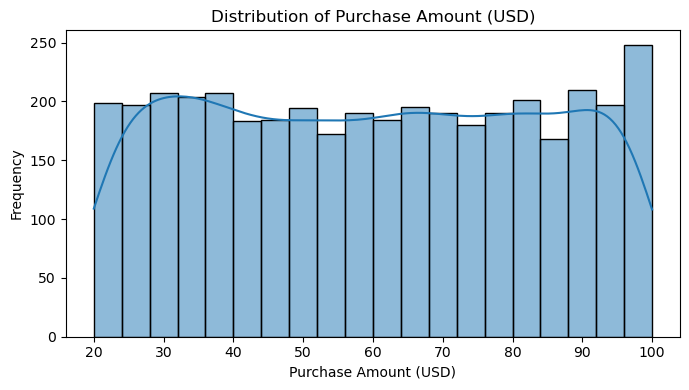

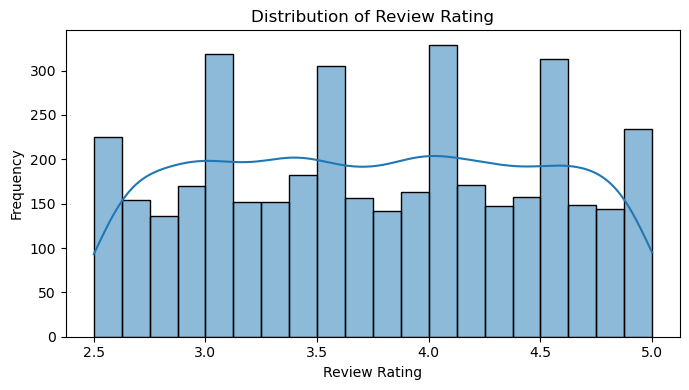

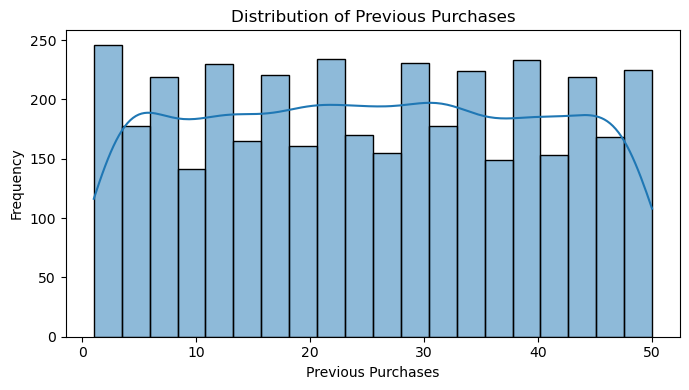


Categorical Feature: Gender


,Percentage (%)
Gender,
Male,68.0
Female,32.0



Categorical Feature: Item Purchased


,Count,Percentage (%)
Item Purchased,,
Blouse,171,4.38
Jewelry,171,4.38
Pants,171,4.38
Shirt,169,4.33
Dress,166,4.26
Sweater,164,4.21
Jacket,163,4.18
Belt,161,4.13
Sunglasses,161,4.13



Categorical Feature: Location


,Count,Percentage (%)
Location,,
Montana,96,2.46
California,95,2.44
Idaho,93,2.38
Illinois,92,2.36
Alabama,89,2.28
Minnesota,88,2.26
Nebraska,87,2.23
New York,87,2.23
Nevada,87,2.23



Categorical Feature: Size


,Percentage (%)
Size,
M,45.0
L,27.0
S,17.0
XL,11.0



Categorical Feature: Color


,Count,Percentage (%)
Color,,
Olive,177,4.54
Yellow,174,4.46
Silver,173,4.44
Teal,172,4.41
Green,169,4.33
Black,167,4.28
Cyan,166,4.26
Violet,166,4.26
Gray,159,4.08



Categorical Feature: Season


,Percentage (%)
Season,
Spring,25.62
Fall,25.00
Winter,24.90
Summer,24.49



Categorical Feature: Subscription Status


,Percentage (%)
Subscription Status,
No,73.0
Yes,27.0



Categorical Feature: Payment Method


,Percentage (%)
Payment Method,
Credit Card,17.85
Venmo,16.74
Cash,16.62
PayPal,16.36
Debit Card,16.23
Bank Transfer,16.21



Categorical Feature: Shipping Type


,Percentage (%)
Shipping Type,
Free Shipping,17.31
Standard,16.77
Store Pickup,16.67
Next Day Air,16.62
Express,16.56
2-Day Shipping,16.08



Categorical Feature: Discount Applied


,Percentage (%)
Discount Applied,
No,57.0
Yes,43.0



Categorical Feature: Promo Code Used


,Percentage (%)
Promo Code Used,
No,57.0
Yes,43.0



Categorical Feature: Preferred Payment Method


,Percentage (%)
Preferred Payment Method,
PayPal,17.36
Credit Card,17.21
Cash,17.18
Debit Card,16.31
Venmo,16.26
Bank Transfer,15.69



Categorical Feature: Frequency of Purchases


,Percentage (%)
Frequency of Purchases,
Every 3 Months,14.97
Annually,14.67
Quarterly,14.44
Monthly,14.18
Bi-Weekly,14.03
Fortnightly,13.90
Weekly,13.82



Categorical Associations with Category (ranked):


,Feature,p_value,cramers_v
1,Item Purchased,0.000000,0.997
7,Payment Method,0.246109,0.017
4,Color,0.467180,0.005
0,Gender,0.896794,0.000
2,Location,0.910440,0.000
3,Size,0.437810,0.000
5,Season,0.540844,0.000
6,Subscription Status,0.718617,0.000
8,Shipping Type,0.847121,0.000
9,Discount Applied,0.752933,0.000


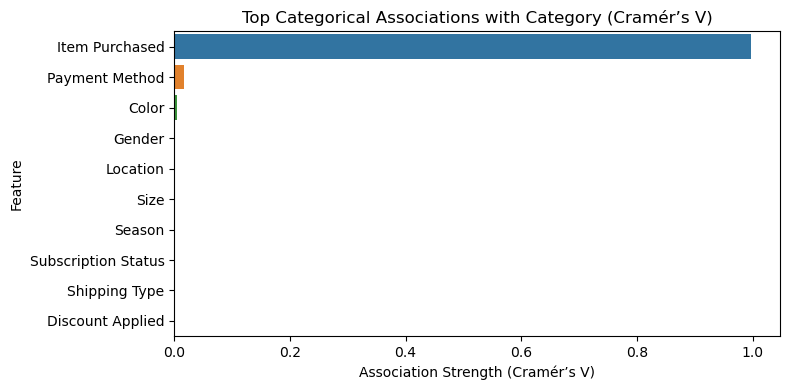


Potential proxy/leakage features (to EXCLUDE from modelling): ['Item Purchased']

Numeric Feature Differences across Categories (Kruskal-Wallis):


,Feature,kruskal_stat,p_value
2,Review Rating,5.260,0.153734
1,Purchase Amount (USD),4.411,0.220345
3,Previous Purchases,1.294,0.730525
0,Age,1.156,0.763507



EDA Summary (plain English):
- The target Category is imbalanced (Clothing is most common; Outerwear is least common).
- Most customer attributes show weak association with Category when assessed one-at-a-time.
- Item Purchased shows an extremely strong association with Category, which indicates it is likely a proxy/leakage feature.
- Numeric features do not show strong univariate differences across categories, but may still help in combination during modelling.


In [2]:
# ================================================================
# STAGE 2 - EXPLORATORY DATA ANALYSIS (EDA)
# CRISP- DM Phase: Data Understanding
# ================================================================
# Why this stage exists:
# - Before building any predictive model, we need to understand:
#   (1) what the data contains,
#   (2) whether the target is imbalanced,
#   (3) which customer attributes show meaningful association with the target,
#   (4) whether any features accidentally "leak" the answer (which would inflate results).
#
# Output of this stage:
# - A small set of high-value charts (not dozens)
# - Ranked association tables that support Hypothesis H₁₁ / H₀₁
# - A clear modelling decision about proxy/leakage features
# ================================================================

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Use the human-readable copy for EDA
eda_df = df_eda.copy()
target_col = "Category"

# -------------------------
# 1) Dataset overview (quick sanity check)
# -------------------------
print(f"Dataset Dimensions: {eda_df.shape[0]} rows × {eda_df.shape[1]} columns")
eda_df.info()

display(eda_df.head(3))

# -------------------------
# 2) Target distribution (class imbalance)
# -------------------------
# Why it matters:
# - If one class dominates, accuracy can be misleading.
# - Later we prioritise Macro-F1 and consider class-weighting/resampling.
target_counts = eda_df[target_col].value_counts()
target_pct = (target_counts / len(eda_df) * 100).round(2)

target_summary = pd.DataFrame({"Count": target_counts, "Percentage (%)": target_pct})
print("\nTarget Variable Distribution:")
display(target_summary)

plt.figure(figsize=(7, 4))
sns.countplot(x=target_col, data=eda_df, palette="Set2")
plt.title("Target Distribution: Product Category")
plt.xlabel("Category")
plt.ylabel("Number of Purchases")
plt.tight_layout()
plt.show()

# -------------------------
# 3) Numeric feature summary (one table + simple distributions)
# -------------------------
numeric_cols = eda_df.select_dtypes(include=["int64", "float64"]).columns.tolist()

# Customer ID is an identifier, not a real numeric predictor
if "Customer ID" in numeric_cols:
    numeric_cols.remove("Customer ID")

num_summary = eda_df[numeric_cols].describe().T
num_summary["skewness"] = eda_df[numeric_cols].skew()
num_summary["kurtosis"] = eda_df[numeric_cols].kurt()
print("\nNumeric Feature Summary:")
display(num_summary)

# Keep visuals lightweight: 4 plots total (one per numeric feature)
for col in numeric_cols:
    plt.figure(figsize=(7, 4))
    sns.histplot(eda_df[col], bins=20, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

# -------------------------
# 4) Categorical feature distributions (practical, not overwhelming)
# -------------------------
# Why it matters:
# - High-cardinality fields (e.g., Location) create many sparse categories.
# - This impacts encoding strategy and model complexity later.
categorical_cols = eda_df.select_dtypes(include=["object"]).columns.tolist()
categorical_cols = [c for c in categorical_cols if c != target_col]

def show_top_categories(df, col, top_n=10):
    """Show a compact distribution for high-cardinality categorical columns."""
    vc = df[col].value_counts()
    top = vc.head(top_n)
    other = vc.iloc[top_n:].sum()
    summary = pd.DataFrame({"Count": top})
    if other > 0:
        summary.loc["Other"] = other
    summary["Percentage (%)"] = (summary["Count"] / len(df) * 100).round(2)
    return summary

for col in categorical_cols:
    print(f"\nCategorical Feature: {col}")
    # If too many categories, show top 10 + 'Other'
    if eda_df[col].nunique() > 12:
        display(show_top_categories(eda_df, col, top_n=10))
    else:
        display((eda_df[col].value_counts(normalize=True) * 100).round(2).to_frame("Percentage (%)"))

# -------------------------
# 5) Hypothesis H₀₁/H₁₁: Categorical association tests (Chi-square + Cramér’s V)
# -------------------------
# This answers Research Question 1:
# "What associations exist between customer attributes and product category purchased?"

def cramers_v_from_crosstab(crosstab: pd.DataFrame) -> float:
    """
    Cramér’s V (bias-corrected) gives strength of association between two categorical variables.
    0 = none, 1 = perfect association.
    """
    chi2 = stats.chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    phi2 = chi2 / n
    r, k = crosstab.shape
    phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    r_corr = r - ((r - 1) ** 2) / (n - 1)
    k_corr = k - ((k - 1) ** 2) / (n - 1)
    return float(np.sqrt(phi2_corr / max(1e-12, min((k_corr - 1), (r_corr - 1)))))

assoc_rows = []

for col in categorical_cols:
    ct = pd.crosstab(eda_df[col], eda_df[target_col])
    chi2, p, _, _ = stats.chi2_contingency(ct)
    v = cramers_v_from_crosstab(ct)
    assoc_rows.append({"Feature": col, "p_value": p, "cramers_v": v})

assoc_df = pd.DataFrame(assoc_rows).sort_values("cramers_v", ascending=False)
assoc_df["p_value"] = assoc_df["p_value"].round(6)
assoc_df["cramers_v"] = assoc_df["cramers_v"].round(3)

print("\nCategorical Associations with Category (ranked):")
display(assoc_df)

plt.figure(figsize=(8, 4))
sns.barplot(data=assoc_df.head(10), x="cramers_v", y="Feature")
plt.title("Top Categorical Associations with Category (Cramér’s V)")
plt.xlabel("Association Strength (Cramér’s V)")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# -------------------------
# 6) Critical modelling decision: identify proxy/leakage features
# -------------------------
# Non-technical explanation:
# - If a feature almost perfectly predicts the target, it may be "leaking" the answer.
# - Example: Item Purchased often directly maps to Category (e.g., Shoes -> Footwear).
# - If used in modelling, results look artificially strong and won't generalise to real use.
#
# Action:
# - Keep Item Purchased for EDA interpretation only.
# - Exclude it from modelling features later unless the use case is explicitly "classify item into category".

LEAKAGE_CANDIDATES = []
if "Item Purchased" in assoc_df["Feature"].values:
    item_v = assoc_df.loc[assoc_df["Feature"] == "Item Purchased", "cramers_v"].iloc[0]
    if item_v > 0.90:
        LEAKAGE_CANDIDATES.append("Item Purchased")

print("\nPotential proxy/leakage features (to EXCLUDE from modelling):", LEAKAGE_CANDIDATES)

# -------------------------
# 7) Hypothesis H₀₁/H₁₁: Numeric vs Category (Kruskal-Wallis)
# -------------------------
# Why Kruskal-Wallis:
# - It is robust when distributions are not perfectly normal.
num_rows = []
for col in numeric_cols:
    groups = [eda_df.loc[eda_df[target_col] == cls, col] for cls in eda_df[target_col].unique()]
    stat, p = stats.kruskal(*groups)
    num_rows.append({"Feature": col, "kruskal_stat": stat, "p_value": p})

num_df = pd.DataFrame(num_rows).sort_values("p_value")
num_df["kruskal_stat"] = num_df["kruskal_stat"].round(3)
num_df["p_value"] = num_df["p_value"].round(6)

print("\nNumeric Feature Differences across Categories (Kruskal-Wallis):")
display(num_df)

# -------------------------
# 8) Plain-English synthesis (what we learned)
# -------------------------
print("\nEDA Summary (plain English):")
print("- The target Category is imbalanced (Clothing is most common; Outerwear is least common).")
print("- Most customer attributes show weak association with Category when assessed one-at-a-time.")
print("- Item Purchased shows an extremely strong association with Category, which indicates it is likely a proxy/leakage feature.")
print("- Numeric features do not show strong univariate differences across categories, but may still help in combination during modelling.")

### STAGE 3:FEATURE ENGINEERING & PREPROCESSING

In [3]:
# ======================================================================
# STAGE 3: FEATURE ENGINEERING & PREPROCESSING
# CRISP-DM Phase: Data Preparation
# ======================================================================
# Business / research purpose:
# This stage turns raw customer purchase records into a clean, consistent,
# “model-ready” dataset that can be used fairly in machine learning.
#
# Why this matters:
# - In real deployment, the model must handle new customers and new combinations
#   of categories without “breaking”.
# - Evaluation must be honest: nothing in preprocessing can accidentally use
#   information from the validation/test sets (data leakage).
#
# How this stage supports objectives:
# - Objective 2: Create structured inputs for DT/RF/LR/XGBoost/LightGBM models.
# - Objective 3: Enable robust model evaluation by producing clean splits and
#   leakage-safe encoders.
# - Objective 4: Preserve interpretability: the preprocessing makes it possible to
#   compute reliable feature importance later.
#
# Key integrity rule enforced here:
# ALL mappings are learned on TRAIN only and then applied to VAL/TEST.
# This mimics how the model would work in production on unseen data.
#
# IMPORTANT modelling note:
# - We build TWO preprocessors:
#   (A) WITHOUT "Item Purchased"  -> realistic preference prediction (DEFAULT)
#   (B) WITH "Item Purchased"     -> diagnostic upper-bound (likely inflates performance)
# ======================================================================

from __future__ import annotations

import numpy as np
import pandas as pd
import warnings
from typing import Dict, List, Tuple, Set

warnings.filterwarnings("ignore", category=FutureWarning)

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline as SkPipeline

# -----------------------------
# 0) CONFIG — set once for reproducibility
# -----------------------------
TARGET_COL = "Category"

# Why stratified splitting?
# - Your target classes are imbalanced (e.g., Clothing > Outerwear).
# - Stratification ensures train/val/test all represent each class similarly,
#   reducing the risk of misleading evaluation results.
TEST_SIZE = 0.30        # hold out 30% initially
VAL_FROM_TEMP = 0.50    # split the 30% into 15% val + 15% test
RANDOM_STATE = 42

# Numeric predictors:
# These are continuous customer behaviour signals that can influence category preference.
# (E.g., frequent shoppers may purchase different categories.)
BASE_NUMERIC = ["Purchase Amount (USD)", "Previous Purchases"]

# Raw categorical predictors:
# These represent customer traits and behaviours that can influence product category.
BASE_CATEGORICAL = [
    "Gender", "Item Purchased", "Location", "Size", "Color", "Season",
    "Subscription Status", "Payment Method", "Shipping Type",
    "Discount Applied", "Promo Code Used", "Preferred Payment Method",
    "Frequency of Purchases"
]

# Composite categorical features created later:
# These represent “combined behaviours” that can capture patterns not visible
# when features are analysed separately (supports multivariate modelling).
COMPOSITE_CATEGORICAL = [
    "Gender_Season",
    "Payment_Shipping",
    "PaymentMethod_Season",
    "Season_Gender_Age"  # uses Age_Group if available
]

# Rare-merge policy:
# Business reason: very rare categories produce sparse features that can
# make models unstable and reduce generalisation.
# We only do rare-merge on *base* low-cardinality columns.
RARE_POLICY: Dict[str, Dict] = {
    "Gender":                   {"mode": "min_prop",  "threshold": 0.01},
    "Season":                   {"mode": "min_prop",  "threshold": 0.01},
    "Size":                     {"mode": "min_prop",  "threshold": 0.01},
    "Subscription Status":      {"mode": "min_prop",  "threshold": 0.01},
    "Payment Method":           {"mode": "min_prop",  "threshold": 0.01},
    "Shipping Type":            {"mode": "min_prop",  "threshold": 0.01},
    "Discount Applied":         {"mode": "min_prop",  "threshold": 0.01},
    "Promo Code Used":          {"mode": "min_prop",  "threshold": 0.01},
    "Preferred Payment Method": {"mode": "min_prop",  "threshold": 0.01},
    "Frequency of Purchases":   {"mode": "min_prop",  "threshold": 0.01},
    # High-card columns (Top-K only): Item Purchased, Location, Color
}

# Top-K plan:
# Business reason: for high-cardinality columns (many unique values),
# keeping only the most common levels reduces noise and improves robustness.
# Anything outside Top-K becomes "Other".
TOPK_PLAN: Dict[str, int] = {
    "Item Purchased":       12,
    "Location":             18,
    "Color":                10,
    "PaymentMethod_Season": 20,
    "Payment_Shipping":     20,
    "Season_Gender_Age":    25,
    "Gender_Season":        12,
}

# Columns with too few unique values on TRAIN after merging are dropped
# because they add little predictive value and can confuse interpretation.
MIN_UNIQUE_TRAIN = 2


# ======================================================================
# 1) Utilities
# ======================================================================
def _dedup(seq: List[str]) -> List[str]:
    """Order-preserving de-duplication (prevents accidental duplicates in feature lists)."""
    seen, out = set(), []
    for x in seq:
        if x not in seen:
            seen.add(x)
            out.append(x)
    return out


def normalize_frequency_labels(df: pd.DataFrame) -> pd.DataFrame:
    """
    Purpose (non-technical):
    Fix inconsistent text labels so the model does not treat the same behaviour
    as different categories (e.g., 'Fortnightly' vs 'Bi-Weekly').

    Why it matters:
    - Prevents silent missing values during later mapping.
    - Improves fairness/consistency across customers.
    """
    if "Frequency of Purchases" not in df.columns:
        return df
    df = df.copy()
    canon = {
        "Fortnightly": "Bi-Weekly",
        "Biweekly": "Bi-Weekly",
        "Every 2 Weeks": "Bi-Weekly",
        "Once a Week": "Weekly",
        "Every 3 Months": "Quarterly",
    }
    df["Frequency of Purchases"] = df["Frequency of Purchases"].astype(str).replace(canon)
    return df


# ======================================================================
# 2) EDA-informed Feature Engineering
# ======================================================================
def fe_bin_numeric(df: pd.DataFrame) -> pd.DataFrame:
    """
    Business rationale:
    Binning converts continuous variables into interpretable groups that
    non-technical stakeholders can understand (e.g., Age 18–30).

    Research rationale:
    - Some models benefit from non-linear groupings (especially tree models),
      and the bins can capture threshold effects.
    """
    df = df.copy()

    if "Age" in df.columns:
        age_bins = [17, 30, 40, 50, 60, 200]
        age_labels = ["18-30", "31-40", "41-50", "51-60", "61+"]
        df["Age_Group"] = pd.cut(df["Age"], bins=age_bins, labels=age_labels)

    if "Review Rating" in df.columns:
        # Note: Your bins are coarse by design (interpretability > micro-precision).
        rating_bins = [0, 2, 3, 5]
        rating_labels = ["Low", "Medium", "High"]
        df["ReviewRating_Group"] = pd.cut(df["Review Rating"], bins=rating_bins, labels=rating_labels)

    return df


def fe_interactions(df: pd.DataFrame) -> pd.DataFrame:
    """
    Business rationale:
    Customers often behave differently depending on combinations of factors.
    Example: payment method preferences may differ by season, and those patterns
    can correlate with category buying behaviour.

    Research alignment:
    Supports Objective 1 and 2 by capturing multivariate behavioural signals.
    """
    df = df.copy()

    if {"Gender", "Season"}.issubset(df.columns):
        df["Gender_Season"] = df["Gender"].astype(str) + "_" + df["Season"].astype(str)

    if {"Payment Method", "Shipping Type"}.issubset(df.columns):
        df["Payment_Shipping"] = df["Payment Method"].astype(str) + "_" + df["Shipping Type"].astype(str)

    if {"Payment Method", "Season"}.issubset(df.columns):
        df["PaymentMethod_Season"] = df["Payment Method"].astype(str) + " | " + df["Season"].astype(str)

    if {"Season", "Gender"}.issubset(df.columns):
        if "Age_Group" in df.columns:
            df["Season_Gender_Age"] = (
                df["Season"].astype(str) + "_" +
                df["Gender"].astype(str) + "_" +
                df["Age_Group"].astype(str)
            )
        else:
            df["Season_Gender_Age"] = df["Season"].astype(str) + "_" + df["Gender"].astype(str)

    return df


def fe_composites(df: pd.DataFrame) -> pd.DataFrame:
    """
    Composite behavioural predictors:
    These aim to summarise customer purchasing behaviour in simple, explainable terms.

    - Purchase_Intensity approximates “overall customer purchasing intensity”
      (not just one purchase, but repeated purchases over time).
    - Discount_Sensitivity approximates “spend when discounts are applied”.
    - Freq_Score converts shopping frequency into an ordered scale.
    """
    df = df.copy()

    if {"Purchase Amount (USD)", "Previous Purchases"}.issubset(df.columns):
        df["Purchase_Intensity"] = df["Purchase Amount (USD)"] * (df["Previous Purchases"] + 1)

    if {"Discount Applied", "Purchase Amount (USD)"}.issubset(df.columns):
        df["Discount_Sensitivity"] = np.where(
            df["Discount Applied"].astype(str).str.lower().eq("yes"),
            df["Purchase Amount (USD)"],
            0.0
        )

    if "Frequency of Purchases" in df.columns:
        # Business interpretation:
        # Higher score = more frequent shopper.
        order = ["Daily", "Weekly", "Bi-Weekly", "Monthly", "Quarterly", "Annually"]
        mapper = {lvl: i for i, lvl in enumerate(order, start=1)}
        df["Freq_Score"] = df["Frequency of Purchases"].map(mapper)

    return df


def drop_replaced_raws(df: pd.DataFrame) -> pd.DataFrame:
    """
    Removes columns that are NOT intended for modelling in this design.

    Important note:
    - You are currently choosing to DROP 'Age' and 'Review Rating' after binning.
      That is a valid design choice, but it removes potentially useful signal.
      If you later want maximum predictive performance, keep the raw versions too.
    """
    return df.drop(columns=["Age", "Review Rating", "Customer ID"], errors="ignore")


# ======================================================================
# 3) TRAIN-only Rare Merge + TRAIN-only Top-K
# ======================================================================
def _learn_rare_values(col: pd.Series, mode: str, threshold: float) -> Set:
    """
    Learns which categories are rare based on TRAIN distribution only.
    Rare categories are grouped into "Other" to improve robustness.
    """
    vc = col.value_counts(normalize=(mode == "min_prop"), dropna=False)
    rare_mask = vc < threshold
    return set(vc.index[rare_mask].tolist())


def learn_rare_merge_from_train(X_train: pd.DataFrame, policy: Dict[str, Dict]) -> Dict[str, Set]:
    """Learn rare levels from TRAIN only (prevents leakage)."""
    mapping = {}
    for col, cfg in policy.items():
        if col not in X_train.columns:
            continue
        mode = cfg.get("mode", "min_prop")
        thr  = cfg.get("threshold", 0.01)
        mapping[col] = _learn_rare_values(X_train[col], mode, thr)

    non_empty = {k: sorted(list(v)) for k, v in mapping.items() if len(v) > 0}
    if non_empty:
        print("[INFO] Rare categories LEARNED FROM TRAIN:")
        for k, v in non_empty.items():
            print(f"  • {k}: {len(v)} rare levels")
    else:
        print("[INFO] No rare categories found on TRAIN under current policy.")
    return mapping


def apply_rare_merge_mapping(df: pd.DataFrame, mapping: Dict[str, Set]) -> Tuple[pd.DataFrame, Dict[str, int]]:
    """Apply TRAIN-learned rare → Other mapping to any split (train/val/test)."""
    df = df.copy()
    replaced = {}
    for col, rares in mapping.items():
        if col in df.columns and len(rares) > 0:
            df[col] = df[col].where(~df[col].isin(rares), "Other")
            replaced[col] = int((df[col] == "Other").sum())
    return df, replaced


def learn_topk_from_train(X_train: pd.DataFrame, topk_plan: Dict[str, int]) -> Dict[str, Set]:
    """
    Learns Top-K categories from TRAIN only.

    Business reason:
    - Helps the model focus on stable, common patterns.
    - Prevents overfitting to unusual one-off combinations.
    """
    keepers = {}
    for col, k in topk_plan.items():
        if col not in X_train.columns:
            continue
        counts = X_train[col].value_counts(dropna=False)
        keepers[col] = set(counts.head(k).index.tolist())

    print("[INFO] Top-K keepers learned from TRAIN:")
    for c, kept in keepers.items():
        print(f"  • {c}: keep {len(kept)} categories (Top-K={TOPK_PLAN.get(c)})")
    return keepers


def apply_topk_mapping(df: pd.DataFrame, keepers: Dict[str, Set]) -> Tuple[pd.DataFrame, Dict[str, int]]:
    """Apply Top-K mapping: values not in Top-K become "Other"."""
    df = df.copy()
    replaced = {}
    for col, kept in keepers.items():
        if col in df.columns and len(kept) > 0:
            df[col] = df[col].where(df[col].isin(kept), "Other")
            replaced[col] = int((df[col] == "Other").sum())
    return df, replaced


def drop_low_cardinality_post_merge(
    X_train: pd.DataFrame, X_val: pd.DataFrame, X_test: pd.DataFrame,
    categorical_features: List[str], min_unique: int = MIN_UNIQUE_TRAIN
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, List[str], List[str]]:
    """
    Drops categorical columns that become near-constant on TRAIN.
    Near-constant features rarely help prediction and can complicate interpretability.
    """
    to_drop = []
    for col in categorical_features:
        if col in X_train.columns and X_train[col].nunique(dropna=False) < min_unique:
            to_drop.append(col)

    if to_drop:
        print("[INFO] Dropping low-cardinality columns (post-merge/Top-K on TRAIN):")
        for c in to_drop:
            print(f"  • {c} (unique={X_train[c].nunique(dropna=False)})")

        X_train = X_train.drop(columns=to_drop, errors="ignore")
        X_val   = X_val.drop(columns=to_drop, errors="ignore")
        X_test  = X_test.drop(columns=to_drop, errors="ignore")
        categorical_features = [c for c in categorical_features if c not in to_drop]
    else:
        print("[INFO] No low-cardinality columns to drop.")

    return X_train, X_val, X_test, categorical_features, to_drop


# ======================================================================
# 4) Preprocessor + safe fit/transform (TRAIN only)
# ======================================================================
def make_preprocessor(numeric_features: List[str], categorical_features: List[str]) -> ColumnTransformer:
    """
    Converts mixed data types into a numeric matrix the ML models can learn from.

    Numeric handling:
    - Median imputation fills any unexpected missing values safely.
    - Scaling ensures numeric variables are on comparable scales (important for LR).

    Categorical handling:
    - Most-frequent imputation handles any unexpected missing labels.
    - One-hot encoding converts categories into machine-readable indicator features.
    - handle_unknown="ignore" ensures the model can handle new categories in production.
    """
    num_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler(with_mean=False)),  # works well with sparse matrices
    ])

    cat_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
    ])

    return ColumnTransformer(
        transformers=[
            ("num", num_pipe, numeric_features),
            ("cat", cat_pipe, categorical_features),
        ],
        remainder="drop"
    )


def fit_transform_splits(preprocessor: ColumnTransformer,
                         X_train: pd.DataFrame,
                         X_val: pd.DataFrame,
                         X_test: pd.DataFrame):
    """
    Diagnostic-only helper:
    - Fit preprocessing on TRAIN only
    - Transform VAL and TEST
    - Return encoded feature names so we can document the final feature space.

    Why this is “safe”:
    - No statistics are learned from validation/test sets.
    """
    X_train_enc = preprocessor.fit_transform(X_train)
    X_val_enc   = preprocessor.transform(X_val)
    X_test_enc  = preprocessor.transform(X_test)

    # Build readable encoded feature names (useful for documentation and feature importance later)
    num_names = preprocessor.transformers_[0][2]
    ohe = preprocessor.named_transformers_['cat']['encoder']
    cat_input_names = preprocessor.transformers_[1][2]
    cat_names = ohe.get_feature_names_out(cat_input_names)

    encoded_feature_names = np.concatenate([np.array(num_names, dtype=object), cat_names])
    print(f"[INFO] Encoded feature count: {len(encoded_feature_names)}")

    return X_train_enc, X_val_enc, X_test_enc, encoded_feature_names


# ======================================================================
# 5) Target encoding + class weights (train only)
# ======================================================================
def encode_labels(y_train_raw: pd.Series, y_val_raw: pd.Series, y_test_raw: pd.Series):
    """
    Converts target labels (e.g., 'Clothing') into numeric codes for ML algorithms.

    Business reason:
    - Models operate on numbers, but we preserve the original class names for reporting.
    """
    le = LabelEncoder().fit(y_train_raw)  # fit on train to lock class order
    y_train = le.transform(y_train_raw)
    y_val   = le.transform(y_val_raw)
    y_test  = le.transform(y_test_raw)
    classes = le.classes_
    print(f"[INFO] Classes: {list(classes)}")
    return y_train, y_val, y_test, le, classes


def compute_balanced_class_weights(y_train_raw: pd.Series, le: LabelEncoder):
    """
    Creates inverse-frequency weights so minority classes get more attention.

    Business reason:
    - Without weighting, the model can over-focus on the majority class (Clothing),
      under-serving minority categories (e.g., Outerwear), which is undesirable
      if the goal is to predict preferences fairly across categories.
    """
    counts = y_train_raw.value_counts()
    total = counts.sum()
    K = counts.shape[0]

    by_name = {cls: float(total / (K * cnt)) for cls, cnt in counts.items()}
    by_int  = {int(le.transform([cls])[0]): w for cls, w in by_name.items()}

    print("[INFO] Suggested class weights (inverse frequency):", by_name)
    return by_name, by_int


# ======================================================================
# 6) Orchestrator: produce all Stage 3 outputs in one call
# ======================================================================
def build_feature_engineering_and_preprocessing(df_eda: pd.DataFrame, verbose: bool = True) -> Dict:
    """
    End-to-end Stage 3 process:
    1) Create engineered features
    2) Create stratified Train/Val/Test splits
    3) Learn rare merges on TRAIN only
    4) Learn Top-K mappings on TRAIN only
    5) Drop near-constant columns (TRAIN decision)
    6) Build two preprocessors (DEFAULT: without Item Purchased)
    7) Encode target and compute class weights

    Output:
    - Clean splits ready for modelling stages
    - Two preprocessors for fair comparison in Stage 4
    """
    # ---- 6.1 Feature Engineering ----
    df = df_eda.copy()
    df = normalize_frequency_labels(df)
    df = fe_bin_numeric(df)
    df = fe_interactions(df)
    df = fe_composites(df)
    df = drop_replaced_raws(df)

    numeric_features = _dedup(BASE_NUMERIC + ["Purchase_Intensity", "Discount_Sensitivity", "Freq_Score"])

    X_all = df.drop(columns=[TARGET_COL])
    y_all = df[TARGET_COL]

    # ---- 6.2 Stratified split ----
    X_train, X_temp, y_train_raw, y_temp_raw = train_test_split(
        X_all, y_all, test_size=TEST_SIZE, stratify=y_all, random_state=RANDOM_STATE
    )
    X_val, X_test, y_val_raw, y_test_raw = train_test_split(
        X_temp, y_temp_raw, test_size=VAL_FROM_TEMP, stratify=y_temp_raw, random_state=RANDOM_STATE
    )

    # ---- 6.3 TRAIN-only rare merge ----
    base_for_rare = [c for c in RARE_POLICY.keys() if c in X_train.columns]
    rare_map = learn_rare_merge_from_train(X_train[base_for_rare], RARE_POLICY)

    X_train_rm, _ = apply_rare_merge_mapping(X_train, rare_map)
    X_val_rm,   _ = apply_rare_merge_mapping(X_val,   rare_map)
    X_test_rm,  _ = apply_rare_merge_mapping(X_test,  rare_map)

    # ---- 6.4 TRAIN-only Top-K ----
    topk_cols_present = [c for c in TOPK_PLAN.keys() if c in X_train_rm.columns]
    topk_keepers = learn_topk_from_train(X_train_rm[topk_cols_present], TOPK_PLAN)

    X_train_rt, _ = apply_topk_mapping(X_train_rm, topk_keepers)
    X_val_rt,   _ = apply_topk_mapping(X_val_rm,   topk_keepers)
    X_test_rt,  _ = apply_topk_mapping(X_test_rm,  topk_keepers)

    # ---- 6.5 Drop near-constant columns ----
    categorical_features = [c for c in X_train_rt.columns if c not in numeric_features]
    X_train_final, X_val_final, X_test_final, categorical_features, dropped_cols = drop_low_cardinality_post_merge(
        X_train_rt, X_val_rt, X_test_rt, categorical_features, min_unique=MIN_UNIQUE_TRAIN
    )

    # ---- 6.6 Build two preprocessors (DEFAULT = without Item Purchased) ----
    # Why default excludes Item Purchased:
    # - In many retail settings, the item is known only AFTER purchase.
    # - Including it can artificially inflate performance (proxy/leakage risk).
    cat_without_item = [c for c in categorical_features if c != "Item Purchased"]
    preproc_default_without_item = make_preprocessor(numeric_features, cat_without_item)

    # Diagnostic upper-bound:
    preproc_with_item = make_preprocessor(numeric_features, categorical_features)

    # Fit-on-train only (diagnostics)
    Xtr_enc_wo, Xva_enc_wo, Xte_enc_wo, enc_names_wo = fit_transform_splits(
        preproc_default_without_item, X_train_final, X_val_final, X_test_final
    )
    Xtr_enc_with, Xva_enc_with, Xte_enc_with, enc_names_with = fit_transform_splits(
        preproc_with_item, X_train_final, X_val_final, X_test_final
    )

    # ---- 6.7 Encode target + class weights ----
    y_train, y_val, y_test, label_encoder, classes = encode_labels(y_train_raw, y_val_raw, y_test_raw)
    class_weights_name, class_weights_int = compute_balanced_class_weights(y_train_raw, label_encoder)

    # ---- 6.8 Split distributions (helps your Methods section and transparency) ----
    def _dist(s: pd.Series) -> Dict[str, int]:
        vc = s.value_counts()
        return {k: int(v) for k, v in vc.items()}

    split_class_distribution = {
        "train": _dist(y_train_raw),
        "val":   _dist(y_val_raw),
        "test":  _dist(y_test_raw),
    }

    if verbose:
        print("\n[Split class distribution]")
        for split, d in split_class_distribution.items():
            print(f"  {split}: {d}")

        print("\n[SUMMARY] Post-merge/Top-K shapes & feature counts")
        print(f"  TRAIN: {X_train_final.shape}  VAL: {X_val_final.shape}  TEST: {X_test_final.shape}")
        print(f"  Numeric kept: {len(numeric_features)}  |  Categorical kept (with Item): {len(categorical_features)}")
        print(f"  Encoded feature count (DEFAULT without Item): {len(enc_names_wo)}")
        print(f"  Encoded feature count (DIAGNOSTIC with Item): {len(enc_names_with)}")

        if dropped_cols:
            print(f"  Dropped (low-cardinality): {dropped_cols}")

        print("\n[IMPORTANT INTERPRETATION]")
        print("  DEFAULT preprocessing excludes 'Item Purchased' to avoid proxy/leakage inflation.")
        print("  The 'with Item Purchased' version is retained only as a diagnostic benchmark.")

    return {
        # Raw splits (for leakage-safe modelling)
        "X_train": X_train_final, "X_val": X_val_final, "X_test": X_test_final,
        "y_train_raw": y_train_raw, "y_val_raw": y_val_raw, "y_test_raw": y_test_raw,

        # Encoded splits (diagnostics convenience)
        "X_train_enc_default": Xtr_enc_wo, "X_val_enc_default": Xva_enc_wo, "X_test_enc_default": Xte_enc_wo,
        "encoded_feature_names_default": enc_names_wo,

        "X_train_enc_with": Xtr_enc_with, "X_val_enc_with": Xva_enc_with, "X_test_enc_with": Xte_enc_with,
        "encoded_feature_names_with": enc_names_with,

        # Targets & metadata
        "y_train": y_train, "y_val": y_val, "y_test": y_test,
        "label_encoder": label_encoder, "classes": classes,

        # Preprocessors for modelling
        "preprocessor_default": preproc_default_without_item,
        "preprocessor_with_item": preproc_with_item,
        "numeric_features": numeric_features,
        "categorical_features_with_item": categorical_features,
        "categorical_features_default": cat_without_item,

        # Audit logs (transparency for employers)
        "rare_merge_map": {k: sorted(list(v)) for k, v in rare_map.items()},
        "topk_keepers": {k: sorted(list(v)) for k, v in topk_keepers.items()},
        "dropped_low_cardinality": dropped_cols,
        "split_class_distribution": split_class_distribution,

        # Class weights (useful for LR, tree class_weight, or boosting)
        "class_weights_name": class_weights_name,
        "class_weights_int":  class_weights_int,
    }


# ======================================================================
# RUN STAGE 3
# ======================================================================
outputs = build_feature_engineering_and_preprocessing(df_eda, verbose=True)

[INFO] No rare categories found on TRAIN under current policy.
[INFO] Top-K keepers learned from TRAIN:
  • Item Purchased: keep 12 categories (Top-K=12)
  • Location: keep 18 categories (Top-K=18)
  • Color: keep 10 categories (Top-K=10)
  • PaymentMethod_Season: keep 20 categories (Top-K=20)
  • Payment_Shipping: keep 20 categories (Top-K=20)
  • Season_Gender_Age: keep 25 categories (Top-K=25)
  • Gender_Season: keep 8 categories (Top-K=12)
[INFO] No low-cardinality columns to drop.
[INFO] Encoded feature count: 157
[INFO] Encoded feature count: 170
[INFO] Classes: ['Accessories', 'Clothing', 'Footwear', 'Outerwear']
[INFO] Suggested class weights (inverse frequency): {'Clothing': 0.561266447368421, 'Accessories': 0.7862903225806451, 'Footwear': 1.6288782816229117, 'Outerwear': 3.0066079295154187}

[Split class distribution]
  train: {'Clothing': 1216, 'Accessories': 868, 'Footwear': 419, 'Outerwear': 227}
  val: {'Clothing': 260, 'Accessories': 186, 'Footwear': 90, 'Outerwear': 49}

### STAGE 4: CLASS IMBALANCE-DIAGNOSTICS & VISUALISATIONS (TRAIN ONLY)


[TRAIN distribution]
      Class  Count  Percent
Accessories    868    31.79
   Clothing   1216    44.54
   Footwear    419    15.35
  Outerwear    227     8.32

[After ROS — diagnostic]
      Class  Count  Percent
Accessories   1216     25.0
   Clothing   1216     25.0
   Footwear   1216     25.0
  Outerwear   1216     25.0

[After SMOTE — k=5]
      Class  Count  Percent
Accessories   1216     25.0
   Clothing   1216     25.0
   Footwear   1216     25.0
  Outerwear   1216     25.0

[Class weights (inverse frequency) — production-safe alternative]
      Class   Weight
Accessories 0.786290
   Clothing 0.561266
   Footwear 1.628878
  Outerwear 3.006608


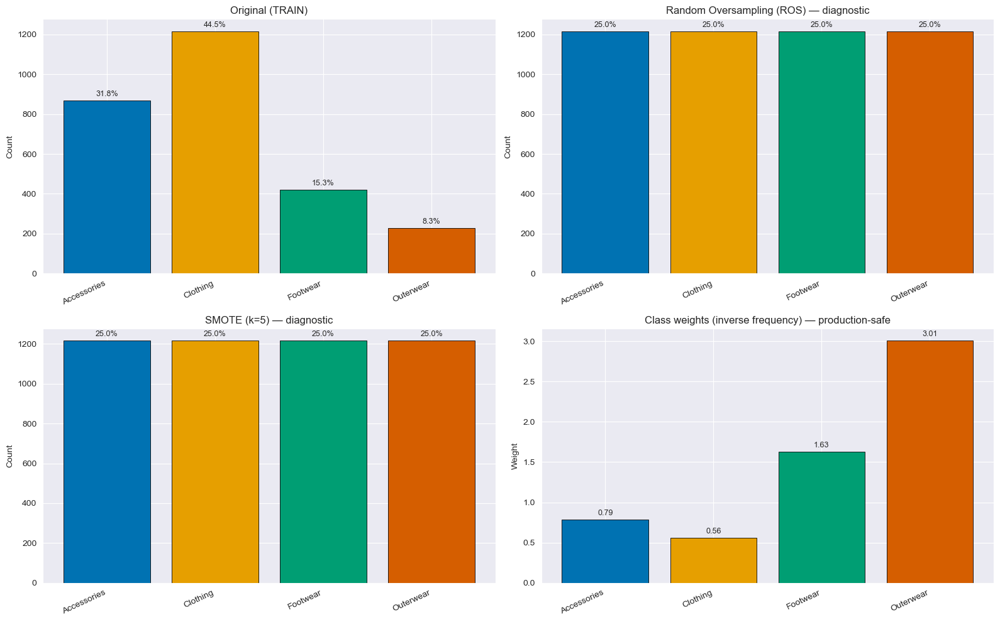

In [4]:
# =============================================================================
# STAGE 4: CLASS IMBALANCE - DIAGNOSTICS & VISUALISATIONS (TRAIN ONLY)
# CRISP-DM Phase: Data Preparation → Modelling readiness check
# =============================================================================
# Business / stakeholder explanation:
# When some categories are much more common than others, a model can “look accurate”
# simply by predicting the most frequent class (e.g., Clothing) most of the time.
#
# This stage does NOT train models. It exists to:
# 1) Quantify imbalance on TRAIN (what the model learns from)
# 2) Demonstrate what balancing methods *would do* (ROS / SMOTE) as diagnostics
# 3) Compute class weights (a common production-safe approach)
#
# Why TRAIN ONLY?
# Because VAL/TEST represent “future unseen customers”. If we used them to guide
# sampling/encoding decisions, we would be leaking future information into training.
# =============================================================================

import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline as SkPipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer

from imblearn.over_sampling import RandomOverSampler, SMOTE


# -----------------------------------------------------------------------------
# 0) Consistent colours (single source of truth)
# -----------------------------------------------------------------------------
# Business reason: consistent colouring helps stakeholders compare plots quickly.
CLASS_COLOR_MAP = {
    "Accessories": "#0072B2",  # blue
    "Clothing":    "#E69F00",  # orange
    "Footwear":    "#009E73",  # green
    "Outerwear":   "#D55E00",  # vermillion
}

def _colors_for_classes(classes):
    """Return class colours aligned to the class order used in encoding."""
    fallback = sns.color_palette("tab10", n_colors=len(classes))
    return [CLASS_COLOR_MAP.get(cls, fallback[i]) for i, cls in enumerate(classes)]


# -----------------------------------------------------------------------------
# 1) Core helpers
# -----------------------------------------------------------------------------
def _counts_and_perc(y, class_index_order):
    """
    Return counts and percentages aligned to integer label order.
    y is assumed to be encoded as 0..K-1.
    """
    counts = Counter(y)
    cnts = np.array([counts.get(k, 0) for k in class_index_order])
    percs = cnts / max(cnts.sum(), 1) * 100.0
    return cnts, percs


def _safe_smote_k(y_encoded, base_k=5):
    """
    Choose a valid SMOTE k_neighbors based on smallest class size.
    SMOTE requires at least 2 samples in the smallest class.
    """
    min_class_count = min(Counter(y_encoded).values())
    if min_class_count < 2:
        return None, False
    k = max(1, min(base_k, min_class_count - 1))
    return k, True


def _ensure_preprocessor(outputs):
    """
    Ensure outputs contains an unfitted preprocessor.
    If missing, we build one from TRAIN feature dtypes.
    This is ONLY used to create a numeric matrix required by SMOTE (diagnostic).
    """
    if "preprocessor_default" in outputs:
        # Stage 3 (recommended) naming
        return outputs["preprocessor_default"]

    if "preprocessor" in outputs:
        # Backward compatible naming (your older code)
        return outputs["preprocessor"]

    # If no preprocessor exists, infer from X_train dtypes
    Xtr = outputs["X_train"]
    num_cols = list(Xtr.select_dtypes(include=[np.number]).columns)
    cat_cols = [c for c in Xtr.columns if c not in num_cols]

    num_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler",  StandardScaler(with_mean=False)),
    ])
    cat_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe",     OneHotEncoder(handle_unknown="ignore")),
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", num_pipe, num_cols),
            ("cat", cat_pipe, cat_cols),
        ],
        remainder="drop"
    )

    print(f"[Stage 4] Built diagnostic preprocessor from TRAIN dtypes "
          f"(num={len(num_cols)}, cat={len(cat_cols)}).")
    return preprocessor


def _plot_distribution(ax, y, classes, title):
    """Bar chart with counts and % labels."""
    order = list(range(len(classes)))
    counts, percs = _counts_and_perc(y, order)
    colors = _colors_for_classes(classes)

    bars = ax.bar(order, counts, color=colors, edgecolor="black", linewidth=0.6)
    ax.set_xticks(order)
    ax.set_xticklabels(classes, rotation=25, ha="right")
    ax.set_ylabel("Count")
    ax.set_title(title)

    for rect, pct in zip(bars, percs):
        ax.annotate(
            f"{pct:.1f}%",
            xy=(rect.get_x() + rect.get_width()/2, rect.get_height()),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=9
        )


# -----------------------------------------------------------------------------
# 2) Main function (single professional entry point)
# -----------------------------------------------------------------------------
def stage4_imbalance_diagnostics_train_only(
    outputs,
    base_k_smote=5,
    random_state=42,
    figsize=(16, 10),
    seaborn_style="darkgrid",
    save=False,
    save_basepath="figures/stage4_imbalance_diagnostics",
    save_tables=False,
    tables_dir="tables"
):
    """
    Creates a 2×2 dashboard on TRAIN only:
      (1) Original TRAIN distribution
      (2) After Random Oversampling (ROS) — diagnostic
      (3) After SMOTE — diagnostic (fallbacks safely if invalid)
      (4) Class weights — production-safe imbalance handling approach

    Returns:
      Summary artefacts (tables + weights). DOES NOT return resampled X.
    """
    # ---- Guardrails: enforce train-only usage
    required = {"X_train", "y_train", "classes"}
    missing = required.difference(outputs.keys())
    if missing:
        raise KeyError(f"Stage 4 requires outputs keys: {required}. Missing: {missing}")

    sns.set_style(seaborn_style)

    X_train = outputs["X_train"]
    y_train = outputs["y_train"]
    classes = list(outputs["classes"])
    K = len(classes)

    # ---- Diagnostic encoding: needed only because SMOTE works in numeric feature space
    # Fit on TRAIN only to avoid leakage.
    preprocessor = _ensure_preprocessor(outputs)
    preproc = clone(preprocessor)
    X_train_enc = preproc.fit_transform(X_train)

    # SMOTE needs dense arrays; OneHotEncoder typically returns sparse
    X_train_dense = X_train_enc.toarray() if hasattr(X_train_enc, "toarray") else np.asarray(X_train_enc)

    # ---- Resampling (diagnostics ONLY)
    ros = RandomOverSampler(random_state=random_state)
    _, y_ros = ros.fit_resample(X_train_dense, y_train)

    smote_k, can_smote = _safe_smote_k(y_train, base_k=base_k_smote)
    smote_used = False

    if can_smote:
        try:
            sm = SMOTE(random_state=random_state, k_neighbors=smote_k)
            _, y_smote = sm.fit_resample(X_train_dense, y_train)
            smote_used = True
        except Exception as e:
            print(f"[Stage 4] SMOTE failed ({e}). Using ROS distribution as fallback.")
            y_smote = y_ros
            smote_k = None
    else:
        print("[Stage 4] SMOTE skipped: smallest class has < 2 samples on TRAIN.")
        y_smote = y_ros
        smote_k = None

    # ---- Class weights (inverse frequency) — common production approach
    cnts = Counter(y_train)
    total = sum(cnts.values())
    class_w_index = {lbl: total / (K * cnts[lbl]) for lbl in range(K)}
    class_w_named = {classes[i]: class_w_index[i] for i in range(K)}

    # ---- Build tidy count tables (useful for appendix + README)
    def _counts_table(y_arr):
        order = list(range(K))
        c, p = _counts_and_perc(y_arr, order)
        return pd.DataFrame({"Class": classes, "Count": c, "Percent": np.round(p, 2)})

    tbl_orig  = _counts_table(y_train)
    tbl_ros   = _counts_table(y_ros)
    tbl_smote = _counts_table(y_smote)

    print("\n[TRAIN distribution]")
    print(tbl_orig.to_string(index=False))
    print("\n[After ROS — diagnostic]")
    print(tbl_ros.to_string(index=False))
    print(f"\n[After SMOTE — {'k='+str(smote_k) if smote_used and smote_k else 'fallback'}]")
    print(tbl_smote.to_string(index=False))

    print("\n[Class weights (inverse frequency) — production-safe alternative]")
    print(pd.DataFrame({"Class": classes, "Weight": [class_w_named[c] for c in classes]}).to_string(index=False))

    # ---- Optional: save tables
    if save_tables:
        os.makedirs(tables_dir, exist_ok=True)
        tbl_orig.to_csv(os.path.join(tables_dir, "stage4_counts_train_original.csv"), index=False)
        tbl_ros.to_csv(os.path.join(tables_dir, "stage4_counts_train_ros.csv"), index=False)
        tbl_smote.to_csv(os.path.join(tables_dir, "stage4_counts_train_smote.csv"), index=False)

    # ---- Dashboard
    fig, axes = plt.subplots(2, 2, figsize=figsize)

    _plot_distribution(axes[0, 0], y_train, classes, "Original (TRAIN)")
    _plot_distribution(axes[0, 1], y_ros,   classes, "Random Oversampling (ROS) — diagnostic")

    title_smote = "SMOTE" + (f" (k={smote_k})" if smote_used and smote_k else " (fallback)")
    _plot_distribution(axes[1, 0], y_smote, classes, title_smote + " — diagnostic")

    # Class weights panel
    ax_w = axes[1, 1]
    colors = _colors_for_classes(classes)
    weights = [class_w_named[c] for c in classes]
    bars = ax_w.bar(range(K), weights, color=colors, edgecolor="black", linewidth=0.6)
    ax_w.set_xticks(range(K))
    ax_w.set_xticklabels(classes, rotation=25, ha="right")
    ax_w.set_ylabel("Weight")
    ax_w.set_title("Class weights (inverse frequency) — production-safe")

    for r, w in zip(bars, weights):
        ax_w.annotate(f"{w:.2f}",
                      xy=(r.get_x()+r.get_width()/2, r.get_height()),
                      xytext=(0, 3), textcoords="offset points",
                      ha="center", va="bottom", fontsize=9)

    plt.tight_layout()

    if save:
        os.makedirs(os.path.dirname(save_basepath), exist_ok=True)
        plt.savefig(save_basepath + ".png", dpi=300, bbox_inches="tight")
        plt.savefig(save_basepath + ".pdf", bbox_inches="tight")

    plt.show()

    return {
        "counts_original": tbl_orig,
        "counts_ros": tbl_ros,
        "counts_smote": tbl_smote,
        "class_weights_index": class_w_index,
        "class_weights_named": class_w_named,
        "smote_used": smote_used,
        "smote_k": smote_k,
    }


# =============================================================================
# HOW TO RUN (TRAIN ONLY)
# =============================================================================
diagnostics = stage4_imbalance_diagnostics_train_only(
    outputs,
    base_k_smote=5,
    random_state=42,
    figsize=(16, 10),
    seaborn_style="darkgrid",
    save=True,
    save_basepath="figures/stage4_imbalance_diagnostics",
    save_tables=True,
    tables_dir="tables"
)

### STAGE 5: MODEL DEVELOPMENT AND EVALUATION

[Stage 5] Built preprocessor (num=5, cat=19).
[Stage 5] Baseline complete.


,Model,Metric,CV_mean,CV_std
0,Baseline (Most Frequent),accuracy,0.445421,0.000733
1,Baseline (Most Frequent),precision_macro,0.111355,0.000183
2,Baseline (Most Frequent),recall_macro,0.250000,0.000000
3,Baseline (Most Frequent),f1_macro,0.154080,0.000175
4,Baseline (Most Frequent),f1_weighted,0.274523,0.000764


[Stage 5] Model specs ready: Decision Tree, Random Forest, Logistic Regression, XGBoost, LightGBM

[Stage 5] Nested CV: Decision Tree

[Stage 5] Nested CV: Random Forest

[Stage 5] Nested CV: Logistic Regression

[Stage 5] Nested CV: XGBoost

[Stage 5] Nested CV: LightGBM

[Stage 5] Nested CV complete in 3358.8s.


,Model,Metric,CV_mean,CV_std
5,Decision Tree,accuracy,0.734432,0.014924
10,Random Forest,accuracy,0.732967,0.009924
20,XGBoost,accuracy,0.720147,0.013074
15,Logistic Regression,accuracy,0.714286,0.016585
25,LightGBM,accuracy,0.693773,0.014347
0,Baseline (Most Frequent),accuracy,0.445421,0.000733
8,Decision Tree,f1_macro,0.662914,0.028271
13,Random Forest,f1_macro,0.662911,0.023187
23,XGBoost,f1_macro,0.656152,0.025625
18,Logistic Regression,f1_macro,0.654165,0.033461


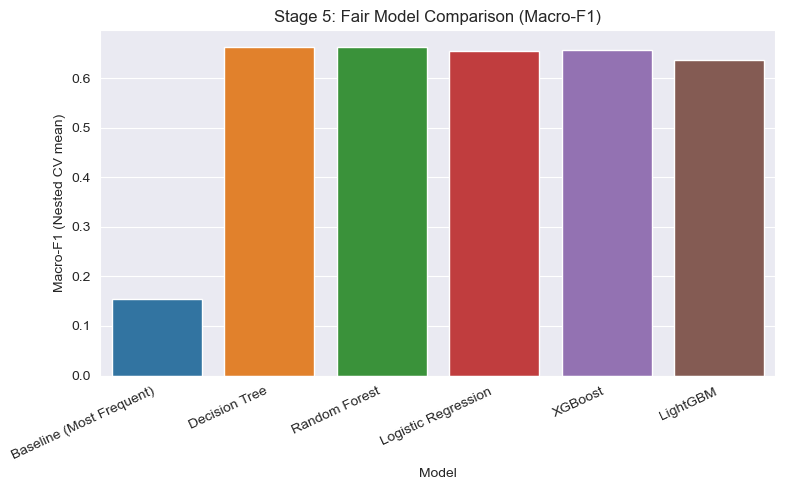

[Stage 5] Best model by nested macro-F1: Decision Tree
[Stage 5] Best params (trained on full TRAIN using inner CV):
{'balance': 'passthrough', 'clf__class_weight': None, 'clf__max_depth': 10, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2}


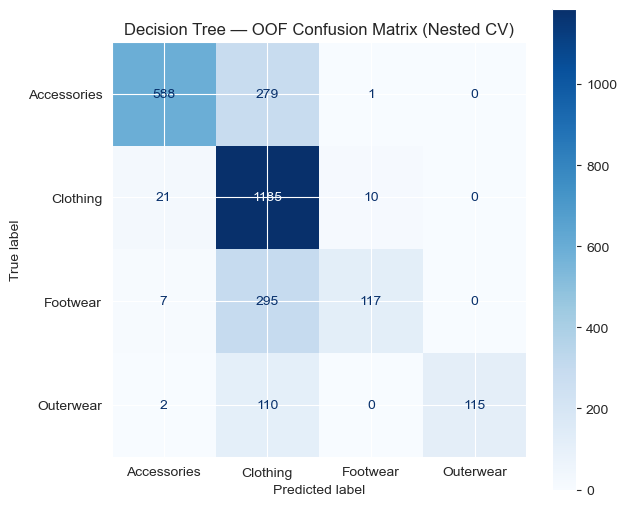

[Stage 5] OOF diagnostics saved for: Decision Tree


,label,precision,recall,f1-score,support
0,Accessories,0.951456,0.677419,0.791386,868.000000
1,Clothing,0.634029,0.974507,0.768233,1216.000000
2,Footwear,0.914062,0.279236,0.427788,419.000000
3,Outerwear,1.000000,0.506608,0.672515,227.000000
4,accuracy,0.734432,0.734432,0.734432,0.734432
5,macro avg,0.874887,0.609443,0.664981,2730.000000
6,weighted avg,0.808365,0.734432,0.715384,2730.000000


[Stage 5] Quick test saved: tables/stage5_test_quick_check.csv


,Model,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted
0,Quick test (best tuned pipeline),0.702564,0.891187,0.556401,0.61509,0.679839



[Stage 5] COMPLETE
Saved artefacts:
  - tables/stage5_baseline_cv.csv
  - tables/stage5_nested_cv_summary.csv
  - tables/stage5_best_params_from_full_train.json
  - figures/stage5_nested_cv_macroF1.png
  - tables/stage5_oof_report_Decision_Tree.csv
  - figures/stage5_oof_confusion_Decision_Tree.png
  - tables/stage5_test_quick_check.csv  (optional sanity check)


In [5]:
# ======================================================================
# STAGE 5: MODEL DEVELOPMENT & EVALUATION
# CRISP-DM: Modelling + Evaluation
# ----------------------------------------------------------------------
# Business / research
#   We are building and comparing multiple machine learning models that
#   predict a customer’s product Category (Accessories / Clothing / Footwear /
#   Outerwear) using demographic + behavioural features created in Stage 3.
#
#   This stage answers:
#     • “Which modelling approach performs best overall?” (fair comparison)
#     • “How well does it perform for EACH category, not just the majority one?”
#     • “Do imbalance treatments (e.g., oversampling) help minority categories?”
#
# Key integrity rule (very important)
#   All preprocessing and any resampling must happen INSIDE cross-validation,
#   so validation folds never “see” statistics learned from their own labels.
#   This prevents information leakage and makes results trustworthy.
#
# Outputs created (for your report + appendix)
#   tables/stage5_baseline_cv.csv
#   tables/stage5_nested_cv_summary.csv
#   tables/stage5_best_params_from_full_train.json
#   figures/stage5_nested_cv_macroF1.png
#   figures/stage5_oof_confusion_<MODEL>.png
#   tables/stage5_oof_report_<MODEL>.csv
#   tables/stage5_test_quick_check.csv   (optional sanity check; not final)
# ======================================================================

# -----------------------------
# 0) Imports
# -----------------------------
import os
import json
import time
import warnings
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# sklearn core
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline as SkPipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, FunctionTransformer
from sklearn.impute import SimpleImputer

# CV / tuning
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_validate, cross_val_predict

# Models
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Metrics / reports
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# Imbalanced-learn (resampling must be inside the pipeline)
from imblearn.pipeline import Pipeline  # NOTE: imblearn Pipeline supports samplers
from imblearn.over_sampling import RandomOverSampler, SMOTE

# Optional boosters (only if installed in your environment)
try:
    from xgboost import XGBClassifier
    HAS_XGB = True
except Exception:
    HAS_XGB = False

try:
    from lightgbm import LGBMClassifier
    HAS_LGBM = True
except Exception:
    HAS_LGBM = False


# -----------------------------
# 1) Basic setup & artefact checks
# -----------------------------
assert "outputs" in globals(), "Run Stage 3 first to create the `outputs` dict."

# Primary training/test splits (created in Stage 3)
X_train = outputs["X_train"]   # DataFrame of predictors
X_val   = outputs["X_val"]
X_test  = outputs["X_test"]

y_train = outputs["y_train"]   # encoded target integers (0..K-1)
y_val   = outputs["y_val"]
y_test  = outputs["y_test"]

classes = list(outputs["classes"])  # class names aligned to encoded order

# Where we save artefacts used by your dissertation (tables/figures)
os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

RANDOM_STATE = 42


# -----------------------------
# 2) Ensure a leakage-safe preprocessor exists
# -----------------------------
def ensure_preprocessor(outputs_dict: dict) -> ColumnTransformer:
    """
    Why this exists (non-technical)
      Different notebook runs can sometimes miss a saved object. This function
      makes sure we always have a standard, repeatable preprocessing step:
        • numeric fields: fill missing values + scale magnitudes
        • categorical fields: fill missing values + one-hot encode categories
      This ensures all models receive consistent inputs.
    """
    if "preprocessor" in outputs_dict and outputs_dict["preprocessor"] is not None:
        return outputs_dict["preprocessor"]

    Xtr = outputs_dict["X_train"]
    num_cols = list(Xtr.select_dtypes(include=[np.number]).columns)
    cat_cols = [c for c in Xtr.columns if c not in num_cols]

    num_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler",  StandardScaler(with_mean=False)),  # with_mean=False keeps sparse matrices feasible
    ])

    cat_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe",     OneHotEncoder(handle_unknown="ignore")),
    ])

    preproc = ColumnTransformer(
        transformers=[("num", num_pipe, num_cols), ("cat", cat_pipe, cat_cols)],
        remainder="drop"
    )

    outputs_dict["preprocessor"] = preproc
    outputs_dict["numeric_features"] = num_cols
    outputs_dict["categorical_features"] = cat_cols
    print(f"[Stage 5] Built preprocessor (num={len(num_cols)}, cat={len(cat_cols)}).")
    return preproc


preprocessor = ensure_preprocessor(outputs)


# -----------------------------
# 3) Define evaluation rules (CV + metrics)
# -----------------------------
# Why macro metrics?
#   In imbalanced problems, “overall accuracy” can look good even if we fail
#   minority classes (e.g., Outerwear). Macro-F1 and macro-recall weight each
#   category equally, matching a “fair across categories” business goal.
SCORERS = {
    "accuracy": "accuracy",
    "precision_macro": "precision_macro",
    "recall_macro": "recall_macro",
    "f1_macro": "f1_macro",
    "f1_weighted": "f1_weighted",
}

# Nested CV:
#   Outer CV = fair performance estimate (evaluation)
#   Inner CV = selects best hyperparameters (tuning)
cv_outer = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
cv_inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)


# -----------------------------
# 4) Imbalance strategies (inside pipeline only)
# -----------------------------
ROS_STEP = RandomOverSampler(random_state=RANDOM_STATE)
SMOTE_STEP = SMOTE(random_state=RANDOM_STATE)

# SMOTE cannot operate on sparse matrices produced by OneHotEncoder.
# We therefore convert sparse -> dense ONLY when SMOTE is chosen.
TO_DENSE = FunctionTransformer(
    func=lambda X: X.toarray() if hasattr(X, "toarray") else X,
    accept_sparse=True,
    validate=False
)

SMOTE_PIPE = Pipeline(steps=[
    ("to_dense", TO_DENSE),
    ("smote", SMOTE_STEP)
])


def suggested_class_weights_int(y_enc: np.ndarray) -> dict:
    """
    Inverse-frequency weights:
      weight_c = N / (K * count_c)
    Business meaning:
      “Penalise mistakes on rare categories more heavily” so the model
      isn’t rewarded for ignoring minority classes.
    """
    vals, cnts = np.unique(y_enc, return_counts=True)
    total, K = cnts.sum(), len(vals)
    return {int(v): float(total / (K * c)) for v, c in zip(vals, cnts)}


class_weights_int = outputs.get("class_weights_int") or suggested_class_weights_int(y_train)
outputs["class_weights_int"] = class_weights_int


# -----------------------------
# 5) Baseline model (majority class)
# -----------------------------
def run_baseline_cv():
    """
    Baseline is a “do-nothing smart guess”: always predict the most common category.
    Why it matters:
      This sets a minimum bar—any real model should beat it meaningfully, especially
      on macro-F1 / macro-recall.
    """
    baseline_pipe = Pipeline(steps=[
        ("prep", preprocessor),
        ("clf", DummyClassifier(strategy="most_frequent"))
    ])
    cv_out = cross_validate(
        baseline_pipe, X_train, y_train,
        cv=cv_outer,  # use outer CV for fair baseline estimate
        scoring=SCORERS,
        n_jobs=-1,
        return_train_score=False
    )

    summary = pd.DataFrame({
        "Model":  "Baseline (Most Frequent)",
        "Metric": list(SCORERS.keys()),
        "CV_mean": [cv_out[f"test_{m}"].mean() for m in SCORERS],
        "CV_std":  [cv_out[f"test_{m}"].std()  for m in SCORERS],
    })
    summary.to_csv("tables/stage5_baseline_cv.csv", index=False)
    return summary


baseline_summary = run_baseline_cv()
print("[Stage 5] Baseline complete.")
display(baseline_summary)


# -----------------------------
# 6) Model specifications (estimators + compact grids)
# -----------------------------
def model_specs_smoke(num_classes: int, cw_int: dict):
    """
    We keep grids intentionally compact for practicality and reproducibility.
    Business meaning:
      We are not “brute forcing everything”; we are exploring sensible ranges that
      usually work well for customer classification problems.
    """
    specs = {
        "Decision Tree": {
            "estimator": DecisionTreeClassifier(random_state=RANDOM_STATE),
            "grid": {
                "balance": ["passthrough", ROS_STEP, SMOTE_PIPE],
                "clf__max_depth": [None, 10],
                "clf__min_samples_split": [2, 10],
                "clf__min_samples_leaf": [1, 5],
                "clf__class_weight": [None, "balanced"],
            }
        },

        "Random Forest": {
            "estimator": RandomForestClassifier(
                n_estimators=600,
                random_state=RANDOM_STATE,
                n_jobs=-1
            ),
            "grid": {
                "balance": ["passthrough", ROS_STEP],
                "clf__max_depth": [None, 20],
                "clf__min_samples_split": [2, 10],
                "clf__min_samples_leaf": [1, 5],
                "clf__class_weight": [None, "balanced", "balanced_subsample"],
            }
        },

        "Logistic Regression": {
            "estimator": LogisticRegression(
                multi_class="multinomial",
                solver="saga",        # handles sparse one-hot + multinomial
                max_iter=2000,
                random_state=RANDOM_STATE
            ),
            "grid": {
                "balance": ["passthrough", ROS_STEP, SMOTE_PIPE],
                "clf__C": [0.5, 1.0, 2.0],
                "clf__penalty": ["l2"],
                "clf__class_weight": [None, "balanced"],
            }
        }
    }

    if HAS_XGB:
        specs["XGBoost"] = {
            "estimator": XGBClassifier(
                objective="multi:softprob",
                num_class=num_classes,
                eval_metric="mlogloss",
                tree_method="hist",
                n_jobs=-1,
                random_state=RANDOM_STATE,
                use_label_encoder=False
            ),
            "grid": {
                "balance": ["passthrough", ROS_STEP],
                "clf__n_estimators": [300, 600],
                "clf__max_depth": [4, 6],
                "clf__learning_rate": [0.05, 0.1],
                "clf__subsample": [0.8, 1.0],
                "clf__colsample_bytree": [0.8, 1.0],
            }
        }

    if HAS_LGBM:
        specs["LightGBM"] = {
            "estimator": LGBMClassifier(
                objective="multiclass",
                num_class=num_classes,
                n_jobs=-1,
                random_state=RANDOM_STATE,
                metric="multi_logloss",
                verbosity=-1
            ),
            "grid": {
                "balance": ["passthrough", ROS_STEP],
                "clf__n_estimators": [400, 800],
                "clf__num_leaves": [31, 63],
                "clf__learning_rate": [0.05, 0.1],
                "clf__min_child_samples": [20, 40],
                "clf__class_weight": [None, cw_int],
            }
        }

    return specs


specs = model_specs_smoke(num_classes=len(classes), cw_int=class_weights_int)
print("[Stage 5] Model specs ready:", ", ".join(specs.keys()))


# -----------------------------
# 7) Nested CV evaluation (fair comparison)
# -----------------------------
def nested_cv_evaluate_model(model_name: str, estimator, param_grid: dict) -> pd.DataFrame:
    """
    Why nested CV (non-technical)
      If we tune a model and then report performance on the same cross-validation
      folds, results can look better than reality. Nested CV avoids that:
        • Inner CV finds the best settings.
        • Outer CV evaluates the “tune + train” process on unseen folds.
      This is the fairest way to compare models before choosing one.
    """
    pipe = Pipeline(steps=[
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", estimator),
    ])

    gs = GridSearchCV(
        estimator=pipe,
        param_grid=param_grid,
        scoring="f1_macro",   # selection metric: equal importance across categories
        cv=cv_inner,
        n_jobs=-1,
        refit=True,
        return_train_score=False
    )

    cv_out = cross_validate(
        gs,
        X_train, y_train,
        cv=cv_outer,
        scoring=SCORERS,
        n_jobs=-1,
        return_train_score=False
    )

    return pd.DataFrame({
        "Model": model_name,
        "Metric": list(SCORERS.keys()),
        "CV_mean": [cv_out[f"test_{m}"].mean() for m in SCORERS],
        "CV_std":  [cv_out[f"test_{m}"].std()  for m in SCORERS],
    })


all_rows = [baseline_summary]
t0 = time.time()

for name, cfg in specs.items():
    print(f"\n[Stage 5] Nested CV: {name}")
    rows = nested_cv_evaluate_model(name, cfg["estimator"], cfg["grid"])
    all_rows.append(rows)

nested_summary = pd.concat(all_rows, ignore_index=True)
nested_summary.to_csv("tables/stage5_nested_cv_summary.csv", index=False)

print(f"\n[Stage 5] Nested CV complete in {time.time()-t0:.1f}s.")
display(nested_summary.sort_values(["Metric", "CV_mean"], ascending=[True, False]))


# -----------------------------
# 8) Simple visual: macro-F1 comparison
# -----------------------------
macro = nested_summary[nested_summary["Metric"] == "f1_macro"].copy()
plt.figure(figsize=(8, 5))
sns.barplot(data=macro, x="Model", y="CV_mean")
plt.xticks(rotation=25, ha="right")
plt.ylabel("Macro-F1 (Nested CV mean)")
plt.title("Stage 5: Fair Model Comparison (Macro-F1)")
plt.tight_layout()
plt.savefig("figures/stage5_nested_cv_macroF1.png", dpi=200)
plt.show()


# -----------------------------
# 9) Pick a candidate model (rule-based, transparent)
# -----------------------------
def pick_best_model(nested_df: pd.DataFrame, primary_metric="f1_macro") -> str:
    """
    Business-friendly selection logic:
      Choose the model with the highest MEAN on a fairness-focused metric.
      (You can also add “stability” by penalising high std.)
    """
    d = nested_df[nested_df["Metric"] == primary_metric].copy()
    d = d.sort_values("CV_mean", ascending=False)
    return d.iloc[0]["Model"]

best_model_name = pick_best_model(nested_summary, primary_metric="f1_macro")
print("[Stage 5] Best model by nested macro-F1:", best_model_name)


# -----------------------------
# 10) Fit best model on FULL TRAIN (for interpretability + downstream stages)
# -----------------------------
def fit_best_model_on_full_train(model_name: str):
    """
    We now train on all available TRAIN data (still excluding TEST)
    so we can:
      • extract a robust “final tuned model”,
      • produce clean diagnostics (OOF confusion),
      • hand this model to Stage 6 (formal test evaluation).
    """
    cfg = specs[model_name]
    pipe = Pipeline(steps=[
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", cfg["estimator"]),
    ])

    gs = GridSearchCV(
        estimator=pipe,
        param_grid=cfg["grid"],
        scoring="f1_macro",
        cv=cv_inner,
        n_jobs=-1,
        refit=True,
        return_train_score=False
    )
    gs.fit(X_train, y_train)
    return gs

best_search = fit_best_model_on_full_train(best_model_name)
best_pipe = best_search.best_estimator_
best_params = best_search.best_params_

with open("tables/stage5_best_params_from_full_train.json", "w") as f:
    json.dump({best_model_name: best_params}, f, indent=2)

print("[Stage 5] Best params (trained on full TRAIN using inner CV):")
print(best_params)


# -----------------------------
# 11) Unbiased training-set diagnostics (OOF confusion + per-class report)
# -----------------------------
def oof_diagnostics_nested(model_name: str):
    """
    Why out-of-fold (OOF) diagnostics?
      OOF predictions simulate “how the model behaves on unseen data”
      while still using TRAIN only. Each row is predicted by a model that
      did not train on that row, producing a more honest confusion matrix.
    """
    cfg = specs[model_name]
    base_pipe = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", cfg["estimator"]),
    ])

    # Nested estimator for OOF:
    # outer CV controls which samples are “held out” for prediction,
    # inner CV tunes hyperparameters in each outer training fold.
    nested_estimator = GridSearchCV(
        base_pipe,
        cfg["grid"],
        scoring="f1_macro",
        cv=cv_inner,
        n_jobs=-1,
        refit=True
    )

    y_oof = cross_val_predict(nested_estimator, X_train, y_train, cv=cv_outer, n_jobs=-1)

    # Classification report (per class precision/recall/F1)
    rep = classification_report(y_train, y_oof, target_names=classes, digits=3, output_dict=True)
    rep_df = pd.DataFrame(rep).T.reset_index().rename(columns={"index": "label"})
    rep_df.to_csv(f"tables/stage5_oof_report_{model_name.replace(' ', '_')}.csv", index=False)

    # Confusion matrix
    cm = confusion_matrix(y_train, y_oof, labels=range(len(classes)))
    disp = ConfusionMatrixDisplay(cm, display_labels=classes)
    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    disp.plot(ax=ax, cmap="Blues", values_format="d")
    plt.title(f"{model_name} — OOF Confusion Matrix (Nested CV)")
    plt.tight_layout()
    plt.savefig(f"figures/stage5_oof_confusion_{model_name.replace(' ', '_')}.png", dpi=200)
    plt.show()

    print("[Stage 5] OOF diagnostics saved for:", model_name)
    return rep_df

oof_report_df = oof_diagnostics_nested(best_model_name)
display(oof_report_df.head(12))


# -----------------------------
# 12) Optional: quick TEST sanity check (not the formal evaluation)
# -----------------------------
def quick_test_check(pipe):
    """
    This is a quick “smell test” only.
    Formal test evaluation + final reporting belongs in Stage 6.
    """
    pipe.fit(X_train, y_train)
    pred = pipe.predict(X_test)

    row = {
        "Model": "Quick test (best tuned pipeline)",
        "accuracy": accuracy_score(y_test, pred),
        "precision_macro": precision_score(y_test, pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_test, pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_test, pred, average="macro", zero_division=0),
        "f1_weighted": f1_score(y_test, pred, average="weighted", zero_division=0),
    }
    df = pd.DataFrame([row])
    df.to_csv("tables/stage5_test_quick_check.csv", index=False)
    return df

quick_test_df = quick_test_check(best_pipe)
print("[Stage 5] Quick test saved: tables/stage5_test_quick_check.csv")
display(quick_test_df)


# ======================================================================
# End of Stage 5
# ======================================================================
print("\n[Stage 5] COMPLETE")
print("Saved artefacts:")
print("  - tables/stage5_baseline_cv.csv")
print("  - tables/stage5_nested_cv_summary.csv")
print("  - tables/stage5_best_params_from_full_train.json")
print("  - figures/stage5_nested_cv_macroF1.png")
print(f"  - tables/stage5_oof_report_{best_model_name.replace(' ', '_')}.csv")
print(f"  - figures/stage5_oof_confusion_{best_model_name.replace(' ', '_')}.png")
print("  - tables/stage5_test_quick_check.csv  (optional sanity check)")

### STAGE 6-Final evaluation with A/B feature sets


[A_with_Item] Tuning: Decision Tree
[A_with_Item] Decision Tree best CV macro-F1=0.660 (took 16.1s)

[A_with_Item] Tuning: Random Forest
[A_with_Item] Random Forest best CV macro-F1=0.671 (took 479.8s)

[A_with_Item] Tuning: Logistic Regression
[A_with_Item] Logistic Regression best CV macro-F1=0.654 (took 15.3s)

[A_with_Item] Tuning: XGBoost
[A_with_Item] XGBoost best CV macro-F1=0.660 (took 124.7s)

[A_with_Item] Tuning: LightGBM
[A_with_Item] LightGBM best CV macro-F1=0.650 (took 900.4s)

[A_with_Item] Champion selected by CV macro-F1: Random Forest


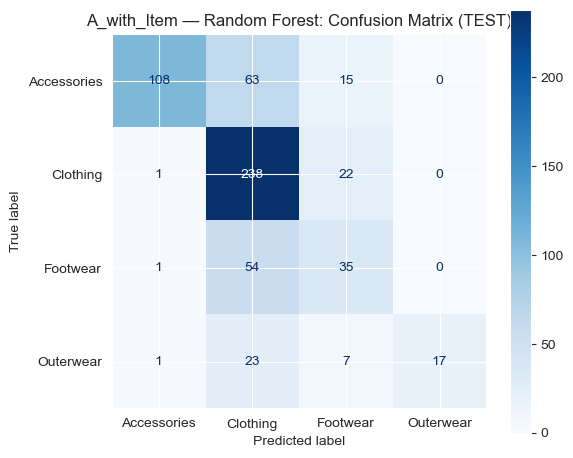

[Saved] figures/stage6_cm_A_with_Item.png


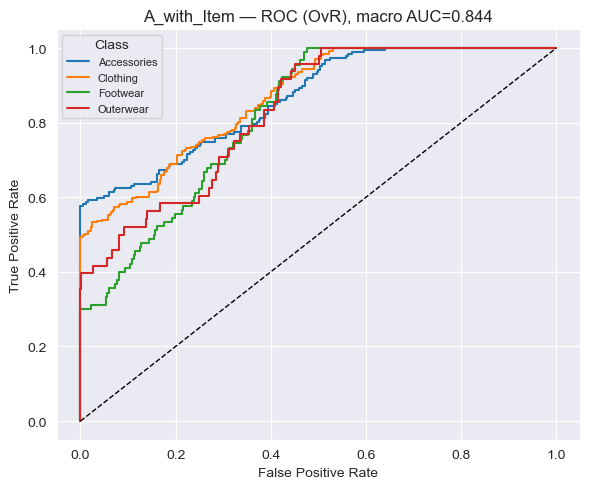

[Saved] figures/stage6_roc_A_with_Item.png


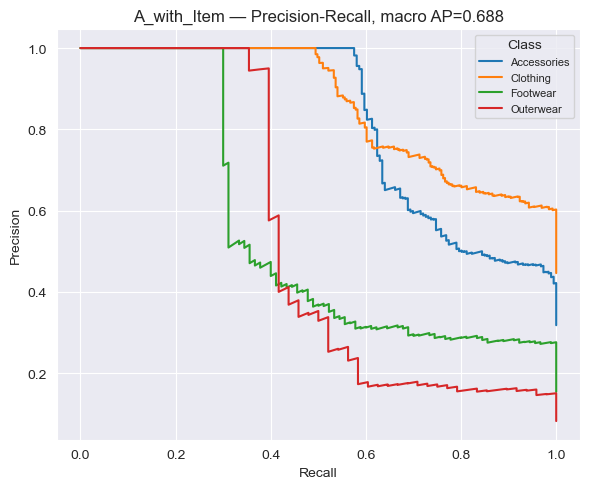

[Saved] figures/stage6_pr_A_with_Item.png

[A_with_Item] TEST classification report:
              precision    recall  f1-score   support

 Accessories      0.973     0.581     0.727       186
    Clothing      0.630     0.912     0.745       261
    Footwear      0.443     0.389     0.414        90
   Outerwear      1.000     0.354     0.523        48

    accuracy                          0.680       585
   macro avg      0.761     0.559     0.602       585
weighted avg      0.740     0.680     0.670       585

[Saved] tables/stage6_cv_A_with_Item.csv
[Saved] tables/stage6_per_fold_A_with_Item.csv
[Saved] tables/stage6_test_A_with_Item.csv
[Saved] tables/stage6_per_class_A_with_Item.csv
[Saved] tables/stage6_best_A_with_Item.json

[B_without_Item] Tuning: Decision Tree
[B_without_Item] Decision Tree best CV macro-F1=0.260 (took 16.9s)

[B_without_Item] Tuning: Random Forest
[B_without_Item] Random Forest best CV macro-F1=0.220 (took 587.9s)

[B_without_Item] Tuning: Logistic Regress

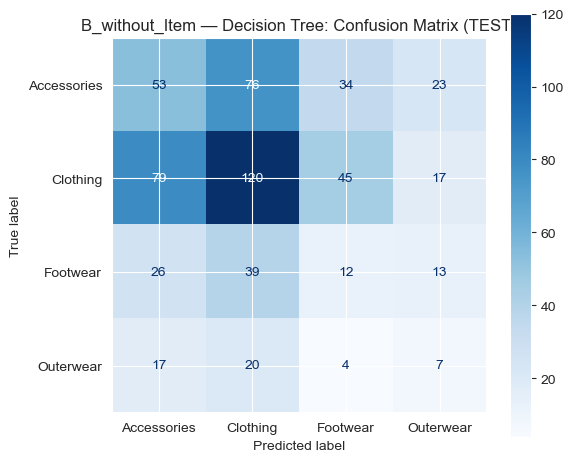

[Saved] figures/stage6_cm_B_without_Item.png


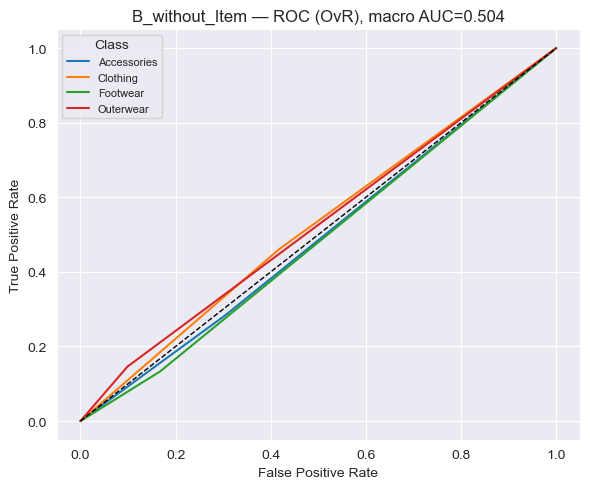

[Saved] figures/stage6_roc_B_without_Item.png


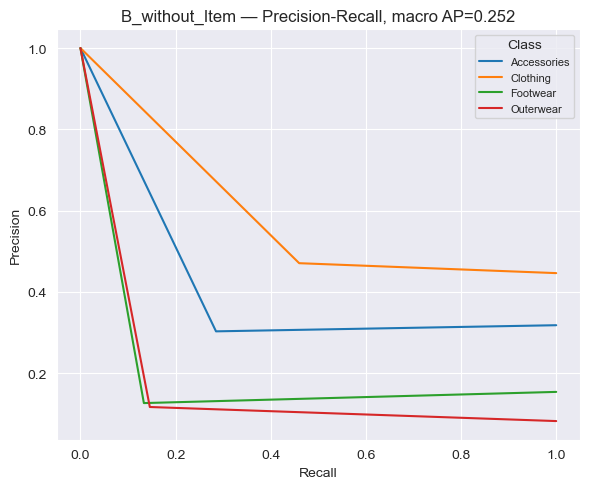

[Saved] figures/stage6_pr_B_without_Item.png

[B_without_Item] TEST classification report:
              precision    recall  f1-score   support

 Accessories      0.303     0.285     0.294       186
    Clothing      0.471     0.460     0.465       261
    Footwear      0.126     0.133     0.130        90
   Outerwear      0.117     0.146     0.130        48

    accuracy                          0.328       585
   macro avg      0.254     0.256     0.255       585
weighted avg      0.335     0.328     0.331       585

[Saved] tables/stage6_cv_B_without_Item.csv
[Saved] tables/stage6_per_fold_B_without_Item.csv
[Saved] tables/stage6_test_B_without_Item.csv
[Saved] tables/stage6_per_class_B_without_Item.csv
[Saved] tables/stage6_best_B_without_Item.json
[Saved] tables/stage6_compare_test.csv

===== FINAL TEST COMPARISON (A vs B) =====
            FeatureSet ChampionModel  accuracy  precision_macro  recall_macro  f1_macro  f1_weighted
   WITH Item Purchased Random Forest  0.680342      

In [6]:
# ======================================================================
# STAGE 6 - FINAL MODEL EVALUATION (A/B FEATURE SETS)
# ======================================================================
# Note:
#   This code is written so a non-technical reader can follow the "why"
#   behind each step, while still being rigorous and reproducible.
#
# Business question:
#   Does including the feature "Item Purchased" materially improve the
#   model’s ability to classify product category outcomes fairly across
#   all classes (including minority classes)?
#
# Two feature sets (A/B) - SAME evaluation method for fairness:
#   A: WITH  "Item Purchased"
#   B: WITHOUT "Item Purchased"
#
# Method (kept identical across A and B):
#   1) Tune each candidate model using 5-fold Stratified Cross-Validation (TRAIN only)
#      - Model selection metric: macro-F1 (treats each class equally)
#   2) For each model, report CV mean±std across multiple metrics
#   3) Choose the best "champion" model by CV macro-F1
#   4) Refit the champion on TRAIN + VAL (more learning data, still no TEST)
#   5) Evaluate ONCE on TEST (final hold-out, represents real-world performance)
#
# Leakage prevention (critical for trust):
#   - Preprocessing is re-fit inside each CV fold.
#   - Any resampling (ROS) happens inside the pipeline per fold.
#   - TEST is never used for tuning or decision-making.
#
# Outputs saved (for reporting + Stage 7 statistics):
#   tables/stage6_cv_A_with_Item.csv
#   tables/stage6_cv_B_without_Item.csv
#   tables/stage6_best_A_with_Item.json
#   tables/stage6_best_B_without_Item.json
#   tables/stage6_test_A_with_Item.csv
#   tables/stage6_test_B_without_Item.csv
#   tables/stage6_compare_test.csv
#   tables/stage6_per_fold_all.csv         (per-fold metrics for significance tests)
#   tables/stage6_per_class_A_with_Item.csv
#   tables/stage6_per_class_B_without_Item.csv
#   figures/stage6_cm_A_with_Item.png
#   figures/stage6_cm_B_without_Item.png
#   (Optional, if probabilities are available)
#   figures/stage6_roc_<VAR>.png
#   figures/stage6_pr_<VAR>.png
# ======================================================================

# -----------------------------
# 0) Imports (standard + ML)
# -----------------------------
import os
import json
import time
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from joblib import Memory

from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_validate
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    roc_auc_score, roc_curve, precision_recall_curve, average_precision_score
)
from sklearn.preprocessing import label_binarize
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline as SkPipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Pipeline from imbalanced-learn allows resampling inside the pipeline
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler

# Candidate models (finalist set)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Boosters (comment out if not installed in your environment)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier


# -----------------------------
# 1) Safety checks + configuration
# -----------------------------
assert "outputs" in globals(), (
    "Stage 6 requires the Stage 3/4 `outputs` dict to exist. "
    "Run earlier stages first."
)

# Minimum keys required to run Stage 6 consistently
required_keys = [
    "X_train", "X_val", "X_test",
    "y_train", "y_val", "y_test",
    "numeric_features", "categorical_features",
    "classes"
]
missing = [k for k in required_keys if k not in outputs]
assert not missing, f"`outputs` is missing keys: {missing}"

RANDOM_STATE = 42

# Create output folders (idempotent)
os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)
os.makedirs("cache_stage6", exist_ok=True)

# Cache helps reduce repetitive preprocessing work during CV
# (It does not change the method — just speeds up repeated computations.)
memory = Memory("cache_stage6", verbose=0)

classes = list(outputs["classes"])
num_classes = len(classes)

# Cross-validation plan:
#   "Stratified" ensures each fold keeps similar class proportions.
#   This matters under class imbalance, to avoid misleading results.
cv5 = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

# Metrics panel:
#   Macro metrics treat each class equally (fairness-aware under imbalance).
SCORERS = {
    "accuracy": "accuracy",
    "precision_macro": "precision_macro",
    "recall_macro": "recall_macro",
    "f1_macro": "f1_macro",
    "f1_weighted": "f1_weighted",
}

# Class weights (optional):
#   Useful for LightGBM or other models that accept dict weights.
#   If not provided earlier, we compute inverse-frequency weights from TRAIN.
class_weights_int = outputs.get("class_weights_int", None)
if class_weights_int is None:
    ytr = outputs["y_train"]
    vals, cnts = np.unique(ytr, return_counts=True)
    total, K = cnts.sum(), len(vals)
    class_weights_int = {int(v): float(total / (K * c)) for v, c in zip(vals, cnts)}


# -----------------------------
# 2) Helper functions (reporting + plotting + JSON-safe saving)
# -----------------------------
def json_safe_params(params: dict) -> dict:
    """
    GridSearchCV best_params_ sometimes includes non-JSON objects
    (e.g., sampler instances). Convert those to readable strings so
    we can store them safely for audit/reporting.
    """
    safe = {}
    for k, v in params.items():
        try:
            json.dumps(v)
            safe[k] = v
        except TypeError:
            safe[k] = v.__class__.__name__
    return safe


def save_csv(df: pd.DataFrame, path: str) -> None:
    """Save a CSV and print a short confirmation (useful in notebooks)."""
    df.to_csv(path, index=False)
    print(f"[Saved] {path}")


def plot_confusion_matrix(cm: np.ndarray, labels, title: str, path: str) -> None:
    """
    Confusion matrix = "where predictions went right/wrong".
    This is a stakeholder-friendly view of mistakes:
      - diagonal = correct predictions
      - off-diagonal = misclassifications (which classes get confused)
    """
    fig, ax = plt.subplots(figsize=(6, 5))
    ConfusionMatrixDisplay(cm, display_labels=labels).plot(
        ax=ax, cmap="Blues", values_format="d"
    )
    ax.set_title(title)
    plt.tight_layout()
    plt.savefig(path, dpi=200)
    plt.show()
    print(f"[Saved] {path}")


def per_class_tn_fp_fn_tp(cm: np.ndarray, labels) -> pd.DataFrame:
    """
    Convert a multiclass confusion matrix into one-vs-rest summary per class:
      TN / FP / FN / TP and precision/recall/F1 per class.

    Why this matters:
      Macro metrics can hide which class is failing. This table makes
      minority-class performance visible and auditable.
    """
    total = int(cm.sum())
    rows = []
    for i, lab in enumerate(labels):
        TP = int(cm[i, i])
        FN = int(cm[i, :].sum() - TP)
        FP = int(cm[:, i].sum() - TP)
        TN = int(total - TP - FP - FN)

        precision = TP / (TP + FP) if (TP + FP) else 0.0
        recall = TP / (TP + FN) if (TP + FN) else 0.0
        f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) else 0.0

        rows.append({
            "Class": lab,
            "TN": TN, "FP": FP, "FN": FN, "TP": TP,
            "Precision": round(precision, 3),
            "Recall": round(recall, 3),
            "F1": round(f1, 3),
        })
    return pd.DataFrame(rows)


def plot_roc_pr_if_available(y_true_int: np.ndarray, y_score: np.ndarray, labels, tag: str):
    """
    Optional: ROC/PR curves if the model provides probabilities.
    Stakeholder meaning:
      - ROC shows trade-off between catching true positives vs false alarms.
      - PR is often more informative under imbalance.

    Returns:
      (macro_roc_auc, macro_average_precision)
      or (None, None) if probabilities are not available.
    """
    if y_score is None or y_score.ndim != 2:
        print(f"[Info] {tag}: No probabilities available → skip ROC/PR.")
        return None, None

    K = y_score.shape[1]
    Yb = label_binarize(y_true_int, classes=np.arange(K))

    # ROC AUC (macro OvR)
    try:
        macro_auc = roc_auc_score(Yb, y_score, average="macro", multi_class="ovr")
        plt.figure(figsize=(6, 5))
        for i, cls in enumerate(labels):
            fpr, tpr, _ = roc_curve(Yb[:, i], y_score[:, i])
            plt.plot(fpr, tpr, label=str(cls))
        plt.plot([0, 1], [0, 1], "k--", lw=1)
        plt.title(f"{tag} — ROC (OvR), macro AUC={macro_auc:.3f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(fontsize=8, title="Class")
        plt.tight_layout()
        roc_path = f"figures/stage6_roc_{tag}.png"
        plt.savefig(roc_path, dpi=200)
        plt.show()
        print(f"[Saved] {roc_path}")
    except Exception as e:
        print(f"[Warn] {tag}: ROC failed ({e})")
        macro_auc = None

    # Precision-Recall (macro AP)
    ap_vals = []
    plt.figure(figsize=(6, 5))
    for i, cls in enumerate(labels):
        try:
            precision, recall, _ = precision_recall_curve(Yb[:, i], y_score[:, i])
            plt.plot(recall, precision, label=str(cls))
            ap_vals.append(average_precision_score(Yb[:, i], y_score[:, i]))
        except Exception:
            ap_vals.append(np.nan)
    macro_ap = float(np.nanmean(ap_vals)) if len(ap_vals) else None

    plt.title(f"{tag} — Precision-Recall, macro AP={macro_ap:.3f}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend(fontsize=8, title="Class")
    plt.tight_layout()
    pr_path = f"figures/stage6_pr_{tag}.png"
    plt.savefig(pr_path, dpi=200)
    plt.show()
    print(f"[Saved] {pr_path}")

    return macro_auc, macro_ap


# -----------------------------
# 3) Build preprocessing + A/B variants
# -----------------------------
def make_preprocessor(numeric_features, categorical_features) -> ColumnTransformer:
    """
    Standard data preparation used across every model:
      Numeric:    fill missing values + scale
      Categorical:fill missing values + one-hot encode
    """
    num_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler(with_mean=False)),  # preserves sparse outputs
    ])
    cat_pipe = SkPipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe", OneHotEncoder(handle_unknown="ignore")),
    ])
    return ColumnTransformer(
        transformers=[("num", num_pipe, numeric_features),
                      ("cat", cat_pipe, categorical_features)],
        remainder="drop"
    )


def build_variant(drop_item: bool) -> dict:
    """
    Create a variant dictionary with:
      - The same splits (train/val/test) and labels
      - A fresh preprocessor configured for the chosen feature set

    drop_item=True removes "Item Purchased" to test whether the model
    remains strong without that feature.
    """
    X_train = outputs["X_train"].copy()
    X_val = outputs["X_val"].copy()
    X_test = outputs["X_test"].copy()

    numeric = list(outputs["numeric_features"])
    categorical = list(outputs["categorical_features"])

    if drop_item:
        if "Item Purchased" in categorical:
            categorical.remove("Item Purchased")
        for X in (X_train, X_val, X_test):
            if "Item Purchased" in X.columns:
                X.drop(columns=["Item Purchased"], inplace=True)

    preproc = make_preprocessor(numeric, categorical)

    return {
        "X_train": X_train, "X_val": X_val, "X_test": X_test,
        "y_train": outputs["y_train"], "y_val": outputs["y_val"], "y_test": outputs["y_test"],
        "preprocessor": preproc,
        "numeric_features": numeric,
        "categorical_features": categorical,
    }


variant_A = build_variant(drop_item=False)  # A: WITH "Item Purchased"
variant_B = build_variant(drop_item=True)   # B: WITHOUT "Item Purchased"


# -----------------------------
# 4) Candidate models + lean tuning grids (ROS only)
# -----------------------------
ROS = RandomOverSampler(random_state=RANDOM_STATE)

def final_model_specs(num_classes: int, class_weights_int: dict):
    """
    Lean search space (fast enough to run, still meaningful):
      - balance: passthrough vs ROS
      - small grids around typical good ranges

    Why ROS:
      - It can help minority classes by giving them more representation
        during training, without generating synthetic points (unlike SMOTE).
    """
    balance_options = ["passthrough", ROS]

    return {
        "Decision Tree": {
            "estimator": DecisionTreeClassifier(random_state=RANDOM_STATE),
            "grid": {
                "balance": balance_options,
                "clf__max_depth": [None, 12, 20],
                "clf__min_samples_split": [2, 10],
                "clf__min_samples_leaf": [1, 3],
                "clf__class_weight": [None, "balanced"],
            }
        },
        "Random Forest": {
            "estimator": RandomForestClassifier(n_jobs=-1, random_state=RANDOM_STATE),
            "grid": {
                "balance": balance_options,
                "clf__n_estimators": [300, 600],
                "clf__max_depth": [None, 20],
                "clf__min_samples_split": [2, 5],
                "clf__min_samples_leaf": [1, 3],
                "clf__class_weight": [None, "balanced"],
            }
        },
        "Logistic Regression": {
            "estimator": LogisticRegression(
                multi_class="multinomial",
                solver="lbfgs",
                max_iter=3000,
                random_state=RANDOM_STATE
            ),
            "grid": {
                "balance": balance_options,
                "clf__C": [0.5, 1.0, 2.0],
                "clf__penalty": ["l2"],
                "clf__class_weight": [None, "balanced"],
            }
        },
        "XGBoost": {
            "estimator": XGBClassifier(
                objective="multi:softprob",
                num_class=num_classes,
                eval_metric="mlogloss",
                tree_method="hist",
                n_jobs=-1,
                random_state=RANDOM_STATE,
                use_label_encoder=False
            ),
            "grid": {
                "balance": balance_options,
                "clf__n_estimators": [300, 600],
                "clf__max_depth": [4, 6],
                "clf__learning_rate": [0.05, 0.1],
                "clf__subsample": [0.8, 1.0],
                "clf__colsample_bytree": [0.8, 1.0],
            }
        },
        "LightGBM": {
            "estimator": LGBMClassifier(
                objective="multiclass",
                num_class=num_classes,
                n_jobs=-1,
                random_state=RANDOM_STATE,
                metric="multi_logloss",
                verbosity=-1
            ),
            "grid": {
                "balance": balance_options,
                "clf__n_estimators": [400, 800],
                "clf__num_leaves": [31, 63],
                "clf__learning_rate": [0.03, 0.06],
                "clf__min_child_samples": [20, 40],
                "clf__class_weight": [None, class_weights_int],
            }
        },
    }


specs = final_model_specs(num_classes=num_classes, class_weights_int=class_weights_int)


# -----------------------------
# 5) Core evaluator for a single variant (A or B)
# -----------------------------
def run_stage6_variant(tag: str, variant: dict, specs: dict):
    """
    Runs Stage 6 for one feature set.

    What we produce:
      - CV table across models/metrics (mean±std)
      - Per-fold metric table (for Stage 7 significance testing)
      - Best params per model (JSON)
      - Champion model selected by CV macro-F1
      - Final TEST metrics + confusion matrix + per-class breakdown
    """
    X_train = variant["X_train"]
    X_val = variant["X_val"]
    X_test = variant["X_test"]
    y_train = variant["y_train"]
    y_val = variant["y_val"]
    y_test = variant["y_test"]
    preprocessor = variant["preprocessor"]

    cv_rows = []
    per_fold_rows = []
    best_params_by_model = {}
    best_pipe_by_model = {}

    # --- Tune each model fairly using the same CV and selection metric ---
    for model_name, cfg in specs.items():
        print(f"\n[{tag}] Tuning: {model_name}")

        # Pipeline structure:
        #   prep -> (optional) balance -> classifier
        pipe = Pipeline(
            steps=[
                ("prep", preprocessor),
                ("balance", "passthrough"),
                ("clf", cfg["estimator"]),
            ],
            memory=memory
        )

        # Grid search picks best hyperparameters using macro-F1
        gs = GridSearchCV(
            estimator=pipe,
            param_grid=cfg["grid"],
            scoring="f1_macro",
            cv=cv5,
            n_jobs=-1,
            refit=True,
            verbose=0
        )

        t0 = time.time()
        gs.fit(X_train, y_train)
        best_pipe = gs.best_estimator_

        print(f"[{tag}] {model_name} best CV macro-F1={gs.best_score_:.3f} "
              f"(took {time.time()-t0:.1f}s)")

        best_params_by_model[model_name] = json_safe_params(gs.best_params_)
        best_pipe_by_model[model_name] = best_pipe

        # Re-evaluate the tuned pipeline across the full metric panel
        cv_out = cross_validate(
            best_pipe,
            X_train, y_train,
            cv=cv5,
            scoring=SCORERS,
            n_jobs=-1,
            return_train_score=False
        )

        # Store mean±std results for reporting
        for m in SCORERS:
            cv_rows.append({
                "Variant": tag,
                "Model": model_name,
                "Metric": m,
                "CV_mean": float(cv_out[f"test_{m}"].mean()),
                "CV_std": float(cv_out[f"test_{m}"].std()),
            })

        # Store per-fold results for Stage 7 stats (Friedman/Wilcoxon)
        for fold_idx in range(cv5.get_n_splits()):
            per_fold_rows.append({
                "Variant": tag,
                "Model": model_name,
                "Fold": fold_idx + 1,
                **{m: float(cv_out[f"test_{m}"][fold_idx]) for m in SCORERS}
            })

    cv_table = pd.DataFrame(cv_rows)
    per_fold_table = pd.DataFrame(per_fold_rows)

    # --- Champion selection: highest CV macro-F1 mean ---
    champion_name = (
        cv_table[cv_table["Metric"] == "f1_macro"]
        .sort_values("CV_mean", ascending=False)
        .iloc[0]["Model"]
    )
    champion_pipe = best_pipe_by_model[champion_name]
    print(f"\n[{tag}] Champion selected by CV macro-F1: {champion_name}")

    # --- Refit champion on TRAIN + VAL (more data, still no TEST) ---
    X_trainval = pd.concat([X_train, X_val], axis=0)
    y_trainval = np.concatenate([y_train, y_val], axis=0)

    champion_pipe.fit(X_trainval, y_trainval)

    # --- Final TEST evaluation (one-time, unbiased) ---
    y_pred = champion_pipe.predict(X_test)

    test_metrics = {
        "Variant": tag,
        "ChampionModel": champion_name,
        "accuracy": float(accuracy_score(y_test, y_pred)),
        "precision_macro": float(precision_score(y_test, y_pred, average="macro", zero_division=0)),
        "recall_macro": float(recall_score(y_test, y_pred, average="macro", zero_division=0)),
        "f1_macro": float(f1_score(y_test, y_pred, average="macro", zero_division=0)),
        "f1_weighted": float(f1_score(y_test, y_pred, average="weighted", zero_division=0)),
    }
    test_table = pd.DataFrame([test_metrics])

    # Confusion matrix (stakeholder-friendly error pattern)
    cm = confusion_matrix(y_test, y_pred, labels=np.arange(len(classes)))
    plot_confusion_matrix(
        cm, classes,
        title=f"{tag} — {champion_name}: Confusion Matrix (TEST)",
        path=f"figures/stage6_cm_{tag}.png"
    )

    # Per-class breakdown table (audit minority-class performance)
    per_class_table = per_class_tn_fp_fn_tp(cm, classes)

    # Optional ROC/PR curves (only if probabilities are available)
    y_proba = champion_pipe.predict_proba(X_test) if hasattr(champion_pipe, "predict_proba") else None
    plot_roc_pr_if_available(y_test, y_proba, classes, tag=tag)

    # Print classification report (appendix-ready)
    print(f"\n[{tag}] TEST classification report:")
    print(classification_report(y_test, y_pred, target_names=classes, digits=3, zero_division=0))

    # --- Save artefacts for reporting and reproducibility ---
    save_csv(cv_table, f"tables/stage6_cv_{tag}.csv")
    save_csv(per_fold_table, f"tables/stage6_per_fold_{tag}.csv")
    save_csv(test_table, f"tables/stage6_test_{tag}.csv")
    save_csv(per_class_table, f"tables/stage6_per_class_{tag}.csv")

    with open(f"tables/stage6_best_{tag}.json", "w") as f:
        json.dump(best_params_by_model, f, indent=2)
    print(f"[Saved] tables/stage6_best_{tag}.json")

    return cv_table, per_fold_table, test_table


# -----------------------------
# 6) Run Stage 6 for A and B, then compare final TEST results
# -----------------------------
cv_A, per_fold_A, test_A = run_stage6_variant("A_with_Item", variant_A, specs)
cv_B, per_fold_B, test_B = run_stage6_variant("B_without_Item", variant_B, specs)

# Side-by-side TEST comparison (this is the headline A/B decision table)
compare_test = pd.concat([
    test_A.assign(FeatureSet="WITH Item Purchased"),
    test_B.assign(FeatureSet="WITHOUT Item Purchased"),
], ignore_index=True)

compare_test = compare_test[[
    "FeatureSet", "ChampionModel",
    "accuracy", "precision_macro", "recall_macro", "f1_macro", "f1_weighted"
]].sort_values(["f1_macro", "accuracy"], ascending=False)

save_csv(compare_test, "tables/stage6_compare_test.csv")

print("\n===== FINAL TEST COMPARISON (A vs B) =====")
print(compare_test.to_string(index=False))

# Combine per-fold tables into one file for Stage 7 significance tests
per_fold_all = pd.concat([per_fold_A, per_fold_B], ignore_index=True)
save_csv(per_fold_all, "tables/stage6_per_fold_all.csv")

print("\n[Stage 6] DONE.")
print("Key outputs for the report:")
print("  • tables/stage6_compare_test.csv  (A vs B headline result)")
print("  • figures/stage6_cm_A_with_Item.png / figures/stage6_cm_B_without_Item.png")
print("  • tables/stage6_per_fold_all.csv  (Stage 7 statistical testing)")

### STAGE 7-Statistical comparisons (updated for repeated CV)

[Stage 7] Loading: tables/final_per_fold.csv
[Stage 7] Loaded shape=(90, 8)
[Stage 7] Pairing mode used: repeat_id + fold_id

[Stage 7] Variants found: ['All']

[Stage 7] Variant: All  rows=90
[Stage 7] Models present (paired): ['Baseline (Most Frequent)', 'Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']
[Stage 7] Paired evaluations available: 15
[Stage 7] Friedman SIGNIFICANT (p=0.0000) -> running post-hoc pairwise tests.

[Stage 7] Summary (variant-level)
  Friedman macro-F1: chi2=29.707, p=0.0000 -> SIGNIFICANT at α=0.05

[Stage 7] Saved outputs:
  - tables/stats_tests.csv (rows=11)
  - tables/baseline_vs_models.csv (rows=10)

=== tables/stats_tests.csv (preview) ===


,variant,test,metric,k_models,n_pairs,statistic,p_raw,p_holm,significant_0.05,model_a,model_b,effect_size_r
0,All,Friedman,f1_macro,5,15,29.706667,0.000006,NaN,True,,,NaN
1,All,Wilcoxon (pairwise),f1_macro,5,15,6.000000,0.000854,0.006836,True,Decision Tree,LightGBM,0.860967
2,All,Wilcoxon (pairwise),f1_macro,5,15,4.000000,0.000427,0.003845,True,Decision Tree,Logistic Regression,0.909546
3,All,Wilcoxon (pairwise),f1_macro,5,15,38.000000,0.229309,0.458618,False,Decision Tree,Random Forest,-0.310391
4,All,Wilcoxon (pairwise),f1_macro,5,15,16.000000,0.010254,0.051270,False,Decision Tree,XGBoost,0.662835
5,All,Wilcoxon (pairwise),f1_macro,5,15,24.000000,0.041260,0.123779,False,LightGBM,Logistic Regression,-0.526961
6,All,Wilcoxon (pairwise),f1_macro,5,15,0.000000,0.000061,0.000610,True,LightGBM,Random Forest,-1.035061
7,All,Wilcoxon (pairwise),f1_macro,5,15,20.000000,0.021545,0.086182,False,LightGBM,XGBoost,-0.593415
8,All,Wilcoxon (pairwise),f1_macro,5,15,9.000000,0.002014,0.014099,True,Logistic Regression,Random Forest,-0.797353
9,All,Wilcoxon (pairwise),f1_macro,5,15,43.000000,0.359131,0.458618,False,Logistic Regression,XGBoost,-0.236774



=== tables/baseline_vs_models.csv (preview) ===


,variant,metric,model,n_pairs,wilcoxon_W,p_raw,p_holm,significant_0.05,effect_size_r,effect_size_label,mean_model,mean_baseline
0,All,f1_macro,Decision Tree,15,120.0,0.000031,0.000153,True,1.035061,large,0.666396,0.154080
1,All,f1_macro,LightGBM,15,120.0,0.000031,0.000153,True,1.035061,large,0.648651,0.154080
2,All,f1_macro,Logistic Regression,15,120.0,0.000031,0.000153,True,1.035061,large,0.655837,0.154080
3,All,f1_macro,Random Forest,15,120.0,0.000031,0.000153,True,1.035061,large,0.670857,0.154080
4,All,f1_macro,XGBoost,15,120.0,0.000031,0.000153,True,1.035061,large,0.659602,0.154080
5,All,accuracy,Decision Tree,15,120.0,0.000031,0.000153,True,1.035061,large,0.738217,0.445421
6,All,accuracy,LightGBM,15,120.0,0.000031,0.000153,True,1.035061,large,0.702442,0.445421
7,All,accuracy,Logistic Regression,15,120.0,0.000031,0.000153,True,1.035061,large,0.714042,0.445421
8,All,accuracy,Random Forest,15,120.0,0.000031,0.000153,True,1.035061,large,0.730525,0.445421
9,All,accuracy,XGBoost,15,120.0,0.000031,0.000153,True,1.035061,large,0.725519,0.445421


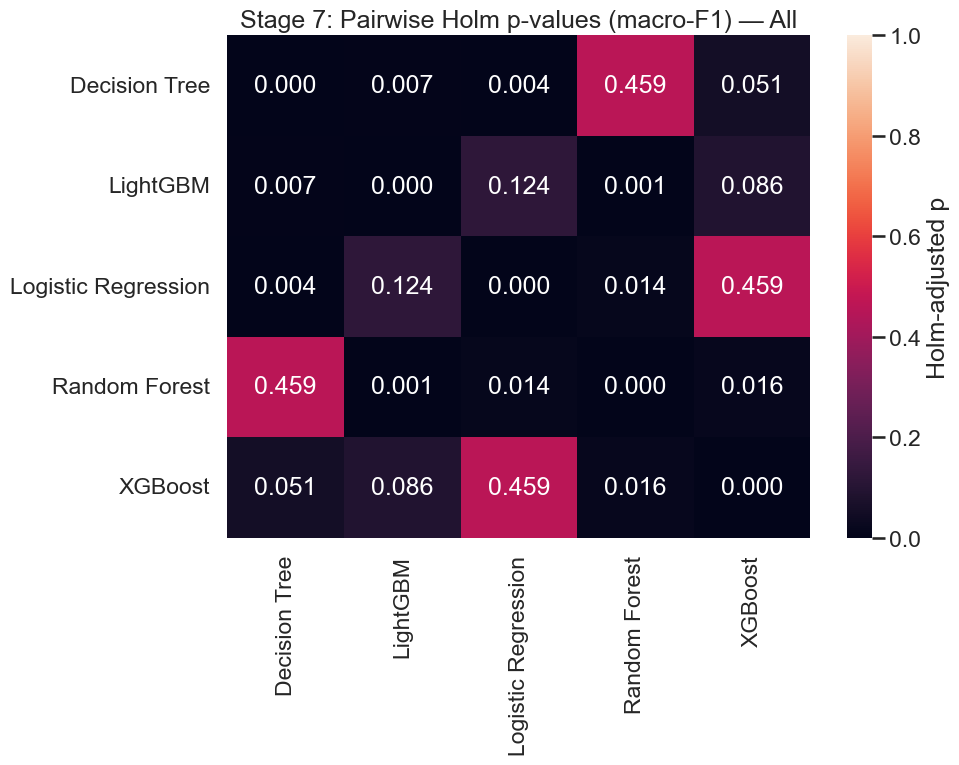

[Stage 7] Saved figure: figures/stage7_pairwise_p_holm_All.png


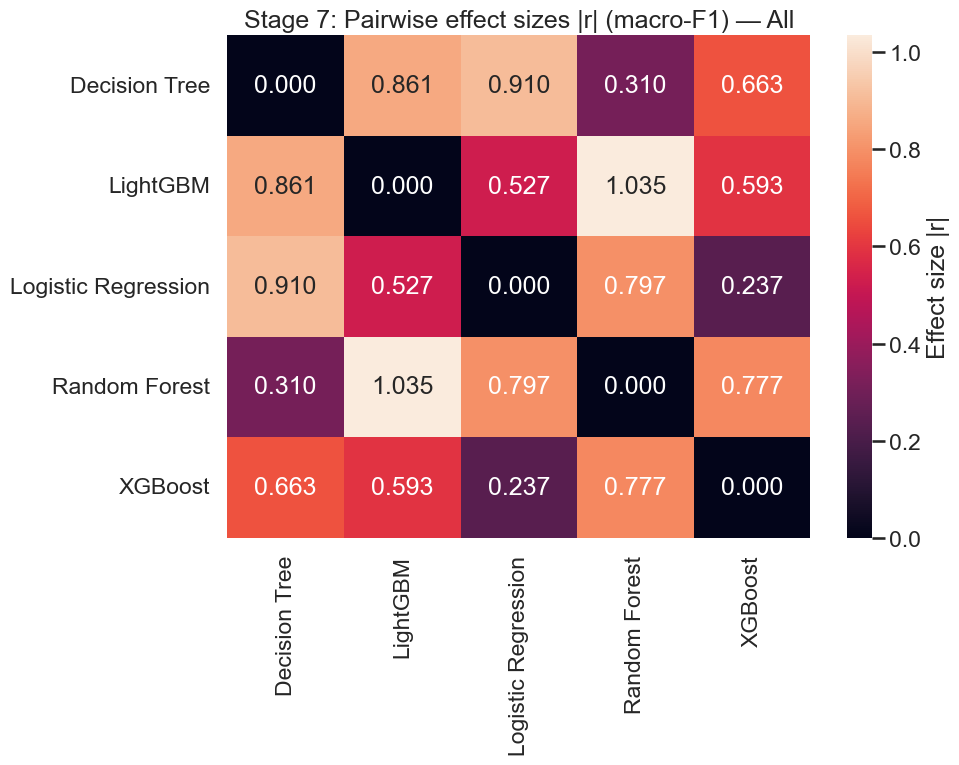

[Stage 7] Saved figure: figures/stage7_pairwise_effect_r_All.png


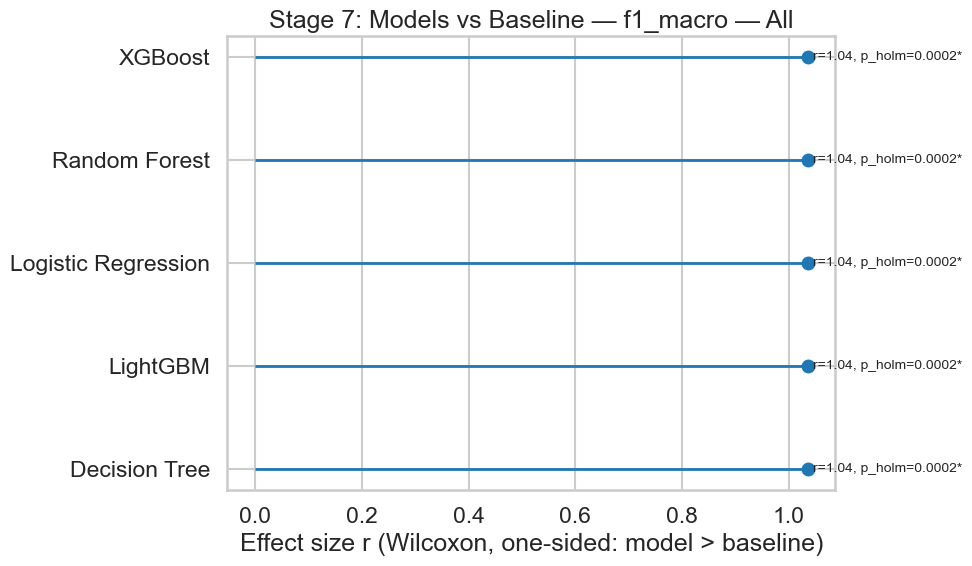

[Stage 7] Saved figure: figures/stage7_baseline_lollipop_f1_macro_All.png


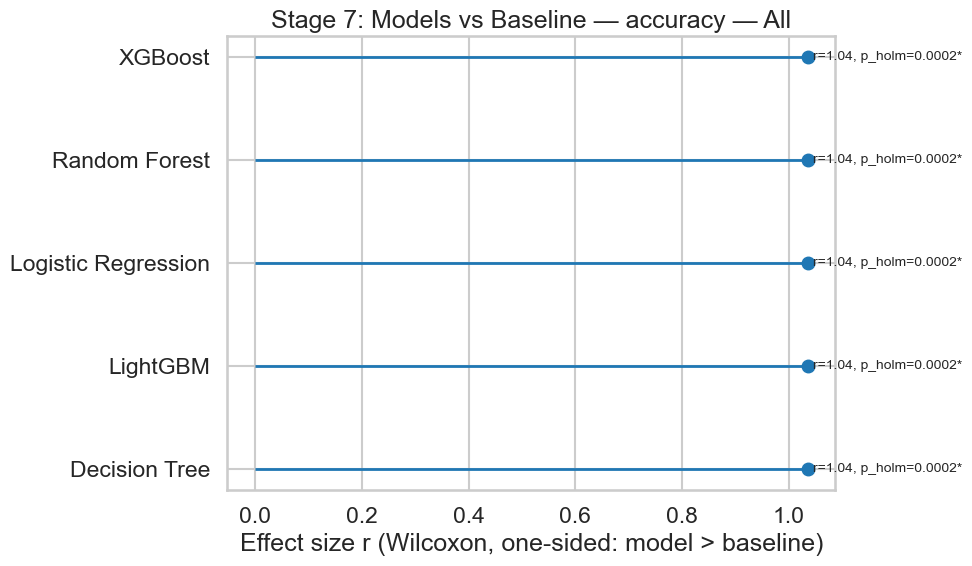

[Stage 7] Saved figure: figures/stage7_baseline_lollipop_accuracy_All.png

[Stage 7] Done. Tables saved + all visuals printed.


In [7]:
# ======================================================================
# STAGE 7: STATISTICAL COMPARISONS (Objective 3; H₀₂ / H₀₃)
# ======================================================================
# What this stage does:
# 1) Checks whether our finalist models perform differently overall
#    (using a fair, paired test across the same CV splits).
# 2) If there is evidence of differences, it identifies which specific
#    model pairs differ (with strict multiple-testing control).
# 3) It tests whether each model beats a simple "most frequent class"
#    baseline (a realistic minimum standard).
#
# Why stakeholders should care:
# - This stage turns “looks better” into “statistically supported”.
# - It reduces the risk of choosing a model based on random CV noise.
#
# Inputs:
# - tables/final_per_fold.csv
#   Must contain per-split metrics for each model.
#
# Outputs saved:
# - tables/stats_tests.csv          (Friedman + optional post-hoc pairwise)
# - tables/baseline_vs_models.csv   (Models vs Baseline for macro-F1 & accuracy)
# - figures/stage7_*.png            (heatmaps + lollipop plots)
# ======================================================================

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from itertools import combinations
from scipy import stats

# -----------------------------
# 0) Paths and basic setup
# -----------------------------
# Stakeholder note:
# - We keep outputs in standard folders so results can be audited and reused.
os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

INPUT_PATH = "tables/final_per_fold.csv"
assert os.path.exists(INPUT_PATH), (
    f"Missing {INPUT_PATH}. Stage 6 must run first to generate per-fold CV scores."
)

print(f"[Stage 7] Loading: {INPUT_PATH}")
df = pd.read_csv(INPUT_PATH)
print(f"[Stage 7] Loaded shape={df.shape}")

# -----------------------------
# 1) Standardise column names (robust to different Stage 6 variants)
# -----------------------------
# Stakeholder note:
# - Different experiments sometimes output slightly different column naming.
# - We normalise to a consistent schema so Stage 7 is stable.
rename_map = {}
if "Model" in df.columns: rename_map["Model"] = "model"
if "model" not in df.columns and "Model" not in df.columns:
    raise ValueError("final_per_fold.csv must contain a 'Model' or 'model' column.")

if "Variant" in df.columns: rename_map["Variant"] = "variant"
if "variant" not in df.columns:
    # If you did not run multiple variants, we create a single label.
    df["variant"] = "All"

# Common metric columns (we only NEED accuracy and f1_macro for Stage 7 decisions)
# but we tolerate extra columns.
df = df.rename(columns=rename_map)

required_metrics = {"accuracy", "f1_macro"}
missing_metrics = required_metrics - set(df.columns)
if missing_metrics:
    raise ValueError(f"final_per_fold.csv is missing required metrics: {missing_metrics}")

# Convert key numeric columns to numeric to prevent silent string bugs
for c in ["accuracy", "f1_macro"]:
    df[c] = pd.to_numeric(df[c], errors="coerce")

# Drop rows where core metrics are missing (cannot be used in stats tests)
before = len(df)
df = df.dropna(subset=["model", "variant", "accuracy", "f1_macro"]).copy()
after = len(df)
if after < before:
    print(f"[Stage 7] Dropped {before-after} rows with missing model/variant/metrics")

# -----------------------------
# 2) Build a UNIQUE paired key per CV split: rep_fold
# -----------------------------
# Stakeholder note:
# - Statistical tests require pairing: each model must be scored on the SAME CV split.
# - If repeated CV is used, fold_id alone is NOT unique (fold 0 repeats across repeats).
# - Therefore we create a stable key per split:
#     rep_fold = repeat_id + "_" + fold_id  (best)
# - If repeat_id does not exist, we fall back to a safe within-model index.
#
# This directly prevents the error:
#   "ValueError: Index contains duplicate entries, cannot reshape"
if "repeat_id" in df.columns and "fold_id" in df.columns:
    df["repeat_id"] = pd.to_numeric(df["repeat_id"], errors="coerce").astype("Int64")
    df["fold_id"]   = pd.to_numeric(df["fold_id"], errors="coerce").astype("Int64")
    if df["repeat_id"].isna().any() or df["fold_id"].isna().any():
        raise ValueError("repeat_id/fold_id contain non-numeric values; cannot form rep_fold safely.")
    df["rep_fold"] = df["repeat_id"].astype(str) + "_" + df["fold_id"].astype(str)
    pairing_mode = "repeat_id + fold_id"
elif "fold_id" in df.columns:
    # Single CV (fold_id unique per model) OR repeated CV but repeat_id not saved.
    # To remain robust, we create a deterministic within-model index and use it as pairing id.
    # This assumes the file order per model reflects the CV loop order (typical in Stage 6 patch code).
    df = df.sort_values(["variant", "model"]).copy()
    df["within_model_row"] = df.groupby(["variant", "model"]).cumcount()
    df["rep_fold"] = df["within_model_row"].astype(str)
    pairing_mode = "within-model row index (fallback)"
else:
    # Worst case: no fold_id, no repeat_id.
    # We still can create within-model row index, but pairing confidence is lower.
    df = df.sort_values(["variant", "model"]).copy()
    df["within_model_row"] = df.groupby(["variant", "model"]).cumcount()
    df["rep_fold"] = df["within_model_row"].astype(str)
    pairing_mode = "within-model row index (no fold_id present)"

print(f"[Stage 7] Pairing mode used: {pairing_mode}")

# Sanity check: pivot needs unique (variant, rep_fold, model)
dups = df.duplicated(subset=["variant", "rep_fold", "model"]).sum()
if dups > 0:
    raise ValueError(
        f"Your per-fold file has {dups} duplicate rows for the same (variant, rep_fold, model). "
        "This usually means you appended results twice or re-ran Stage 6 without overwriting."
    )

# -----------------------------
# 3) Helper functions (Holm correction + Wilcoxon effect size)
# -----------------------------
def holm_stepdown(pvals: np.ndarray) -> np.ndarray:
    """
    Holm-Bonferroni correction (controls family-wise error).
    Returns adjusted p-values, aligned with the original order of pvals.

    Stakeholder note:
    - When we run many pairwise tests, some may look significant by chance.
    - Holm correction reduces false positives while staying more powerful than Bonferroni.
    """
    pvals = np.asarray(pvals, dtype=float)
    m = len(pvals)
    order = np.argsort(pvals)

    adj = np.empty(m, dtype=float)
    running_max = 0.0
    for k, idx in enumerate(order):
        mult = m - k
        val = min(1.0, pvals[idx] * mult)
        running_max = max(running_max, val)  # monotone step-down
        adj[idx] = running_max
    return adj

def interpret_r(r: float) -> str:
    """Simple effect-size interpretation (Cohen-style)."""
    if np.isnan(r): return "NA"
    a = abs(r)
    if a >= 0.50: return "large"
    if a >= 0.30: return "medium"
    if a >= 0.10: return "small"
    return "negligible"

def wilcoxon_effect_r(x: np.ndarray, y: np.ndarray, alternative: str) -> tuple:
    """
    Paired Wilcoxon signed-rank + effect size r.
    r = |Z| / sqrt(n_nonzero), sign follows median(x - y).

    Stakeholder note:
    - p-value tells us whether a difference is likely real (not random).
    - effect size tells us whether the difference is practically meaningful.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    d = x - y

    # Remove exact ties (Wilcoxon ignores them in a paired sense)
    nz = d != 0
    if nz.sum() == 0:
        return np.nan, 1.0, np.nan  # no usable signal

    x2, y2, d2 = x[nz], y[nz], d[nz]
    n = len(d2)

    # Try modern SciPy signature first; fall back if needed
    try:
        w_stat, p = stats.wilcoxon(x2, y2, alternative=alternative, zero_method="wilcox")
    except TypeError:
        w_stat, p = stats.wilcoxon(x2, y2, zero_method="wilcox")

    # Convert p-value into Z magnitude (approximation) to get r
    if alternative in ("greater", "less"):
        # convert one-sided p -> equivalent two-sided magnitude for Z
        p2 = min(1.0, p * 2.0)
    else:
        p2 = p

    # numerical stability
    p2 = max(min(p2, 1 - 1e-12), 1e-12)
    z_mag = abs(stats.norm.isf(p2 / 2.0))
    r = z_mag / np.sqrt(n)

    # add direction sign based on median difference
    sign = np.sign(np.median(d2))
    r_signed = float(sign * r)
    return float(w_stat), float(p), r_signed

def make_wide(df_variant: pd.DataFrame, metric: str) -> pd.DataFrame:
    """
    Convert long-form per-fold scores into a paired matrix:
    rows = rep_fold (the unique CV split id)
    cols = model
    values = metric

    Stakeholder note:
    - This is the key step that enforces a fair, apples-to-apples comparison.
    """
    wide = df_variant.pivot(index="rep_fold", columns="model", values=metric)
    # keep only perfectly paired rows (every model has that split)
    wide = wide.dropna(axis=0, how="any")
    return wide

# -----------------------------
# 4) Run Stage 7 per Variant
# -----------------------------
BASELINE_NAME = "Baseline (Most Frequent)"
alpha = 0.05

all_stats_rows = []       # final table 1
all_baseline_rows = []    # final table 2

print("\n[Stage 7] Variants found:", sorted(df["variant"].unique().tolist()))

for variant, d in df.groupby("variant"):
    print(f"\n[Stage 7] Variant: {variant}  rows={len(d)}")

    # Build paired matrices for the two metrics we test in this stage
    wide_f1  = make_wide(d, "f1_macro")
    wide_acc = make_wide(d, "accuracy")

    models_present = list(wide_f1.columns)
    print("[Stage 7] Models present (paired):", models_present)
    print("[Stage 7] Paired evaluations available:", wide_f1.shape[0])

    if len(models_present) < 3:
        print("[Stage 7] Not enough models for Friedman (needs 3+). Skipping across-model tests.")
        continue

    # -------------------------
    # 4A) Friedman test (macro-F1) across finalist models
    # -------------------------
    # Stakeholder note:
    # - Friedman is a standard non-parametric test for comparing 3+ models on paired folds.
    # - It answers: “Is there evidence that at least one model differs?”
    finalists = [m for m in models_present if m != BASELINE_NAME]
    if len(finalists) < 3:
        print("[Stage 7] Not enough non-baseline models for Friedman (needs 3+ finalists).")
        continue

    fried_stat, fried_p = stats.friedmanchisquare(*[wide_f1[m].values for m in finalists])

    all_stats_rows.append({
        "variant": variant,
        "test": "Friedman",
        "metric": "f1_macro",
        "k_models": len(finalists),
        "n_pairs": wide_f1.shape[0],
        "statistic": float(fried_stat),
        "p_raw": float(fried_p),
        "p_holm": np.nan,
        "significant_0.05": bool(fried_p < alpha),
        "model_a": "",
        "model_b": "",
        "effect_size_r": np.nan
    })

    if fried_p < alpha:
        print(f"[Stage 7] Friedman SIGNIFICANT (p={fried_p:.4f}) -> running post-hoc pairwise tests.")
    else:
        print(f"[Stage 7] Friedman not significant (p={fried_p:.4f}) -> no post-hoc pairwise tests.")

    # -------------------------
    # 4B) Post-hoc: pairwise Wilcoxon (two-sided) + Holm (macro-F1)
    # -------------------------
    pair_rows = []
    if fried_p < alpha:
        pvals = []
        labels = []

        for a, b in combinations(finalists, 2):
            w_stat, p, r = wilcoxon_effect_r(wide_f1[a].values, wide_f1[b].values, alternative="two-sided")
            pair_rows.append({
                "variant": variant,
                "test": "Wilcoxon (pairwise)",
                "metric": "f1_macro",
                "k_models": len(finalists),
                "n_pairs": wide_f1.shape[0],
                "statistic": w_stat,
                "p_raw": p,
                "p_holm": np.nan,  # filled after Holm
                "significant_0.05": False,  # filled after Holm
                "model_a": a,
                "model_b": b,
                "effect_size_r": r
            })
            pvals.append(p)
            labels.append(f"{a} vs {b}")

        # Apply Holm correction across all pairwise tests
        p_holm = holm_stepdown(np.array(pvals, dtype=float))
        for i, row in enumerate(pair_rows):
            row["p_holm"] = float(p_holm[i])
            row["significant_0.05"] = bool(p_holm[i] < alpha)

        all_stats_rows.extend(pair_rows)

    # -------------------------
    # 4C) Baseline vs each model (one-sided) for macro-F1 and accuracy
    # -------------------------
    # Stakeholder note:
    # - This answers: “Does the model beat the simplest baseline reliably?”
    # - We use a one-sided test because our claim is directional (model should be better).
    baseline_present = (BASELINE_NAME in models_present)

    if not baseline_present:
        print(f"[Stage 7] Baseline '{BASELINE_NAME}' not present -> skipping baseline comparisons.")
    else:
        for metric_name, wide in [("f1_macro", wide_f1), ("accuracy", wide_acc)]:
            # One hypothesis family per metric (more defensible than mixing metrics)
            pvals = []
            rows = []

            for m in finalists:
                w_stat, p, r = wilcoxon_effect_r(wide[m].values, wide[BASELINE_NAME].values, alternative="greater")
                rows.append({
                    "variant": variant,
                    "metric": metric_name,
                    "model": m,
                    "n_pairs": wide.shape[0],
                    "wilcoxon_W": w_stat,
                    "p_raw": p,
                    "p_holm": np.nan,
                    "significant_0.05": False,
                    "effect_size_r": r,
                    "effect_size_label": interpret_r(r),
                    "mean_model": float(np.mean(wide[m].values)),
                    "mean_baseline": float(np.mean(wide[BASELINE_NAME].values)),
                })
                pvals.append(p)

            # Holm correction within this metric family
            p_holm = holm_stepdown(np.array(pvals, dtype=float))
            for i, row in enumerate(rows):
                row["p_holm"] = float(p_holm[i])
                row["significant_0.05"] = bool(p_holm[i] < alpha)

            all_baseline_rows.extend(rows)

    # -------------------------
    # 4D) Print concise summary (for your dissertation Results text)
    # -------------------------
    print("\n[Stage 7] Summary (variant-level)")
    print(f"  Friedman macro-F1: chi2={fried_stat:.3f}, p={fried_p:.4f} -> "
          f"{'SIGNIFICANT' if fried_p < alpha else 'not significant'} at α={alpha}")

# -----------------------------
# 5) Save outputs (CSV)
# -----------------------------
stats_tests_df = pd.DataFrame(all_stats_rows)
baseline_vs_models_df = pd.DataFrame(all_baseline_rows)

STATS_OUT = "tables/stats_tests.csv"
BASE_OUT  = "tables/baseline_vs_models.csv"

stats_tests_df.to_csv(STATS_OUT, index=False)
baseline_vs_models_df.to_csv(BASE_OUT, index=False)

print("\n[Stage 7] Saved outputs:")
print(f"  - {STATS_OUT} (rows={len(stats_tests_df)})")
print(f"  - {BASE_OUT} (rows={len(baseline_vs_models_df)})")

# -----------------------------
# 6) PRINT output tables (so everything is visible in the notebook)
# -----------------------------
# Stakeholder note:
# - This is the audit-friendly view: tables show exact p-values and effect sizes.
pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 160)

print("\n=== tables/stats_tests.csv (preview) ===")
display(stats_tests_df.head(30) if "display" in globals() else stats_tests_df.head(30))

print("\n=== tables/baseline_vs_models.csv (preview) ===")
display(baseline_vs_models_df.head(30) if "display" in globals() else baseline_vs_models_df.head(30))

# -----------------------------
# 7) VISUALISATIONS
# -----------------------------
# Stakeholder note:
# - Visuals make it faster to understand whether differences are meaningful and consistent.
sns.set_style("whitegrid")
sns.set_context("talk")

# 7A) Pairwise heatmaps (Holm p-values + effect sizes) for each variant
pairwise = stats_tests_df[stats_tests_df["test"].str.contains("Wilcoxon", na=False)].copy()
if not pairwise.empty:
    for variant in pairwise["variant"].unique():
        sub = pairwise[pairwise["variant"] == variant].copy()
        models = sorted(set(sub["model_a"]).union(set(sub["model_b"])))

        # p_holm matrix
        pmat = pd.DataFrame(1.0, index=models, columns=models, dtype=float)
        np.fill_diagonal(pmat.values, 0.0)
        for _, r in sub.iterrows():
            a, b = r["model_a"], r["model_b"]
            p = float(r["p_holm"])
            pmat.loc[a, b] = p
            pmat.loc[b, a] = p

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(pmat, annot=True, fmt=".3f", vmin=0, vmax=1, cbar_kws={"label": "Holm-adjusted p"})
        ax.set_title(f"Stage 7: Pairwise Holm p-values (macro-F1) — {variant}")
        plt.tight_layout()
        out = f"figures/stage7_pairwise_p_holm_{variant}.png".replace(" ", "_")
        plt.savefig(out, dpi=220)
        plt.show()
        print(f"[Stage 7] Saved figure: {out}")

        # effect size matrix (|r|)
        rmat = pd.DataFrame(np.nan, index=models, columns=models, dtype=float)
        np.fill_diagonal(rmat.values, 0.0)
        for _, r in sub.iterrows():
            a, b = r["model_a"], r["model_b"]
            val = abs(float(r["effect_size_r"])) if pd.notna(r["effect_size_r"]) else np.nan
            rmat.loc[a, b] = val
            rmat.loc[b, a] = val

        vmax = np.nanmax(rmat.values) if np.isfinite(np.nanmax(rmat.values)) else 1.0
        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(rmat, annot=True, fmt=".3f", vmin=0, vmax=vmax, cbar_kws={"label": "Effect size |r|"})
        ax.set_title(f"Stage 7: Pairwise effect sizes |r| (macro-F1) — {variant}")
        plt.tight_layout()
        out = f"figures/stage7_pairwise_effect_r_{variant}.png".replace(" ", "_")
        plt.savefig(out, dpi=220)
        plt.show()
        print(f"[Stage 7] Saved figure: {out}")
else:
    print("[Stage 7] No post-hoc pairwise results to plot (Friedman not significant).")

# 7B) Baseline vs models lollipop plots (macro-F1 and accuracy) for each variant
if not baseline_vs_models_df.empty:
    for variant in baseline_vs_models_df["variant"].unique():
        sub_v = baseline_vs_models_df[baseline_vs_models_df["variant"] == variant].copy()
        for metric in sub_v["metric"].unique():
            sub = sub_v[sub_v["metric"] == metric].copy()

            # Order by effect size for clarity
            sub = sub.sort_values("effect_size_r", ascending=True)

            plt.figure(figsize=(10, 6))
            y = sub["model"].tolist()
            x = sub["effect_size_r"].astype(float).values

            plt.hlines(y=y, xmin=0, xmax=x, linewidth=2)
            plt.plot(x, y, "o", markersize=9)

            # Annotate significance and p-values
            for yi, (_, row) in enumerate(sub.iterrows()):
                sig = "*" if bool(row["significant_0.05"]) else ""
                plt.text(float(row["effect_size_r"]) + 0.01, yi,
                         f"r={row['effect_size_r']:.2f}, p_holm={row['p_holm']:.4f}{sig}",
                         va="center", fontsize=10)

            plt.xlabel("Effect size r (Wilcoxon, one-sided: model > baseline)")
            plt.title(f"Stage 7: Models vs Baseline — {metric} — {variant}")
            plt.tight_layout()
            out = f"figures/stage7_baseline_lollipop_{metric}_{variant}.png".replace(" ", "_")
            plt.savefig(out, dpi=220)
            plt.show()
            print(f"[Stage 7] Saved figure: {out}")
else:
    print("[Stage 7] No baseline comparison rows to plot (baseline missing or skipped).")

print("\n[Stage 7] Done. Tables saved + all visuals printed.")

### STAGE 6 (PATCH) - Rebuild per-fold CV scores with an explicit fold_id

[Stage 6 Patch] X_train shape = (2730, 24)
[Stage 6 Patch] y_train length = 2730
[Stage 6 Patch] #classes = 4
[Stage 6 Patch] Built shared CV splits: n_splits=5, random_state=42

[Stage 6 Patch] Running Baseline per-fold evaluation...

[Stage 6 Patch] Selecting best config for: Decision Tree
  Best params: {'balance': 'passthrough', 'clf__class_weight': None, 'clf__max_depth': 8, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10}
  GridSearch time: 4.2s
[Stage 6 Patch] Decision Tree: produced 5 fold rows.

[Stage 6 Patch] Selecting best config for: Random Forest
  Best params: {'balance': 'passthrough', 'clf__class_weight': 'balanced', 'clf__max_depth': 20, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 900}
  GridSearch time: 176.2s
[Stage 6 Patch] Random Forest: produced 5 fold rows.

[Stage 6 Patch] Selecting best config for: Logistic Regression
  Best params: {'balance': 'passthrough', 'clf__C': 0.5, 'clf__class_weight': None, 'clf__penalty': '

,Model,fold_id,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted
0,Baseline (Most Frequent),0,0.445055,0.111264,0.250000,0.153992,0.274140
1,Baseline (Most Frequent),1,0.445055,0.111264,0.250000,0.153992,0.274140
2,Baseline (Most Frequent),2,0.445055,0.111264,0.250000,0.153992,0.274140
3,Baseline (Most Frequent),3,0.445055,0.111264,0.250000,0.153992,0.274140
4,Baseline (Most Frequent),4,0.446886,0.111722,0.250000,0.154430,0.276051
5,Decision Tree,0,0.752747,0.910714,0.634914,0.687234,0.731804
6,Decision Tree,1,0.747253,0.909449,0.619246,0.680512,0.730543
7,Decision Tree,2,0.749084,0.909868,0.648515,0.696888,0.728249
8,Decision Tree,3,0.734432,0.906572,0.579833,0.635013,0.710367
9,Decision Tree,4,0.716117,0.855418,0.574908,0.628993,0.694837



[Stage 6 Patch] Mean performance summary (sorted by macro-F1):


,Model,f1_macro_mean,f1_macro_std,acc_mean,acc_std
4,Random Forest,0.673206,0.020278,0.734799,0.006527
1,Decision Tree,0.665728,0.031404,0.739927,0.014991
5,XGBoost,0.660125,0.030706,0.725275,0.011511
3,Logistic Regression,0.654400,0.037599,0.715018,0.018112
2,LightGBM,0.649883,0.024596,0.703297,0.010679
0,Baseline (Most Frequent),0.154080,0.000196,0.445421,0.000819


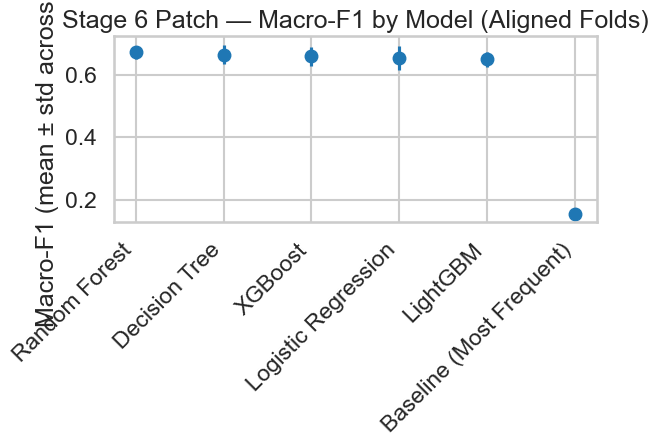

In [8]:
# ======================================================================
# STAGE 6 (PATCH) - Rebuild per-fold CV scores with an explicit fold_id
# ======================================================================
# What this step achieves:
# - Stage 7 uses statistical tests that REQUIRE “paired” comparisons.
# - “Paired” means: every model must be evaluated on the exact same folds.
# - This patch forces that pairing by:
#     1) Creating ONE fixed list of StratifiedKFold splits (the single source of truth)
#     2) Using that same split list for:
#         - GridSearchCV hyperparameter selection (same folds for every model)
#         - Manual fold-by-fold scoring of the selected pipeline (adds fold_id)
#     3) Computing the Baseline on the exact same folds (so baseline tests are valid)
#
# Output file (used directly by Stage 7):
# - tables/final_per_fold.csv  (OVERWRITES previous)
#   Columns:
#   Model, fold_id, accuracy, precision_macro, recall_macro, f1_macro, f1_weighted
#
# Important: This patch focuses on rebuilding the per-fold table reliably.
# To support “visualisations are printed”, we also print a small summary plot at the end.
# ======================================================================

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from joblib import Memory
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.dummy import DummyClassifier

from imblearn.pipeline import Pipeline  # lets us keep a placeholder 'balance' step

# Finalists
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

# Optional LightGBM (only runs if installed)
try:
    from lightgbm import LGBMClassifier
    HAS_LGBM = True
except Exception:
    HAS_LGBM = False


# ----------------------------------------------------------------------
# 0) Safety checks + inputs (we reuse the same training data from Stage 4)
# ----------------------------------------------------------------------
# Why this matters:
# - We must use the exact same training set and preprocessing pipeline as before,
#   otherwise performance comparisons are not comparable.
assert "outputs" in globals(), (
    "Missing Stage 4 outputs. Please run Stage 4 first so `outputs` exists "
    "(needs X_train, y_train, classes, preprocessor)."
)

X_train = outputs["X_train"]
y_train = outputs["y_train"]
classes = outputs["classes"]
preprocessor = outputs["preprocessor"]

# Ensure output folders exist
os.makedirs("tables", exist_ok=True)
os.makedirs("cache_stage6_patch", exist_ok=True)

# Cache preprocessing work across CV folds to save time
memory = Memory("cache_stage6_patch", verbose=0)

print(f"[Stage 6 Patch] X_train shape = {X_train.shape}")
print(f"[Stage 6 Patch] y_train length = {len(y_train)}")
print(f"[Stage 6 Patch] #classes = {len(classes)}")


# ----------------------------------------------------------------------
# 1) Create ONE fixed set of CV splits (single source of truth)
# ----------------------------------------------------------------------
# Why this matters:
# - This guarantees each model is tested on the same fold boundaries,
#   enabling fair “like-for-like” comparisons and valid paired statistics.
RANDOM_STATE = 42
N_SPLITS = 5

cv = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE)
splits = list(cv.split(X_train, y_train))  # fixed splits used everywhere

print(f"[Stage 6 Patch] Built shared CV splits: n_splits={N_SPLITS}, random_state={RANDOM_STATE}")


# ----------------------------------------------------------------------
# 2) Fold-by-fold scoring helper (adds fold_id)
# ----------------------------------------------------------------------
# Why this matters:
# - Stage 7 needs a fold_id column so it can align and pair scores correctly.
def score_foldwise(pipe, splits, X, y, model_name):
    """
    Fit the pipeline on each training fold and evaluate on its validation fold.
    Returns a DataFrame with one row per fold, with fold_id aligned across models.
    """
    rows = []

    for fold_id, (tr_idx, va_idx) in enumerate(splits):
        # Split into training and validation for this fold
        X_tr, X_va = X.iloc[tr_idx], X.iloc[va_idx]
        y_tr, y_va = y[tr_idx], y[va_idx]

        # Train on this fold's training data
        pipe.fit(X_tr, y_tr)

        # Predict on the validation data for this fold
        y_pred = pipe.predict(X_va)

        # Record key metrics used later in reporting + stats testing
        rows.append({
            "Model": model_name,
            "fold_id": fold_id,
            "accuracy":        accuracy_score(y_va, y_pred),
            "precision_macro": precision_score(y_va, y_pred, average="macro", zero_division=0),
            "recall_macro":    recall_score(y_va, y_pred, average="macro", zero_division=0),
            "f1_macro":        f1_score(y_va, y_pred, average="macro", zero_division=0),
            "f1_weighted":     f1_score(y_va, y_pred, average="weighted", zero_division=0),
        })

    return pd.DataFrame(rows)


# ----------------------------------------------------------------------
# 3) Finalist model specifications (tight grids)
# ----------------------------------------------------------------------
# Why this matters:
# - We search a small, sensible set of hyperparameters so results are strong
#   but compute time stays realistic and defensible for a dissertation.
def finalist_specs(num_classes: int, include_lgbm: bool = True):
    specs = {
        "Decision Tree": {
            "estimator": DecisionTreeClassifier(random_state=RANDOM_STATE),
            "grid": {
                "balance": ["passthrough"],
                "clf__max_depth": [8, 10, 12, None],
                "clf__min_samples_split": [2, 10],
                "clf__min_samples_leaf": [1, 2],
                "clf__class_weight": [None],
            }
        },
        "Random Forest": {
            "estimator": RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1),
            "grid": {
                "balance": ["passthrough"],
                "clf__n_estimators": [300, 600, 900],
                "clf__max_depth": [None, 20],
                "clf__min_samples_split": [2, 10],
                "clf__min_samples_leaf": [1, 2],
                "clf__class_weight": ["balanced"],
            }
        },
        "Logistic Regression": {
            "estimator": LogisticRegression(
                multi_class="multinomial",
                solver="lbfgs",
                max_iter=2000,
                random_state=RANDOM_STATE
            ),
            "grid": {
                "balance": ["passthrough"],
                "clf__C": [0.5, 1.0],
                "clf__penalty": ["l2"],
                "clf__class_weight": [None, "balanced"],
            }
        },
        "XGBoost": {
            "estimator": XGBClassifier(
                objective="multi:softprob",
                num_class=num_classes,
                eval_metric="mlogloss",
                tree_method="hist",
                n_jobs=-1,
                random_state=RANDOM_STATE
            ),
            "grid": {
                "balance": ["passthrough"],
                "clf__n_estimators": [300, 450, 600],
                "clf__max_depth": [4, 5],
                "clf__learning_rate": [0.05],
                "clf__subsample": [0.8, 1.0],
                "clf__colsample_bytree": [0.8, 1.0],
            }
        }
    }

    if include_lgbm and HAS_LGBM:
        specs["LightGBM"] = {
            "estimator": LGBMClassifier(
                objective="multiclass",
                num_class=num_classes,
                n_jobs=-1,
                random_state=RANDOM_STATE
            ),
            "grid": {
                "balance": ["passthrough"],
                "clf__n_estimators": [400, 800],
                "clf__num_leaves": [31, 63],
                "clf__learning_rate": [0.05],
                "clf__min_child_samples": [20, 40],
            }
        }

    return specs


# ----------------------------------------------------------------------
# 4) Fit and score a model using the shared folds
# ----------------------------------------------------------------------
# Why this matters:
# - We choose the best settings using GridSearchCV (with shared folds),
#   then score the chosen pipeline fold-by-fold using the SAME shared folds.
def fit_and_score_with_fixed_splits(model_name, estimator, param_grid):
    """
    1) Build a leakage-safe pipeline: preprocessor -> (balance placeholder) -> classifier
    2) Grid search using the shared splits (pairing enforced)
    3) Re-score fold-by-fold with fold_id so Stage 7 can align comparisons
    """
    print(f"\n[Stage 6 Patch] Selecting best config for: {model_name}")
    start = time.time()

    pipe = Pipeline(
        steps=[("prep", preprocessor), ("balance", "passthrough"), ("clf", estimator)],
        memory=memory
    )

    grid = GridSearchCV(
        estimator=pipe,
        param_grid=param_grid,
        scoring="f1_macro",
        refit=True,
        cv=splits,          # shared fixed folds
        n_jobs=-1,
        verbose=0,
        return_train_score=False
    )

    grid.fit(X_train, y_train)
    best_pipe = grid.best_estimator_

    secs = time.time() - start
    print(f"  Best params: {grid.best_params_}")
    print(f"  GridSearch time: {secs:.1f}s")

    # Score fold-by-fold using identical fold boundaries
    fold_df = score_foldwise(best_pipe, splits, X_train, y_train, model_name=model_name)

    print(f"[Stage 6 Patch] {model_name}: produced {len(fold_df)} fold rows.")
    return fold_df


# ----------------------------------------------------------------------
# 5) Baseline (Most Frequent) on the same folds
# ----------------------------------------------------------------------
# Why this matters:
# - Baseline comparisons in Stage 7 must use the same folds,
#   otherwise “model > baseline” tests are not valid paired tests.
BASELINE_NAME = "Baseline (Most Frequent)"

def baseline_per_fold_with_fixed_splits():
    pipe = Pipeline(
        steps=[("prep", preprocessor),
               ("clf", DummyClassifier(strategy="most_frequent"))],
        memory=memory
    )
    return score_foldwise(pipe, splits, X_train, y_train, model_name=BASELINE_NAME)


# ----------------------------------------------------------------------
# 6) Run everything: Baseline + finalists, then save the aligned CSV
# ----------------------------------------------------------------------
print("\n[Stage 6 Patch] Running Baseline per-fold evaluation...")
all_rows = [baseline_per_fold_with_fixed_splits()]

specs = finalist_specs(num_classes=len(classes), include_lgbm=True)

for model_name, spec in specs.items():
    fold_df = fit_and_score_with_fixed_splits(model_name, spec["estimator"], spec["grid"])
    all_rows.append(fold_df)

final_per_fold = pd.concat(all_rows, ignore_index=True)

# Clean + sanity checks so Stage 7 does not fail
final_per_fold["fold_id"] = final_per_fold["fold_id"].astype(int)

# Ensure we have exactly one row per (Model, fold_id)
dups = final_per_fold.duplicated(subset=["Model", "fold_id"]).sum()
assert dups == 0, f"Duplicate (Model, fold_id) rows found: {dups}. Stage 7 pivot would fail."

# Ensure every model has all folds
counts = final_per_fold.groupby("Model")["fold_id"].nunique().sort_values()
min_folds = counts.min()
assert min_folds == N_SPLITS, (
    "At least one model is missing folds. Stage 7 requires each model to have all folds.\n"
    f"Fold counts per model:\n{counts}"
)

out_path = "tables/final_per_fold.csv"
final_per_fold.to_csv(out_path, index=False)

print(f"\n[Stage 6 Patch] Saved: {out_path}")
print(f"[Stage 6 Patch] final_per_fold shape = {final_per_fold.shape}")
print("[Stage 6 Patch] Models included:", list(counts.index))

# Print a small table preview for quick inspection
print("\n[Stage 6 Patch] Preview (first 10 rows):")
display(final_per_fold.head(10))


# ----------------------------------------------------------------------
# 7) Visualisation (quick, stakeholder-friendly summary)
# ----------------------------------------------------------------------
# Why this matters:
# - This provides an easy “at-a-glance” view of how models compare on average.
# - The statistical tests still happen in Stage 7; this is just a visual summary.
summary = (
    final_per_fold
    .groupby("Model", as_index=False)
    .agg(
        f1_macro_mean=("f1_macro", "mean"),
        f1_macro_std=("f1_macro", "std"),
        acc_mean=("accuracy", "mean"),
        acc_std=("accuracy", "std"),
    )
    .sort_values("f1_macro_mean", ascending=False)
)

print("\n[Stage 6 Patch] Mean performance summary (sorted by macro-F1):")
display(summary)

plt.figure()
plt.errorbar(
    x=np.arange(len(summary)),
    y=summary["f1_macro_mean"].values,
    yerr=summary["f1_macro_std"].values,
    fmt="o",
)
plt.xticks(np.arange(len(summary)), summary["Model"].values, rotation=45, ha="right")
plt.ylabel("Macro-F1 (mean ± std across folds)")
plt.title("Stage 6 Patch — Macro-F1 by Model (Aligned Folds)")
plt.tight_layout()
plt.show()

### STAGE 7 - STATISTICAL COMPARISONS (Objective 3; H₀₂ / H₀₃) AFTER STAGE 6 PATCH

[Stage 7] Models found: ['Baseline (Most Frequent)', 'Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']
[Stage 7] Common folds used for pairing: [0, 1, 2, 3, 4] (n=5)
[Stage 7] Rows used after alignment: 30

[Stage 7] Across-model test (macro-F1):
  Friedman χ² = 18.486, p = 0.0024 -> SIGNIFICANT at α=0.05

[Stage 7] Post-hoc pairwise results (Holm-adjusted):
  No pairwise differences remained significant after Holm correction.

[Stage 7] Baseline comparisons (Holm-adjusted within each metric):
  No model beat the baseline significantly after Holm correction (for accuracy or macro-F1).

[Stage 7] Saved: tables/stats_tests.csv
[Stage 7] Saved: tables/baseline_vs_models.csv


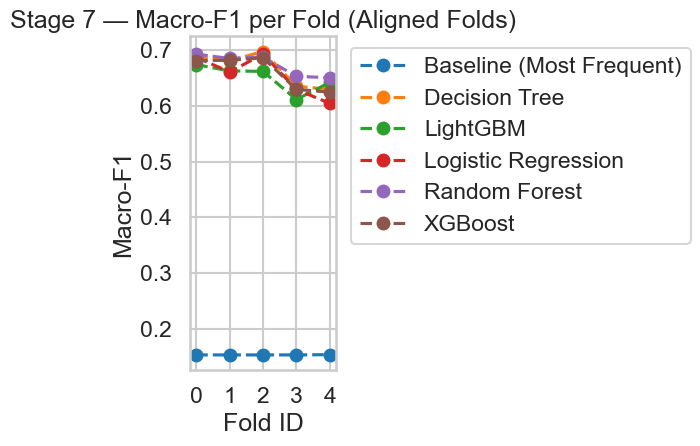

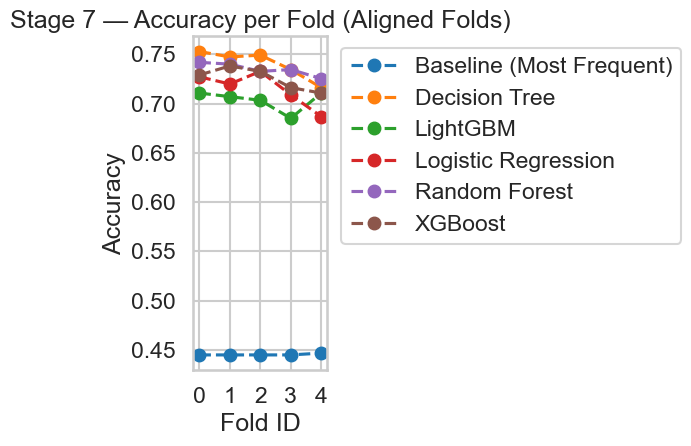


[Stage 7] Mean ± SD across folds (quick stakeholder summary):


,Model,f1_macro_mean,f1_macro_std,acc_mean,acc_std
4,Random Forest,0.673206,0.020278,0.734799,0.006527
1,Decision Tree,0.665728,0.031404,0.739927,0.014991
5,XGBoost,0.660125,0.030706,0.725275,0.011511
3,Logistic Regression,0.654400,0.037599,0.715018,0.018112
2,LightGBM,0.649883,0.024596,0.703297,0.010679
0,Baseline (Most Frequent),0.154080,0.000196,0.445421,0.000819


In [9]:
# ======================================================================
# STAGE 7 - STATISTICAL COMPARISONS (Objective 3; H₀₂ / H₀₃) after stage 6 patch
# ======================================================================
# What this step achieves (in plain English):
# - We already measured each model on the SAME cross-validation folds in Stage 6 Patch.
# - Now we test whether observed differences are likely real or could be noise.
#
# Two questions we answer:
# 1) "Do the models differ from each other overall?"  -> Friedman test on macro-F1 (paired by fold_id)
#    If YES, we then run pairwise Wilcoxon tests between models with Holm correction.
#
# 2) "Does each model beat the baseline?" -> One-sided paired Wilcoxon (model > baseline)
#    We correct p-values separately for Accuracy and Macro-F1 (two separate metric families).
#
# Outputs saved for my tables:
# - tables/stats_tests.csv        (Friedman + optional post-hoc pairwise Wilcoxon)
# - tables/baseline_vs_models.csv (Baseline vs each model, for macro-F1 and accuracy)
#
# Outputs printed for transparency:
# - Models found, folds used, Friedman result
# - Significant pairwise differences (if any)
# - Significant baseline wins (if any)
# - Simple visual summaries (boxplot-like fold scatter + mean lines)
# ======================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from itertools import combinations
from scipy.stats import friedmanchisquare, wilcoxon, norm


# ----------------------------------------------------------------------
# 0) Load per-fold scores and validate input
# ----------------------------------------------------------------------
# Why this matters:
# - Statistical tests will fail or (worse) become invalid if folds are not aligned,
#   duplicates exist, or the baseline is missing.
PERF_PATH = "tables/final_per_fold.csv"
assert os.path.exists(PERF_PATH), (
    f"Missing {PERF_PATH}. Re-run Stage 6 Patch to rebuild per-fold scores."
)

df = pd.read_csv(PERF_PATH)

required_cols = {
    "Model", "fold_id",
    "accuracy", "precision_macro", "recall_macro", "f1_macro", "f1_weighted"
}
missing = required_cols - set(df.columns)
assert not missing, f"Per-fold table missing columns: {missing}"

# Make sure numeric columns are numeric (prevents silent string issues)
metric_cols = ["accuracy", "precision_macro", "recall_macro", "f1_macro", "f1_weighted"]
for c in metric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce")

# Guard against duplicates that would break pairing
dups = df.duplicated(subset=["Model", "fold_id"]).sum()
assert dups == 0, (
    f"Duplicate (Model, fold_id) rows found: {dups}. "
    "Fix Stage 6 Patch output first; Stage 7 requires unique fold rows."
)

BASE = "Baseline (Most Frequent)"
models = sorted(df["Model"].unique())
print("[Stage 7] Models found:", models)
assert BASE in models, f"Baseline '{BASE}' not found in {PERF_PATH}."

# Identify folds common to ALL models (conservative alignment)
common_folds = None
for m in models:
    folds_m = set(df.loc[df["Model"] == m, "fold_id"].unique())
    common_folds = folds_m if common_folds is None else (common_folds & folds_m)

common_folds = sorted(list(common_folds))
assert len(common_folds) >= 2, "Not enough common folds across models for paired tests."

df_common = df[df["fold_id"].isin(common_folds)].copy()

print(f"[Stage 7] Common folds used for pairing: {common_folds} (n={len(common_folds)})")
print(f"[Stage 7] Rows used after alignment: {len(df_common)}")


# ----------------------------------------------------------------------
# 1) Helper functions (alignment, effect size, Holm correction)
# ----------------------------------------------------------------------
# Why this matters:
# - We keep the core logic simple and consistent so results are traceable and reusable.
def paired_vectors(dfin, model_a, model_b, metric, folds):
    """
    Build two aligned arrays (A, B) by fold_id.
    This guarantees paired comparisons are truly on the same folds.
    """
    A = (
        dfin.loc[dfin["Model"] == model_a, ["fold_id", metric]]
        .set_index("fold_id")
        .loc[folds][metric]
        .values
    )
    B = (
        dfin.loc[dfin["Model"] == model_b, ["fold_id", metric]]
        .set_index("fold_id")
        .loc[folds][metric]
        .values
    )
    return A, B

def wilcoxon_test(A, B, alternative):
    """
    Paired Wilcoxon signed-rank test with:
    - tie removal (zero differences)
    - support for older SciPy versions that may not accept 'alternative'
    Returns: p_raw, n_pairs_used, effect_size_r
    """
    diff = A - B
    nz = diff != 0
    if nz.sum() == 0:
        return 1.0, 0, np.nan  # no usable pairs (all ties)

    A2, B2 = A[nz], B[nz]
    n = len(A2)

    # Run Wilcoxon (with fallback if SciPy is old)
    try:
        stat, p = wilcoxon(A2, B2, alternative=alternative, zero_method="wilcox")
    except TypeError:
        # Fallback: do two-sided and approximate one-sided if requested
        stat, p2 = wilcoxon(A2, B2, zero_method="wilcox")
        if alternative == "two-sided":
            p = p2
        else:
            # decide which tail to keep based on direction of mean difference
            if alternative == "greater":
                p = p2 / 2.0 if (A2.mean() > B2.mean()) else 1.0
            elif alternative == "less":
                p = p2 / 2.0 if (A2.mean() < B2.mean()) else 1.0
            else:
                p = p2

    # Convert p-value to Z for effect size magnitude
    # r = |Z| / sqrt(n)
    try:
        if alternative == "two-sided":
            Z = norm.isf(p / 2.0)
        else:
            Z = norm.isf(p)
        r = abs(Z) / np.sqrt(n)
    except Exception:
        r = np.nan

    return float(p), int(n), float(r)

def holm_adjust(pvals, labels, alpha=0.05):
    """
    Holm step-down procedure (FWER control).
    Returns DataFrame with label, p_holm, significant_0.05.
    """
    pvals = np.asarray(pvals, dtype=float)
    m = len(pvals)

    order = np.argsort(pvals)
    p_holm = np.empty(m, dtype=float)

    # Step-down with monotonicity
    max_so_far = 0.0
    for rank, idx in enumerate(order):
        mult = m - rank
        adj = pvals[idx] * mult
        max_so_far = max(max_so_far, adj)
        p_holm[idx] = min(1.0, max_so_far)

    out = pd.DataFrame({
        "label": labels,
        "p_holm": p_holm,
        "significant_0.05": p_holm < alpha
    })
    return out


# ----------------------------------------------------------------------
# 2) Across-model comparison (H₀₃): Friedman test on macro-F1
# ----------------------------------------------------------------------
# Why this matters:
# - Friedman is a non-parametric repeated-measures test:
#   it tests whether performance differs across models while respecting fold pairing.
metric_main = "f1_macro"

# Build a matrix-like list: one vector per model, aligned by fold_id
model_order = models  # keep baseline included for full transparency in this global test
score_vectors = []
for m in model_order:
    v = (
        df_common.loc[df_common["Model"] == m, ["fold_id", metric_main]]
        .set_index("fold_id")
        .loc[common_folds][metric_main]
        .values
    )
    score_vectors.append(v)

friedman_stat, friedman_p = friedmanchisquare(*score_vectors)

friedman_row = {
    "test": "Friedman",
    "metric": metric_main,
    "k_models": len(model_order),
    "n_folds": len(common_folds),
    "statistic": float(friedman_stat),
    "p_raw": float(friedman_p),
    "significant_0.05": bool(friedman_p < 0.05),
}

print("\n[Stage 7] Across-model test (macro-F1):")
print(f"  Friedman χ² = {friedman_stat:.3f}, p = {friedman_p:.4f} "
      f"-> {'SIGNIFICANT' if friedman_p < 0.05 else 'not significant'} at α=0.05")


# ----------------------------------------------------------------------
# 3) Post-hoc pairwise tests (only if Friedman is significant)
# ----------------------------------------------------------------------
# Why this matters:
# - If Friedman indicates “some models differ”, post-hoc tells us WHICH ones differ.
pairwise_df = pd.DataFrame(
    columns=["test", "metric", "model_a", "model_b", "n_pairs", "mean_a", "mean_b", "p_raw", "p_holm", "significant_0.05", "effect_size_r"]
)

if friedman_p < 0.05:
    rows = []
    for m1, m2 in combinations(model_order, 2):
        A, B = paired_vectors(df_common, m1, m2, metric_main, common_folds)
        p, n, r = wilcoxon_test(A, B, alternative="two-sided")

        rows.append({
            "test": "Wilcoxon (pairwise)",
            "metric": metric_main,
            "model_a": m1,
            "model_b": m2,
            "n_pairs": n,
            "mean_a": float(A.mean()),
            "mean_b": float(B.mean()),
            "p_raw": p,
            "effect_size_r": r
        })

    pairwise_df = pd.DataFrame(rows)

    # Holm adjustment across all pairwise comparisons
    adj = holm_adjust(pairwise_df["p_raw"].values, labels=pairwise_df.index.astype(str))
    pairwise_df = pairwise_df.join(adj.set_index("label"), how="left")

    # Print a short, stakeholder-readable summary of significant pairs (if any)
    sig_pairs = pairwise_df[pairwise_df["significant_0.05"] == True].copy()
    print("\n[Stage 7] Post-hoc pairwise results (Holm-adjusted):")
    if sig_pairs.empty:
        print("  No pairwise differences remained significant after Holm correction.")
    else:
        print(sig_pairs[["model_a", "model_b", "mean_a", "mean_b", "p_holm", "effect_size_r"]].to_string(index=False))
else:
    print("\n[Stage 7] Friedman not significant -> skipping post-hoc pairwise Wilcoxon tests.")


# ----------------------------------------------------------------------
# 4) Baseline vs each model (H₀₂): one-sided Wilcoxon, Holm per metric
# ----------------------------------------------------------------------
# Why this matters:
# - This answers the practical question: “Is a model meaningfully better than the baseline?”
def baseline_family_tests(metric, alpha=0.05):
    rows = []
    for m in models:
        if m == BASE:
            continue

        A, B = paired_vectors(df_common, m, BASE, metric, common_folds)  # A=model, B=baseline
        p, n, r = wilcoxon_test(A, B, alternative="greater")             # one-sided: model > baseline

        rows.append({
            "test": "Wilcoxon (model > baseline)",
            "metric": metric,
            "model": m,
            "n_pairs": n,
            "mean_model": float(A.mean()),
            "mean_baseline": float(B.mean()),
            "p_raw": p,
            "effect_size_r": r
        })

    res = pd.DataFrame(rows)
    if res.empty:
        return res

    adj = holm_adjust(res["p_raw"].values, labels=res["model"].values, alpha=alpha)
    res = res.merge(adj, left_on="model", right_on="label", how="left").drop(columns=["label"])
    return res

baseline_f1 = baseline_family_tests("f1_macro")
baseline_acc = baseline_family_tests("accuracy")
baseline_vs_models = pd.concat([baseline_f1, baseline_acc], ignore_index=True)

print("\n[Stage 7] Baseline comparisons (Holm-adjusted within each metric):")
if baseline_vs_models.empty:
    print("  No baseline comparisons produced (unexpected).")
else:
    sig_base = baseline_vs_models[baseline_vs_models["significant_0.05"] == True]
    if sig_base.empty:
        print("  No model beat the baseline significantly after Holm correction (for accuracy or macro-F1).")
    else:
        print(sig_base[["metric", "model", "mean_model", "mean_baseline", "p_holm", "effect_size_r"]].to_string(index=False))


# ----------------------------------------------------------------------
# 5) Save outputs for the dissertation tables
# ----------------------------------------------------------------------
# Why this matters:
# - These CSVs become your evidence artefacts: you can cite them in Results/Appendix.
os.makedirs("tables", exist_ok=True)

stats_tests = pd.concat([pd.DataFrame([friedman_row]), pairwise_df], ignore_index=True)
stats_tests_path = "tables/stats_tests.csv"
baseline_path = "tables/baseline_vs_models.csv"

stats_tests.to_csv(stats_tests_path, index=False)
baseline_vs_models.to_csv(baseline_path, index=False)

print(f"\n[Stage 7] Saved: {stats_tests_path}")
print(f"[Stage 7] Saved: {baseline_path}")


# ----------------------------------------------------------------------
# 6) Visual summaries (to help you explain results to non-technical readers)
# ----------------------------------------------------------------------
# Why this matters:
# - Stakeholders often understand visuals faster than statistical tables.
# - These plots are not replacing the statistical tests; they support interpretation.

# Prepare a pivot table for quick plotting (folds on rows, models on columns)
wide_f1 = df_common.pivot(index="fold_id", columns="Model", values="f1_macro").loc[common_folds]
wide_acc = df_common.pivot(index="fold_id", columns="Model", values="accuracy").loc[common_folds]

# Plot 1: Macro-F1 by fold (scatter per model)
plt.figure()
for m in wide_f1.columns:
    plt.plot(wide_f1.index.values, wide_f1[m].values, marker="o", linestyle="--", label=m)
plt.xlabel("Fold ID")
plt.ylabel("Macro-F1")
plt.title("Stage 7 — Macro-F1 per Fold (Aligned Folds)")
plt.xticks(wide_f1.index.values)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Plot 2: Accuracy by fold (scatter per model)
plt.figure()
for m in wide_acc.columns:
    plt.plot(wide_acc.index.values, wide_acc[m].values, marker="o", linestyle="--", label=m)
plt.xlabel("Fold ID")
plt.ylabel("Accuracy")
plt.title("Stage 7 — Accuracy per Fold (Aligned Folds)")
plt.xticks(wide_acc.index.values)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Print a compact summary table that’s easy to paste into the report
summary = (
    df_common
    .groupby("Model", as_index=False)
    .agg(
        f1_macro_mean=("f1_macro", "mean"),
        f1_macro_std=("f1_macro", "std"),
        acc_mean=("accuracy", "mean"),
        acc_std=("accuracy", "std"),
    )
    .sort_values("f1_macro_mean", ascending=False)
)

print("\n[Stage 7] Mean ± SD across folds (quick stakeholder summary):")
display(summary)

### STAGE 6 (PATCH v2) - Repeated Cross-Validation with Perfectly Aligned Folds

[Stage 6 Patch v2] CV plan: 5 folds × 3 repeats = 15 evaluations per model.
[Stage 6 Patch v2] Models evaluated: ['Decision Tree', 'Random Forest', 'Logistic Regression', 'XGBoost', 'LightGBM', 'Baseline (Most Frequent)']
[Stage 6 Patch v2] Decision Tree completed (15 evaluations) in 1.2s.
[Stage 6 Patch v2] Random Forest completed (15 evaluations) in 39.0s.
[Stage 6 Patch v2] Logistic Regression completed (15 evaluations) in 5.1s.
[Stage 6 Patch v2] XGBoost completed (15 evaluations) in 7.8s.
[Stage 6 Patch v2] LightGBM completed (15 evaluations) in 21.7s.
[Stage 6 Patch v2] Baseline (Most Frequent) completed (15 evaluations) in 0.8s.

[Stage 6 Patch v2] Saved: tables/final_per_fold.csv
[Stage 6 Patch v2] Rows: 90 | Models: 6 | Folds×Repeats: 5×3 = 15 per model
[Stage 6 Patch v2] Total runtime: 75.5s

[Stage 6 Patch v2] Mean ± SD across all repeated folds:


,Model,acc_mean,acc_std,f1_macro_mean,f1_macro_std
4,Random Forest,0.730525,0.008332,0.670857,0.015426
1,Decision Tree,0.738217,0.013870,0.666396,0.022076
5,XGBoost,0.725519,0.010076,0.659602,0.018742
3,Logistic Regression,0.714042,0.013168,0.655837,0.023102
2,LightGBM,0.702442,0.012724,0.648651,0.018164
0,Baseline (Most Frequent),0.445421,0.000758,0.154080,0.000181


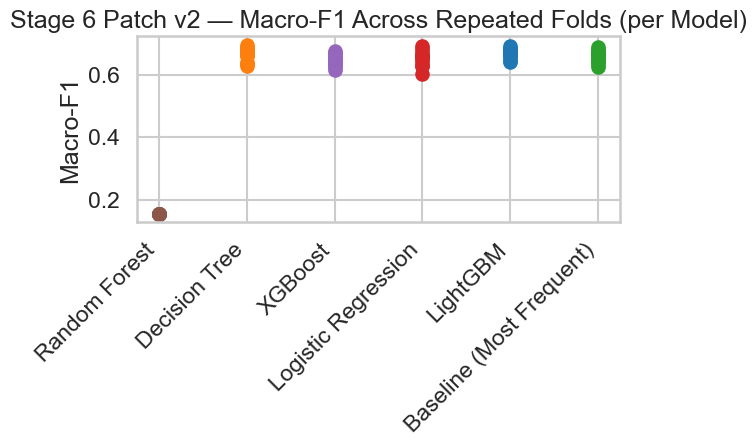

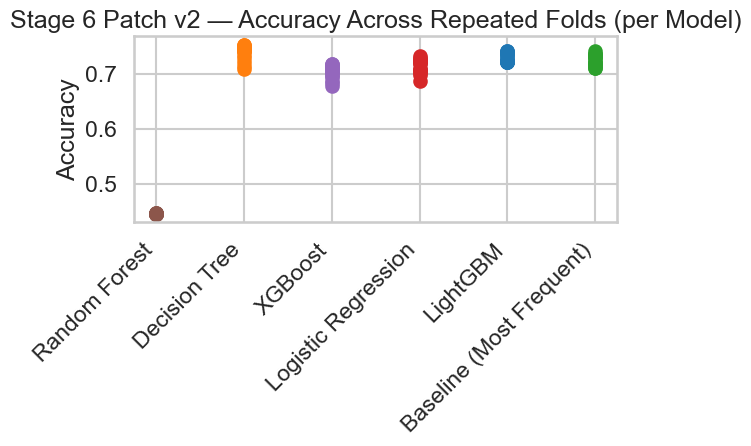

In [10]:
# ======================================================================
# STAGE 6 (PATCH v2) - Repeated Cross-Validation with Perfectly Aligned Folds
# ======================================================================
# What this step achieves (non-technical explanation):
# - We want a fair “apples-to-apples” comparison across models.
# - So we evaluate EVERY model (and the baseline) on the EXACT same train/test
#   splits, repeated multiple times to reduce randomness.
#
# Why repeated CV?
# - A single 5-fold CV gives 5 evaluation points per model.
# - Repeating it (e.g., 3 times) gives 15 evaluation points per model.
# - More paired observations => more reliable statistical tests in Stage 7.
#
# Important design choice:
# - We do NOT re-run GridSearch here (saves time and avoids “double-dipping”).
# - We lock in the best configurations found earlier (Stage 6 results).
#
# Output (used by Stage 7):
# - tables/final_per_fold.csv
#   One row per (model, repeat_id, fold_id) with:
#   accuracy, precision_macro, recall_macro, f1_macro, f1_weighted
#
# Prints:
# - Runtime per model
# - File saved confirmation
# - Quick sanity checks (rows per model, expected total rows)
# ======================================================================

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.pipeline import Pipeline

# Finalist estimators
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from xgboost import XGBClassifier

# LightGBM is optional — this keeps the code portable if LightGBM isn’t installed
INCLUDE_LGBM = True
HAS_LGBM = False
if INCLUDE_LGBM:
    try:
        from lightgbm import LGBMClassifier
        HAS_LGBM = True
    except Exception:
        HAS_LGBM = False
        print("[Stage 6 Patch v2] LightGBM not available -> skipping LightGBM.")


# ----------------------------------------------------------------------
# 0) Safety checks / data access
# ----------------------------------------------------------------------
# Why this matters:
# - This ensures we are evaluating the same exact prepared training set
#   used throughout the modelling pipeline.
assert "outputs" in globals(), "This patch requires the Stage 4 `outputs` dict in memory."

X = outputs["X_train"]
y = outputs["y_train"]
classes = outputs["classes"]
preprocessor = outputs["preprocessor"]

os.makedirs("tables", exist_ok=True)


# ----------------------------------------------------------------------
# 1) Cross-validation design (repeated + stratified)
# ----------------------------------------------------------------------
# Why this matters:
# - "Stratified" preserves class proportions in each fold (fairer for imbalance).
# - "Repeated" gives more evaluation points per model (more stable estimates).
RANDOM_STATE = 42
N_SPLITS = 5
N_REPEATS = 3  # 5 * 3 = 15 paired observations per model

rskf = RepeatedStratifiedKFold(
    n_splits=N_SPLITS,
    n_repeats=N_REPEATS,
    random_state=RANDOM_STATE
)

# Precompute all split indices ONCE, then reuse for every model:
# This guarantees perfect pairing across models and baseline.
split_indices = list(rskf.split(X, y))
expected_rows_per_model = len(split_indices)
print(f"[Stage 6 Patch v2] CV plan: {N_SPLITS} folds × {N_REPEATS} repeats = {expected_rows_per_model} evaluations per model.")


# ----------------------------------------------------------------------
# 2) Best model configurations (locked in; no re-grid-search)
# ----------------------------------------------------------------------
# Why this matters:
# - We avoid expensive re-tuning.
# - We evaluate the *chosen* final pipelines consistently and fairly.
BEST_PIPES = {}

BEST_PIPES["Decision Tree"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", DecisionTreeClassifier(
        random_state=RANDOM_STATE,
        max_depth=8,
        min_samples_split=2,
        min_samples_leaf=1,
        class_weight=None
    ))
])

BEST_PIPES["Random Forest"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", RandomForestClassifier(
        random_state=RANDOM_STATE,
        n_jobs=-1,
        n_estimators=600,
        max_depth=20,
        min_samples_split=2,
        min_samples_leaf=1,
        class_weight="balanced"
    ))
])

BEST_PIPES["Logistic Regression"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", LogisticRegression(
        multi_class="multinomial",
        solver="lbfgs",
        max_iter=2000,
        random_state=RANDOM_STATE,
        C=0.5,
        penalty="l2",
        class_weight=None
    ))
])

BEST_PIPES["XGBoost"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", XGBClassifier(
        objective="multi:softprob",
        num_class=len(classes),
        eval_metric="mlogloss",
        tree_method="hist",
        n_jobs=-1,
        random_state=RANDOM_STATE,
        n_estimators=300,
        max_depth=4,
        learning_rate=0.05,
        subsample=1.0,
        colsample_bytree=1.0
    ))
])

if HAS_LGBM:
    BEST_PIPES["LightGBM"] = Pipeline(steps=[
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", LGBMClassifier(
            objective="multiclass",
            num_class=len(classes),
            n_jobs=-1,
            random_state=RANDOM_STATE,
            n_estimators=400,
            num_leaves=31,
            learning_rate=0.05,
            min_child_samples=40,
            class_weight=None
        ))
    ])

# Baseline (Most Frequent) — always included to benchmark “do nothing smart” performance
BEST_PIPES["Baseline (Most Frequent)"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("clf", DummyClassifier(strategy="most_frequent"))
])

print("[Stage 6 Patch v2] Models evaluated:", list(BEST_PIPES.keys()))


# ----------------------------------------------------------------------
# 3) Metric function (single source of truth)
# ----------------------------------------------------------------------
# Why this matters:
# - Using one metric function guarantees consistent definitions across models.
def compute_metrics(y_true, y_pred):
    """Compute the evaluation metrics we later use for Stage 7 statistical tests."""
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted", zero_division=0),
    }


# ----------------------------------------------------------------------
# 4) Run repeated CV with paired splits (core computation)
# ----------------------------------------------------------------------
# Why this matters:
# - Every model sees the exact same folds in the exact same order.
# - This gives Stage 7 valid paired statistical tests (Wilcoxon/Friedman).
rows = []
t0 = time.time()

for model_name, pipe in BEST_PIPES.items():
    model_start = time.time()

    for i, (tr_idx, va_idx) in enumerate(split_indices):
        # Convert global split index -> repeat and fold identifiers
        repeat_id = i // N_SPLITS   # 0..N_REPEATS-1
        fold_id = i % N_SPLITS      # 0..N_SPLITS-1

        # Select training and validation partitions
        X_tr, X_va = X.iloc[tr_idx], X.iloc[va_idx]
        y_tr, y_va = y[tr_idx], y[va_idx]

        # Train on the training partition and evaluate on the validation partition
        pipe.fit(X_tr, y_tr)
        y_hat = pipe.predict(X_va)

        # Record metrics + identifiers (these identifiers enable perfect alignment later)
        met = compute_metrics(y_va, y_hat)
        met.update({
            "Model": model_name,       # Keep naming consistent with Stage 7 expectations
            "repeat_id": repeat_id,
            "fold_id": fold_id,
        })
        rows.append(met)

    print(f"[Stage 6 Patch v2] {model_name} completed "
          f"({expected_rows_per_model} evaluations) in {time.time() - model_start:.1f}s.")


# ----------------------------------------------------------------------
# 5) Save per-fold repeated CV results (Stage 7 input file)
# ----------------------------------------------------------------------
# Why this matters:
# - This file becomes the “ground truth” input for Stage 7 statistical testing.
per_fold_rep = pd.DataFrame(rows)

# Basic integrity checks before saving
total_expected = expected_rows_per_model * len(BEST_PIPES)
assert len(per_fold_rep) == total_expected, (
    f"Unexpected row count. Expected {total_expected}, got {len(per_fold_rep)}."
)

# Ensure no duplicate pairing keys (this prevents pivot crashes in Stage 7)
dups = per_fold_rep.duplicated(subset=["Model", "repeat_id", "fold_id"]).sum()
assert dups == 0, f"Duplicate (Model, repeat_id, fold_id) rows found: {dups}"

per_fold_rep = (
    per_fold_rep
    .sort_values(["Model", "repeat_id", "fold_id"])
    .reset_index(drop=True)
)

per_fold_path = "tables/final_per_fold.csv"
per_fold_rep.to_csv(per_fold_path, index=False)

print(f"\n[Stage 6 Patch v2] Saved: {per_fold_path}")
print(f"[Stage 6 Patch v2] Rows: {len(per_fold_rep)} | Models: {len(BEST_PIPES)} | "
      f"Folds×Repeats: {N_SPLITS}×{N_REPEATS} = {expected_rows_per_model} per model")
print(f"[Stage 6 Patch v2] Total runtime: {time.time() - t0:.1f}s")


# ----------------------------------------------------------------------
# 6) Print quick summaries (useful for the report narrative)
# ----------------------------------------------------------------------
# Why this matters:
# - Gives a simple view of average performance and variability across folds.
summary = (
    per_fold_rep
    .groupby("Model", as_index=False)
    .agg(
        acc_mean=("accuracy", "mean"),
        acc_std=("accuracy", "std"),
        f1_macro_mean=("f1_macro", "mean"),
        f1_macro_std=("f1_macro", "std"),
    )
    .sort_values("f1_macro_mean", ascending=False)
)

print("\n[Stage 6 Patch v2] Mean ± SD across all repeated folds:")
display(summary)


# ----------------------------------------------------------------------
# 7) Visualisations (stakeholder-friendly)
# ----------------------------------------------------------------------
# Why this matters:
# - People understand plots faster than tables.
# - These plots also help you sanity-check consistency across repeats/folds.

# Plot A: Macro-F1 distribution per model (simple strip plot)
plt.figure()
for m in summary["Model"].tolist():
    vals = per_fold_rep.loc[per_fold_rep["Model"] == m, "f1_macro"].values
    x = np.full_like(vals, fill_value=summary.index[summary["Model"] == m][0], dtype=float)
    plt.scatter(x, vals)

plt.xticks(range(len(summary)), summary["Model"], rotation=45, ha="right")
plt.ylabel("Macro-F1")
plt.title("Stage 6 Patch v2 — Macro-F1 Across Repeated Folds (per Model)")
plt.tight_layout()
plt.show()

# Plot B: Accuracy distribution per model (simple strip plot)
plt.figure()
for m in summary["Model"].tolist():
    vals = per_fold_rep.loc[per_fold_rep["Model"] == m, "accuracy"].values
    x = np.full_like(vals, fill_value=summary.index[summary["Model"] == m][0], dtype=float)
    plt.scatter(x, vals)

plt.xticks(range(len(summary)), summary["Model"], rotation=45, ha="right")
plt.ylabel("Accuracy")
plt.title("Stage 6 Patch v2 — Accuracy Across Repeated Folds (per Model)")
plt.tight_layout()
plt.show()

### STAGE 6 (PATCH v2) - PRINT ALL AVAILABLE OUTPUTS (Tables + Visuals)

[Stage 6 Patch v2 Outputs] Loaded: tables/final_per_fold.csv
  Shape: (90, 8)
  Columns: ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'f1_weighted', 'Model', 'repeat_id', 'fold_id']

[Data checks] Missing values per column:


accuracy           0
precision_macro    0
recall_macro       0
f1_macro           0
f1_weighted        0
Model              0
repeat_id          0
fold_id            0
dtype: int64


[Data checks] Rows per model (should be identical across models):


,n_rows
Model,
Baseline (Most Frequent),15
Decision Tree,15
LightGBM,15
Logistic Regression,15
Random Forest,15
XGBoost,15



[Data checks] Duplicate (Model, repeat_id, fold_id) rows: 0

[Preview] First 20 rows:


,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted,Model,repeat_id,fold_id
0,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),0,0
1,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),0,1
2,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),0,2
3,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),0,3
4,0.446886,0.111722,0.250000,0.154430,0.276051,Baseline (Most Frequent),0,4
5,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),1,0
6,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),1,1
7,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),1,2
8,0.445055,0.111264,0.250000,0.153992,0.274140,Baseline (Most Frequent),1,3
9,0.446886,0.111722,0.250000,0.154430,0.276051,Baseline (Most Frequent),1,4



[Summary] Mean ± Std across all repeated folds:


,Model,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted
0,Baseline (Most Frequent),0.445 ± 0.001,0.111 ± 0.000,0.250 ± 0.000,0.154 ± 0.000,0.275 ± 0.001
1,Decision Tree,0.738 ± 0.014,0.883 ± 0.048,0.613 ± 0.022,0.666 ± 0.022,0.719 ± 0.012
2,LightGBM,0.702 ± 0.013,0.720 ± 0.019,0.615 ± 0.019,0.649 ± 0.018,0.696 ± 0.012
3,Logistic Regression,0.714 ± 0.013,0.765 ± 0.020,0.612 ± 0.024,0.656 ± 0.023,0.704 ± 0.013
4,Random Forest,0.731 ± 0.008,0.807 ± 0.020,0.621 ± 0.017,0.671 ± 0.015,0.720 ± 0.009
5,XGBoost,0.726 ± 0.010,0.802 ± 0.028,0.612 ± 0.021,0.660 ± 0.019,0.711 ± 0.010


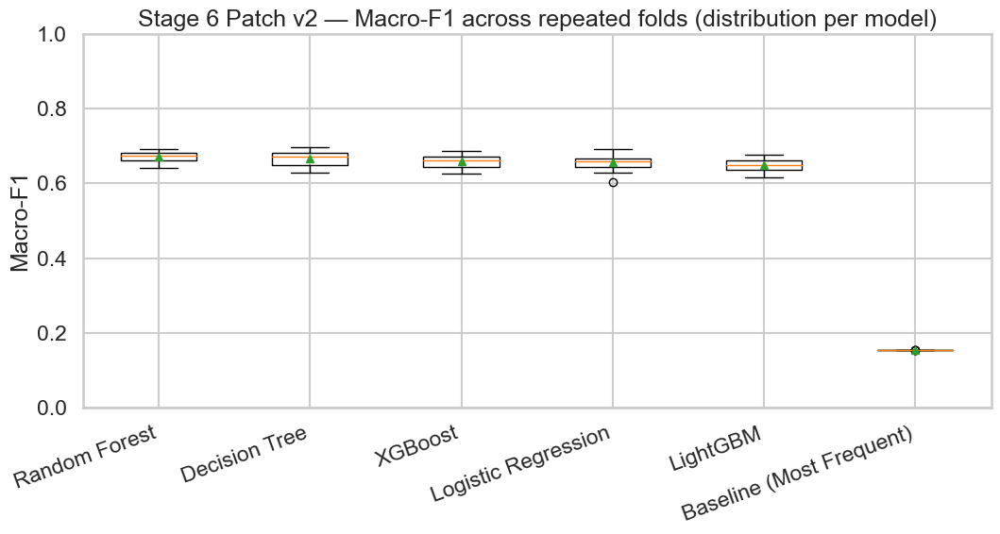

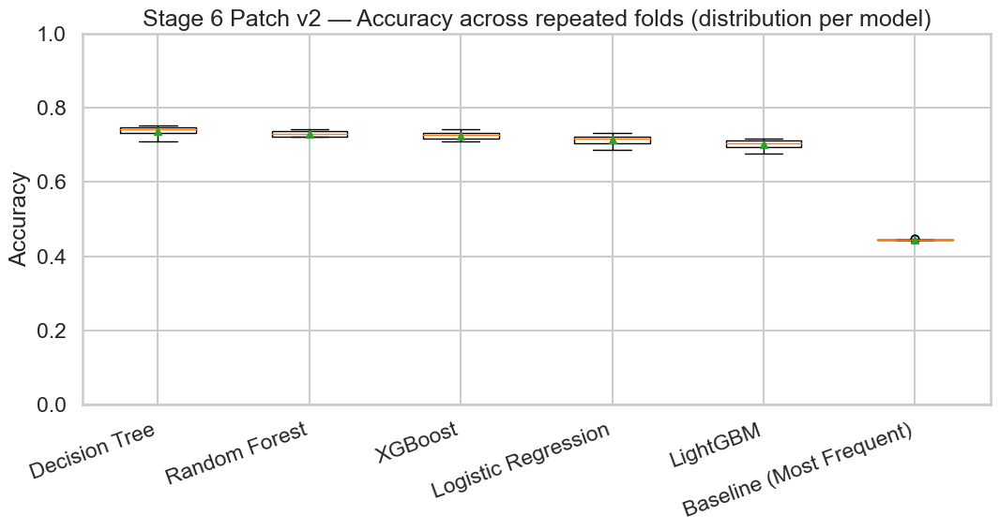

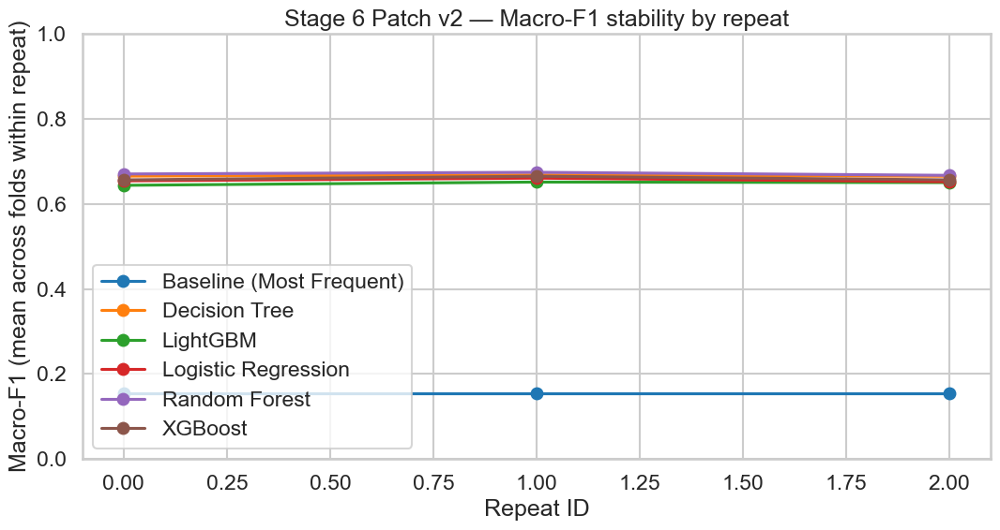


[Stage 6 Patch v2 Outputs] Done — printed all tables + visuals available from final_per_fold.csv.


In [11]:
# ======================================================================
# STAGE 6 (PATCH v2) - PRINT ALL AVAILABLE OUTPUTS (Tables + Visuals)
# ======================================================================
# Non-technical summary:
# - This cell does NOT train any model.
# - It simply loads the saved evaluation file (final_per_fold.csv),
#   prints the key tables stakeholders care about, and generates a few
#   visuals that make performance differences easy to understand.
#
# What you will see printed:
# 1) A preview of the data and sanity checks (rows, columns, missing values)
# 2) Per-model averages and variability ("mean ± std") for each metric
# 3) Plots showing the distribution of Macro-F1 and Accuracy per model
# 4) A repeat-stability plot showing whether performance is consistent
#    across repeats (helps show robustness, not “one lucky split”).
#
# Input:
# - tables/final_per_fold.csv (produced by Stage 6 Patch v2)
# ======================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display

# -----------------------------
# 0) Locate the saved per-fold file
# -----------------------------
csv_path = "tables/final_per_fold.csv"

if not os.path.exists(csv_path):
    print(f"[Stage 6 Patch v2 Outputs] Not found: {csv_path}")
    print("-> Run the Stage 6 Patch v2 training cell first to generate this file.")
else:
    # -----------------------------
    # 1) Load data
    # -----------------------------
    per_fold = pd.read_csv(csv_path)
    print(f"[Stage 6 Patch v2 Outputs] Loaded: {csv_path}")
    print(f"  Shape: {per_fold.shape}")
    print(f"  Columns: {list(per_fold.columns)}")

    # -----------------------------
    # 2) Normalise column names (robustness)
    # -----------------------------
    # Why this matters:
    # - Some earlier versions used 'model' and others used 'Model'.
    # - We standardise to 'Model' so all downstream code is consistent.
    if "Model" not in per_fold.columns and "model" in per_fold.columns:
        per_fold = per_fold.rename(columns={"model": "Model"})
        print("[Stage 6 Patch v2 Outputs] Renamed column 'model' -> 'Model' for consistency.")

    # -----------------------------
    # 3) Basic data quality checks
    # -----------------------------
    # Why this matters:
    # - If there are missing values or duplicate keys, Stage 7 stats can break.
    expected_metrics = ["accuracy", "precision_macro", "recall_macro", "f1_macro", "f1_weighted"]
    expected_keys = ["Model", "repeat_id", "fold_id"]

    print("\n[Data checks] Missing values per column:")
    display(per_fold.isna().sum().sort_values(ascending=False))

    # Ensure numeric metrics are numeric (protects against accidental string parsing)
    for c in expected_metrics:
        if c in per_fold.columns:
            per_fold[c] = pd.to_numeric(per_fold[c], errors="coerce")

    # Print row counts per model (stakeholder-friendly sanity check)
    print("\n[Data checks] Rows per model (should be identical across models):")
    display(per_fold["Model"].value_counts().to_frame("n_rows"))

    # Duplicate key check: (Model, repeat_id, fold_id) should be unique
    if set(expected_keys).issubset(per_fold.columns):
        dup_count = per_fold.duplicated(subset=expected_keys).sum()
        print(f"\n[Data checks] Duplicate (Model, repeat_id, fold_id) rows: {dup_count}")
        if dup_count > 0:
            display(per_fold.loc[per_fold.duplicated(subset=expected_keys, keep=False)].head(20))

    # -----------------------------
    # 4) Preview table (what stakeholders will see first)
    # -----------------------------
    print("\n[Preview] First 20 rows:")
    display(per_fold.head(20))

    # -----------------------------
    # 5) Summary table: mean ± std per model (main stakeholder table)
    # -----------------------------
    # Why this matters:
    # - “Mean” shows typical performance.
    # - “Std” shows consistency (lower is more stable/reliable).
    available_metrics = [m for m in expected_metrics if m in per_fold.columns]

    def fmt_mean_sd(series):
        mu = series.mean()
        sd = series.std()
        return f"{mu:.3f} ± {sd:.3f}"

    summary = (
        per_fold
        .groupby("Model")[available_metrics]
        .agg(fmt_mean_sd)
        .reset_index()
    )

    print("\n[Summary] Mean ± Std across all repeated folds:")
    display(summary)

    # -----------------------------
    # 6) Visual 1 — Macro-F1 distribution per model
    # -----------------------------
    # Why this matters:
    # - Shows performance spread (not just averages).
    # - If boxes overlap heavily, “differences” may be small/unstable.
    if "f1_macro" in per_fold.columns:
        # Order models by median Macro-F1 (best to worst)
        order = (
            per_fold.groupby("Model")["f1_macro"]
            .median()
            .sort_values(ascending=False)
            .index
            .tolist()
        )

        data = [per_fold.loc[per_fold["Model"] == m, "f1_macro"].values for m in order]

        plt.figure(figsize=(11, 6))
        plt.boxplot(data, labels=order, showmeans=True)
        plt.ylim(0, 1)
        plt.xticks(rotation=20, ha="right")
        plt.ylabel("Macro-F1")
        plt.title("Stage 6 Patch v2 — Macro-F1 across repeated folds (distribution per model)")
        plt.tight_layout()
        plt.show()

    # -----------------------------
    # 7) Visual 2 — Accuracy distribution per model
    # -----------------------------
    # Why this matters:
    # - Stage 7 compares models vs baseline on Accuracy too.
    if "accuracy" in per_fold.columns:
        order = (
            per_fold.groupby("Model")["accuracy"]
            .median()
            .sort_values(ascending=False)
            .index
            .tolist()
        )
        data = [per_fold.loc[per_fold["Model"] == m, "accuracy"].values for m in order]

        plt.figure(figsize=(11, 6))
        plt.boxplot(data, labels=order, showmeans=True)
        plt.ylim(0, 1)
        plt.xticks(rotation=20, ha="right")
        plt.ylabel("Accuracy")
        plt.title("Stage 6 Patch v2 — Accuracy across repeated folds (distribution per model)")
        plt.tight_layout()
        plt.show()

    # -----------------------------
    # 8) Visual 3 — Repeat stability for Macro-F1 (mean per repeat)
    # -----------------------------
    # Why this matters:
    # - If a model swings a lot by repeat, performance is less reliable.
    if {"repeat_id", "fold_id", "f1_macro"}.issubset(per_fold.columns):
        tmp = (
            per_fold
            .groupby(["Model", "repeat_id"])["f1_macro"]
            .mean()
            .reset_index()
            .sort_values(["Model", "repeat_id"])
        )

        plt.figure(figsize=(11, 6))
        for m in tmp["Model"].unique():
            sub = tmp[tmp["Model"] == m]
            plt.plot(sub["repeat_id"], sub["f1_macro"], marker="o", label=m)

        plt.ylim(0, 1)
        plt.xlabel("Repeat ID")
        plt.ylabel("Macro-F1 (mean across folds within repeat)")
        plt.title("Stage 6 Patch v2 — Macro-F1 stability by repeat")
        plt.legend(frameon=True)
        plt.tight_layout()
        plt.show()

    print("\n[Stage 6 Patch v2 Outputs] Done — printed all tables + visuals available from final_per_fold.csv.")

### STAGE 7 - STATISTICAL COMPARISONS (Updated for Repeated CV; paired tests)

[Stage 7] Models present: ['Baseline (Most Frequent)', 'Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']
[Stage 7] Duplicate (model, rep_fold) rows: 0

[Stage 7] Paired blocks available (repeat×fold rows) for finalists: 15
[Stage 7] Finalists: ['Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']

=== Stage 7 — Friedman summary (macro-F1; finalists only) ===
χ² = 29.707, p = 0.0000 -> SIGNIFICANT at α=0.05

[Stage 7] Saved: tables/stats_tests.csv
[Stage 7] Saved: tables/baseline_vs_models.csv

=== Stage 7 — stats_tests.csv (Friedman + pairwise if applicable) ===


,test,metric,k_models,n_blocks,statistic,p_raw,significant_0.05,model_a,model_b,n_pairs,wilcoxon_W,effect_size_r,p_holm
0,Friedman,f1_macro,5.0,15.0,29.706667,0.000006,True,NaN,NaN,NaN,NaN,NaN,NaN
1,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.002162,True,Decision Tree,LightGBM,15.0,6.0,0.791894,0.017298
2,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.001470,True,Decision Tree,Logistic Regression,15.0,4.0,0.821224,0.013228
3,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.211476,False,Decision Tree,Random Forest,15.0,38.0,0.322624,0.422953
4,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.012453,False,Decision Tree,XGBoost,15.0,16.0,0.645247,0.062267
5,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.040888,False,LightGBM,Logistic Regression,15.0,24.0,0.527930,0.122664
6,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.000655,True,LightGBM,Random Forest,15.0,0.0,0.879883,0.006550
7,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.023096,False,LightGBM,XGBoost,15.0,20.0,0.586588,0.092383
8,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.003772,True,Logistic Regression,Random Forest,15.0,9.0,0.747900,0.026406
9,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.334277,False,Logistic Regression,XGBoost,15.0,43.0,0.249300,0.422953



=== Stage 7 — baseline_vs_models.csv (one-sided vs baseline; Holm per metric) ===


,metric,model,n_pairs,mean_model,mean_baseline,wilcoxon_W,p_raw,effect_size_r,p_holm,significant_0.05
0,f1_macro,Decision Tree,15,0.666396,0.154080,120.0,0.000327,0.879883,0.001637,True
1,f1_macro,LightGBM,15,0.648651,0.154080,120.0,0.000327,0.879883,0.001637,True
2,f1_macro,Logistic Regression,15,0.655837,0.154080,120.0,0.000327,0.879883,0.001637,True
3,f1_macro,Random Forest,15,0.670857,0.154080,120.0,0.000327,0.879883,0.001637,True
4,f1_macro,XGBoost,15,0.659602,0.154080,120.0,0.000327,0.879883,0.001637,True
5,accuracy,Random Forest,15,0.730525,0.445421,120.0,0.000320,0.881484,0.001601,True
6,accuracy,Decision Tree,15,0.738217,0.445421,120.0,0.000323,0.880949,0.001601,True
7,accuracy,Logistic Regression,15,0.714042,0.445421,120.0,0.000323,0.880949,0.001601,True
8,accuracy,LightGBM,15,0.702442,0.445421,120.0,0.000325,0.880415,0.001601,True
9,accuracy,XGBoost,15,0.725519,0.445421,120.0,0.000325,0.880415,0.001601,True


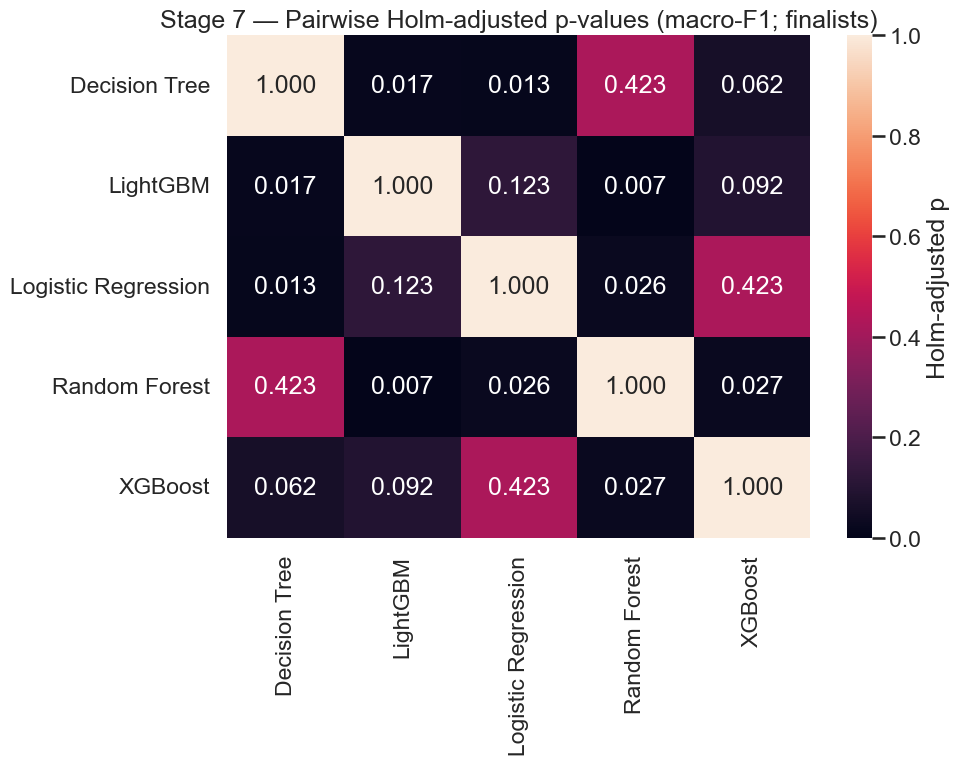

[Stage 7] Saved figure: figures/stage7_pairwise_p_holm_heatmap.png


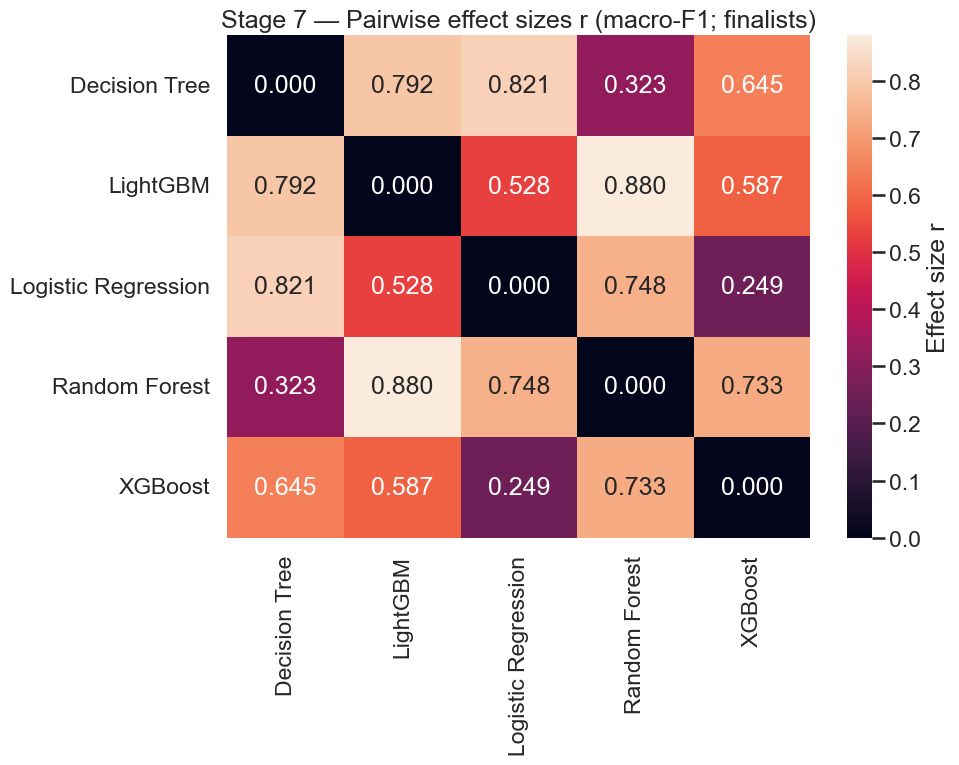

[Stage 7] Saved figure: figures/stage7_pairwise_effect_r_heatmap.png


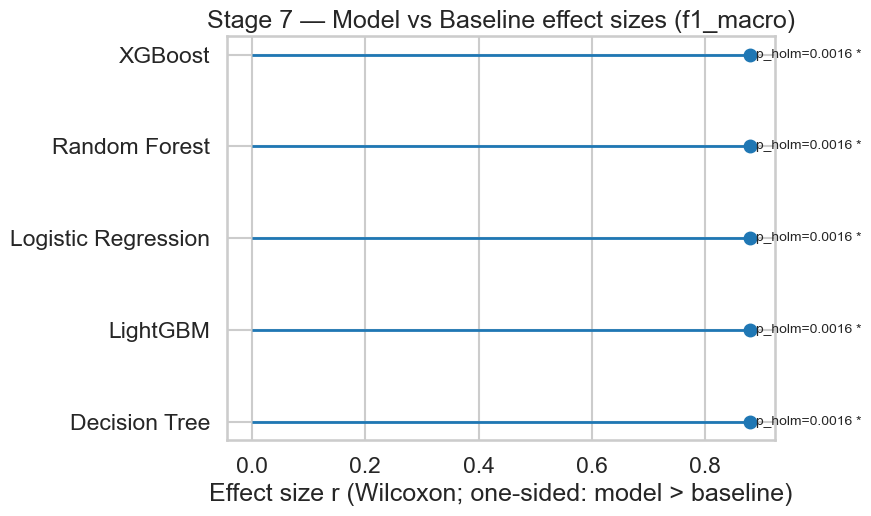

[Stage 7] Saved figure: figures/stage7_baseline_lollipop_f1_macro.png


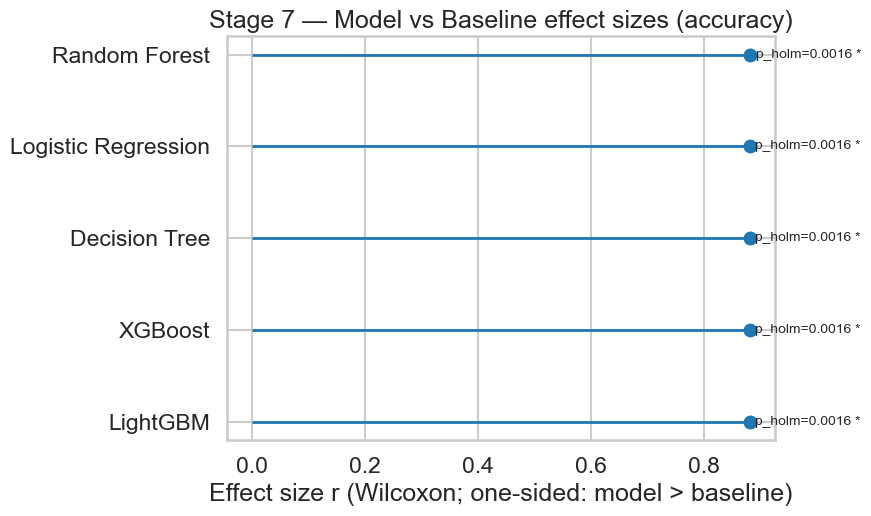

[Stage 7] Saved figure: figures/stage7_baseline_lollipop_accuracy.png

=== Stage 7 — Interpretation summary ===
Overall (Friedman on macro-F1, finalists only): p = 0.0000 -> evidence of differences among finalists at α=0.05.
Post-hoc: 5 finalist pair(s) differ after Holm correction:


,model_a,model_b,p_holm,effect_size_r,n_pairs
5,LightGBM,Random Forest,0.006550,0.879883,15
1,Decision Tree,Logistic Regression,0.013228,0.821224,15
0,Decision Tree,LightGBM,0.017298,0.791894,15
7,Logistic Regression,Random Forest,0.026406,0.747900,15
9,Random Forest,XGBoost,0.027084,0.733236,15


Baseline comparisons: models that beat the baseline after Holm (by metric):


,metric,model,p_holm,effect_size_r,n_pairs,mean_model,mean_baseline
5,accuracy,Random Forest,0.001601,0.881484,15,0.730525,0.445421
6,accuracy,Decision Tree,0.001601,0.880949,15,0.738217,0.445421
7,accuracy,Logistic Regression,0.001601,0.880949,15,0.714042,0.445421
8,accuracy,LightGBM,0.001601,0.880415,15,0.702442,0.445421
9,accuracy,XGBoost,0.001601,0.880415,15,0.725519,0.445421
0,f1_macro,Decision Tree,0.001637,0.879883,15,0.666396,0.154080
1,f1_macro,LightGBM,0.001637,0.879883,15,0.648651,0.154080
2,f1_macro,Logistic Regression,0.001637,0.879883,15,0.655837,0.154080
3,f1_macro,Random Forest,0.001637,0.879883,15,0.670857,0.154080
4,f1_macro,XGBoost,0.001637,0.879883,15,0.659602,0.154080



[Stage 7] Completed — all tables and visuals printed and saved.


In [12]:
# ======================================================================
# STAGE 7 - STATISTICAL COMPARISONS (Updated for Repeated CV; paired tests) After Stage 6 Patch v2
# ======================================================================
# Plain-English purpose:
# We tested several ML models plus a simple baseline using the *same* repeated
# cross-validation folds. Because every model was evaluated on the same folds,
# we can compare them fairly using paired statistical tests.
#
# What we answer here:
# 1) Do finalist models differ overall in macro-F1?  (Friedman test)
# 2) If yes, which pairs differ?                    (Wilcoxon post-hoc + Holm)
# 3) Does each finalist beat the baseline?          (Wilcoxon one-sided + Holm)
#
# Inputs:
# - tables/final_per_fold.csv (from Stage 6 Patch v2)
#
# Outputs (saved + printed):
# - tables/stats_tests.csv           (Friedman + post-hoc pairwise comparisons)
# - tables/baseline_vs_models.csv    (each model vs baseline for macro-F1 & accuracy)
# - figures/stage7_*.png             (heatmaps + lollipop plots)
# ======================================================================

import os
import itertools
import numpy as np
import pandas as pd
import scipy.stats as ss
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# -----------------------------
# 0) Load repeated-CV per-fold file and validate it
# -----------------------------
# Stakeholder note:
# This step simply loads the saved evaluation results produced earlier.
# We verify the file has the columns we need to run fair statistical tests.

PERF_PATH = "tables/final_per_fold.csv"
assert os.path.exists(PERF_PATH), f"Missing {PERF_PATH}. Run Stage 6 Patch v2 first."

df = pd.read_csv(PERF_PATH)

# Standardise column names so the rest of the code is consistent
# (some earlier versions used "Model" instead of "model")
df.columns = [c.strip() for c in df.columns]
if "Model" in df.columns and "model" not in df.columns:
    df = df.rename(columns={"Model": "model"})

required = {"model", "repeat_id", "fold_id", "accuracy", "f1_macro"}
missing = required - set(df.columns)
assert not missing, f"final_per_fold.csv missing columns: {missing}"

# Ensure IDs and metrics are numeric (prevents subtle string/number issues)
df["repeat_id"] = pd.to_numeric(df["repeat_id"], errors="coerce")
df["fold_id"]   = pd.to_numeric(df["fold_id"], errors="coerce")
df["accuracy"]  = pd.to_numeric(df["accuracy"], errors="coerce")
df["f1_macro"]  = pd.to_numeric(df["f1_macro"], errors="coerce")

# Drop rows with missing essentials (keeps tests clean and honest)
df = df.dropna(subset=["model", "repeat_id", "fold_id", "accuracy", "f1_macro"]).copy()

# Create a strict pairing key: each repeated-fold evaluation is one comparable unit
# Example: repeat 2, fold 4 becomes "2_4"
df["rep_fold"] = df["repeat_id"].astype(int).astype(str) + "_" + df["fold_id"].astype(int).astype(str)

BASE = "Baseline (Most Frequent)"
models_all = sorted(df["model"].unique().tolist())
print("[Stage 7] Models present:", models_all)
assert BASE in models_all, f"Baseline '{BASE}' not found. Got: {models_all}"

# Check for duplicates that would break paired testing
# Stakeholder note:
# If we accidentally have multiple entries for the same model on the same fold,
# the results become ambiguous, so we stop and fix the data.
dups = df.duplicated(subset=["model", "rep_fold"]).sum()
print(f"[Stage 7] Duplicate (model, rep_fold) rows: {dups}")
if dups > 0:
    display(df[df.duplicated(subset=["model", "rep_fold"], keep=False)].head(20))
    raise ValueError("Duplicate (model, rep_fold) entries found — cannot run paired tests safely.")

# -----------------------------
# 1) Build paired matrices (rows = same fold; columns = each model)
# -----------------------------
# Stakeholder note:
# This step reshapes data into a “like-for-like” comparison table:
# each row is the same test fold, and each column is one model’s score on that fold.

def metric_matrix(metric: str) -> pd.DataFrame:
    wide = df.pivot(index="rep_fold", columns="model", values=metric)
    # Keep only folds present for all models (perfectly fair comparison)
    wide = wide.dropna(axis=0, how="any")
    return wide

wide_f1_all  = metric_matrix("f1_macro")
wide_acc_all = metric_matrix("accuracy")

finalists = [m for m in wide_f1_all.columns.tolist() if m != BASE]
assert len(finalists) >= 2, "Need at least 2 finalist models for Friedman."

wide_f1 = wide_f1_all[finalists].copy()
n_blocks = wide_f1.shape[0]

print(f"\n[Stage 7] Paired blocks available (repeat×fold rows) for finalists: {n_blocks}")
print("[Stage 7] Finalists:", finalists)

# -----------------------------
# 2) Holm correction helper (controls false positives across many tests)
# -----------------------------
# Stakeholder note:
# When we run many pairwise tests, some may look “significant” by chance.
# Holm correction reduces that risk by adjusting p-values.

def holm_adjust(pvals: np.ndarray) -> np.ndarray:
    pvals = np.asarray(pvals, dtype=float)
    m = len(pvals)
    order = np.argsort(pvals)
    adj = np.empty(m, dtype=float)
    prev = 0.0
    for k, idx in enumerate(order):
        adj_val = (m - k) * pvals[idx]
        adj_val = max(adj_val, prev)      # enforce non-decreasing adjusted p-values
        adj[idx] = min(adj_val, 1.0)      # cap at 1
        prev = adj[idx]
    return adj

# Effect size helper: r ≈ |Z| / sqrt(n)
# Stakeholder note:
# p-values tell us “is there evidence of a difference?”
# effect size tells us “how big is that difference (practically)?”
def effect_r_from_p(p: float, n: int, two_sided: bool) -> float:
    if n <= 0 or not np.isfinite(p):
        return np.nan
    p = min(max(p, 1e-12), 1.0)
    z = ss.norm.isf(p / 2.0) if two_sided else ss.norm.isf(p)
    return float(abs(z) / np.sqrt(n))

# -----------------------------
# 3) Overall test: Do finalists differ in macro-F1? (Friedman)
# -----------------------------
fried_stat, fried_p = ss.friedmanchisquare(*[wide_f1[m].values for m in finalists])

print("\n=== Stage 7 — Friedman summary (macro-F1; finalists only) ===")
print(f"χ² = {fried_stat:.3f}, p = {fried_p:.4f} -> {'SIGNIFICANT' if fried_p < 0.05 else 'not significant'} at α=0.05")

friedman_row = {
    "test": "Friedman",
    "metric": "f1_macro",
    "k_models": int(len(finalists)),
    "n_blocks": int(n_blocks),
    "statistic": float(fried_stat),
    "p_raw": float(fried_p),
    "significant_0.05": bool(fried_p < 0.05),
}

# -----------------------------
# 4) If overall difference exists, run pairwise comparisons (post-hoc)
#    Wilcoxon two-sided + Holm correction (macro-F1)
# -----------------------------
pairwise_df = pd.DataFrame(columns=[
    "test","metric","model_a","model_b","n_pairs","wilcoxon_W","p_raw","p_holm","significant_0.05","effect_size_r"
])

if fried_p < 0.05:
    pairwise_rows = []
    pairs = list(itertools.combinations(finalists, 2))

    for a, b in pairs:
        xa = wide_f1[a].values
        xb = wide_f1[b].values

        # Remove ties (where both models scored the same on a fold)
        diff = xa - xb
        nz = diff != 0
        xa2, xb2 = xa[nz], xb[nz]
        n_eff = int(len(xa2))

        if n_eff == 0:
            W = np.nan
            p = 1.0
        else:
            w = ss.wilcoxon(xa2, xb2, zero_method="wilcox", alternative="two-sided", method="approx")
            W = float(w.statistic)
            p = float(w.pvalue)

        r = effect_r_from_p(p, n_eff, two_sided=True)

        pairwise_rows.append({
            "test": "Wilcoxon (pairwise, Holm)",
            "metric": "f1_macro",
            "model_a": a,
            "model_b": b,
            "n_pairs": n_eff,
            "wilcoxon_W": W,
            "p_raw": p,
            "effect_size_r": r,
        })

    pairwise_df = pd.DataFrame(pairwise_rows)
    pairwise_df["p_holm"] = holm_adjust(pairwise_df["p_raw"].values)
    pairwise_df["significant_0.05"] = pairwise_df["p_holm"] < 0.05

# -----------------------------
# 5) Baseline comparisons (model > baseline), Holm per metric family
# -----------------------------
# Stakeholder note:
# This directly supports the claim: “Each finalist improves over the baseline.”
# We run the test separately for macro-F1 and for accuracy (different constructs),
# and correct within each family.

def baseline_vs_models(metric: str, wide_metric: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for m in finalists:
        xa = wide_metric[m].values
        xb = wide_metric[BASE].values

        diff = xa - xb
        nz = diff != 0
        xa2, xb2 = xa[nz], xb[nz]
        n_eff = int(len(xa2))

        if n_eff == 0:
            W = np.nan
            p = 1.0
        else:
            w = ss.wilcoxon(xa2, xb2, zero_method="wilcox", alternative="greater", method="approx")
            W = float(w.statistic)
            p = float(w.pvalue)

        r = effect_r_from_p(p, n_eff, two_sided=False)

        rows.append({
            "metric": metric,
            "model": m,
            "n_pairs": n_eff,
            "mean_model": float(np.mean(xa)),
            "mean_baseline": float(np.mean(xb)),
            "wilcoxon_W": W,
            "p_raw": p,
            "effect_size_r": r,
        })

    out = pd.DataFrame(rows)
    out["p_holm"] = holm_adjust(out["p_raw"].values)
    out["significant_0.05"] = out["p_holm"] < 0.05
    return out.sort_values("p_raw")

base_f1  = baseline_vs_models("f1_macro", wide_f1_all[[*finalists, BASE]])
base_acc = baseline_vs_models("accuracy",  wide_acc_all[[*finalists, BASE]])
baseline_df = pd.concat([base_f1, base_acc], ignore_index=True)

# -----------------------------
# 6) Save outputs (and print tables for screenshots)
# -----------------------------
os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

stats_tests = pd.concat([pd.DataFrame([friedman_row]), pairwise_df], ignore_index=True)

stats_path = "tables/stats_tests.csv"
base_path  = "tables/baseline_vs_models.csv"

stats_tests.to_csv(stats_path, index=False)
baseline_df.to_csv(base_path, index=False)

print(f"\n[Stage 7] Saved: {stats_path}")
print(f"[Stage 7] Saved: {base_path}")

print("\n=== Stage 7 — stats_tests.csv (Friedman + pairwise if applicable) ===")
display(stats_tests)

print("\n=== Stage 7 — baseline_vs_models.csv (one-sided vs baseline; Holm per metric) ===")
display(baseline_df)

# -----------------------------
# 7) Visuals (printed + saved)
# -----------------------------
# 7A) Pairwise heatmaps (only if post-hoc ran)
if not pairwise_df.empty:
    model_list = sorted(set(pairwise_df["model_a"]).union(set(pairwise_df["model_b"])))

    # Build matrices
    pmat = pd.DataFrame(1.0, index=model_list, columns=model_list, dtype=float)
    rmat = pd.DataFrame(np.nan, index=model_list, columns=model_list, dtype=float)
    np.fill_diagonal(rmat.values, 0.0)

    for _, row in pairwise_df.iterrows():
        a, b = row["model_a"], row["model_b"]
        pmat.loc[a, b] = row["p_holm"]
        pmat.loc[b, a] = row["p_holm"]
        rmat.loc[a, b] = row["effect_size_r"]
        rmat.loc[b, a] = row["effect_size_r"]

    plt.figure(figsize=(10, 8))
    sns.heatmap(pmat, annot=True, fmt=".3f", vmin=0, vmax=1, cbar_kws={"label": "Holm-adjusted p"})
    plt.title("Stage 7 — Pairwise Holm-adjusted p-values (macro-F1; finalists)")
    plt.tight_layout()
    out = "figures/stage7_pairwise_p_holm_heatmap.png"
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Stage 7] Saved figure: {out}")

    plt.figure(figsize=(10, 8))
    vmax = np.nanmax(rmat.values) if np.isfinite(np.nanmax(rmat.values)) else 1.0
    sns.heatmap(rmat, annot=True, fmt=".3f", vmin=0, vmax=vmax, cbar_kws={"label": "Effect size r"})
    plt.title("Stage 7 — Pairwise effect sizes r (macro-F1; finalists)")
    plt.tight_layout()
    out = "figures/stage7_pairwise_effect_r_heatmap.png"
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Stage 7] Saved figure: {out}")
else:
    print("[Stage 7] No pairwise heatmaps (post-hoc skipped because Friedman was not significant).")

# 7B) Baseline lollipop plots per metric
for met in ["f1_macro", "accuracy"]:
    sub = baseline_df[baseline_df["metric"] == met].copy()
    if sub.empty:
        continue

    sub = sub.sort_values("effect_size_r", ascending=True).reset_index(drop=True)

    plt.figure(figsize=(9, 5.5))
    y = np.arange(len(sub))
    plt.hlines(y=y, xmin=0, xmax=sub["effect_size_r"], linewidth=2)
    plt.plot(sub["effect_size_r"], y, "o")

    plt.yticks(y, sub["model"])
    plt.xlabel("Effect size r (Wilcoxon; one-sided: model > baseline)")
    plt.title(f"Stage 7 — Model vs Baseline effect sizes ({met})")

    for i, row in sub.iterrows():
        star = " *" if row["p_holm"] < 0.05 else ""
        plt.text(float(row["effect_size_r"]) + 0.01, i, f"p_holm={row['p_holm']:.4f}{star}",
                 va="center", fontsize=10)

    plt.tight_layout()
    out = f"figures/stage7_baseline_lollipop_{met}.png"
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Stage 7] Saved figure: {out}")

# -----------------------------
# 8) Short console interpretation (copy/paste into Results chapter)
# -----------------------------
alpha = 0.05
print("\n=== Stage 7 — Interpretation summary ===")
print(f"Overall (Friedman on macro-F1, finalists only): p = {fried_p:.4f} "
      f"-> {'evidence of differences among finalists' if fried_p < alpha else 'no evidence of differences'} at α=0.05.")

if not pairwise_df.empty:
    sig_pairs = pairwise_df[pairwise_df["p_holm"] < alpha].copy()
    if len(sig_pairs):
        print(f"Post-hoc: {len(sig_pairs)} finalist pair(s) differ after Holm correction:")
        display(sig_pairs[["model_a","model_b","p_holm","effect_size_r","n_pairs"]].sort_values("p_holm"))
    else:
        print("Post-hoc: no pairwise differences remain significant after Holm correction.")

sig_base = baseline_df[baseline_df["p_holm"] < alpha].copy()
if len(sig_base):
    print("Baseline comparisons: models that beat the baseline after Holm (by metric):")
    display(sig_base[["metric","model","p_holm","effect_size_r","n_pairs","mean_model","mean_baseline"]]
            .sort_values(["metric","p_holm"]))
else:
    print("Baseline comparisons: no finalist beats baseline after Holm (unexpected; check baseline definition).")

print("\n[Stage 7] Completed — all tables and visuals printed and saved.")

### STAGE 7 - Pairwise Model Comparisons Viewer (Baseline excluded)

Pairwise viewer: loaded tables/stats_tests.csv
  • Pairwise rows kept after exclusions: 10


,metric,model_a,model_b,n_pairs,wilcoxon_W,p_raw,p_holm,effect_size_r,significant_0.05
0,f1_macro,Decision Tree,LightGBM,15,6,0.0022,0.0173,0.792,True
1,f1_macro,Decision Tree,Logistic Regression,15,4,0.0015,0.0132,0.821,True
2,f1_macro,Decision Tree,Random Forest,15,38,0.2115,0.4230,0.323,False
3,f1_macro,Decision Tree,XGBoost,15,16,0.0125,0.0623,0.645,False
4,f1_macro,LightGBM,Logistic Regression,15,24,0.0409,0.1227,0.528,False
5,f1_macro,LightGBM,Random Forest,15,0,0.0007,0.0065,0.880,True
6,f1_macro,LightGBM,XGBoost,15,20,0.0231,0.0924,0.587,False
7,f1_macro,Logistic Regression,Random Forest,15,9,0.0038,0.0264,0.748,True
8,f1_macro,Logistic Regression,XGBoost,15,43,0.3343,0.4230,0.249,False
9,f1_macro,Random Forest,XGBoost,15,10,0.0045,0.0271,0.733,True


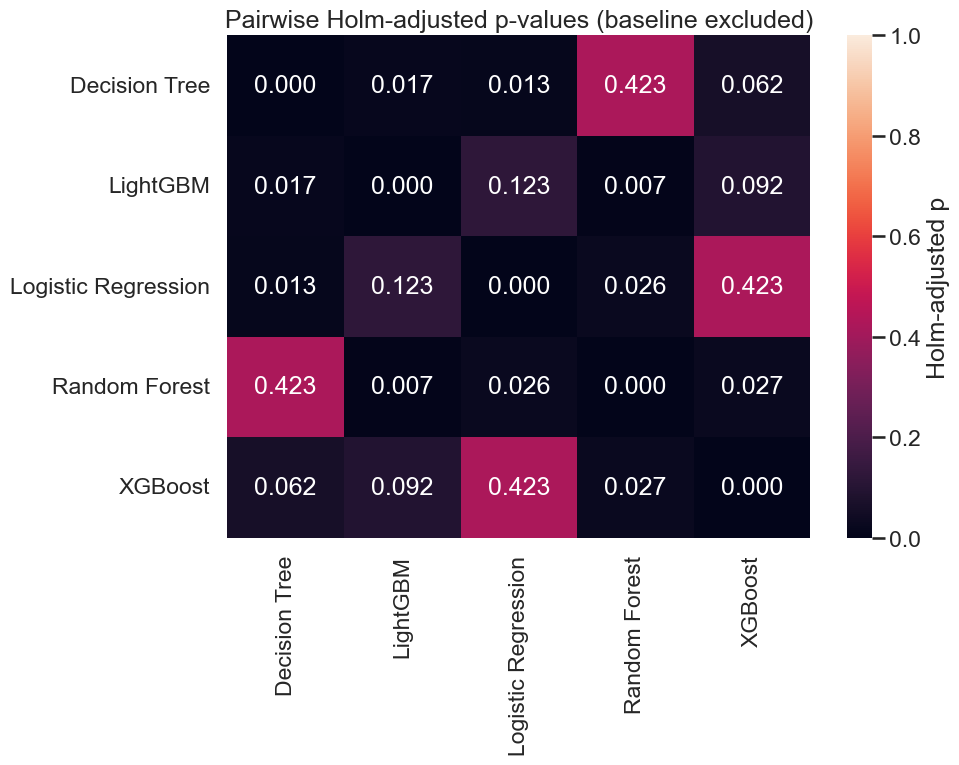

Saved: figures\stage7_pairwise_p_holm_heatmap.png


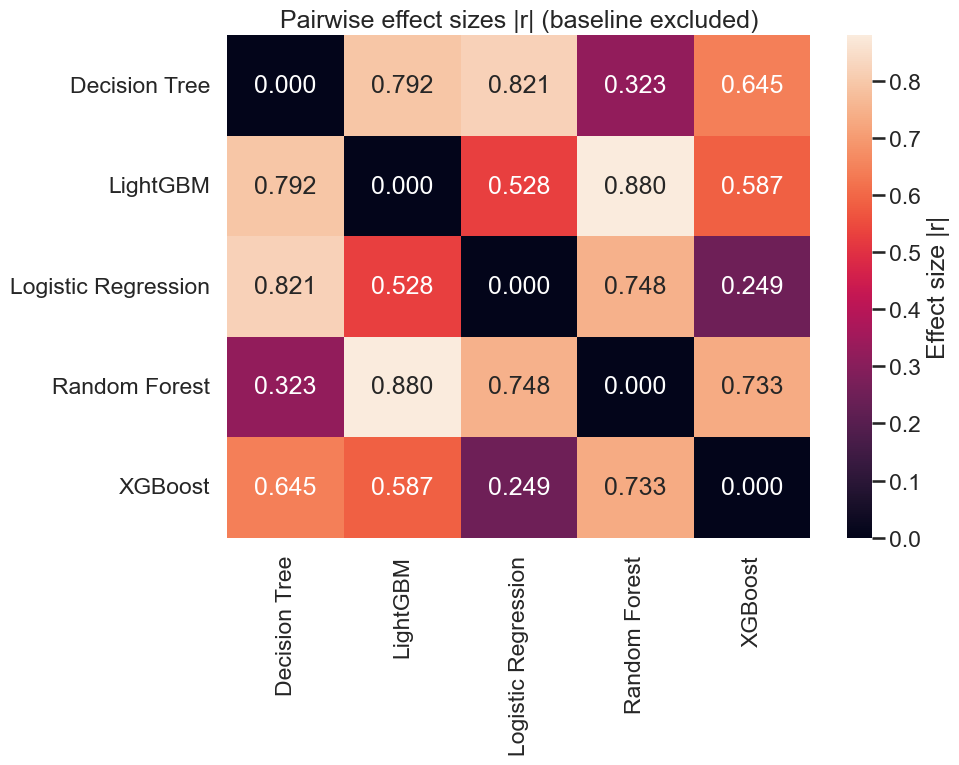

Saved: figures\stage7_pairwise_effect_r_heatmap.png

Summary (baseline excluded)
  • Significant pairwise differences after Holm: 5


,metric,model_a,model_b,p_holm,effect_size_r,n_pairs
5,f1_macro,LightGBM,Random Forest,0.006550,0.879883,15.0
1,f1_macro,Decision Tree,Logistic Regression,0.013228,0.821224,15.0
0,f1_macro,Decision Tree,LightGBM,0.017298,0.791894,15.0
7,f1_macro,Logistic Regression,Random Forest,0.026406,0.747900,15.0
9,f1_macro,Random Forest,XGBoost,0.027084,0.733236,15.0


In [13]:
# ===============================================================
# STAGE 7 - Pairwise Model Comparisons Viewer (Baseline excluded)
# ===============================================================
# Purpose:
# This viewer reads the *pairwise* statistical results produced in Stage 7
# (tables/stats_tests.csv) and creates easy-to-read outputs for reporting:
#   1) A formatted table of pairwise comparisons
#   2) A heatmap of Holm-adjusted p-values (strength of statistical evidence)
#   3) A heatmap of absolute effect sizes |r| (size of differences)
#   4) A short text summary of significant differences
#
# Why baseline is excluded:
# The baseline is a reference point used in a separate “vs baseline” table.
# Here we focus only on comparisons *between finalist models*.
#
# Inputs:
#   tables/stats_tests.csv  (created by Stage 7 statistical code)
#
# Outputs (saved + shown):
#   figures/stage7_pairwise_p_holm_heatmap.png
#   figures/stage7_pairwise_effect_r_heatmap.png
# ===============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML

# -----------------------------
# 0) Visual styling (for readable screenshots)
# -----------------------------
sns.set_style("whitegrid")
sns.set_context("talk")

# -----------------------------
# 1) File locations
# -----------------------------
STATS_PATH = "tables/stats_tests.csv"
FIG_DIR = "figures"
os.makedirs(FIG_DIR, exist_ok=True)

# -----------------------------
# 2) Exclusion rules (remove baseline-like names anywhere they appear)
# -----------------------------
# Stakeholder note:
# We exclude any model whose name contains “baseline”, “dummy”, etc.
# This prevents baseline rows from appearing in heatmaps or tables.
EXCLUDE_NAME_PATTERNS = ["most frequent", "baseline", "majority", "dummy"]

def name_is_excluded(name: str) -> bool:
    """True if the model name matches an exclusion pattern (case-insensitive)."""
    if not isinstance(name, str):
        return False
    s = name.strip().lower()
    return any(pat in s for pat in EXCLUDE_NAME_PATTERNS)

def filter_out_excluded_pairs(df_pairs: pd.DataFrame) -> pd.DataFrame:
    """
    Remove pairwise rows where either model name matches an exclusion pattern.
    """
    needed = {"model_a", "model_b"}
    if not needed.issubset(df_pairs.columns):
        return df_pairs.copy()
    mask = ~(df_pairs["model_a"].apply(name_is_excluded) | df_pairs["model_b"].apply(name_is_excluded))
    return df_pairs.loc[mask].reset_index(drop=True)

# -----------------------------
# 3) Display helpers
# -----------------------------
def safe_cols(df_in: pd.DataFrame, cols: list) -> list:
    """Return only columns that exist (avoids KeyErrors when schemas vary slightly)."""
    return [c for c in cols if c in df_in.columns]

def highlight_sig_p_holm(series: pd.Series):
    """Highlight Holm-adjusted p-values below 0.05 in green."""
    out = []
    for v in series:
        try:
            out.append("background-color: #e6ffe6" if float(v) < 0.05 else "")
        except Exception:
            out.append("")
    return out

# -----------------------------
# 4) Matrix builder (pairwise long-form -> symmetric square matrix)
# -----------------------------
# Stakeholder note:
# Heatmaps need a square matrix: model names on both axes.
# We create that from pairwise rows like (A vs B).
def build_symmetric_matrix(pairs_df: pd.DataFrame,
                           value_col: str,
                           fill_value: float,
                           diagonal_value: float,
                           agg_fn=np.mean) -> pd.DataFrame | None:
    """
    Build a symmetric matrix for a given value (e.g., p_holm or |r|).
    If multiple entries exist per pair, aggregate them (default: mean).
    """
    required = {"model_a", "model_b", value_col}
    if not required.issubset(pairs_df.columns):
        return None

    # Aggregate duplicates (if any), then pivot into a matrix
    tmp = pairs_df[["model_a", "model_b", value_col]].copy()
    tmp = tmp.groupby(["model_a", "model_b"], as_index=False).agg({value_col: agg_fn})

    # Collect model names after exclusions
    models = sorted(set(tmp["model_a"]).union(set(tmp["model_b"])))
    models = [m for m in models if not name_is_excluded(m)]

    if len(models) < 2:
        return None

    mat = pd.DataFrame(fill_value, index=models, columns=models, dtype=float)
    np.fill_diagonal(mat.values, diagonal_value)

    for _, r in tmp.iterrows():
        a, b = r["model_a"], r["model_b"]
        if name_is_excluded(a) or name_is_excluded(b):
            continue
        val = float(r[value_col])
        mat.loc[a, b] = val
        mat.loc[b, a] = val

    return mat

# -----------------------------
# 5) Load Stage 7 outputs and clean them
# -----------------------------
if not os.path.exists(STATS_PATH):
    print("Pairwise viewer: missing tables/stats_tests.csv. Run Stage 7 statistical code first.")
else:
    stats_raw = pd.read_csv(STATS_PATH)

    # Some files include a Friedman summary row; keep only pairwise Wilcoxon rows
    # Stakeholder note:
    # Heatmaps only make sense for comparisons that have model_a and model_b.
    if {"model_a", "model_b"}.issubset(stats_raw.columns):
        stats_pairs = stats_raw.dropna(subset=["model_a", "model_b"]).copy()
    else:
        stats_pairs = pd.DataFrame()

    # Apply baseline exclusion rules
    stats_pairs = filter_out_excluded_pairs(stats_pairs)

    print(f"Pairwise viewer: loaded {STATS_PATH}")
    print(f"  • Pairwise rows kept after exclusions: {len(stats_pairs)}")

    if stats_pairs.empty:
        print("Pairwise viewer: no pairwise rows to display (after filtering).")
    else:
        # -----------------------------
        # 6) Display the pairwise table (for report screenshots)
        # -----------------------------
        display(HTML("<h3>Pairwise model comparisons (baseline excluded)</h3>"))
        table_cols = safe_cols(
            stats_pairs,
            ["metric", "model_a", "model_b", "n_pairs", "wilcoxon_W", "p_raw", "p_holm",
             "effect_size_r", "significant_0.05"]
        )

        styled = (
            stats_pairs[table_cols]
            .style
            .format({
                "wilcoxon_W": "{:.0f}",
                "n_pairs": "{:.0f}",
                "p_raw": "{:.4f}",
                "p_holm": "{:.4f}",
                "effect_size_r": "{:.3f}",
            })
        )

        if "p_holm" in stats_pairs.columns:
            styled = styled.apply(highlight_sig_p_holm, subset=["p_holm"])

        display(styled)

        # -----------------------------
        # 7) Heatmap 1: Holm-adjusted p-values
        # -----------------------------
        # Stakeholder note:
        # Lower p-values = stronger evidence that the two models differ.
        if "p_holm" in stats_pairs.columns:
            pmat = build_symmetric_matrix(
                stats_pairs, value_col="p_holm", fill_value=1.0, diagonal_value=0.0
            )
        else:
            pmat = None

        if pmat is not None:
            plt.figure(figsize=(10, 8))
            ax = sns.heatmap(
                pmat, annot=True, fmt=".3f",
                vmin=0, vmax=1,
                cbar_kws={"label": "Holm-adjusted p"}
            )
            ax.set_title("Pairwise Holm-adjusted p-values (baseline excluded)")
            plt.tight_layout()
            out = os.path.join(FIG_DIR, "stage7_pairwise_p_holm_heatmap.png")
            plt.savefig(out, dpi=220)
            plt.show()
            print(f"Saved: {out}")
        else:
            print("Pairwise viewer: could not build p-value heatmap (missing p_holm or too few models).")

        # -----------------------------
        # 8) Heatmap 2: Effect sizes |r|
        # -----------------------------
        # Stakeholder note:
        # Effect size shows how big the difference is in practice.
        # We use absolute value |r| so the heatmap shows magnitude, not direction.
        if "effect_size_r" in stats_pairs.columns:
            tmp = stats_pairs.copy()
            tmp["effect_size_abs_r"] = pd.to_numeric(tmp["effect_size_r"], errors="coerce").abs()
            rmat = build_symmetric_matrix(
                tmp, value_col="effect_size_abs_r", fill_value=np.nan, diagonal_value=0.0
            )
        else:
            rmat = None

        if rmat is not None:
            vmax = np.nanmax(rmat.values) if np.isfinite(np.nanmax(rmat.values)) else 1.0
            plt.figure(figsize=(10, 8))
            ax = sns.heatmap(
                rmat, annot=True, fmt=".3f",
                vmin=0, vmax=vmax,
                cbar_kws={"label": "Effect size |r|"}
            )
            ax.set_title("Pairwise effect sizes |r| (baseline excluded)")
            plt.tight_layout()
            out = os.path.join(FIG_DIR, "stage7_pairwise_effect_r_heatmap.png")
            plt.savefig(out, dpi=220)
            plt.show()
            print(f"Saved: {out}")
        else:
            print("Pairwise viewer: could not build effect-size heatmap (missing effect_size_r or too few models).")

        # -----------------------------
        # 9) Short summary: what remains significant after Holm?
        # -----------------------------
        print("\nSummary (baseline excluded)")
        if "p_holm" in stats_pairs.columns:
            sig = stats_pairs[stats_pairs["p_holm"] < 0.05].copy()
            if len(sig):
                print(f"  • Significant pairwise differences after Holm: {len(sig)}")
                show = safe_cols(sig, ["metric", "model_a", "model_b", "p_holm", "effect_size_r", "n_pairs"])
                display(sig[show].sort_values(["metric", "p_holm"]))
            else:
                print("  • No pairwise differences remained significant after Holm correction.")
        else:
            print("  • p_holm not available in stats_tests.csv; cannot summarise significance.")

### STAGE 8 - Interpretability & Feature Importance (Objective 4; H₀₄)

[Stage 8] Finalists considered for explainability: ['Decision Tree', 'Random Forest', 'LightGBM', 'Logistic Regression', 'XGBoost']
[Stage 8] LightGBM available: True

[Stage 8] Refitting finalist pipelines on TRAIN only (no leakage).
  • Fitted: Decision Tree
  • Fitted: Random Forest
  • Fitted: Logistic Regression
  • Fitted: XGBoost
  • Fitted: LightGBM

[Stage 8] Pipelines ready: ['Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']

[Stage 8] Computing model-based feature importance (aggregated to RAW features).


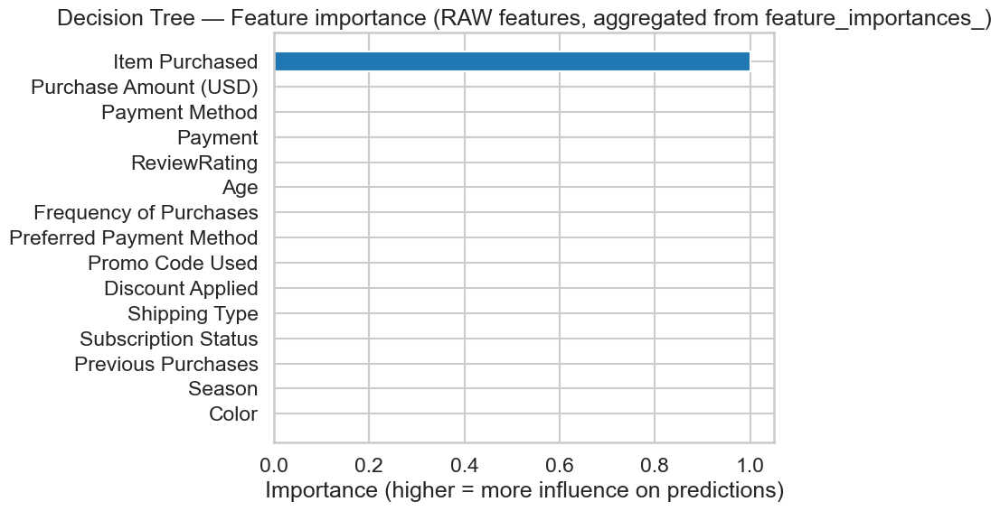

[Stage 8] Saved figure: figures\importance_decision_tree_raw_top15.png


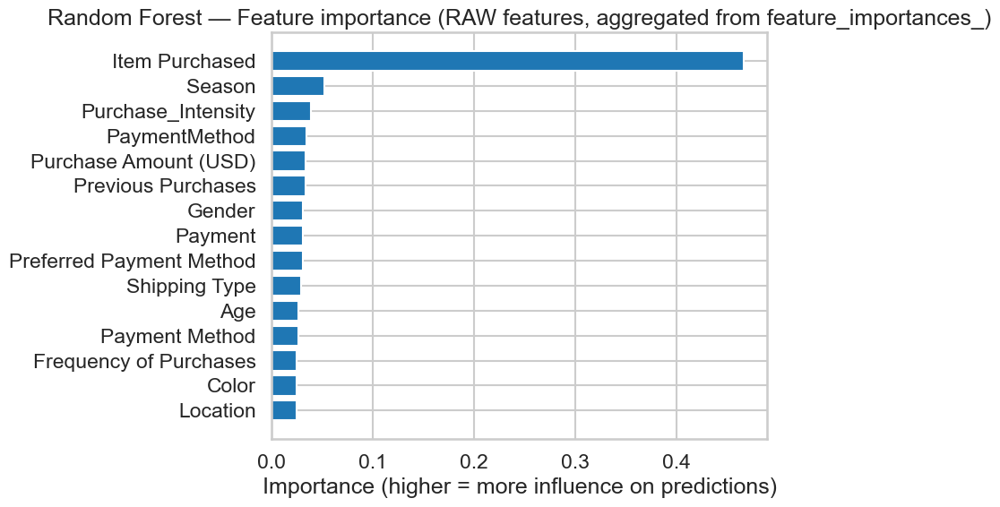

[Stage 8] Saved figure: figures\importance_random_forest_raw_top15.png


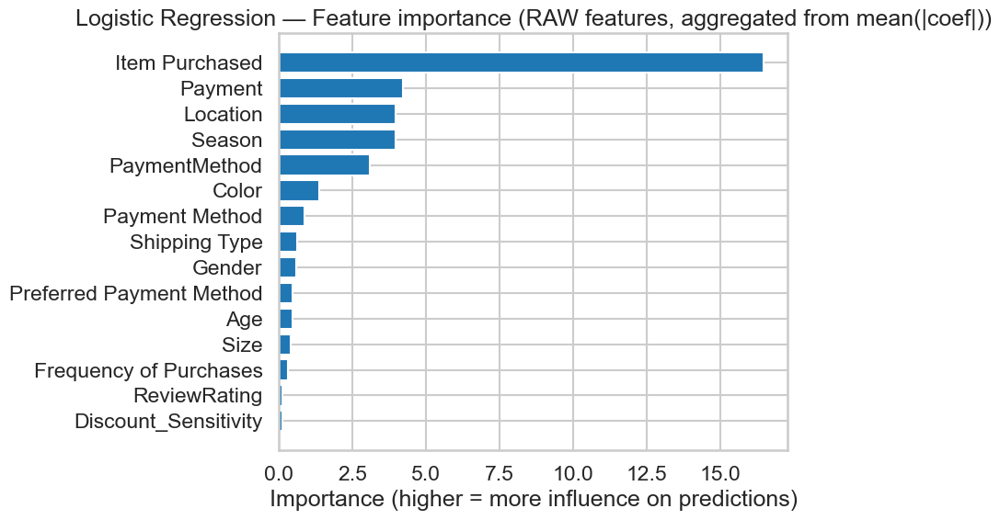

[Stage 8] Saved figure: figures\importance_logistic_regression_raw_top15.png


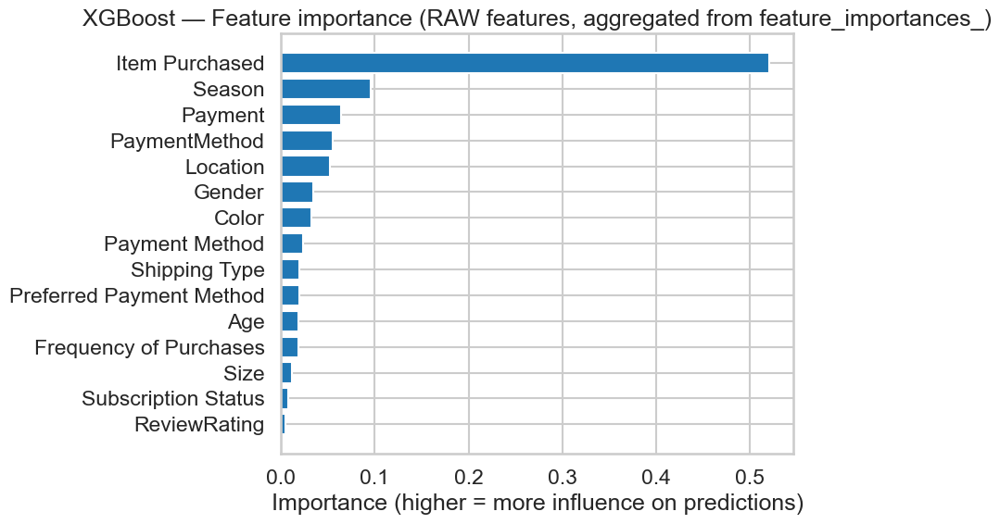

[Stage 8] Saved figure: figures\importance_xgboost_raw_top15.png


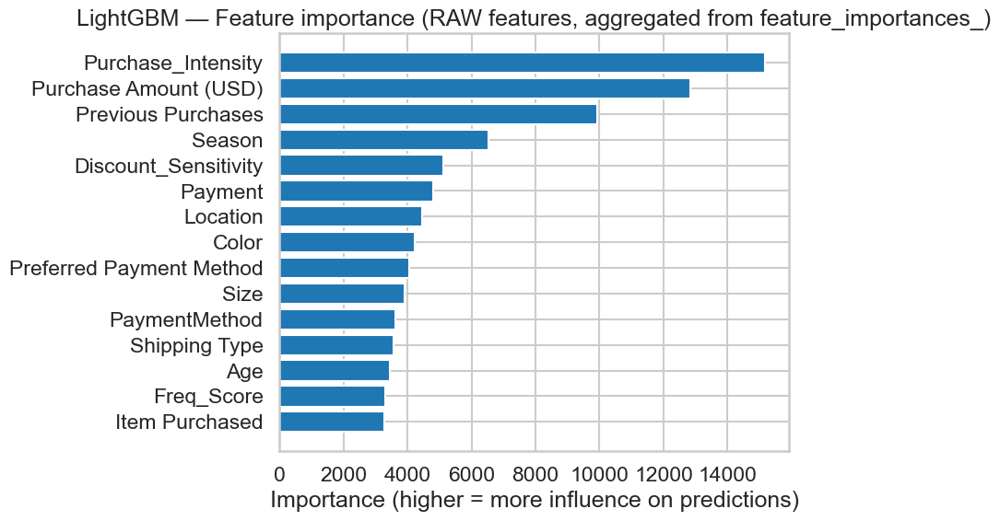

[Stage 8] Saved figure: figures\importance_lightgbm_raw_top15.png

[Stage 8] Saved: tables\feature_ranks.csv
[Stage 8] Total rows in feature_ranks.csv: 110


,model,feature,raw_importance,rank
0,Decision Tree,Item Purchased,1.000000,1
1,Decision Tree,Purchase Amount (USD),0.000000,2
2,Decision Tree,Payment Method,0.000000,2
3,Decision Tree,Payment,0.000000,2
4,Decision Tree,ReviewRating,0.000000,2
5,Decision Tree,Age,0.000000,2
6,Decision Tree,Frequency of Purchases,0.000000,2
7,Decision Tree,Preferred Payment Method,0.000000,2
8,Decision Tree,Promo Code Used,0.000000,2
9,Decision Tree,Discount Applied,0.000000,2


,model,feature,raw_importance,rank
0,Decision Tree,Item Purchased,1.000000,1
1,Decision Tree,Purchase Amount (USD),0.000000,2
2,Decision Tree,Payment Method,0.000000,2
3,Decision Tree,Payment,0.000000,2
4,Decision Tree,ReviewRating,0.000000,2
...,...,...,...,...
76,XGBoost,Age,0.019108,11
77,XGBoost,Frequency of Purchases,0.018527,12
78,XGBoost,Size,0.011743,13
79,XGBoost,Subscription Status,0.007712,14



[Stage 8] Done: printed all tables and displayed/saved all model importance figures.


In [14]:
# ======================================================================
# STAGE 8 - Interpretability & Feature Importance (Objective 4; H₀₄)
# ======================================================================
# We want to explain *why* the best models make their predictions.
# This stage identifies which customer attributes (features) matter most.
#
# What this notebook section produces:
#   1) A ranked list of the most important features for each finalist model
#   2) Clear Top-15 bar charts (saved + displayed) for each model
#   3) A single combined table (feature_ranks.csv) you can cite in the report
#
# Key design choices (kept simple + robust):
#   • We refit each finalist on the TRAIN set only (no leakage).
#   • We use model-native importance when available:
#       - Trees/boosters: feature_importances_
#       - Logistic Regression: average absolute coefficient magnitude |coef|
#   • Because preprocessing uses one-hot encoding, we aggregate back to RAW features
#     (e.g., all "Color_*" dummy variables collapse into "Color").
#
# Inputs required (already created earlier in your project):
#   • Stage 4: `outputs` dict in memory (X_train, y_train, preprocessor, etc.)
#   • Stage 6: best hyperparameters (hard-coded below to keep deterministic)
#
# Saved outputs:
#   • tables/feature_ranks.csv
#   • figures/importance_<model>_raw_top15.png   (one file per model)
# ======================================================================

from __future__ import annotations

# -----------------------------
# 0) Imports (only what we use)
# -----------------------------
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

from imblearn.pipeline import Pipeline

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

# Optional LightGBM (we include it if installed)
INCLUDE_LGBM = True
try:
    from lightgbm import LGBMClassifier
    HAS_LGBM = True
except Exception:
    HAS_LGBM = False

# -----------------------------
# 1) Safety checks (to avoid running with missing prerequisites)
# -----------------------------
assert "outputs" in globals(), (
    "Stage 8 requires the Stage 4 `outputs` dict in memory. "
    "Please run Stage 4 cells first."
)

X_train = outputs["X_train"]
y_train = outputs["y_train"]
classes = outputs["classes"]
preprocessor = outputs["preprocessor"]  # ColumnTransformer definition (used inside pipelines)

os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

# -----------------------------
# 2) Choose which models we will explain
# -----------------------------
# Stakeholder note:
# We explain *finalist models* (the ones you compared in Stage 7).
# If LightGBM isn't installed, we skip it automatically.
finalist_names = ["Decision Tree", "Random Forest", "Logistic Regression", "XGBoost"]
if INCLUDE_LGBM and HAS_LGBM:
    finalist_names.insert(2, "LightGBM")  # keep a tidy ordering

print("[Stage 8] Finalists considered for explainability:", finalist_names)
print(f"[Stage 8] LightGBM available: {HAS_LGBM}")

# -----------------------------
# 3) Build deterministic “best config” pipelines (TRAIN-only refit)
# -----------------------------
# Stakeholder note:
# We refit on TRAIN only so our explanations reflect a model that did not see the TEST set.
RANDOM_STATE = 42
trained_pipes: dict[str, Pipeline] = {}

# Decision Tree (use your Stage 6 best params)
trained_pipes["Decision Tree"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", DecisionTreeClassifier(
        random_state=RANDOM_STATE,
        max_depth=8,
        min_samples_split=10,
        min_samples_leaf=1,
    ))
])

# Random Forest (use your Stage 6 best params)
trained_pipes["Random Forest"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", RandomForestClassifier(
        random_state=RANDOM_STATE,
        n_jobs=-1,
        n_estimators=900,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=2,
        class_weight="balanced"
    ))
])

# Logistic Regression (use your Stage 6 best params)
trained_pipes["Logistic Regression"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", LogisticRegression(
        random_state=RANDOM_STATE,
        multi_class="multinomial",
        solver="lbfgs",
        max_iter=2000,
        C=0.5,
        penalty="l2",
        class_weight=None
    ))
])

# XGBoost (use your Stage 6 best params)
trained_pipes["XGBoost"] = Pipeline(steps=[
    ("prep", preprocessor),
    ("balance", "passthrough"),
    ("clf", XGBClassifier(
        random_state=RANDOM_STATE,
        objective="multi:softprob",
        num_class=len(classes),
        eval_metric="mlogloss",
        tree_method="hist",
        n_jobs=-1,
        n_estimators=300,
        max_depth=4,
        learning_rate=0.05,
        subsample=1.0,
        colsample_bytree=0.8
    ))
])

# LightGBM (optional)
if INCLUDE_LGBM and HAS_LGBM:
    trained_pipes["LightGBM"] = Pipeline(steps=[
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", LGBMClassifier(
            random_state=RANDOM_STATE,
            objective="multiclass",
            num_class=len(classes),
            n_jobs=-1,
            n_estimators=400,
            num_leaves=63,
            learning_rate=0.05,
            min_child_samples=20,
            class_weight=None
        ))
    ])

# Fit each pipeline once (TRAIN-only)
print("\n[Stage 8] Refitting finalist pipelines on TRAIN only (no leakage).")
for name, pipe in trained_pipes.items():
    pipe.fit(X_train, y_train)
    print(f"  • Fitted: {name}")

print(f"\n[Stage 8] Pipelines ready: {sorted(trained_pipes.keys())}")

# -----------------------------
# 4) Helper: extract encoded feature names and map them back to RAW features
# -----------------------------
# Stakeholder note:
# After preprocessing, a single raw feature like "Color" becomes multiple encoded columns
# (Color_Black, Color_Blue, ...). We collapse them back into one “Color” importance.
def get_encoded_names_and_mapping(fitted_prep):
    """
    Returns:
      encoded_names: array[str] of all encoded columns after preprocessing
      enc2raw: dict mapping each encoded column name -> raw feature name
    """
    # Get encoded names as sklearn reports them (best path when available)
    try:
        encoded_names = np.array(fitted_prep.get_feature_names_out(), dtype=str)
    except Exception:
        raise ValueError(
            "Could not read encoded feature names from the preprocessor. "
            "This usually means the preprocessor isn't fitted or sklearn is too old."
        )

    # Build a mapping encoded -> raw feature name
    # Convention used by ColumnTransformer get_feature_names_out():
    #   "num__<raw>" and "cat__<raw>_<level>"
    enc2raw = {}
    for enc in encoded_names:
        if enc.startswith("num__"):
            enc2raw[enc] = enc.replace("num__", "")
        elif enc.startswith("cat__"):
            # cat__Color_Black -> raw feature is "Color"
            # robust split: remove "cat__" then take text before first underscore
            raw_part = enc.replace("cat__", "")
            raw_name = raw_part.split("_", 1)[0] if "_" in raw_part else raw_part
            enc2raw[enc] = raw_name
        else:
            # fallback: if naming doesn't match expected patterns
            enc2raw[enc] = enc

    return encoded_names, enc2raw

def aggregate_encoded_scores_to_raw(encoded_names, encoded_scores, enc2raw):
    """
    Sum encoded-level scores into RAW feature totals.
    """
    if len(encoded_names) != len(encoded_scores):
        raise ValueError("Encoded names and encoded scores must have the same length.")

    bag = defaultdict(float)
    for n, s in zip(encoded_names, encoded_scores):
        bag[enc2raw.get(n, n)] += float(s)

    raw_series = pd.Series(bag, dtype=float).sort_values(ascending=False)
    return raw_series

def plot_topk_raw(series: pd.Series, title: str, out_path: str, k: int = 15):
    """
    Plot Top-K feature importances as a horizontal bar chart.
    Saves and prints the figure (for screenshots).
    """
    if series.empty:
        print("[Stage 8] Nothing to plot (empty importance series).")
        return

    topk = series.head(k).iloc[::-1]  # reverse so most important appears at the top
    plt.figure(figsize=(9, 6))
    plt.barh(topk.index, topk.values)
    plt.title(title)
    plt.xlabel("Importance (higher = more influence on predictions)")
    plt.tight_layout()
    plt.savefig(out_path, dpi=220)
    plt.show()
    print(f"[Stage 8] Saved figure: {out_path}")

# -----------------------------
# 5) Compute model-based importances and generate outputs
# -----------------------------
# Stakeholder note:
# This creates ONE ranked feature list per model and produces a Top-15 chart per model.
feature_rank_rows = []

print("\n[Stage 8] Computing model-based feature importance (aggregated to RAW features).")

for model_name, pipe in trained_pipes.items():
    fitted_prep = pipe.named_steps["prep"]
    clf = pipe.named_steps["clf"]

    # (A) Read encoded feature names
    encoded_names, enc2raw = get_encoded_names_and_mapping(fitted_prep)

    # (B) Get encoded-level scores (tree importance OR regression coefficients)
    if hasattr(clf, "feature_importances_"):
        encoded_scores = np.asarray(clf.feature_importances_, dtype=float)
        score_label = "feature_importances_"
    elif hasattr(clf, "coef_"):
        # For multiclass LR: coef_ is (n_classes, n_features). We average |coef| across classes.
        coef = np.asarray(clf.coef_, dtype=float)
        encoded_scores = np.mean(np.abs(coef), axis=0)
        score_label = "mean(|coef|)"
    else:
        print(f"[Stage 8] Skipping {model_name}: no feature_importances_ or coef_.")
        continue

    # (C) Basic sanity check: scores must align with encoded feature names
    if len(encoded_scores) != len(encoded_names):
        print(
            f"[Stage 8] Skipping {model_name}: score length mismatch "
            f"(scores={len(encoded_scores)} vs features={len(encoded_names)})."
        )
        continue

    # (D) Aggregate importance back to RAW input features
    raw_series = aggregate_encoded_scores_to_raw(encoded_names, encoded_scores, enc2raw)

    # (E) Save plot (and display it)
    fig_path = os.path.join(
        "figures",
        f"importance_{model_name.replace(' ', '_').lower()}_raw_top15.png"
    )
    plot_topk_raw(
        raw_series,
        title=f"{model_name} — Feature importance (RAW features, aggregated from {score_label})",
        out_path=fig_path,
        k=15
    )

    # (F) Store full ranking table (for report appendix + cross-model comparison)
    ranks = raw_series.rank(ascending=False, method="dense").astype(int)
    for feat, score in raw_series.items():
        feature_rank_rows.append({
            "model": model_name,
            "feature": feat,
            "raw_importance": float(score),
            "rank": int(ranks.loc[feat])
        })

# -----------------------------
# 6) Save + print the combined ranking table
# -----------------------------
ranks_df = pd.DataFrame(feature_rank_rows)
ranks_out_path = os.path.join("tables", "feature_ranks.csv")
ranks_df.to_csv(ranks_out_path, index=False)

print(f"\n[Stage 8] Saved: {ranks_out_path}")
print(f"[Stage 8] Total rows in feature_ranks.csv: {len(ranks_df)}")

# Show a quick preview for screenshots
display(HTML("<h3>Stage 8 — Feature ranks table (preview)</h3>"))
display(ranks_df.sort_values(["model", "rank"]).head(50))

# Optional: show Top-15 per model (clean table for report screenshots)
display(HTML("<h3>Stage 8 — Top-15 features per model</h3>"))
top15 = ranks_df[ranks_df["rank"] <= 15].sort_values(["model", "rank"])
display(top15)

print("\n[Stage 8] Done: printed all tables and displayed/saved all model importance figures.")

### STAGE 8: MODEL- BASED FEATURE IMPORTANCE

[Stage 8] LightGBM available: True
[Stage 8] Models fitted: ['Decision Tree', 'Random Forest', 'Logistic Regression', 'XGBoost', 'LightGBM']

[Stage 8] === Scenario: WITH Item Purchased ===


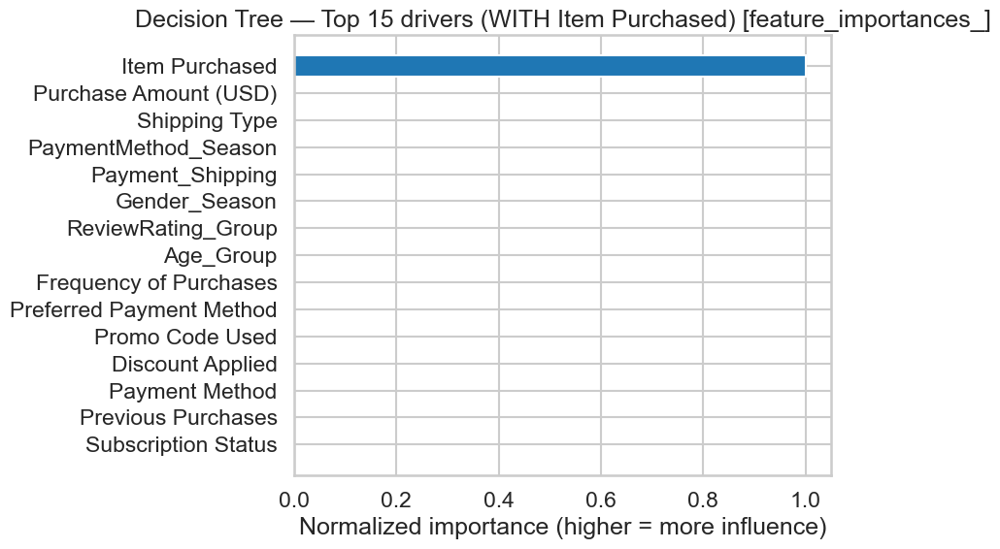

[Stage 8] Saved figure: figures\importance_decision_tree_with_item_purchased_top15.png


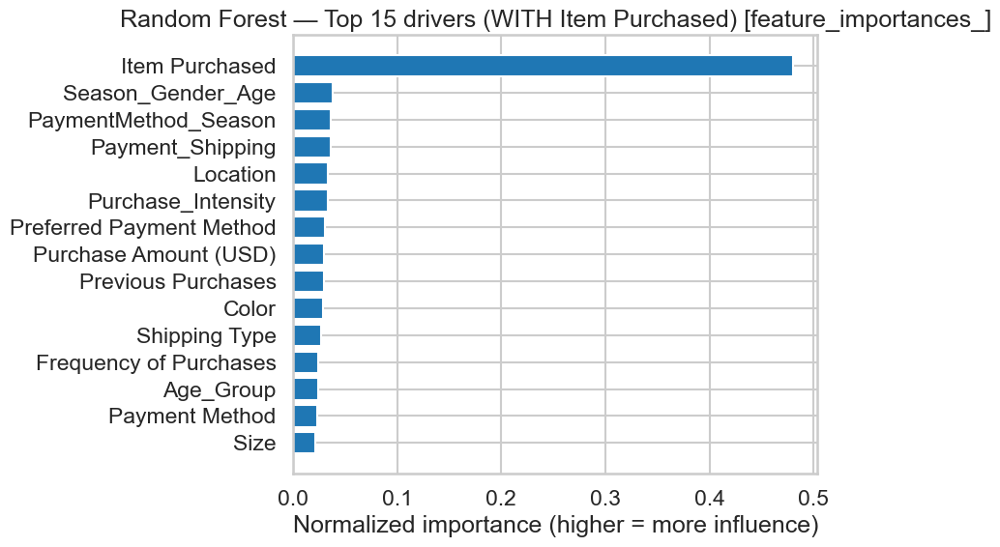

[Stage 8] Saved figure: figures\importance_random_forest_with_item_purchased_top15.png


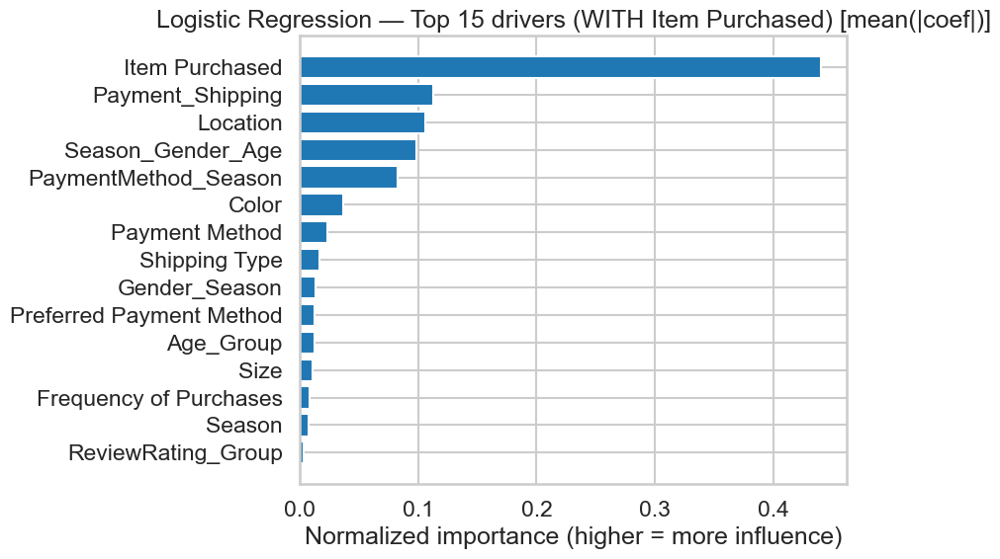

[Stage 8] Saved figure: figures\importance_logistic_regression_with_item_purchased_top15.png


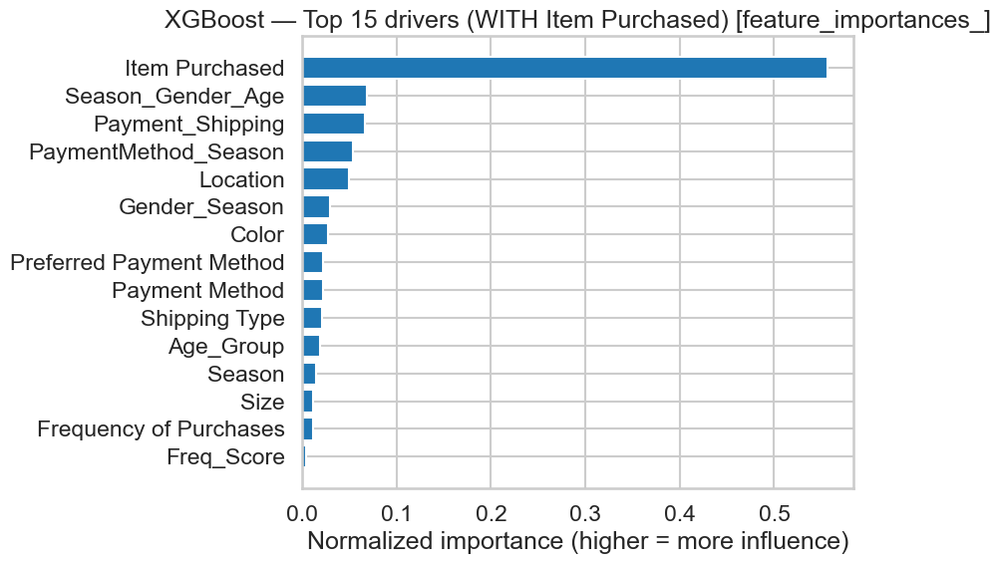

[Stage 8] Saved figure: figures\importance_xgboost_with_item_purchased_top15.png


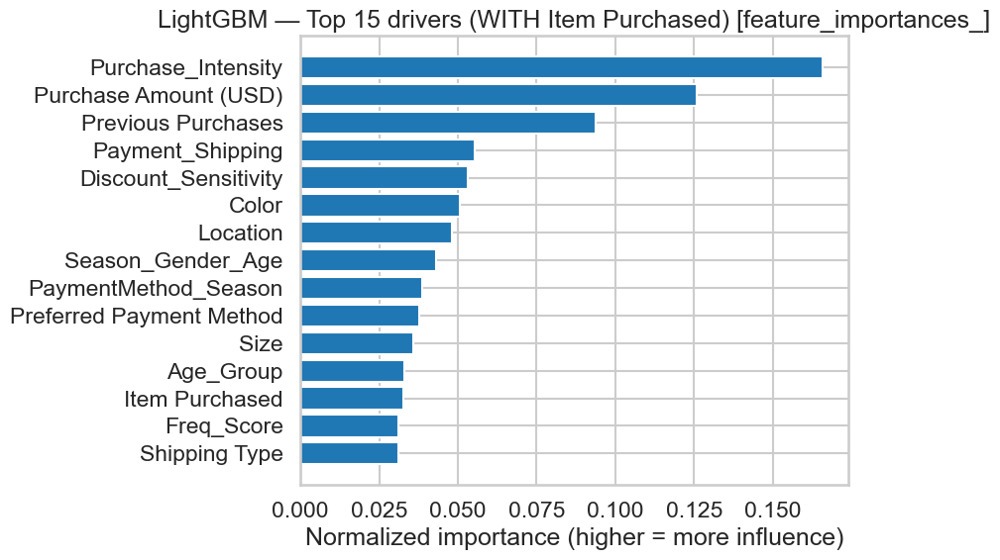

[Stage 8] Saved figure: figures\importance_lightgbm_with_item_purchased_top15.png
[Stage 8] Models fitted: ['Decision Tree', 'Random Forest', 'Logistic Regression', 'XGBoost', 'LightGBM']

[Stage 8] === Scenario: WITHOUT Item Purchased ===


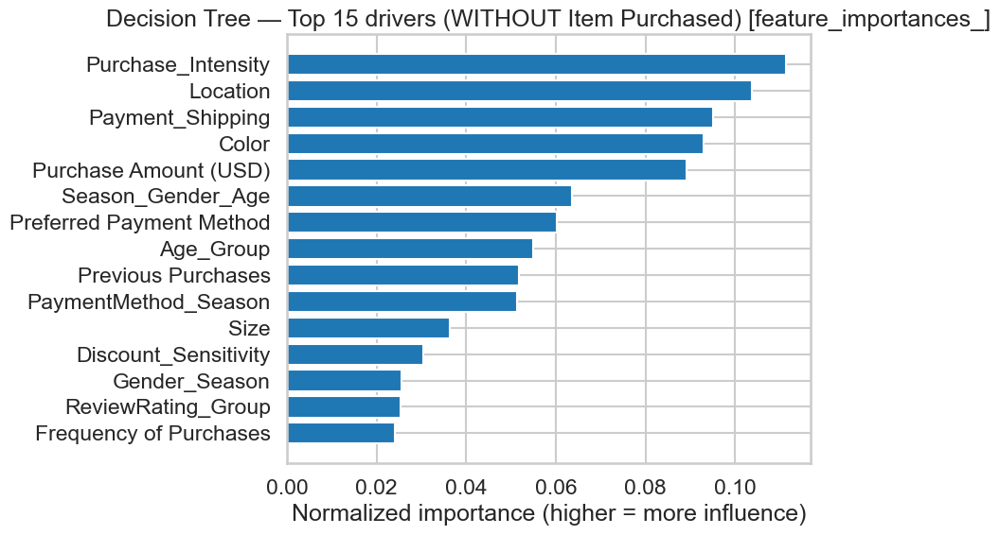

[Stage 8] Saved figure: figures\importance_decision_tree_without_item_purchased_top15.png


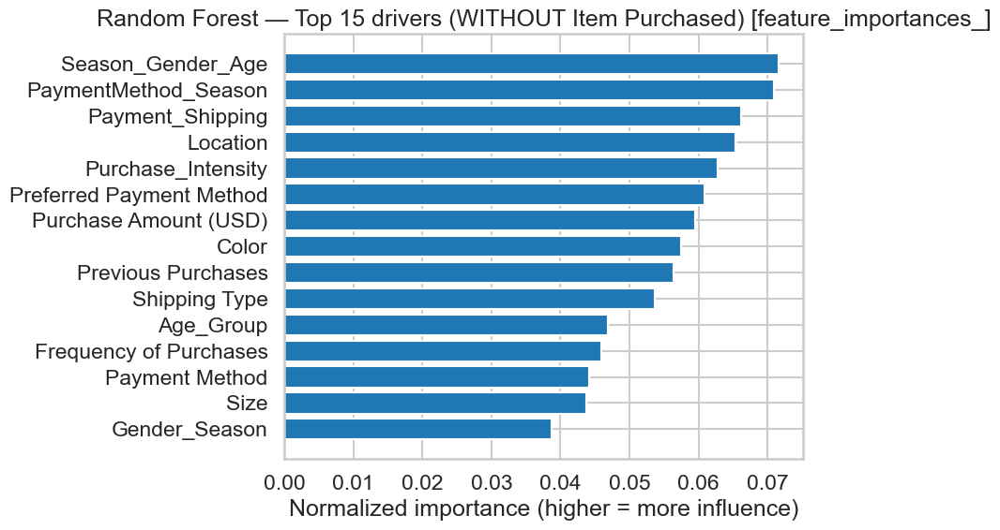

[Stage 8] Saved figure: figures\importance_random_forest_without_item_purchased_top15.png


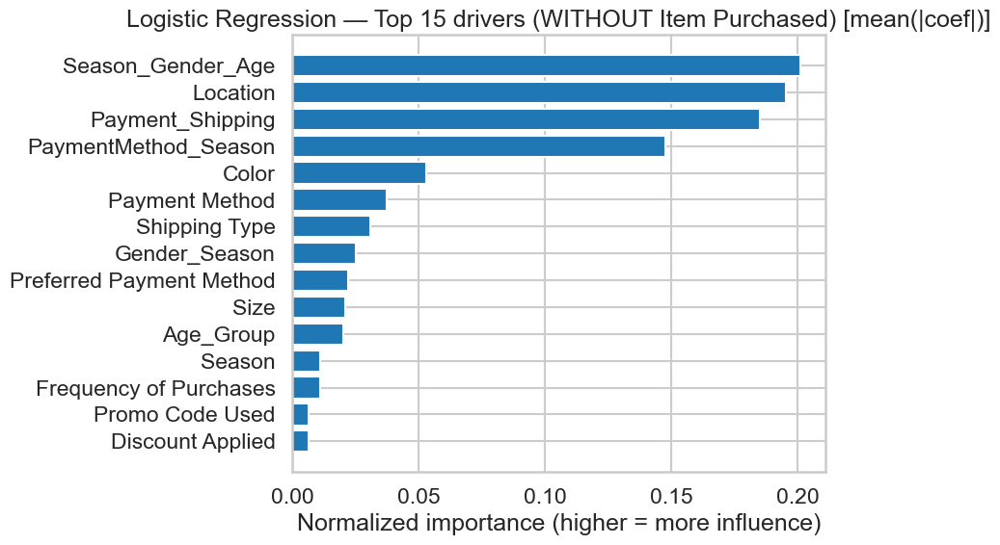

[Stage 8] Saved figure: figures\importance_logistic_regression_without_item_purchased_top15.png


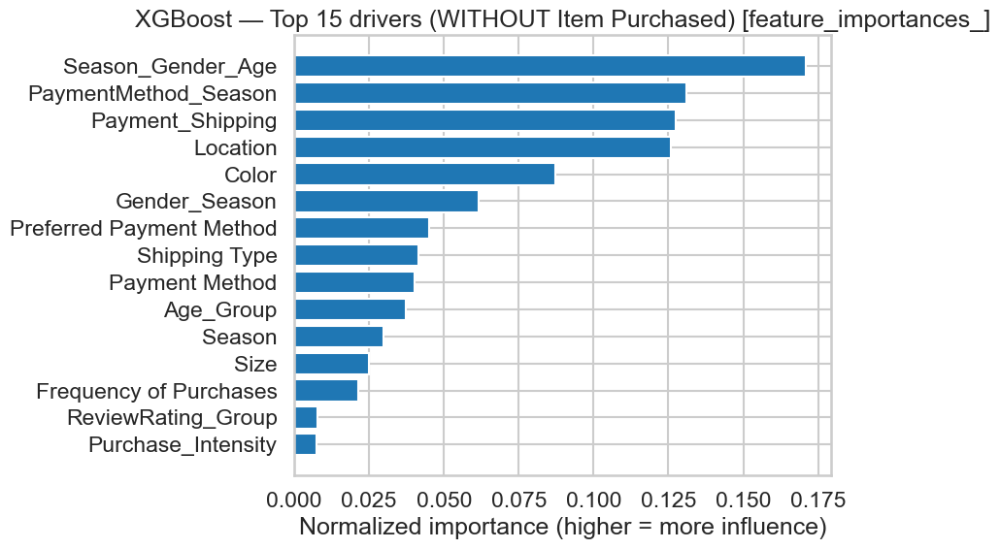

[Stage 8] Saved figure: figures\importance_xgboost_without_item_purchased_top15.png


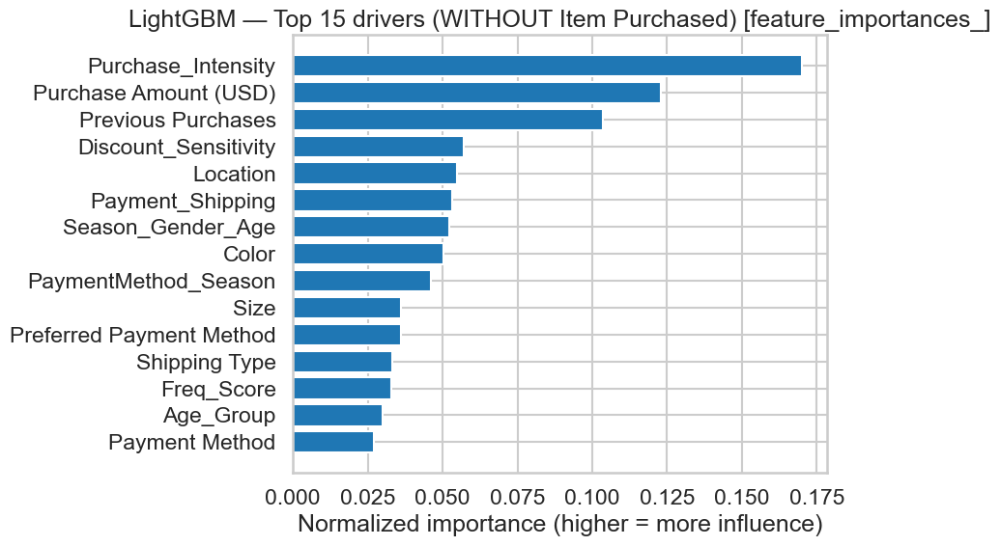

[Stage 8] Saved figure: figures\importance_lightgbm_without_item_purchased_top15.png

[Stage 8] Saved combined feature rank table: tables\feature_ranks_with_without_item_purchased.csv
[Stage 8] Total rows saved: 235

[Stage 8] Top-10 features per model per scenario (normalized importance):

--- WITH Item Purchased | Decision Tree (Top 10) ---
           scenario         model  rank                  feature  normalized_importance  raw_importance
WITH Item Purchased Decision Tree     1           Item Purchased                    1.0             1.0
WITH Item Purchased Decision Tree     2                Age_Group                    0.0             0.0
WITH Item Purchased Decision Tree     2                    Color                    0.0             0.0
WITH Item Purchased Decision Tree     2         Discount Applied                    0.0             0.0
WITH Item Purchased Decision Tree     2     Discount_Sensitivity                    0.0             0.0
WITH Item Purchased Decision Tr

In [15]:
# ======================================================================
# STAGE 8 - Model-based Feature Importance
# Run TWICE: (1) WITH "Item Purchased" (2) WITHOUT "Item Purchased"
# ======================================================================
# Some features can dominate explanations simply because they are very specific.
# "Item Purchased" is often like a near-ID for products, so it can overshadow
# other drivers (e.g., Age, Season, Location, Subscription Status).
#
# This block answers:
#   “What features drive the model when Item Purchased is included?”
#   “What features drive the model when Item Purchased is removed?”
#
# Outputs (printed + saved for screenshots):
#   • Tables:
#       - tables/feature_ranks_with_without_item_purchased.csv
#       - Printed Top-10 features per model per scenario
#   • Figures (saved and also displayed):
#       - figures/importance_<model>_with_item_purchased_top15.png
#       - figures/importance_<model>_without_item_purchased_top15.png
#
# What we keep simple on purpose:
#   • We use deterministic “best configs” (same as your Stage 6 finalists).
#   • We refit models on TRAIN only (no leakage).
#   • We compute model-native importances and aggregate one-hot columns
#     back to RAW features for stakeholder readability.
# ======================================================================

# -----------------------------
# 0) Imports (only what we use)
# -----------------------------
import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

from imblearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

# Optional LightGBM (include if installed)
INCLUDE_LGBM = True
try:
    from lightgbm import LGBMClassifier
    HAS_LGBM = True
except Exception:
    HAS_LGBM = False

# -----------------------------
# 1) Safety checks + load shared artefacts
# -----------------------------
# Stakeholder note:
# We reuse the exact same training data and preprocessing design as earlier stages.
assert "outputs" in globals(), (
    "This stage requires the Stage 4 `outputs` dict in memory "
    "(X_train, y_train, classes, preprocessor)."
)

X_train = outputs["X_train"]
y_train = outputs["y_train"]
classes = outputs["classes"]
base_preprocessor = outputs["preprocessor"]  # UNFITTED ColumnTransformer

os.makedirs("figures", exist_ok=True)
os.makedirs("tables", exist_ok=True)

RANDOM_STATE = 42
TOPK = 15

print("[Stage 8] LightGBM available:", HAS_LGBM)

# ======================================================================
# 2) Utilities: encoded names -> RAW feature aggregation (for readability)
# ======================================================================
def _find_ohe(cat_transformer):
    """
    Locate the OneHotEncoder inside the categorical branch.
    This is needed so we can rebuild RAW feature groupings.
    """
    if isinstance(cat_transformer, OneHotEncoder):
        return cat_transformer
    if hasattr(cat_transformer, "named_steps"):  # Pipeline
        for step in cat_transformer.named_steps.values():
            if isinstance(step, OneHotEncoder):
                return step
    enc = getattr(cat_transformer, "encoder", None)
    if isinstance(enc, OneHotEncoder):
        return enc
    raise ValueError("Could not locate OneHotEncoder in the categorical transformer.")

def encoded_names_and_enc2raw(fitted_prep):
    """
    After preprocessing, many columns are created (especially from one-hot encoding).
    This function returns:
      • encoded_names: the full list of transformed columns
      • enc2raw: mapping from each encoded column back to its RAW feature group
    """
    # Best path: sklearn provides names directly when the preprocessor is fitted
    try:
        encoded_names = np.array(fitted_prep.get_feature_names_out(), dtype=str)
    except Exception as e:
        raise ValueError(
            "Could not extract encoded feature names from the fitted preprocessor. "
            "Ensure the pipeline was fitted before calling this function."
        ) from e

    # Find the raw columns used for numeric and categorical branches
    parts = {name: (trans, cols) for name, trans, cols in fitted_prep.transformers_}
    if "num" not in parts or "cat" not in parts:
        raise ValueError("Expected ColumnTransformer branches named 'num' and 'cat'.")

    _, num_raw = parts["num"]
    cat_trans, cat_raw = parts["cat"]

    # Get categories from the OneHotEncoder so we can map cat__Feature_value -> Feature
    ohe = _find_ohe(cat_trans)
    cat_categories = ohe.categories_

    enc2raw = {}

    # Numeric features: usually named num__<raw_name>
    for nr in list(num_raw):
        enc2raw[f"num__{nr}"] = nr

    # Categorical features: usually named cat__<raw_name>_<category>
    for raw_name, cats in zip(list(cat_raw), cat_categories):
        for cat in cats:
            enc2raw[f"cat__{raw_name}_{cat}"] = raw_name

    return encoded_names, enc2raw

def aggregate_to_raw(encoded_names, encoded_scores, enc2raw):
    """
    Sum scores from encoded columns back into their RAW feature group.
    Example:
      cat__Color_Black + cat__Color_Blue + ... -> "Color"
    """
    if len(encoded_names) != len(encoded_scores):
        raise ValueError("encoded_names and encoded_scores must be the same length.")

    bag = defaultdict(float)
    for n, s in zip(encoded_names, encoded_scores):
        bag[enc2raw.get(n, n)] += float(s)

    return pd.Series(bag, dtype=float).sort_values(ascending=False)

def plot_topk(series, title, out_path, k=TOPK):
    """
    Create a clear bar chart of the Top-K RAW features (and display it).
    """
    if series.empty:
        print("[Stage 8] Nothing to plot (empty series).")
        return

    topk = series.head(k).iloc[::-1]  # reverse so the largest appears at the top
    plt.figure(figsize=(9, 6))
    plt.barh(topk.index, topk.values)
    plt.title(title)
    plt.xlabel("Normalized importance (higher = more influence)")
    plt.tight_layout()
    plt.savefig(out_path, dpi=220)
    plt.show()
    print(f"[Stage 8] Saved figure: {out_path}")

# ======================================================================
# 3) Utility: drop RAW feature(s) from the preprocessor (scenario test)
# ======================================================================
def drop_raw_features(unfitted_preprocessor, to_drop: set[str]):
    """
    Return a NEW ColumnTransformer with selected RAW features removed
    from the numeric and categorical column lists.

    Stakeholder note:
    This is how we rerun the pipeline "WITHOUT Item Purchased"
    while keeping everything else unchanged.
    """
    new_prep = copy.deepcopy(unfitted_preprocessor)
    new_transformers = []
    for name, trans, cols in new_prep.transformers:  # UNFITTED uses .transformers
        if name in ("num", "cat"):
            cols = [c for c in cols if c not in to_drop]
        new_transformers.append((name, trans, cols))
    new_prep.transformers = new_transformers
    return new_prep

# ======================================================================
# 4) Build and fit finalist models (deterministic configs)
# ======================================================================
def build_and_fit_finalists(prep, num_classes: int):
    """
    Build the same finalist model families and fit them once on TRAIN.
    Returns a dict: {model_name: fitted_pipeline}
    """
    pipes = {}

    pipes["Decision Tree"] = Pipeline(steps=[
        ("prep", prep),
        ("balance", "passthrough"),
        ("clf", DecisionTreeClassifier(
            random_state=RANDOM_STATE,
            max_depth=8,
            min_samples_split=2,
            min_samples_leaf=1
        ))
    ])

    pipes["Random Forest"] = Pipeline(steps=[
        ("prep", prep),
        ("balance", "passthrough"),
        ("clf", RandomForestClassifier(
            random_state=RANDOM_STATE,
            n_jobs=-1,
            n_estimators=600,
            max_depth=20,
            min_samples_split=2,
            min_samples_leaf=1,
            class_weight="balanced"
        ))
    ])

    pipes["Logistic Regression"] = Pipeline(steps=[
        ("prep", prep),
        ("balance", "passthrough"),
        ("clf", LogisticRegression(
            random_state=RANDOM_STATE,
            multi_class="multinomial",
            solver="lbfgs",
            max_iter=2000,
            C=0.5,
            penalty="l2",
            class_weight=None
        ))
    ])

    pipes["XGBoost"] = Pipeline(steps=[
        ("prep", prep),
        ("balance", "passthrough"),
        ("clf", XGBClassifier(
            random_state=RANDOM_STATE,
            objective="multi:softprob",
            num_class=num_classes,
            eval_metric="mlogloss",
            tree_method="hist",
            n_jobs=-1,
            n_estimators=300,
            max_depth=4,
            learning_rate=0.05,
            subsample=1.0,
            colsample_bytree=1.0
        ))
    ])

    if INCLUDE_LGBM and HAS_LGBM:
        pipes["LightGBM"] = Pipeline(steps=[
            ("prep", prep),
            ("balance", "passthrough"),
            ("clf", LGBMClassifier(
                random_state=RANDOM_STATE,
                objective="multiclass",
                num_class=num_classes,
                n_jobs=-1,
                n_estimators=400,
                num_leaves=31,
                learning_rate=0.05,
                min_child_samples=40,
                class_weight=None
            ))
        ])

    # Fit once so the preprocessor becomes fitted and feature names are available
    for name, pipe in pipes.items():
        pipe.fit(X_train, y_train)

    print("[Stage 8] Models fitted:", list(pipes.keys()))
    return pipes

# ======================================================================
# 5) Compute model-based importance (RAW aggregated) for one scenario
# ======================================================================
def compute_importance_for_scenario(pipes: dict, scenario_tag: str) -> pd.DataFrame:
    """
    For each fitted pipeline:
      • Extract encoded-level importance (trees) or mean|coef| (LR)
      • Aggregate to RAW features (sum across one-hot groups)
      • Normalize to sum to 1 (easier to compare across models)
      • Save + show Top-15 plot
      • Return a tidy table with ranks for reporting
    """
    rows = []

    print(f"\n[Stage 8] === Scenario: {scenario_tag} ===")

    for model_name, pipe in pipes.items():
        fitted_prep = pipe.named_steps["prep"]
        clf = pipe.named_steps["clf"]

        # 1) Get encoded feature names + mapping to RAW features
        encoded_names, enc2raw = encoded_names_and_enc2raw(fitted_prep)

        # 2) Extract encoded-level scores
        if hasattr(clf, "feature_importances_"):
            encoded_scores = np.asarray(clf.feature_importances_, dtype=float)
            score_source = "feature_importances_"
        elif hasattr(clf, "coef_"):
            coef = np.asarray(clf.coef_, dtype=float)
            encoded_scores = np.mean(np.abs(coef), axis=0)
            score_source = "mean(|coef|)"
        else:
            print(f"[Stage 8] Skipping {model_name}: no importances/coef_.")
            continue

        # 3) Validate alignment
        if len(encoded_scores) != len(encoded_names):
            print(
                f"[Stage 8] Skipping {model_name}: mismatch "
                f"(scores={len(encoded_scores)} vs names={len(encoded_names)})."
            )
            continue

        # 4) Aggregate to RAW and normalize
        raw = aggregate_to_raw(encoded_names, encoded_scores, enc2raw)
        raw_sum = float(raw.sum())
        norm = (raw / raw_sum) if raw_sum > 0 else raw

        # 5) Plot for stakeholder readability
        safe_tag = scenario_tag.replace(" ", "_").lower()
        fig_path = os.path.join(
            "figures",
            f"importance_{model_name.replace(' ', '_').lower()}_{safe_tag}_top{TOPK}.png"
        )
        plot_topk(
            norm,
            title=f"{model_name} — Top {TOPK} drivers ({scenario_tag}) [{score_source}]",
            out_path=fig_path,
            k=TOPK
        )

        # 6) Create ranked table (for reporting + audit trail)
        ranks = raw.rank(ascending=False, method="dense").astype(int)
        for feat, score in raw.items():
            rows.append({
                "scenario": scenario_tag,
                "model": model_name,
                "feature": feat,
                "raw_importance": float(score),
                "normalized_importance": float(norm.loc[feat]) if feat in norm.index else np.nan,
                "rank": int(ranks.loc[feat]),
            })

    out = pd.DataFrame(rows).sort_values(["scenario", "model", "rank", "feature"]).reset_index(drop=True)
    return out

# ======================================================================
# 6) Run both scenarios and print/save all outputs
# ======================================================================
# Scenario A: WITH Item Purchased
pipes_with = build_and_fit_finalists(base_preprocessor, num_classes=len(classes))
ranks_with = compute_importance_for_scenario(pipes_with, scenario_tag="WITH Item Purchased")

# Scenario B: WITHOUT Item Purchased
to_drop = {"Item Purchased"}
prep_without = drop_raw_features(base_preprocessor, to_drop=to_drop)
pipes_without = build_and_fit_finalists(prep_without, num_classes=len(classes))
ranks_without = compute_importance_for_scenario(pipes_without, scenario_tag="WITHOUT Item Purchased")

# Combine and save
ranks_both = pd.concat([ranks_with, ranks_without], ignore_index=True)
out_csv = os.path.join("tables", "feature_ranks_with_without_item_purchased.csv")
ranks_both.to_csv(out_csv, index=False)

print(f"\n[Stage 8] Saved combined feature rank table: {out_csv}")
print(f"[Stage 8] Total rows saved: {len(ranks_both)}")

# Print a clean Top-10 summary per model per scenario (for quick screenshots)
print("\n[Stage 8] Top-10 features per model per scenario (normalized importance):")
top10 = (
    ranks_both[ranks_both["rank"] <= 10]
    .sort_values(["scenario", "model", "rank"])
    .loc[:, ["scenario", "model", "rank", "feature", "normalized_importance", "raw_importance"]]
)

# Display as a readable console table (no notebook display dependency)
for (sc, m), sub in top10.groupby(["scenario", "model"]):
    print(f"\n--- {sc} | {m} (Top 10) ---")
    print(sub.to_string(index=False))

### STAGE 8 - Delta view + Top-15 visuals WITH vs WITHOUT "Item Purchased

[Stage 8] Loaded: tables/feature_ranks_with_without_item_purchased.csv | shape=(235, 6)
[Stage 8] Using importance column: normalized_importance -> renamed to 'importance'
[Stage 8] Saved: tables/feature_importance_delta.csv | rows=235

[Stage 8] Delta summary (Top 10 increases and decreases per model):

--- Decision Tree: biggest INCREASES (WITH - WITHOUT) ---
                 feature     WITH  WITHOUT  DELTA_WITH_MINUS_WITHOUT
          Item Purchased 1.000000 0.000000                       1.0
   Purchase Amount (USD) 0.089124 0.089124                       0.0
    PaymentMethod_Season 0.051428 0.051428                       0.0
        Payment_Shipping 0.095052 0.095052                       0.0
Preferred Payment Method 0.060164 0.060164                       0.0
      Previous Purchases 0.051829 0.051829                       0.0
         Promo Code Used 0.000000 0.000000                       0.0
         Promo Code Used 0.000000 0.000000                       0.0
      Purchase_

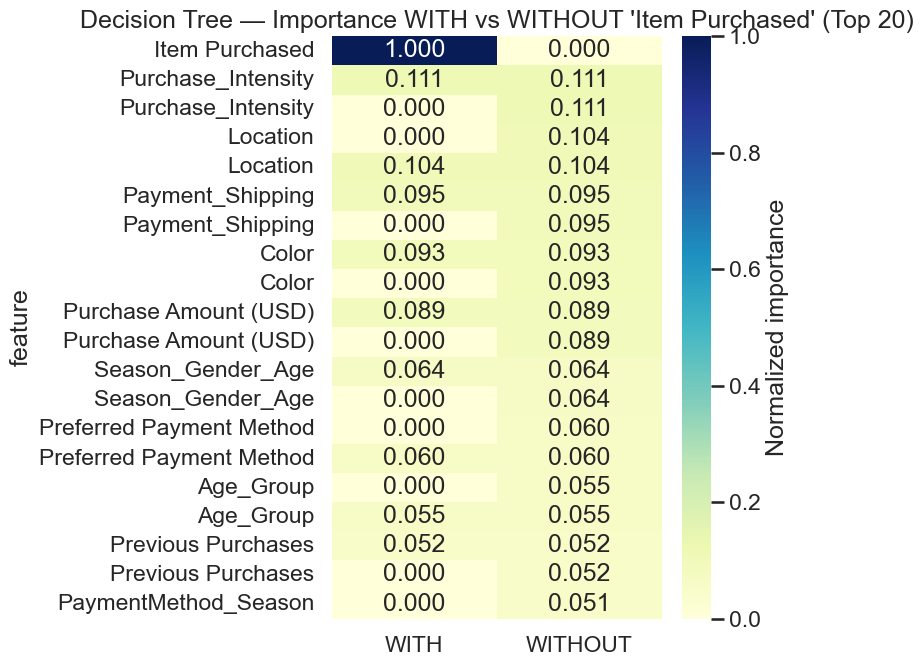

[Stage 8] Saved: figures/importance_delta_heatmap_decision_tree.png


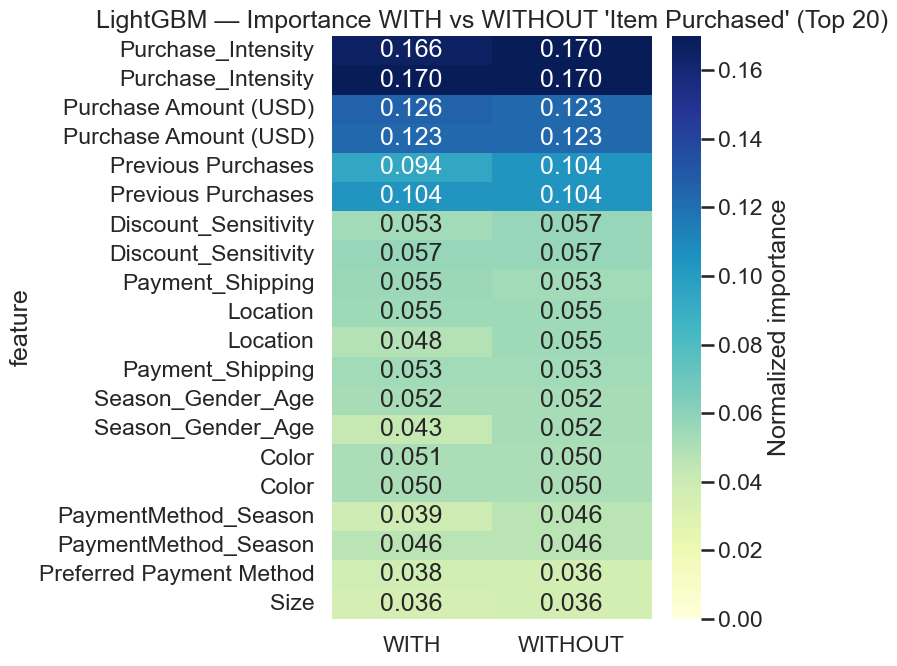

[Stage 8] Saved: figures/importance_delta_heatmap_lightgbm.png


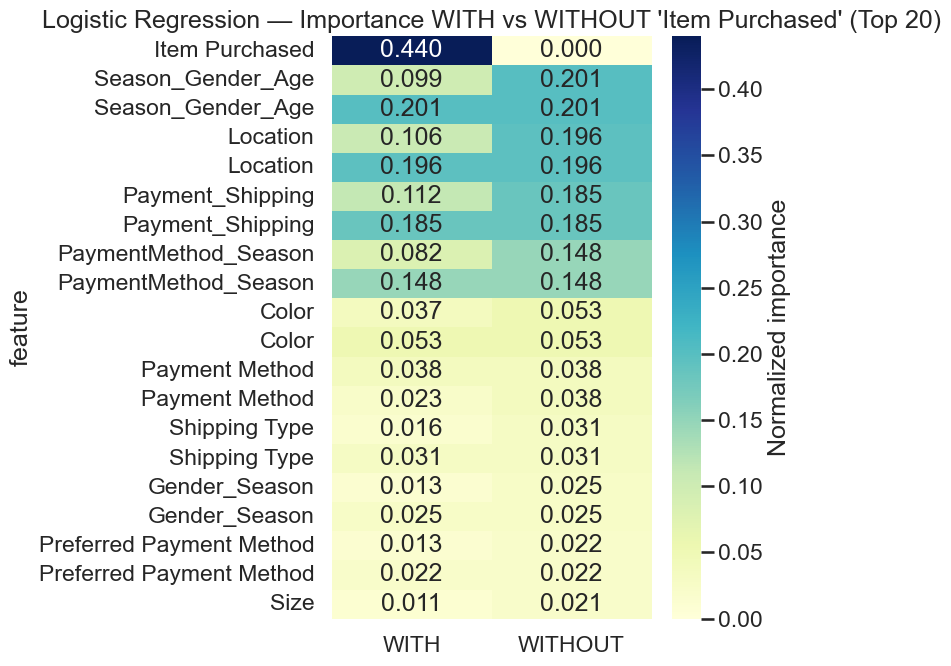

[Stage 8] Saved: figures/importance_delta_heatmap_logistic_regression.png


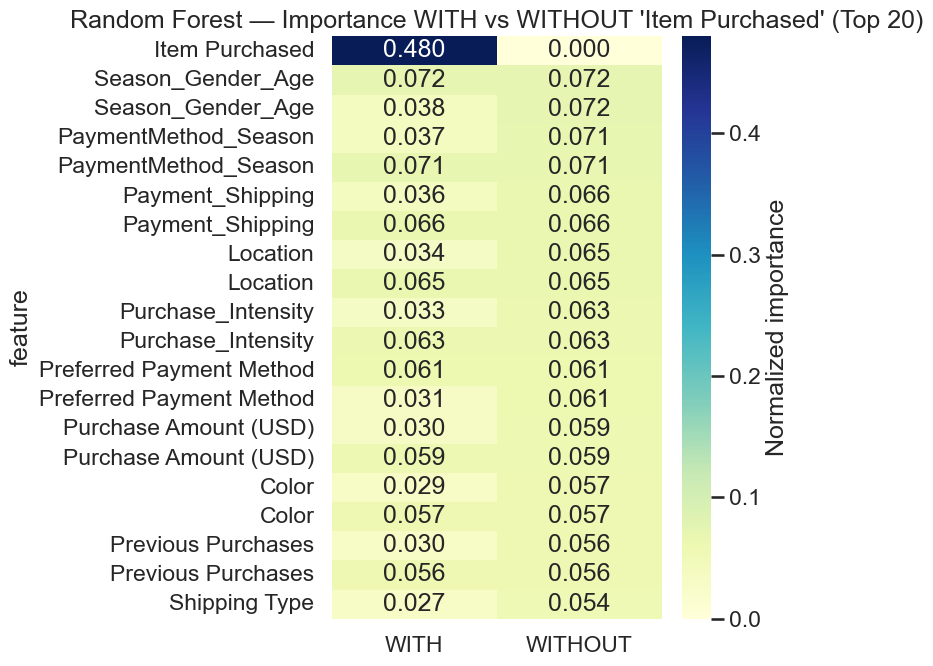

[Stage 8] Saved: figures/importance_delta_heatmap_random_forest.png


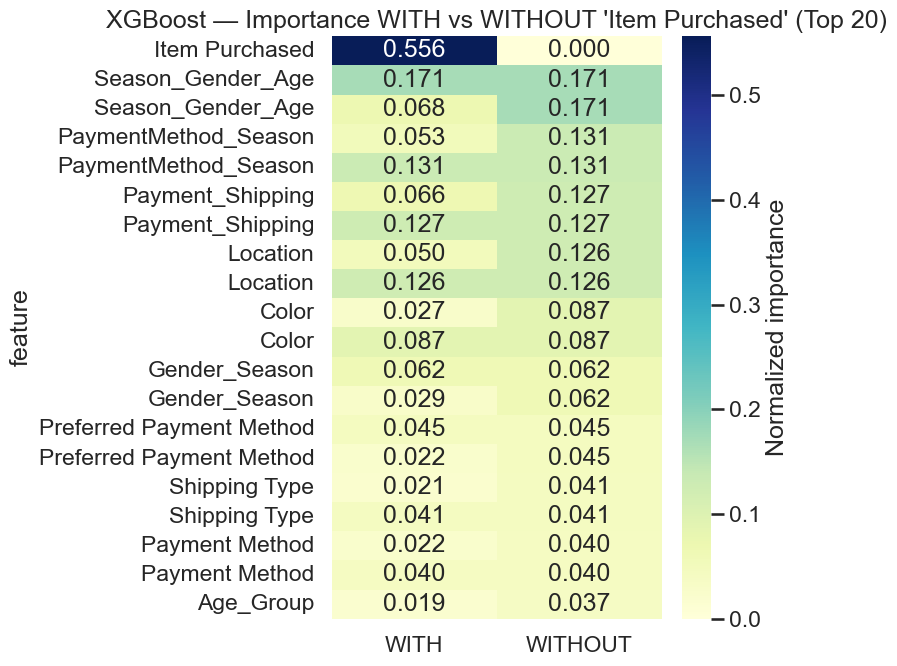

[Stage 8] Saved: figures/importance_delta_heatmap_xgboost.png

[WITH Item Purchased] Models found: ['Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']


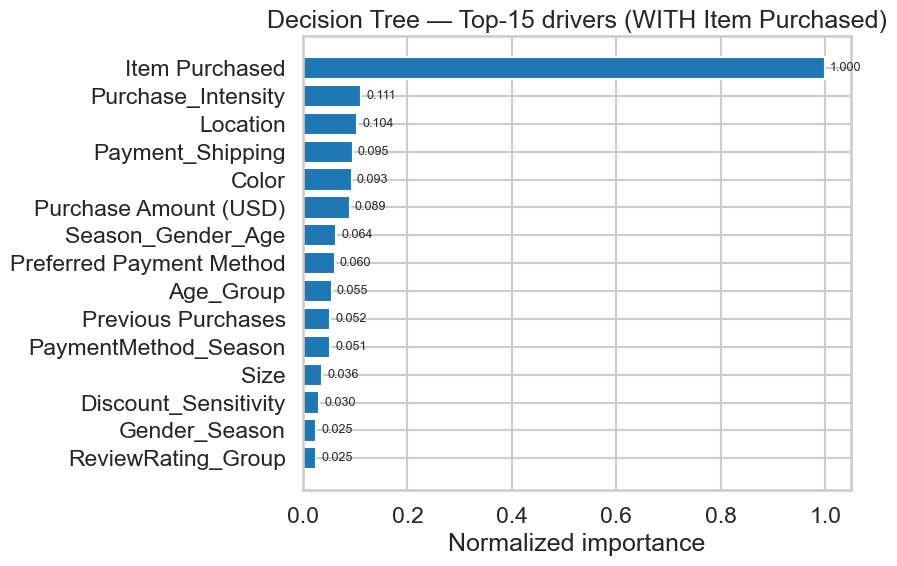

[WITH Item Purchased] Saved: figures/with_item_purchased_decision_tree_top15_bar.png


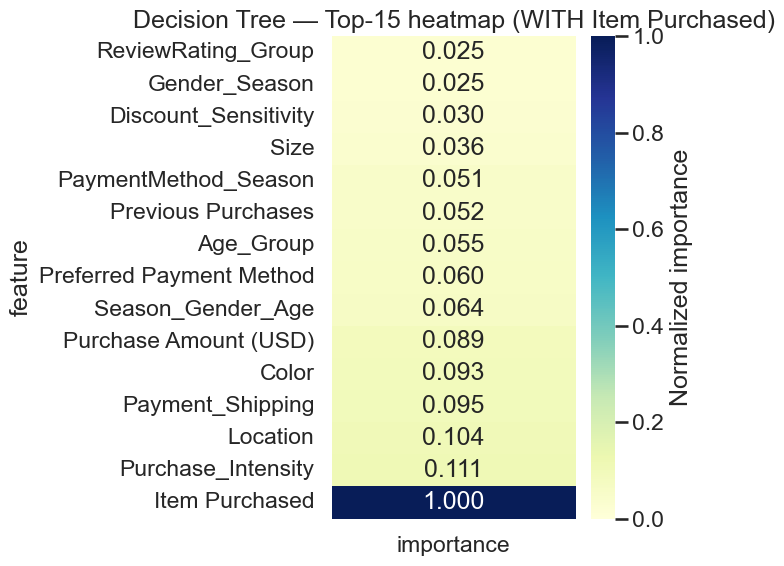

[WITH Item Purchased] Saved: figures/with_item_purchased_decision_tree_top15_heatmap.png


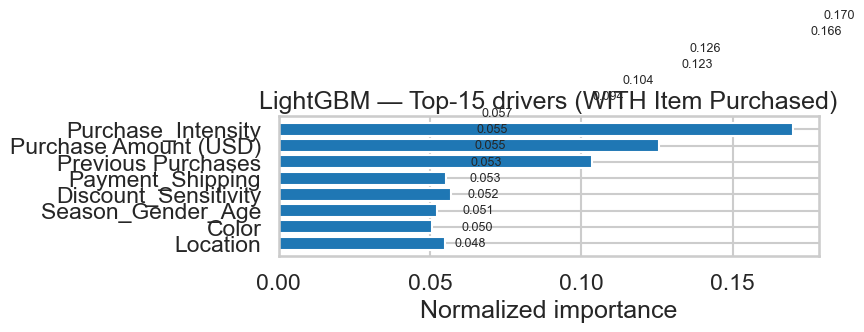

[WITH Item Purchased] Saved: figures/with_item_purchased_lightgbm_top15_bar.png


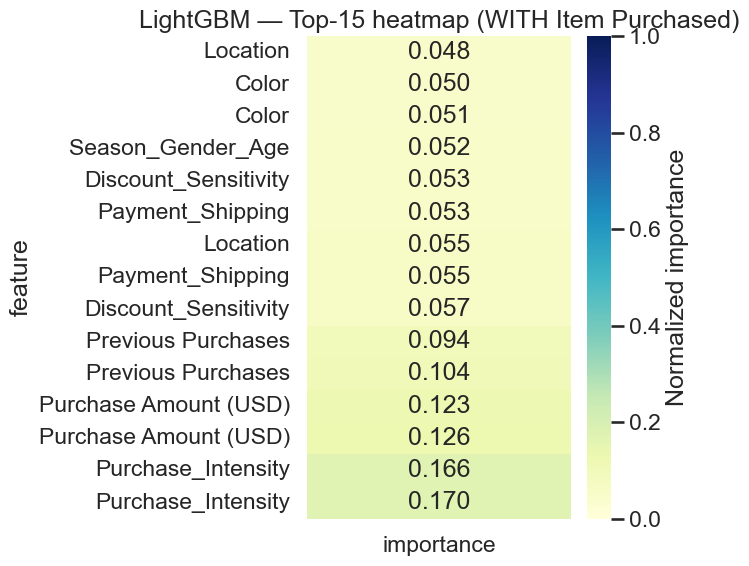

[WITH Item Purchased] Saved: figures/with_item_purchased_lightgbm_top15_heatmap.png


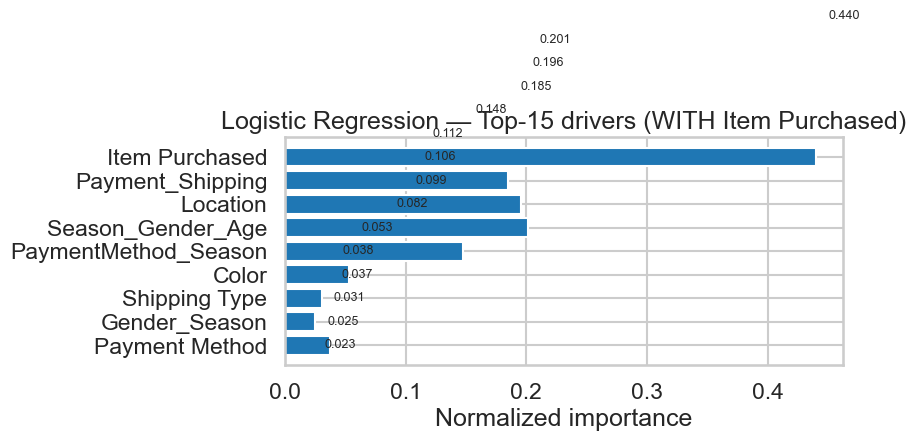

[WITH Item Purchased] Saved: figures/with_item_purchased_logistic_regression_top15_bar.png


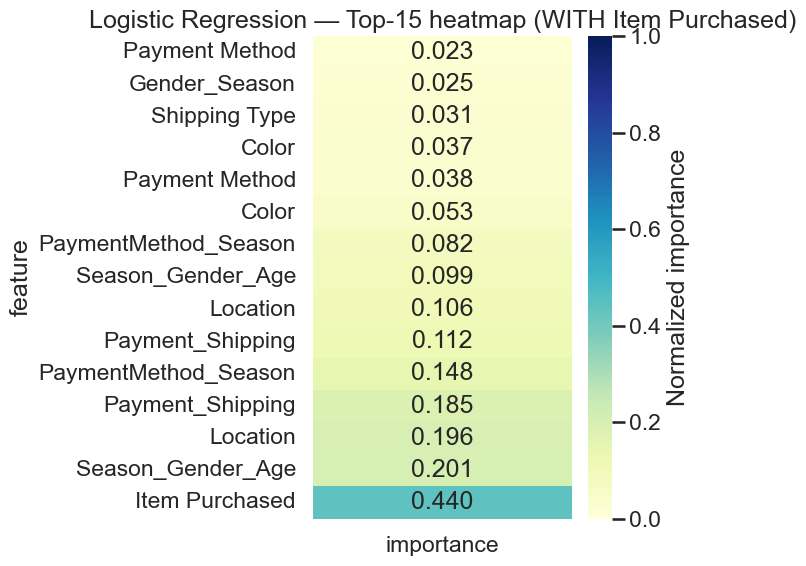

[WITH Item Purchased] Saved: figures/with_item_purchased_logistic_regression_top15_heatmap.png


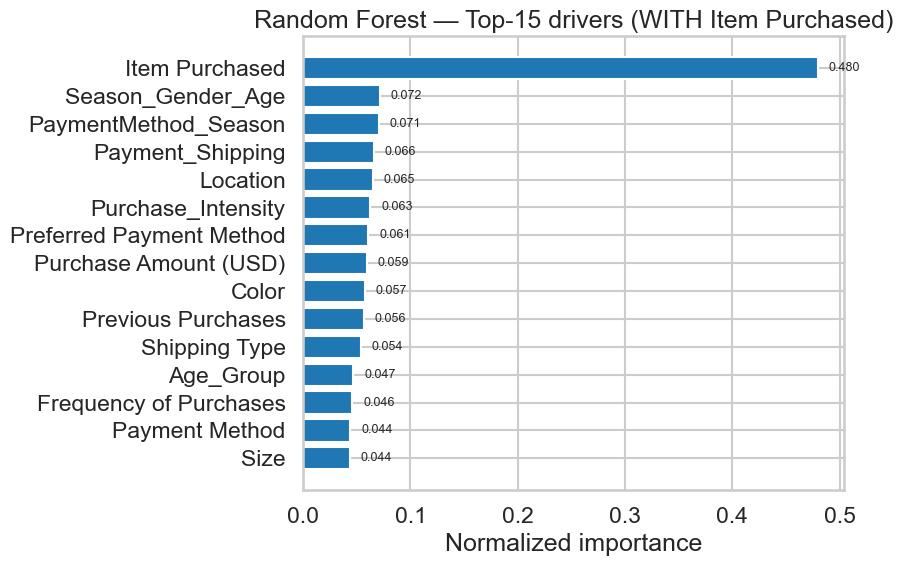

[WITH Item Purchased] Saved: figures/with_item_purchased_random_forest_top15_bar.png


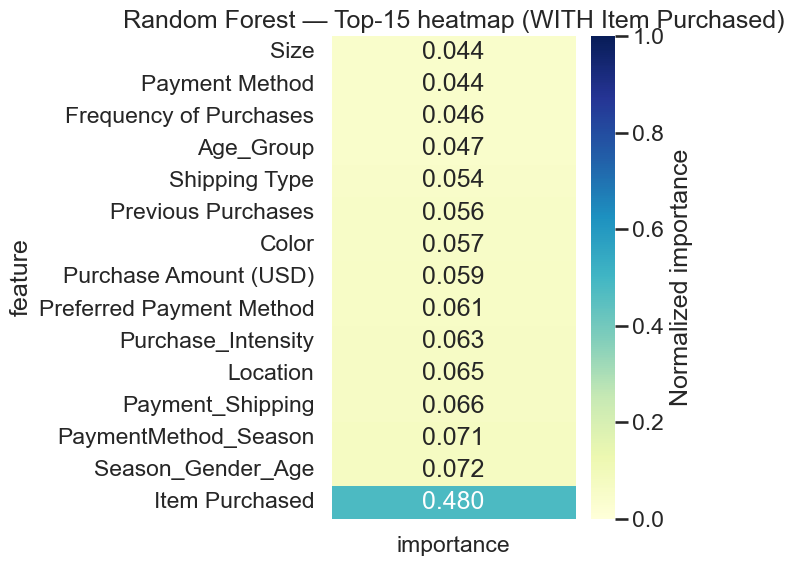

[WITH Item Purchased] Saved: figures/with_item_purchased_random_forest_top15_heatmap.png


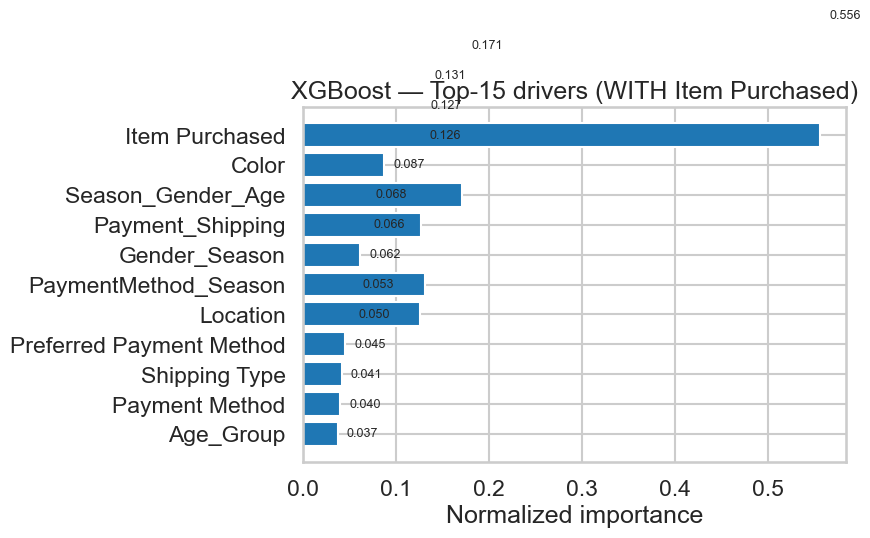

[WITH Item Purchased] Saved: figures/with_item_purchased_xgboost_top15_bar.png


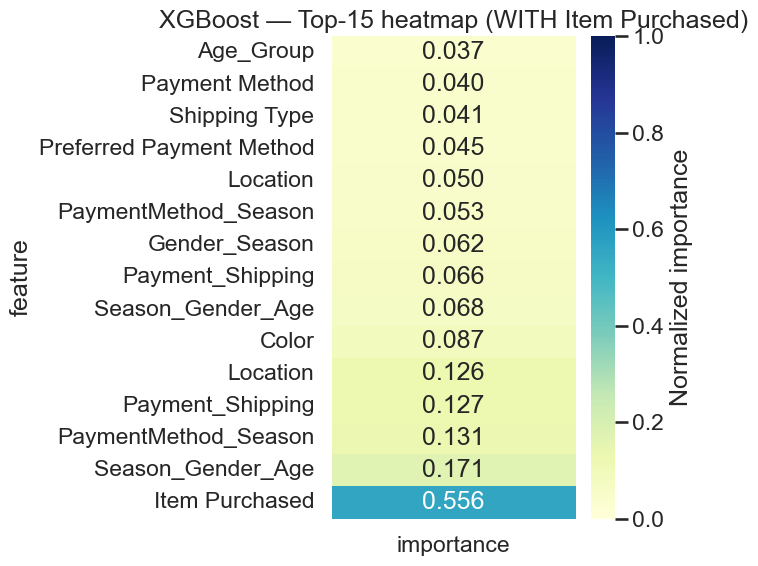

[WITH Item Purchased] Saved: figures/with_item_purchased_xgboost_top15_heatmap.png

[WITHOUT Item Purchased] Models found: ['Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']


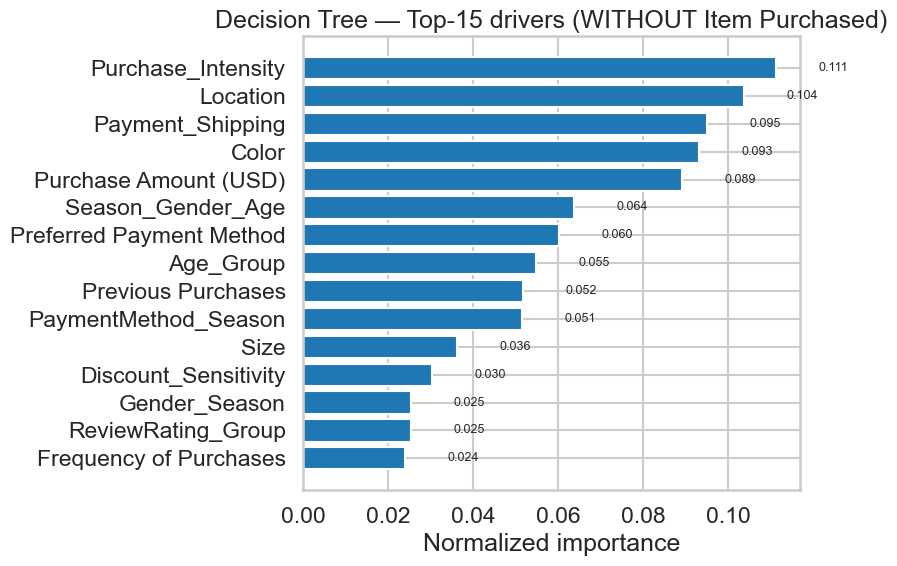

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_decision_tree_top15_bar.png


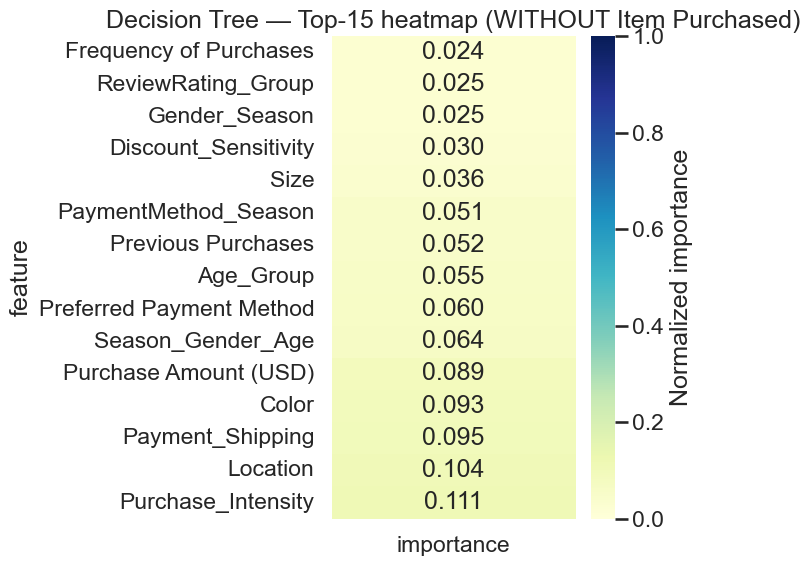

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_decision_tree_top15_heatmap.png


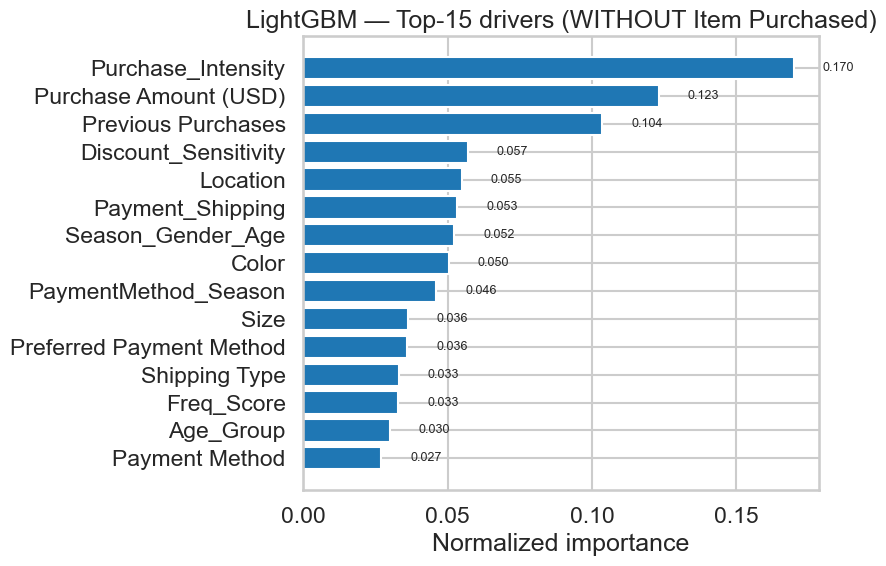

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_lightgbm_top15_bar.png


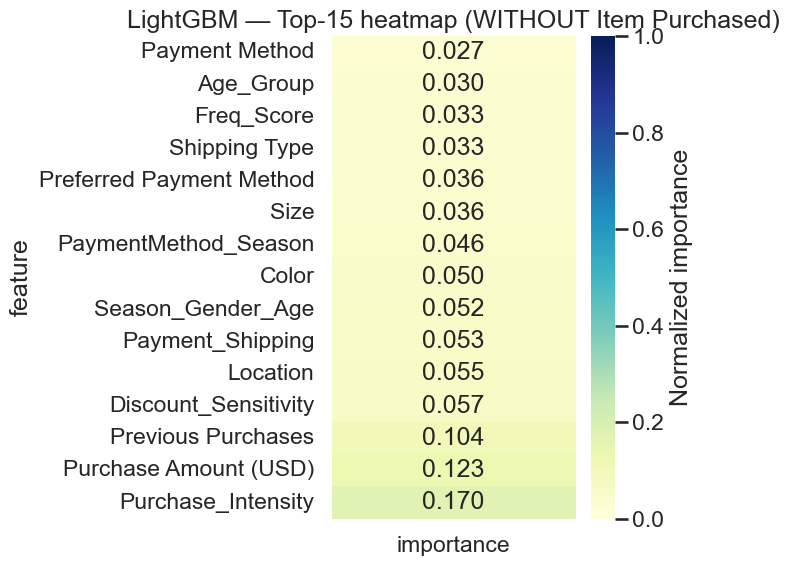

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_lightgbm_top15_heatmap.png


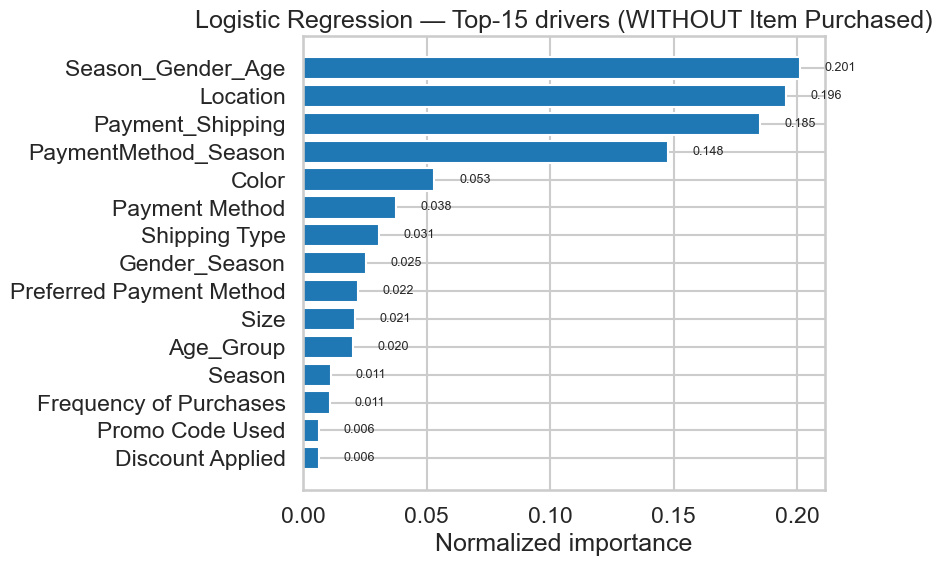

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_logistic_regression_top15_bar.png


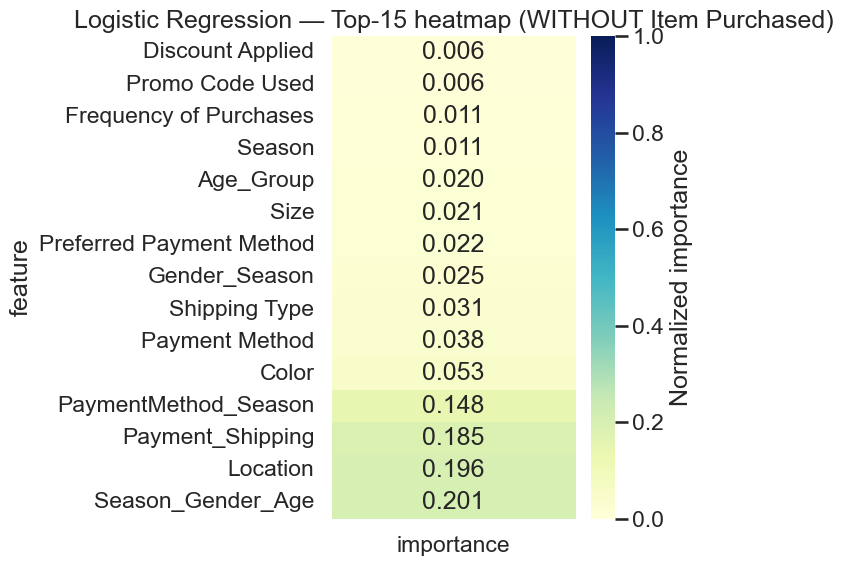

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_logistic_regression_top15_heatmap.png


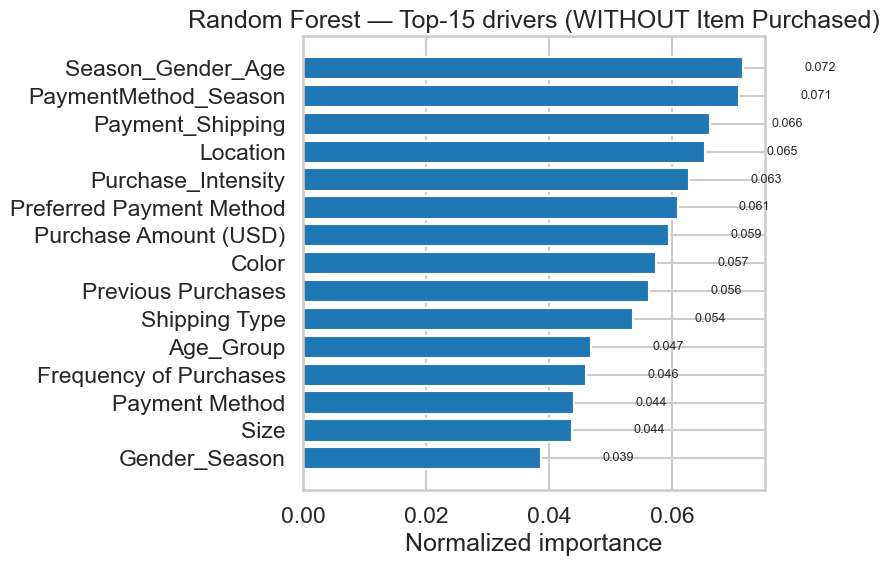

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_random_forest_top15_bar.png


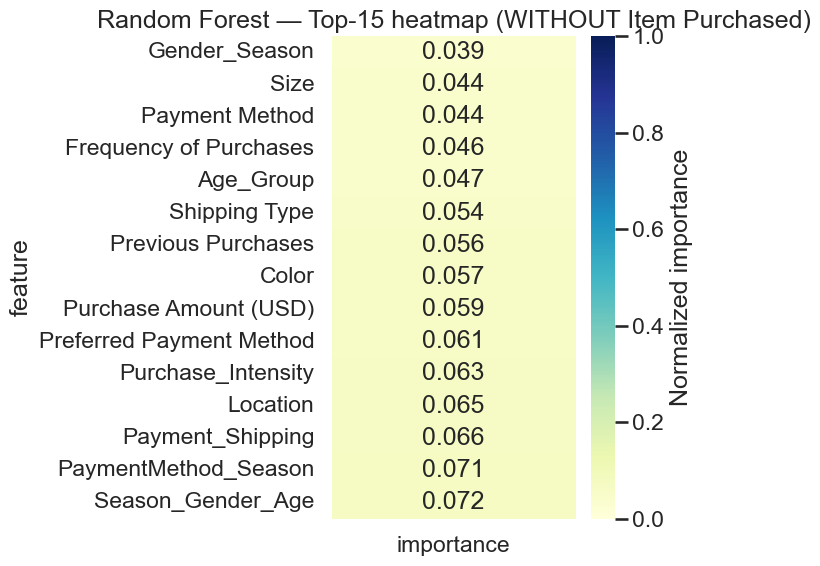

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_random_forest_top15_heatmap.png


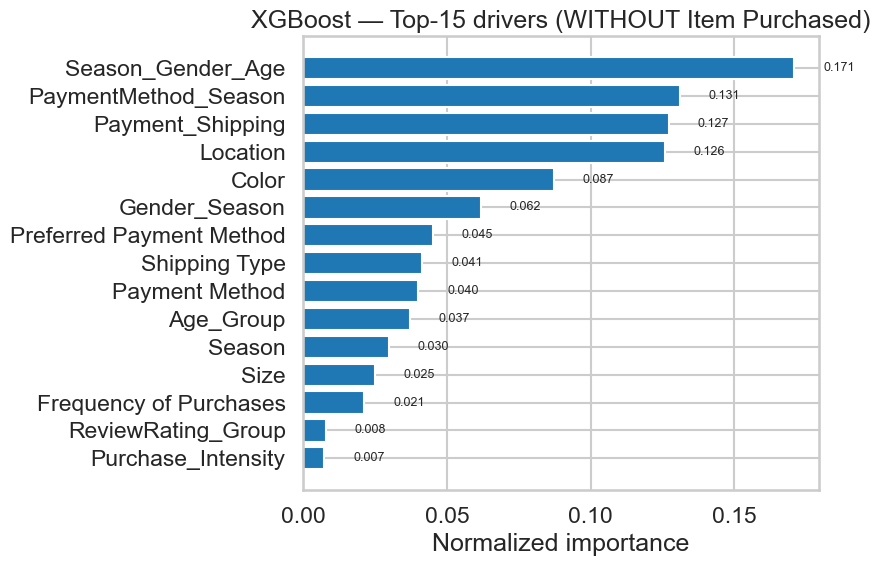

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_xgboost_top15_bar.png


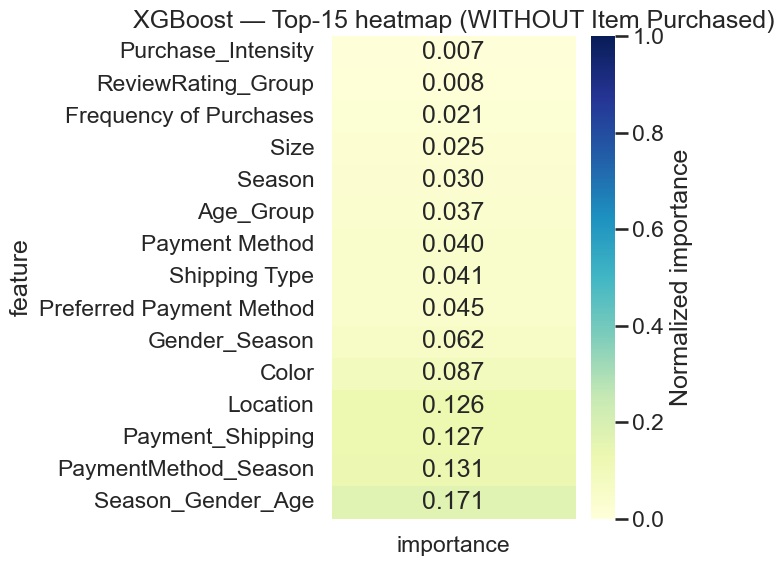

[WITHOUT Item Purchased] Saved: figures/without_item_purchased_xgboost_top15_heatmap.png

[Stage 8] Done: delta table + all visuals were printed and saved.


In [16]:
# ======================================================================
# STAGE 8 - STEP 2B/2C/2D
# Delta view + Top-15 visuals WITH vs WITHOUT "Item Purchased"
# ======================================================================
# We ran feature importance twice:
#   1) Including "Item Purchased"
#   2) Removing "Item Purchased"
#
# This block shows:
#   • WHAT CHANGED between the two runs (delta view)
#   • Clear visuals for the Top-15 drivers in each scenario
#
# Why this matters:
# If "Item Purchased" dominates the model, it can hide other business drivers.
# Removing it helps reveal broader, more actionable factors (e.g., Season, Age, Location).
#
# Inputs:
#   - tables/feature_ranks_with_without_item_purchased.csv
#
# Outputs (printed + saved + shown):
#   - tables/feature_importance_delta.csv
#   - figures/importance_delta_heatmap_<model>.png            (Top-20 WITH vs WITHOUT per model)
#   - figures/with_item_<model>_top15_bar.png                 (Top-15 WITH)
#   - figures/with_item_<model>_top15_heatmap.png             (Top-15 WITH)
#   - figures/without_item_<model>_top15_bar.png              (Top-15 WITHOUT)
#   - figures/without_item_<model>_top15_heatmap.png          (Top-15 WITHOUT)
# ======================================================================

# -----------------------------
# 0) Imports (only what we need)
# -----------------------------
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# -----------------------------
# 1) Load the combined importance table
# -----------------------------
# Stakeholder note:
# This file contains one row per (scenario, model, feature) with importance scores.
CSV_PATH = "tables/feature_ranks_with_without_item_purchased.csv"
assert os.path.exists(CSV_PATH), f"Missing {CSV_PATH}. Run Stage 8 Step 2A first."

ranks = pd.read_csv(CSV_PATH)
print(f"[Stage 8] Loaded: {CSV_PATH} | shape={ranks.shape}")

# -----------------------------
# 2) Standardise the importance column (robust)
# -----------------------------
# Stakeholder note:
# We prefer using "normalized importance" because it is comparable across models.
# Different code versions may name this column slightly differently.
if "normalized_importance" in ranks.columns:
    imp_col = "normalized_importance"
elif "normalized" in ranks.columns:
    imp_col = "normalized"
elif "raw_importance" in ranks.columns:
    # Last resort: derive a comparable scale within each (scenario, model)
    ranks["normalized_importance"] = (
        ranks.groupby(["scenario", "model"])["raw_importance"]
             .transform(lambda s: s / (s.sum() if s.sum() > 0 else 1.0))
    )
    imp_col = "normalized_importance"
else:
    raise ValueError(
        "Could not find an importance column. Expected one of: "
        "'normalized_importance', 'normalized', or 'raw_importance'."
    )

# Keep only what we need for later steps
keep = ranks.loc[:, ["scenario", "model", "feature", imp_col]].rename(columns={imp_col: "importance"}).copy()

# Sanity: ensure numeric
keep["importance"] = pd.to_numeric(keep["importance"], errors="coerce").fillna(0.0)

print(f"[Stage 8] Using importance column: {imp_col} -> renamed to 'importance'")

# ======================================================================
# STEP 2B — DELTA VIEW (WITH minus WITHOUT)
# ======================================================================
# Stakeholder note:
# For each model and feature:
#   DELTA = importance(WITH Item) - importance(WITHOUT Item)
# Interpretation:
#   • Positive DELTA: feature looks more important when Item Purchased is included
#   • Negative DELTA: feature becomes more important after removing Item Purchased
#     (i.e., Item Purchased was overshadowing it)
# ======================================================================

# -----------------------------
# 3) Build a clean WITH vs WITHOUT table
# -----------------------------
with_mask = keep["scenario"].str.upper().str.startswith("WITH")
wo_mask   = keep["scenario"].str.upper().str.startswith("WITHOUT")

with_tbl = keep.loc[with_mask, ["model", "feature", "importance"]].rename(columns={"importance": "WITH"})
wo_tbl   = keep.loc[wo_mask,   ["model", "feature", "importance"]].rename(columns={"importance": "WITHOUT"})

delta = (
    with_tbl.merge(wo_tbl, on=["model", "feature"], how="outer")
            .fillna(0.0)
)
delta["DELTA_WITH_MINUS_WITHOUT"] = delta["WITH"] - delta["WITHOUT"]

# -----------------------------
# 4) Save delta table (for reporting / appendix)
# -----------------------------
OUT_DELTA_CSV = "tables/feature_importance_delta.csv"
delta_sorted = delta.sort_values(["model", "DELTA_WITH_MINUS_WITHOUT"], ascending=[True, False])
delta_sorted.to_csv(OUT_DELTA_CSV, index=False)

print(f"[Stage 8] Saved: {OUT_DELTA_CSV} | rows={len(delta_sorted)}")

# -----------------------------
# 5) Print a short “what changed” summary (Top movers)
# -----------------------------
print("\n[Stage 8] Delta summary (Top 10 increases and decreases per model):")
for m, sub in delta.groupby("model"):
    sub = sub.copy()
    up = sub.sort_values("DELTA_WITH_MINUS_WITHOUT", ascending=False).head(10)
    down = sub.sort_values("DELTA_WITH_MINUS_WITHOUT", ascending=True).head(10)

    print(f"\n--- {m}: biggest INCREASES (WITH - WITHOUT) ---")
    print(up[["feature", "WITH", "WITHOUT", "DELTA_WITH_MINUS_WITHOUT"]].to_string(index=False))

    print(f"\n--- {m}: biggest DECREASES (WITH - WITHOUT) ---")
    print(down[["feature", "WITH", "WITHOUT", "DELTA_WITH_MINUS_WITHOUT"]].to_string(index=False))

# -----------------------------
# 6) Heatmap per model: Top-20 features by max importance across scenarios
# -----------------------------
# Stakeholder note:
# Heatmaps make it easy to see which drivers stay strong vs. which ones change
# when "Item Purchased" is removed.
os.makedirs("figures", exist_ok=True)

for m, sub in delta.groupby("model"):
    sub = sub.copy()
    sub["max_imp"] = sub[["WITH", "WITHOUT"]].max(axis=1)
    top = sub.sort_values("max_imp", ascending=False).head(20)

    mat = top.set_index("feature")[["WITH", "WITHOUT"]]

    plt.figure(figsize=(8, max(5, 0.35 * len(top))))
    ax = sns.heatmap(
        mat,
        annot=True, fmt=".3f",
        cmap="YlGnBu",
        vmin=0,
        vmax=float(mat.values.max()) if mat.values.max() > 0 else 1.0,
        cbar_kws={"label": "Normalized importance"}
    )
    ax.set_title(f"{m} — Importance WITH vs WITHOUT 'Item Purchased' (Top 20)")
    plt.tight_layout()

    out_fig = f"figures/importance_delta_heatmap_{m.replace(' ', '_').lower()}.png"
    plt.savefig(out_fig, dpi=220)
    plt.show()
    print(f"[Stage 8] Saved: {out_fig}")

# ======================================================================
# STEP 2C + 2D — TOP-15 VISUALS PER SCENARIO (bar + heatmap)
# ======================================================================
def plot_topk_for_scenario(df_keep: pd.DataFrame, scenario_prefix: str, tag: str, topk: int = 15):
    """
    Create Top-K visuals per model for one scenario.
    Saves + displays:
      - horizontal bar chart
      - 1-column heatmap
    """
    scen_mask = df_keep["scenario"].str.upper().str.startswith(scenario_prefix.upper())
    df_s = df_keep.loc[scen_mask, ["model", "feature", "importance"]].copy()

    models = sorted(df_s["model"].unique().tolist())
    print(f"\n[{tag}] Models found: {models}")

    for m in models:
        sub = df_s[df_s["model"] == m].copy()
        if sub.empty:
            continue

        top = sub.nlargest(topk, "importance").sort_values("importance", ascending=True)

        # --- (A) Bar chart ---
        plt.figure(figsize=(9, max(5, 0.40 * len(top))))
        plt.barh(top["feature"], top["importance"])
        for y, v in enumerate(top["importance"].values):
            plt.text(v + 0.01, y, f"{v:.3f}", va="center", fontsize=9)
        plt.title(f'{m} — Top-{topk} drivers ({tag})')
        plt.xlabel("Normalized importance")
        plt.tight_layout()

        out_bar = f'figures/{tag.lower().replace(" ", "_")}_{m.replace(" ","_").lower()}_top{topk}_bar.png'
        plt.savefig(out_bar, dpi=220)
        plt.show()
        print(f"[{tag}] Saved: {out_bar}")

        # --- (B) 1-column heatmap ---
        mat = top.set_index("feature")[["importance"]]
        plt.figure(figsize=(7, max(5, 0.40 * len(top))))
        ax = sns.heatmap(
            mat,
            annot=True, fmt=".3f",
            cmap="YlGnBu",
            vmin=0,
            vmax=1.0,
            cbar_kws={"label": "Normalized importance"}
        )
        ax.set_title(f'{m} — Top-{topk} heatmap ({tag})')
        plt.tight_layout()

        out_hm = f'figures/{tag.lower().replace(" ", "_")}_{m.replace(" ","_").lower()}_top{topk}_heatmap.png'
        plt.savefig(out_hm, dpi=220)
        plt.show()
        print(f"[{tag}] Saved: {out_hm}")

# -----------------------------
# 7) Run visuals for both scenarios
# -----------------------------
plot_topk_for_scenario(keep, scenario_prefix="WITH", tag='WITH Item Purchased', topk=15)
plot_topk_for_scenario(keep, scenario_prefix="WITHOUT", tag='WITHOUT Item Purchased', topk=15)

print("\n[Stage 8] Done: delta table + all visuals were printed and saved.")

#### STAGE 8 - PERMUTATION IMPORTANCE ON THE TEST SET AT RAW-FEATURE LEVEL

[Stage 8][WITH] Permutation targets: ['Random Forest', 'XGBoost', 'LightGBM', 'Decision Tree']

[Stage 8][WITH] Running permutation importance (TEST) for: Random Forest
[Stage 8][WITH] Saved: tables/perm_importance_random_forest_WITH_test.csv
[Stage 8][WITH] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Item Purchased            0.377115  0.015949      0.377115
Season                    0.016029  0.005905      0.016029
Season_Gender_Age         0.012281  0.003290      0.012281
Purchase_Intensity        0.010827  0.004337      0.010827
Gender_Season             0.010435  0.006388      0.010435
Payment_Shipping          0.009046  0.003673      0.009046
Freq_Score                0.008055  0.004740      0.008055
Payment Method            0.007666  0.004965      0.007666
Age_Group                 0.007654  0.004634      0.007654
Gender                    0.005754  0.004683      0.005754
Previous Purchases        0.005748  0.00488

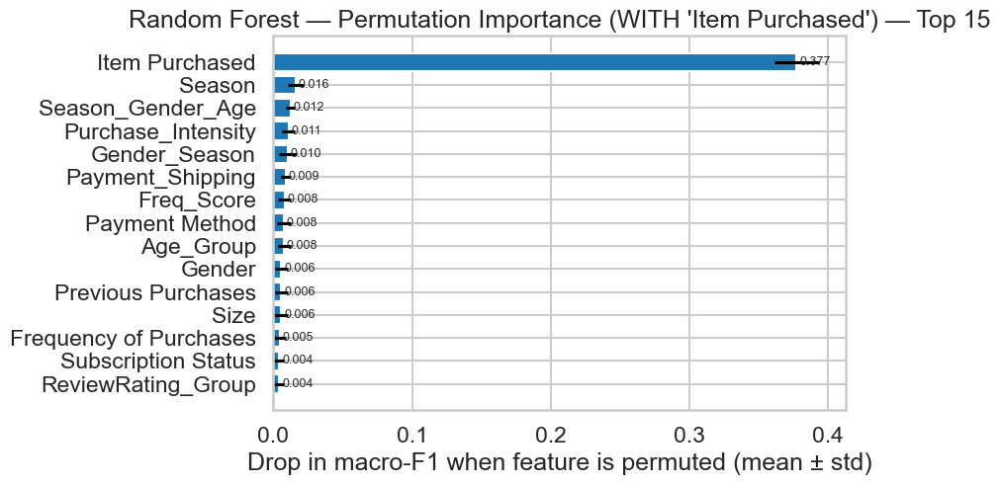

[Stage 8] Saved: figures/perm_importance_random_forest_WITH_top15_bar.png


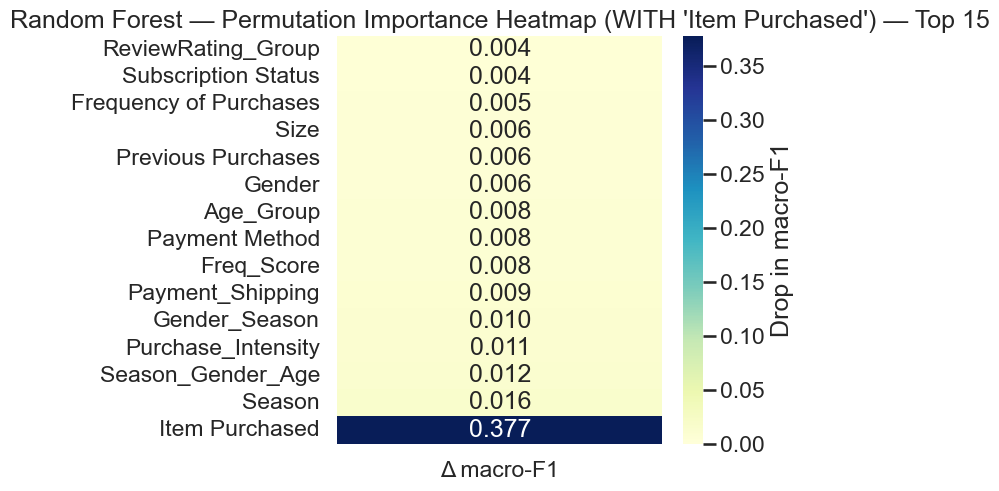

[Stage 8] Saved: figures/perm_importance_random_forest_WITH_top15_heat.png

[Stage 8][WITH] Running permutation importance (TEST) for: XGBoost
[Stage 8][WITH] Saved: tables/perm_importance_xgboost_WITH_test.csv
[Stage 8][WITH] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Item Purchased            0.374494  0.013097      0.374494
Season                    0.002773  0.002691      0.002773
Freq_Score                0.002054  0.002033      0.002054
PaymentMethod_Season      0.001743  0.002879      0.001743
Age_Group                 0.001046  0.003119      0.001046
Payment_Shipping          0.000908  0.002962      0.000908
ReviewRating_Group        0.000261  0.001666      0.000261
Preferred Payment Method  0.000231  0.002740      0.000231
Previous Purchases        0.000073  0.001582      0.000073
Shipping Type             0.000031  0.000935      0.000031
Discount Applied          0.000000  0.000000      0.000000
Promo Code Used 

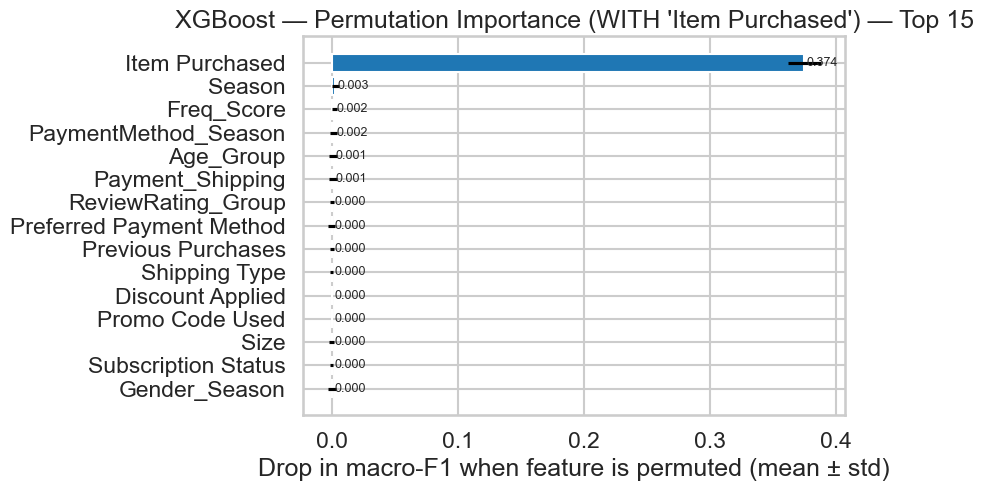

[Stage 8] Saved: figures/perm_importance_xgboost_WITH_top15_bar.png


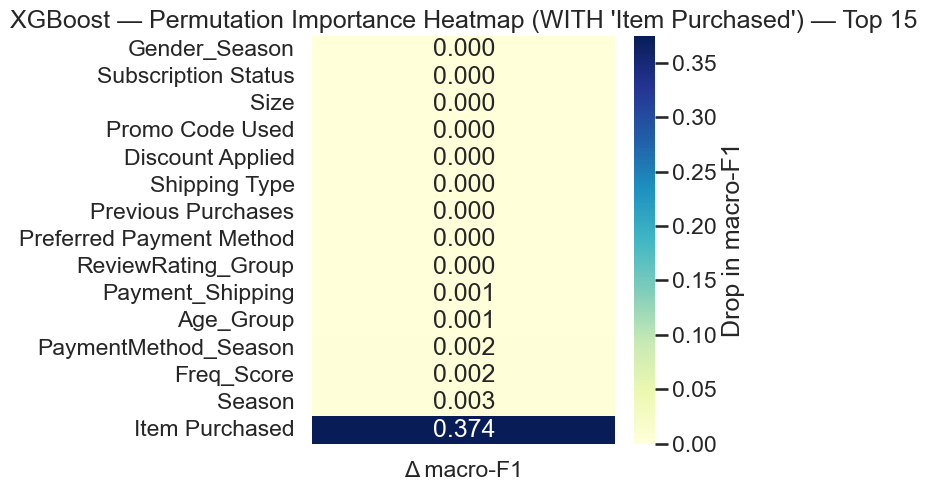

[Stage 8] Saved: figures/perm_importance_xgboost_WITH_top15_heat.png

[Stage 8][WITH] Running permutation importance (TEST) for: LightGBM
[Stage 8][WITH] Saved: tables/perm_importance_lightgbm_WITH_test.csv
[Stage 8][WITH] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Item Purchased            0.357926  0.013542      0.357926
ReviewRating_Group        0.008992  0.003339      0.008992
Season_Gender_Age         0.006494  0.004524      0.006494
Previous Purchases        0.005664  0.005547      0.005664
PaymentMethod_Season      0.004359  0.004445      0.004359
Payment Method            0.003502  0.004605      0.003502
Gender_Season             0.002598  0.003711      0.002598
Purchase_Intensity        0.002448  0.006282      0.002448
Season                    0.001788  0.005301      0.001788
Payment_Shipping          0.001081  0.005732      0.001081
Preferred Payment Method  0.000900  0.006378      0.000900
Discount Applied    

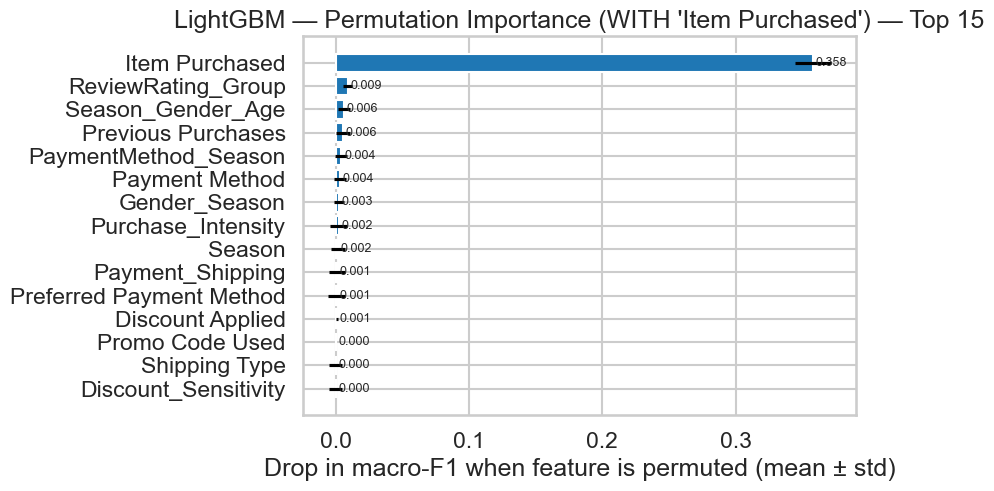

[Stage 8] Saved: figures/perm_importance_lightgbm_WITH_top15_bar.png


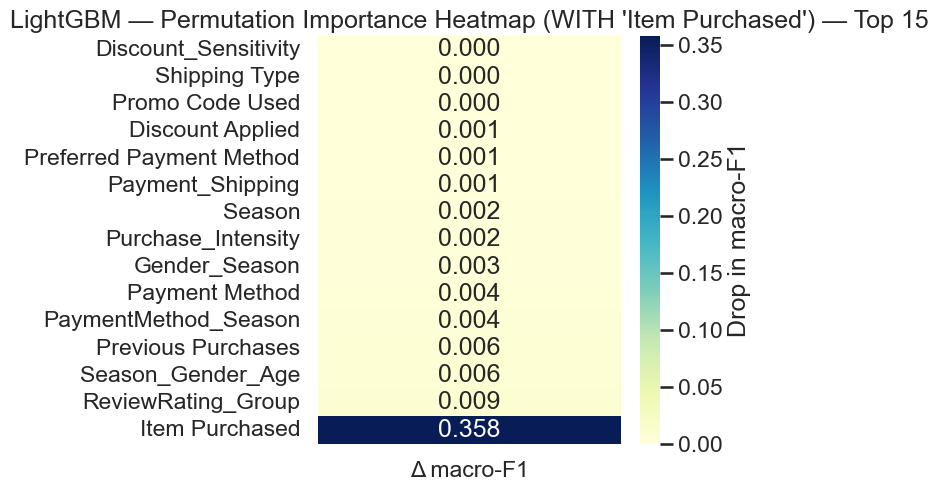

[Stage 8] Saved: figures/perm_importance_lightgbm_WITH_top15_heat.png

[Stage 8][WITH] Running permutation importance (TEST) for: Decision Tree
[Stage 8][WITH] Saved: tables/perm_importance_decision_tree_WITH_test.csv
[Stage 8][WITH] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Item Purchased            0.387653  0.013256      0.387653
Gender                    0.000000  0.000000      0.000000
Discount_Sensitivity      0.000000  0.000000      0.000000
Purchase_Intensity        0.000000  0.000000      0.000000
Season_Gender_Age         0.000000  0.000000      0.000000
PaymentMethod_Season      0.000000  0.000000      0.000000
Payment_Shipping          0.000000  0.000000      0.000000
Gender_Season             0.000000  0.000000      0.000000
ReviewRating_Group        0.000000  0.000000      0.000000
Age_Group                 0.000000  0.000000      0.000000
Frequency of Purchases    0.000000  0.000000      0.000000
Preferred

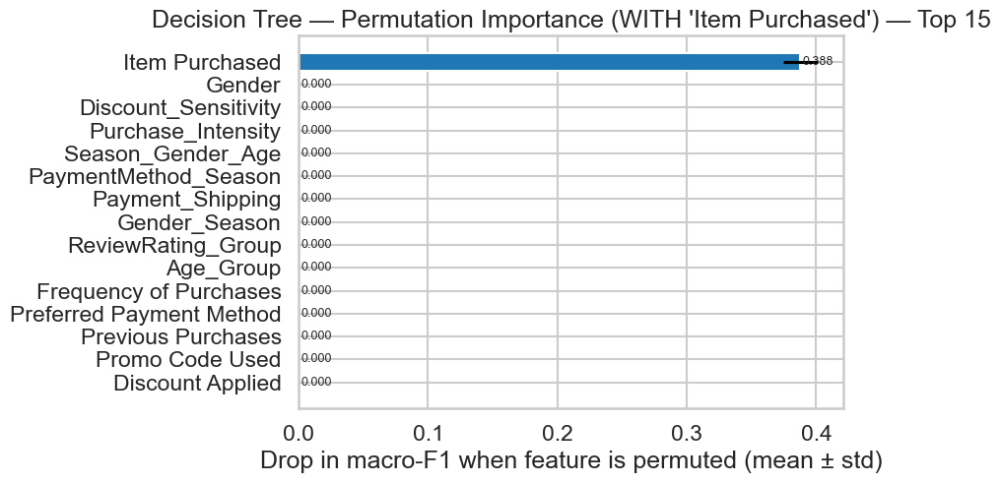

[Stage 8] Saved: figures/perm_importance_decision_tree_WITH_top15_bar.png


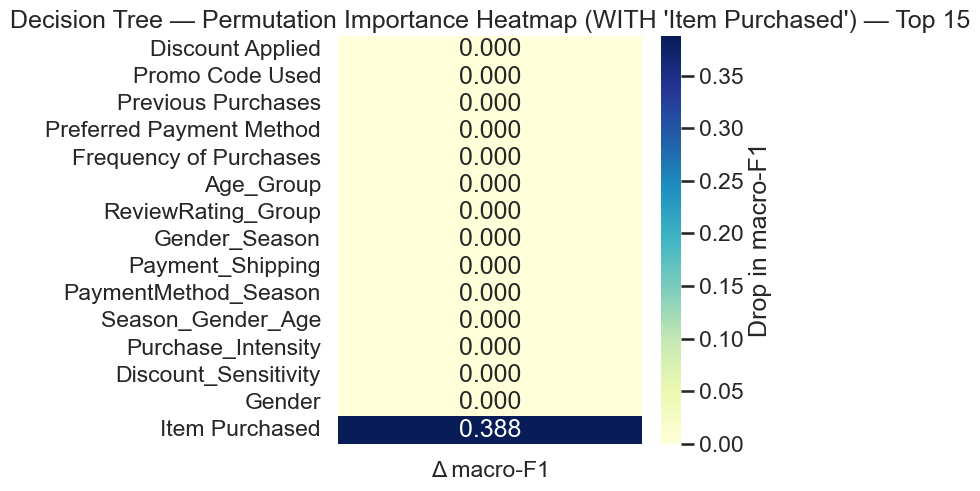

[Stage 8] Saved: figures/perm_importance_decision_tree_WITH_top15_heat.png
[Stage 8][WITHOUT] Models built: ['Decision Tree', 'Random Forest', 'Logistic Regression', 'XGBoost', 'LightGBM']
[Stage 8][WITHOUT] Test columns after drop: 23 features
[Stage 8][WITHOUT] Permutation targets: ['Decision Tree', 'Random Forest', 'Logistic Regression', 'XGBoost', 'LightGBM']

[Stage 8][WITHOUT] Running permutation importance (TEST) for: Decision Tree
[Stage 8][WITHOUT] Saved: tables/perm_importance_decision_tree_WITHOUT_test.csv
[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):
                            mean       std  mean_clipped
Payment Method          0.000631  0.001040      0.000631
Gender_Season           0.000333  0.000741      0.000333
Discount_Sensitivity    0.000212  0.001225      0.000212
PaymentMethod_Season    0.000075  0.003137      0.000075
Gender                  0.000000  0.000000      0.000000
Promo Code Used         0.000000  0.000000      0.000000
Discount A

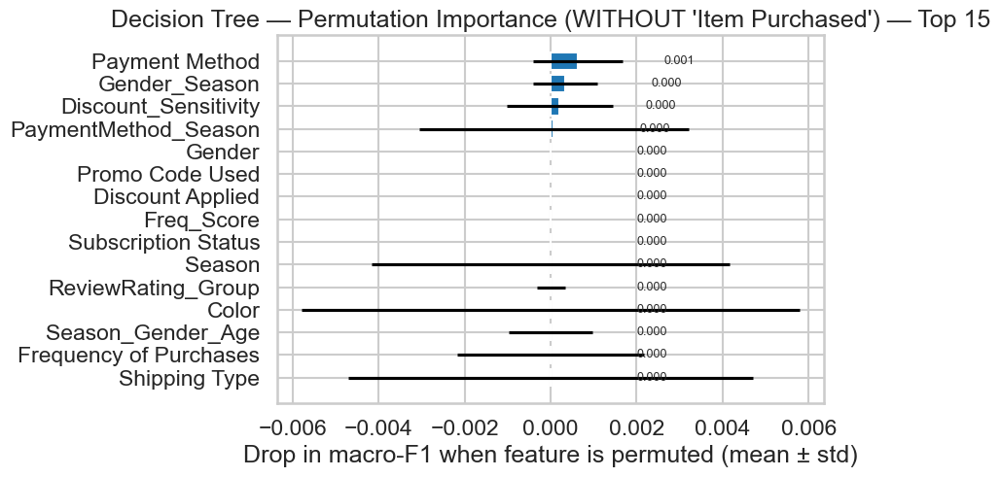

[Stage 8] Saved: figures/perm_importance_decision_tree_WITHOUT_top15_bar.png

[Stage 8][WITHOUT] Running permutation importance (TEST) for: Random Forest
[Stage 8][WITHOUT] Saved: tables/perm_importance_random_forest_WITHOUT_test.csv
[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Season_Gender_Age         0.012489  0.005736      0.012489
Previous Purchases        0.011012  0.005076      0.011012
Gender_Season             0.010122  0.004064      0.010122
Payment Method            0.008566  0.005601      0.008566
Purchase_Intensity        0.006838  0.005930      0.006838
Size                      0.006546  0.003916      0.006546
Discount_Sensitivity      0.006540  0.003163      0.006540
Gender                    0.006238  0.003333      0.006238
Purchase Amount (USD)     0.006119  0.006453      0.006119
Age_Group                 0.005918  0.003456      0.005918
Payment_Shipping          0.005743  0.004599     

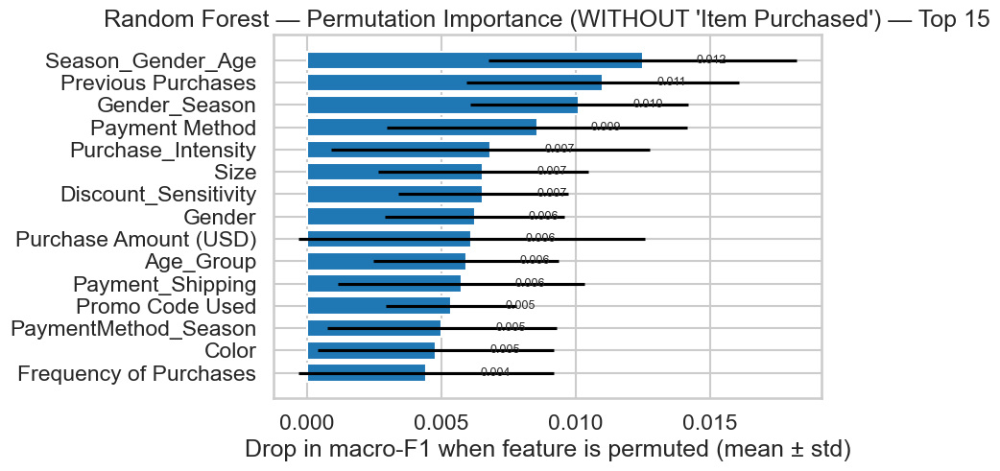

[Stage 8] Saved: figures/perm_importance_random_forest_WITHOUT_top15_bar.png

[Stage 8][WITHOUT] Running permutation importance (TEST) for: Logistic Regression
[Stage 8][WITHOUT] Saved: tables/perm_importance_logistic_regression_WITHOUT_test.csv
[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
PaymentMethod_Season      0.005515  0.008392      0.005515
Preferred Payment Method  0.004237  0.007231      0.004237
Payment_Shipping          0.003847  0.010224      0.003847
Payment Method            0.003292  0.005962      0.003292
Frequency of Purchases    0.002659  0.004864      0.002659
Previous Purchases        0.002067  0.004005      0.002067
Subscription Status       0.001964  0.001747      0.001964
Discount_Sensitivity      0.001486  0.006110      0.001486
Location                  0.001438  0.007785      0.001438
Size                      0.001228  0.006450      0.001228
ReviewRating_Group        0.001073  0

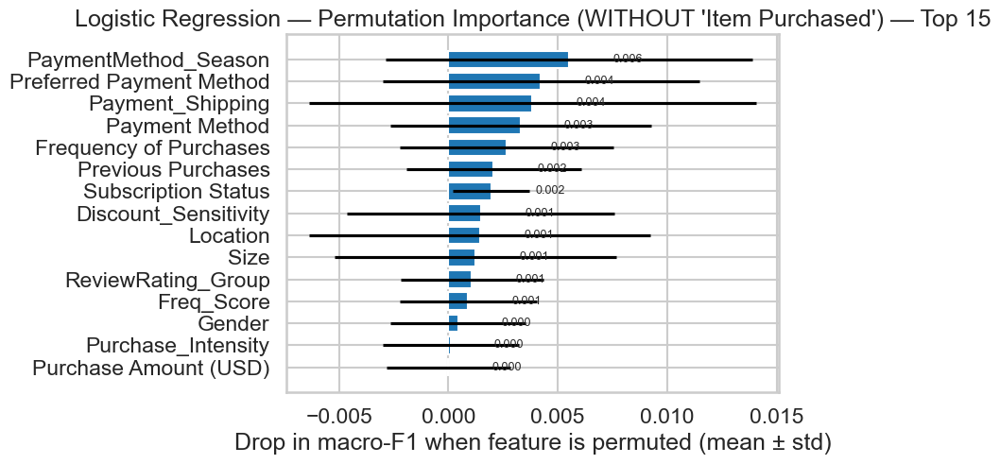

[Stage 8] Saved: figures/perm_importance_logistic_regression_WITHOUT_top15_bar.png

[Stage 8][WITHOUT] Running permutation importance (TEST) for: XGBoost
[Stage 8][WITHOUT] Saved: tables/perm_importance_xgboost_WITHOUT_test.csv
[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Season                    0.005933  0.003704      0.005933
Season_Gender_Age         0.000733  0.006785      0.000733
Age_Group                 0.000536  0.003976      0.000536
Payment Method            0.000481  0.004767      0.000481
Gender                    0.000000  0.000000      0.000000
Discount Applied          0.000000  0.000000      0.000000
Promo Code Used           0.000000  0.000000      0.000000
ReviewRating_Group       -0.001042  0.002829      0.000000
PaymentMethod_Season     -0.001246  0.004705      0.000000
Freq_Score               -0.002777  0.002973      0.000000
Location                 -0.003554  0.006145      0.000

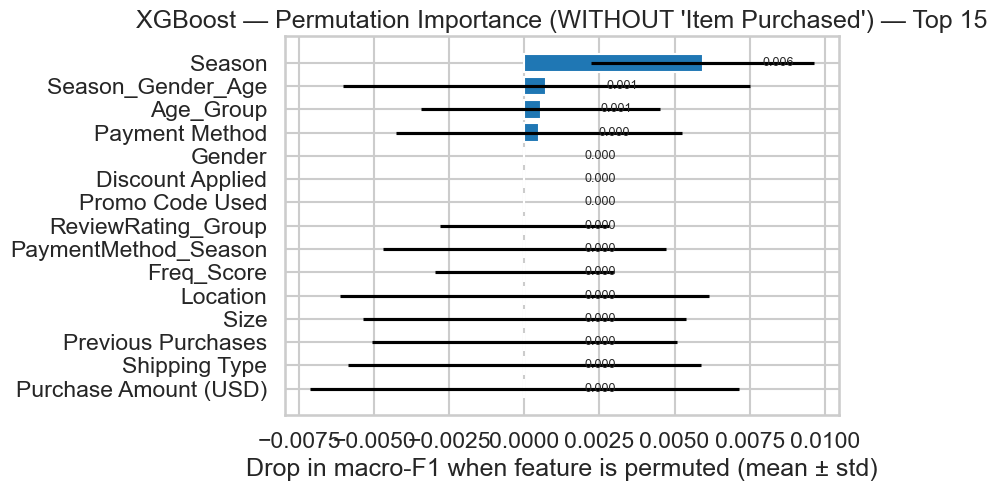

[Stage 8] Saved: figures/perm_importance_xgboost_WITHOUT_top15_bar.png

[Stage 8][WITHOUT] Running permutation importance (TEST) for: LightGBM
[Stage 8][WITHOUT] Saved: tables/perm_importance_lightgbm_WITHOUT_test.csv
[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):
                              mean       std  mean_clipped
Season_Gender_Age         0.013071  0.008133      0.013071
Purchase Amount (USD)     0.010664  0.008665      0.010664
Discount_Sensitivity      0.008291  0.008130      0.008291
ReviewRating_Group        0.007192  0.005331      0.007192
Preferred Payment Method  0.006908  0.008138      0.006908
Discount Applied          0.006483  0.004235      0.006483
Season                    0.005841  0.005928      0.005841
Purchase_Intensity        0.005562  0.013243      0.005562
Shipping Type             0.003601  0.008387      0.003601
Payment_Shipping          0.003463  0.007960      0.003463
Previous Purchases        0.003328  0.006799      0.003328
Size  

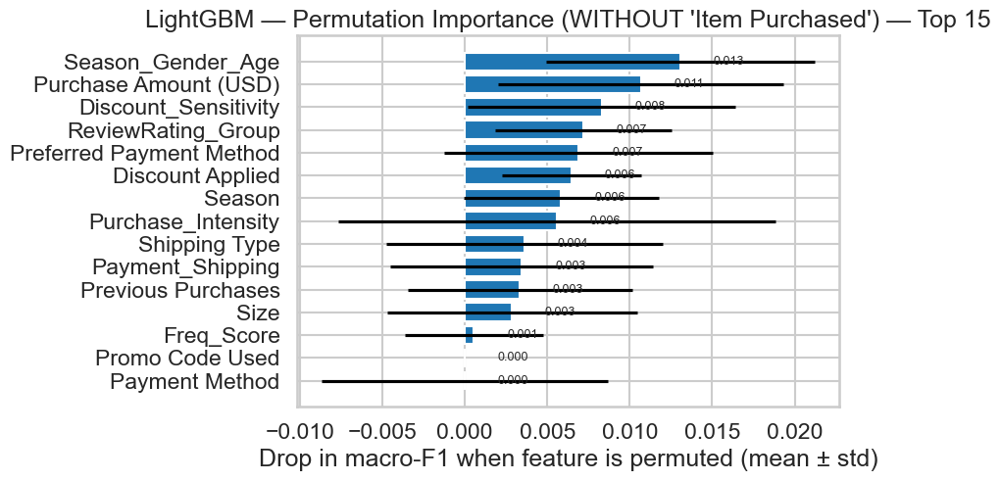

[Stage 8] Saved: figures/perm_importance_lightgbm_WITHOUT_top15_bar.png

[Stage 8] Done: all permutation-importance tables and visuals were printed and saved.


In [17]:
# ======================================================================
# STAGE 8 — STEP 3
# Permutation Importance on the TEST set at RAW-feature level
#   • 3A: WITH  "Item Purchased"  (uses trained_pipes already in memory)
#   • 3B: WITHOUT "Item Purchased" (refit pipelines safely, then run PI)
# ======================================================================
# We want to understand which input fields truly drive model performance.
# Permutation Importance answers:
#   "If we scramble one input column, how much does model quality drop?"
#
# Why it’s strong:
#   • Model-agnostic (works for trees, linear models, boosting, etc.)
#   • Measures real impact on the chosen metric (here: macro-F1)
#   • Runs on the TEST set (best indicator of real-world behaviour)
#
# Outputs created (printed + saved + shown):
#   WITH scenario:
#     - tables/perm_importance_<model>_WITH_test.csv
#     - figures/perm_importance_<model>_WITH_top15_bar.png
#     - figures/perm_importance_<model>_WITH_top15_heat.png
#   WITHOUT scenario:
#     - tables/perm_importance_<model>_WITHOUT_test.csv
#     - figures/perm_importance_<model>_WITHOUT_top15_bar.png
#     - figures/perm_importance_<model>_WITHOUT_top15_heat.png
#
# Requirements in memory:
#   - outputs dict from earlier stages (Stage 4):
#       outputs["X_train"], outputs["X_test"], outputs["y_train"], outputs["y_test"],
#       outputs["preprocessor"], outputs["classes"]
#   - trained_pipes dict from Stage 8 Step 1 (WITH scenario)
#   - top2_by_f1 list (optional; used to select focus models)
# ======================================================================

# -----------------------------
# 0) Imports (only what we need)
# -----------------------------
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.inspection import permutation_importance
from sklearn.base import clone
from imblearn.pipeline import Pipeline

# Finalists (used only for the WITHOUT scenario refit)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

# Optional LightGBM
INCLUDE_LGBM = True
try:
    from lightgbm import LGBMClassifier
except Exception:
    INCLUDE_LGBM = False

sns.set_style("whitegrid")

# -----------------------------
# 1) Safety checks + folders
# -----------------------------
assert "outputs" in globals(), "Missing `outputs`. Run Stage 4 setup cell first."
assert "trained_pipes" in globals(), "Missing `trained_pipes`. Run Stage 8 Step 1 first."

X_train = outputs["X_train"]
X_test  = outputs["X_test"]
y_train = outputs["y_train"]
y_test  = outputs["y_test"]
base_prep = outputs["preprocessor"]
classes = outputs["classes"]

os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

# -----------------------------
# 2) Core helper: permutation importance at RAW feature level
# -----------------------------
def permutation_importance_raw(pipe, X_raw, y_true, *, scoring="f1_macro", n_repeats=30, random_state=42):
    """
    Stakeholder translation:
    We take one raw column at a time, shuffle it, and measure how much macro-F1 drops.
    Bigger drop => that input is more important for decisions.

    Returns a tidy table:
      mean: average drop in score (Δ macro-F1)
      std : variability across repeats
      mean_clipped: mean with tiny negatives clipped to 0 for clearer charts
    """
    res = permutation_importance(
        pipe, X_raw, y_true,
        scoring=scoring,
        n_repeats=n_repeats,
        random_state=random_state,
        n_jobs=-1
    )

    means = pd.Series(res.importances_mean, index=X_raw.columns)
    stds  = pd.Series(res.importances_std,  index=X_raw.columns)

    out = pd.DataFrame({"mean": means, "std": stds})
    out["mean_clipped"] = out["mean"].clip(lower=0.0)

    # Sort by strongest true impact (mean drop)
    return out.sort_values("mean", ascending=False)

# -----------------------------
# 3) Plot helpers (Top-15 bar + heatmap)
# -----------------------------
def plot_topk_bar(df_pi, *, title, out_png, k=15):
    """
    Stakeholder translation:
    This bar chart shows the Top-K fields that cause the biggest performance drop
    when disturbed (shuffled). Error bars show uncertainty across repeats.
    """
    top = df_pi.head(k).iloc[::-1]  # flip so biggest appears at the top

    plt.figure(figsize=(9, max(5, 0.35 * len(top))))
    plt.barh(top.index, top["mean_clipped"], xerr=top["std"])
    for y, v in enumerate(top["mean_clipped"].values):
        plt.text(v + 0.002, y, f"{v:.3f}", va="center", fontsize=9)

    plt.xlabel("Drop in macro-F1 when feature is permuted (mean ± std)")
    plt.title(title)
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 8] Saved: {out_png}")

def plot_topk_heat(df_pi, *, title, out_png, k=15):
    """
    Stakeholder translation:
    This is the same story as the bar chart, but shown as a compact intensity map.
    """
    top = df_pi.head(k).copy()
    mat = top[["mean_clipped"]].rename(columns={"mean_clipped": "Δ macro-F1"}).iloc[::-1]

    plt.figure(figsize=(7.5, max(5, 0.35 * len(mat))))
    ax = sns.heatmap(
        mat, annot=True, fmt=".3f",
        cmap="YlGnBu",
        vmin=0,
        vmax=float(mat.values.max()) if mat.values.max() > 0 else 1.0,
        cbar_kws={"label": "Drop in macro-F1"}
    )
    ax.set_title(title)
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 8] Saved: {out_png}")

# ======================================================================
# 3A) WITH "Item Purchased" — run permutation importance using trained_pipes
# ======================================================================

# -----------------------------
# 4) Choose which models to run (top-2 if available, else a safe shortlist)
# -----------------------------
# Stakeholder translation:
# We focus on the strongest models to keep runtime manageable, but you can expand this list.
if "top2_by_f1" in globals():
    targets_with = [m for m in top2_by_f1 if m in trained_pipes]
else:
    targets_with = []

if not targets_with:
    targets_with = [m for m in ["Random Forest", "XGBoost", "LightGBM", "Decision Tree"] if m in trained_pipes]

print(f"[Stage 8][WITH] Permutation targets: {targets_with}")

# -----------------------------
# 5) Run PI for each selected model (WITH)
# -----------------------------
for model_name in targets_with:
    pipe = trained_pipes[model_name]

    print(f"\n[Stage 8][WITH] Running permutation importance (TEST) for: {model_name}")
    df_pi = permutation_importance_raw(
        pipe,
        X_test,
        y_test,
        scoring="f1_macro",
        n_repeats=30,
        random_state=42
    )

    # Save full table (good for appendices and reproducibility)
    out_csv = f"tables/perm_importance_{model_name.replace(' ', '_').lower()}_WITH_test.csv"
    df_pi.to_csv(out_csv, index=True)
    print(f"[Stage 8][WITH] Saved: {out_csv}")

    # Print a readable preview
    print("[Stage 8][WITH] Top 20 features by importance (mean Δ macro-F1):")
    print(df_pi.head(20).to_string())

    # Save + show visuals (Top-15)
    out_bar  = f"figures/perm_importance_{model_name.replace(' ', '_').lower()}_WITH_top15_bar.png"
    out_heat = f"figures/perm_importance_{model_name.replace(' ', '_').lower()}_WITH_top15_heat.png"

    plot_topk_bar(df_pi, title=f"{model_name} — Permutation Importance (WITH 'Item Purchased') — Top 15", out_png=out_bar, k=15)
    plot_topk_heat(df_pi, title=f"{model_name} — Permutation Importance Heatmap (WITH 'Item Purchased') — Top 15", out_png=out_heat, k=15)

# ======================================================================
# 3B) WITHOUT "Item Purchased" — refit pipelines safely, then run PI
# ======================================================================

# -----------------------------
# 6) Helper: remove a raw column from the ColumnTransformer design
# -----------------------------
def preprocessor_without(prep, to_drop):
    """
    Stakeholder translation:
    We rebuild the preprocessing plan so the model never sees "Item Purchased".
    This lets us see what other inputs become important once that field is removed.
    """
    new_prep = clone(prep)  # safe copy of the preprocessing design
    new_transformers = []

    for name, trans, cols in new_prep.transformers:
        # Only filter if 'cols' is a list/array of column names
        if isinstance(cols, (list, tuple, np.ndarray, pd.Index)):
            cols = [c for c in list(cols) if c not in to_drop]
        new_transformers.append((name, trans, cols))

    new_prep.transformers = new_transformers
    return new_prep

# -----------------------------
# 7) Build finalist pipelines (best configs) WITHOUT the dropped feature
# -----------------------------
def build_finalists(preprocessor, num_classes):
    """
    Stakeholder translation:
    We retrain the same candidate models using the same best settings,
    but with one key difference: "Item Purchased" is not available.
    """
    finalists = {}

    # (Keep your Stage 6 best configs consistent)
    finalists["Decision Tree"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", DecisionTreeClassifier(
            random_state=42,
            max_depth=8,
            min_samples_split=2,
            min_samples_leaf=1
        ))
    ])

    finalists["Random Forest"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", RandomForestClassifier(
            random_state=42,
            n_jobs=-1,
            n_estimators=600,
            max_depth=20,
            min_samples_split=2,
            min_samples_leaf=1,
            class_weight="balanced"
        ))
    ])

    finalists["Logistic Regression"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", LogisticRegression(
            random_state=42,
            max_iter=2000,
            solver="lbfgs",
            multi_class="multinomial",
            C=0.5,
            penalty="l2"
        ))
    ])

    finalists["XGBoost"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", XGBClassifier(
            random_state=42,
            n_jobs=-1,
            tree_method="hist",
            objective="multi:softprob",
            num_class=num_classes,
            eval_metric="mlogloss",
            n_estimators=300,
            max_depth=4,
            learning_rate=0.05,
            subsample=1.0,
            colsample_bytree=1.0
        ))
    ])

    if INCLUDE_LGBM:
        finalists["LightGBM"] = Pipeline([
            ("prep", preprocessor),
            ("balance", "passthrough"),
            ("clf", LGBMClassifier(
                random_state=42,
                n_jobs=-1,
                objective="multiclass",
                num_class=num_classes,
                n_estimators=400,
                num_leaves=31,
                learning_rate=0.05,
                min_child_samples=40
            ))
        ])

    # Fit all once on TRAIN
    for name, pipe in finalists.items():
        pipe.fit(X_train, y_train)

    print(f"[Stage 8][WITHOUT] Models built: {list(finalists.keys())}")
    return finalists

# -----------------------------
# 8) Prepare the WITHOUT data + pipelines
# -----------------------------
TO_DROP = {"Item Purchased"}

# Remove the column from preprocessing design
prep_wo = preprocessor_without(base_prep, TO_DROP)

# Refit models WITHOUT the feature
pipes_wo = build_finalists(prep_wo, num_classes=len(classes))

# Also remove the column from the raw TEST frame we permute
X_test_wo = X_test.drop(columns=list(TO_DROP), errors="ignore")

print(f"[Stage 8][WITHOUT] Test columns after drop: {X_test_wo.shape[1]} features")

# -----------------------------
# 9) Run PI for each model (WITHOUT)
# -----------------------------
targets_without = list(pipes_wo.keys())
print(f"[Stage 8][WITHOUT] Permutation targets: {targets_without}")

for model_name, pipe in pipes_wo.items():
    print(f"\n[Stage 8][WITHOUT] Running permutation importance (TEST) for: {model_name}")
    df_pi = permutation_importance_raw(
        pipe,
        X_test_wo,
        y_test,
        scoring="f1_macro",
        n_repeats=30,
        random_state=42
    )

    out_csv = f"tables/perm_importance_{model_name.replace(' ', '_').lower()}_WITHOUT_test.csv"
    df_pi.to_csv(out_csv, index=True)
    print(f"[Stage 8][WITHOUT] Saved: {out_csv}")

    print("[Stage 8][WITHOUT] Top 20 features by importance (mean Δ macro-F1):")
    print(df_pi.head(20).to_string())

    out_bar  = f"figures/perm_importance_{model_name.replace(' ', '_').lower()}_WITHOUT_top15_bar.png"
    out_heat = f"figures/perm_importance_{model_name.replace(' ', '_').lower()}_WITHOUT_top15_heat.png"

    plot_topk_bar(df_pi, title=f"{model_name} — Permutation Importance (WITHOUT 'Item Purchased') — Top 15", out_png=out_bar, k=15)
  #http://localhost:8888/notebooks/Dissertation%20GitHub%20Project.ipynb#  plot_topk_heat(df_pi, title=f"{model_name} — Permutation Importance Heatmap (WITHOUT 'Item Purchased') — Top 15", out_png=out_heat, k=15)

print("\n[Stage 8] Done: all permutation-importance tables and visuals were printed and saved.")


#### STAGE 8 STEP 4A - SHAP for the best boosted model (summary + dependence)

[Stage 8 | SHAP] Using boosted model: XGBoost
[Stage 8 | SHAP] Encoded test matrix: rows=585, cols=170
[Stage 8 | SHAP] Saved: figures\shap_summary_xgboost_WITH_Item_Purchased_Outerwear.png
[Stage 8 | SHAP] Saved: tables\shap_top_encoded_xgboost_WITH_Item_Purchased_Outerwear.csv
[Stage 8 | SHAP] Saved: figures\shap_dependence_xgboost_WITH_Item_Purchased_Outerwear_cat__Item_Purchased_Coat.png
[Stage 8 | SHAP] Saved: figures\shap_dependence_xgboost_WITH_Item_Purchased_Outerwear_cat__PaymentMethod_Season_Credit_Card___Summer.png
[Stage 8 | SHAP] Saved: figures\shap_dependence_xgboost_WITH_Item_Purchased_Outerwear_cat__Location_Delaware.png

[Stage 8 | SHAP] Top encoded features (preview):
                                 encoded_feature  mean_abs_shap
                        cat__Item Purchased_Coat       5.682218
  cat__PaymentMethod_Season_Credit Card | Summer       0.630755
                          cat__Location_Delaware       0.412183
                      cat__Location_North Dakota 

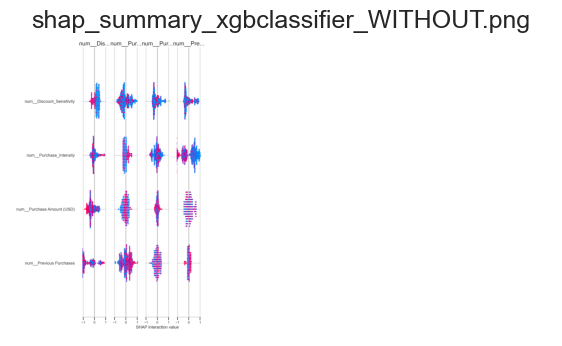

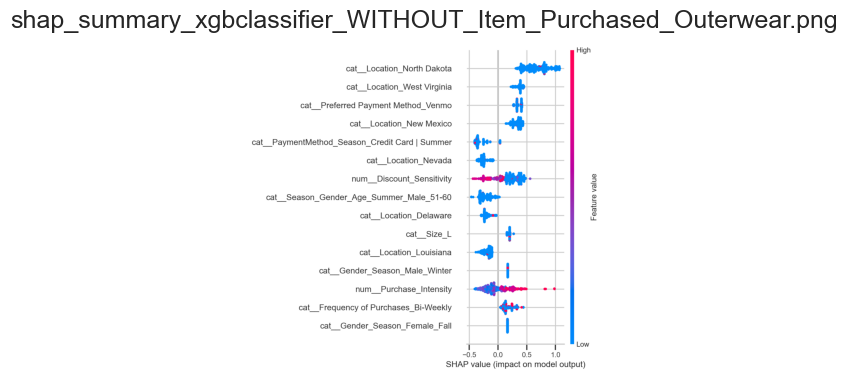

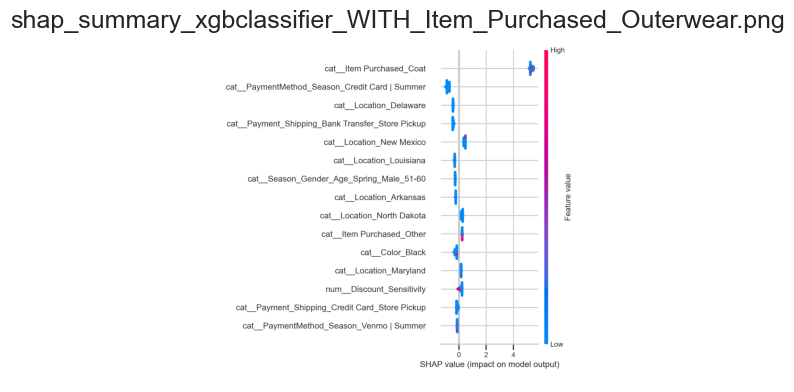

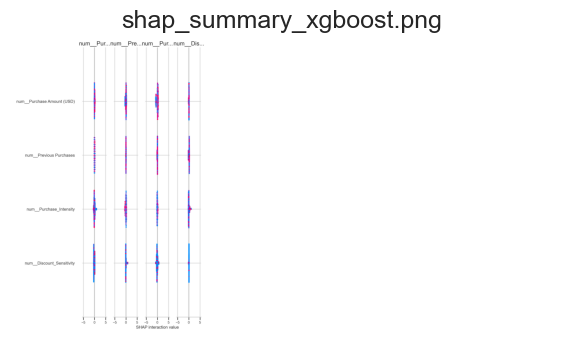

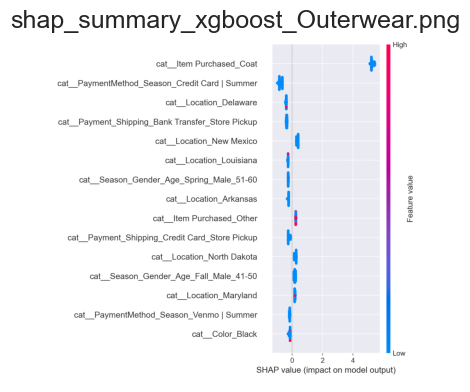

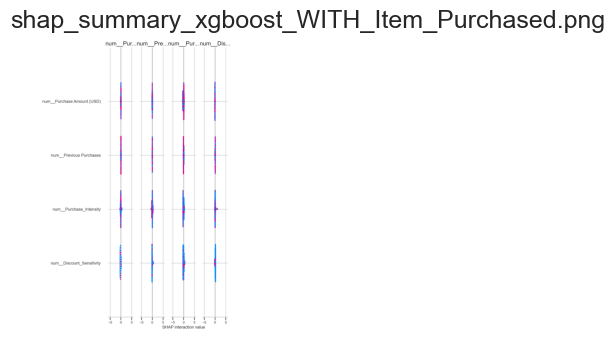

[Stage 8 | SHAP] Dependence plots: found 13 file(s). Showing up to 9.


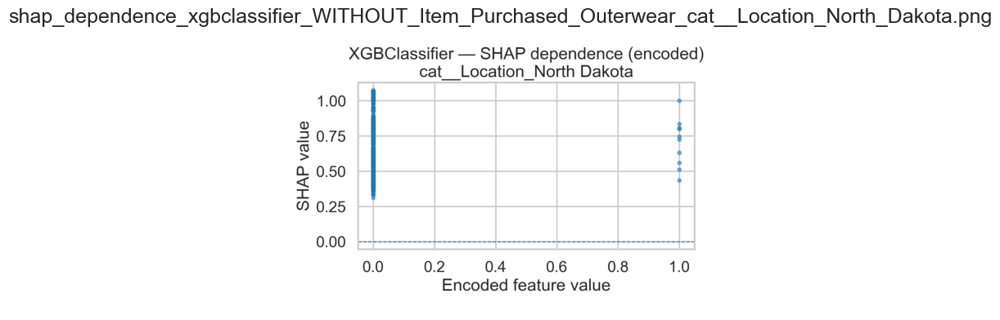

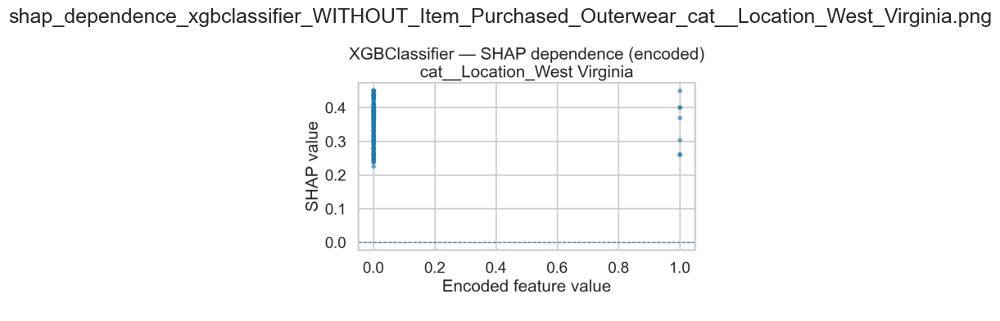

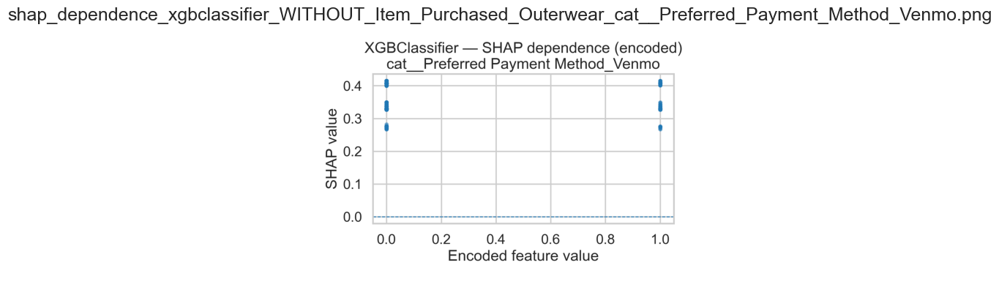

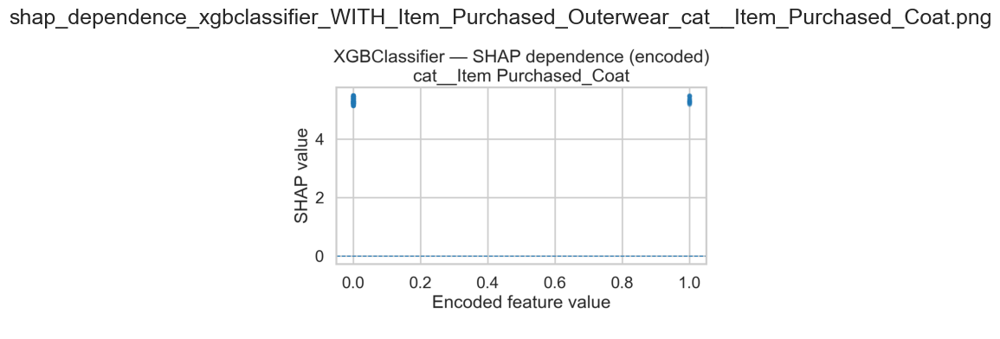

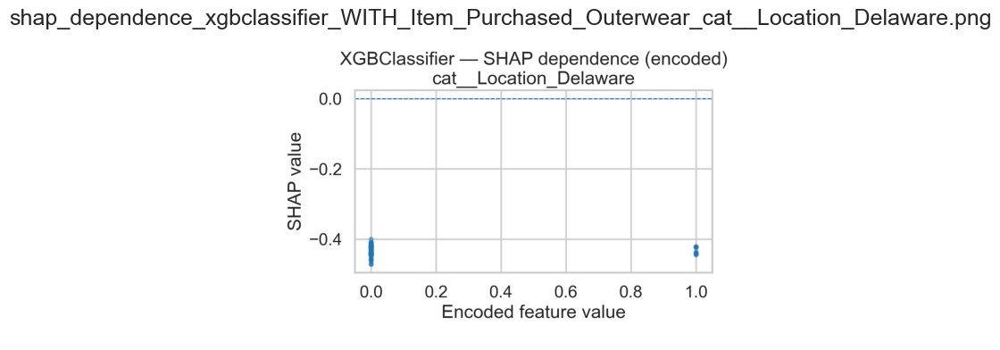

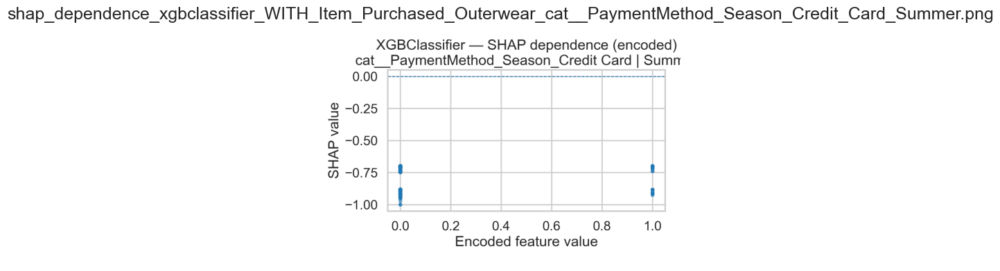

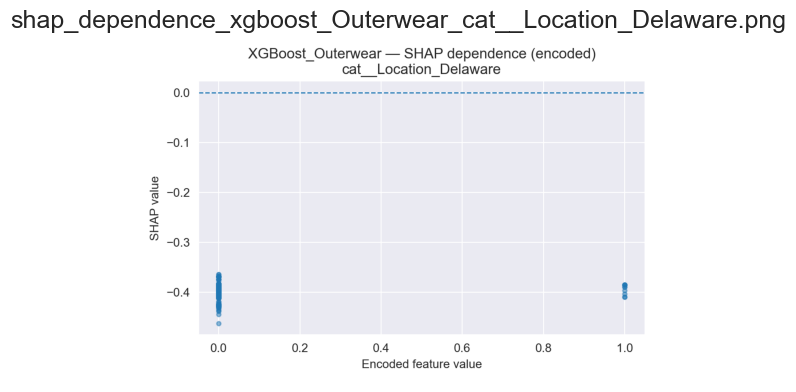

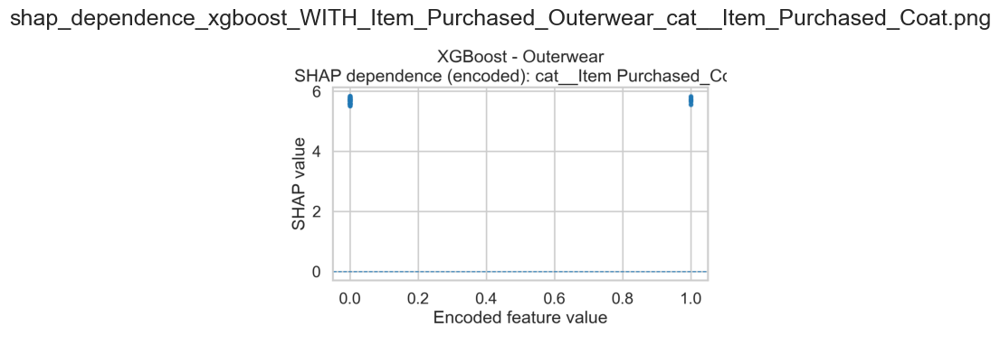

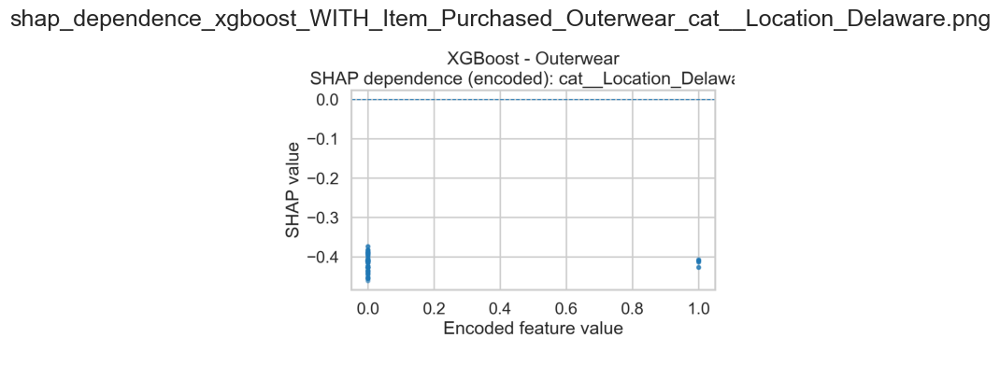

In [18]:
# ======================================================================
# STAGE 8 STEP 4A - SHAP for the best boosted model (summary + dependence)
# ----------------------------------------------------------------------
#   1) Picks the best boosted model available (XGBoost first, else LightGBM).
#   2) Converts the test dataset into the numeric (“encoded”) format used by the model.
#   3) Computes SHAP values to explain which encoded inputs drive predictions.
#   4) Prints and saves:
#        - SHAP summary plot (Top-15 encoded features)
#        - CSV ranking of encoded features by mean |SHAP|
#        - 3 dependence-style plots for the most influential encoded features
#        - Inline previews of the saved figures
#
# Outputs:
#   figures/shap_summary_<model>_<scenario>_<class>.png
#   figures/shap_dependence_<model>_<scenario>_<class>_<feature>.png
#   tables/shap_top_encoded_<model>_<scenario>_<class>.csv
# ======================================================================

# -----------------------------
# 0) Imports (tools we need)
# -----------------------------
import os
import re
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# SHAP is required here
try:
    import shap
    _SHAP_OK = True
except Exception:
    _SHAP_OK = False

# -----------------------------
# 1) Safety checks (required inputs from earlier stages)
# -----------------------------
assert "trained_pipes" in globals(), "Missing `trained_pipes`. Run Stage 8 setup first."
assert "X_test" in globals(), "Missing `X_test`. Ensure train/test split exists."
assert "classes" in globals(), "Missing `classes`. Ensure class labels exist."

os.makedirs("figures", exist_ok=True)
os.makedirs("tables", exist_ok=True)

# -----------------------------
# 2) Helper: safe filename parts (so files always save correctly)
# -----------------------------
def _safe_filepart(text: str, maxlen: int = 120) -> str:
    """
    Keeps filenames simple and compatible across operating systems.
    """
    s = re.sub(r"[^A-Za-z0-9._-]+", "_", str(text))
    return s[:maxlen].strip("_")

# -----------------------------
# 3) Helper: encode raw test data into the model’s internal numeric format
# -----------------------------
def _encode_matrix_and_names(pipe, X_raw: pd.DataFrame):
    """
    Non-technical view:
      We convert the original columns (e.g., Category, Size, Season) into a
      numeric matrix the model can understand, and we attach a name to each
      numeric column so explanations remain readable.
    """
    prep = pipe.named_steps["prep"]

    # 3.1) Transform raw table into encoded numeric matrix
    X_enc = prep.transform(X_raw)

    # 3.2) Convert sparse matrices to dense arrays for compatibility
    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    X_enc = np.asarray(X_enc)

    # 3.3) Try to get official encoded column names
    try:
        enc_names = prep.get_feature_names_out()
        enc_names = np.asarray(enc_names, dtype=object)
    except Exception:
        enc_names = None

    # 3.4) Guarantee name count matches the encoded matrix column count
    if enc_names is None or len(enc_names) != X_enc.shape[1]:
        enc_names = np.array([f"enc_{i}" for i in range(X_enc.shape[1])], dtype=object)

    return X_enc, enc_names

# -----------------------------
# 4) Helper: standardise SHAP output into a 2D matrix (samples × features)
# -----------------------------
def _standardise_shap_output(shap_values, X_enc: np.ndarray, class_labels):
    """
    Non-technical view:
      Some models return SHAP explanations in different layouts for multi-class problems.
      This function selects a single, consistent “samples × features” SHAP matrix
      for plotting and reporting.
    """
    n_features = int(X_enc.shape[1])

    # 4.1) If SHAP returns a list (commonly one array per class), pick the most “influential” class
    if isinstance(shap_values, list) and len(shap_values) > 1:
        best_idx = 0
        best_score = -1.0
        best_arr = None

        for j, arr in enumerate(shap_values):
            arr = np.asarray(arr)

            # If the array is already (samples, features), score it directly
            if arr.ndim == 2 and arr.shape[1] == n_features:
                score = float(np.mean(np.abs(arr)))
                if score > best_score:
                    best_score = score
                    best_idx = j
                    best_arr = arr

            # If the array has extra structure, try to reduce it sensibly
            elif arr.ndim == 3:
                # Case A: (samples, classes, features)
                if arr.shape[2] == n_features:
                    reduced = arr[:, j, :]
                    score = float(np.mean(np.abs(reduced)))
                    if score > best_score:
                        best_score = score
                        best_idx = j
                        best_arr = reduced
                # Case B: (samples, features, classes)
                elif arr.shape[1] == n_features:
                    reduced = arr[:, :, j]
                    score = float(np.mean(np.abs(reduced)))
                    if score > best_score:
                        best_score = score
                        best_idx = j
                        best_arr = reduced

        # If we found a usable matrix, return it with a label
        if best_arr is not None:
            used_class = str(class_labels[best_idx]) if best_idx < len(class_labels) else ""
            return np.asarray(best_arr), used_class

        # If nothing matched, fall back safely
        used_class = str(class_labels[0]) if len(class_labels) else ""
        return np.asarray(shap_values[0]), used_class

    # 4.2) If SHAP returns a single array, reshape/select to get (samples, features)
    arr = np.asarray(shap_values)

    # Already correct: (samples, features)
    if arr.ndim == 2 and arr.shape[1] == n_features:
        return arr, ""

    # Multi-class variants
    if arr.ndim == 3:
        # (samples, classes, features)
        if arr.shape[2] == n_features:
            mean_abs_by_class = np.mean(np.abs(arr), axis=(0, 2))
            j = int(np.argmax(mean_abs_by_class))
            used_class = str(class_labels[j]) if j < len(class_labels) else ""
            return arr[:, j, :], used_class

        # (samples, features, classes)
        if arr.shape[1] == n_features:
            mean_abs_by_class = np.mean(np.abs(arr), axis=(0, 1))
            j = int(np.argmax(mean_abs_by_class))
            used_class = str(class_labels[j]) if j < len(class_labels) else ""
            return arr[:, :, j], used_class

    # 4.3) Final fallback: force into (samples, -1) so we can still rank columns
    arr2 = arr.reshape(arr.shape[0], -1)
    return arr2, ""

# -----------------------------
# 5) Main function: run SHAP for one pipeline and save all outputs
# -----------------------------
def run_shap_for_pipeline(
    pipe,
    model_name: str,
    scenario_tag: str,
    X_raw: pd.DataFrame,
    class_labels,
    top_summary: int = 15,
    top_dependence: int = 3,
):
    """
    Non-technical view:
      Produces charts and tables that explain which inputs most influence the model.
    """
    if not _SHAP_OK:
        print("[Stage 8 | SHAP] SHAP is not available in this environment. Skipping.")
        return

    # 5.1) Encode raw test data into the model’s numeric representation
    X_enc, enc_names = _encode_matrix_and_names(pipe, X_raw)
    print(f"[Stage 8 | SHAP] Encoded test matrix: rows={X_enc.shape[0]}, cols={X_enc.shape[1]}")

    # 5.2) Extract the trained classifier from the pipeline
    clf = pipe.named_steps["clf"]

    # 5.3) Create a SHAP explainer suited to tree-based boosted models
    explainer = shap.TreeExplainer(clf)

    # 5.4) Compute SHAP values for the encoded test matrix
    shap_vals = explainer.shap_values(X_enc)

    # 5.5) Convert SHAP output into a single (samples × features) matrix for reporting
    shap_mat, used_class = _standardise_shap_output(shap_vals, X_enc, class_labels)

    # 5.6) Ensure feature names match the SHAP matrix column count
    if shap_mat.shape[1] != len(enc_names):
        enc_names = np.array([f"enc_{i}" for i in range(shap_mat.shape[1])], dtype=object)

    # 5.7) Prepare safe output filenames
    mpart = _safe_filepart(model_name.replace(" ", "_").lower())
    spart = _safe_filepart(scenario_tag)
    class_suffix = f"_{_safe_filepart(used_class)}" if used_class else ""

    # 5.8) Save a SHAP summary plot (Top features by overall impact)
    out_sum = os.path.join("figures", f"shap_summary_{mpart}_{spart}{class_suffix}.png")
    plt.figure()
    shap.summary_plot(
        shap_mat,
        X_enc,
        feature_names=enc_names,
        show=False,
        max_display=top_summary
    )
    plt.tight_layout()
    plt.savefig(out_sum, dpi=220)
    plt.close()
    print(f"[Stage 8 | SHAP] Saved: {out_sum}")

    # 5.9) Rank encoded features by mean absolute SHAP and save a tidy CSV
    mean_abs = np.mean(np.abs(shap_mat), axis=0).ravel()
    order = np.argsort(mean_abs)[::-1]

    top_tbl = pd.DataFrame({
        "encoded_feature": enc_names[order],
        "mean_abs_shap": mean_abs[order]
    })

    out_csv = os.path.join("tables", f"shap_top_encoded_{mpart}_{spart}{class_suffix}.csv")
    top_tbl.to_csv(out_csv, index=False)
    print(f"[Stage 8 | SHAP] Saved: {out_csv}")

    # 5.10) Dependence-style plots for the most influential encoded features
    top_idx = [int(i) for i in order[:max(1, top_dependence)]]

    for j in top_idx:
        x = np.asarray(X_enc[:, j], dtype=float).ravel()
        y = np.asarray(shap_mat[:, j], dtype=float).ravel()

        feat_part = _safe_filepart(str(enc_names[j]).replace(" ", "_"))
        out_dep = os.path.join("figures", f"shap_dependence_{mpart}_{spart}{class_suffix}_{feat_part}.png")

        plt.figure(figsize=(6.5, 4.5))
        plt.scatter(x, y, s=12, alpha=0.5)
        plt.axhline(0, ls="--", lw=1)
        plt.title(f"{model_name}{(' - ' + used_class) if used_class else ''}\nSHAP dependence (encoded): {enc_names[j]}")
        plt.xlabel("Encoded feature value")
        plt.ylabel("SHAP value")
        plt.tight_layout()
        plt.savefig(out_dep, dpi=220)
        plt.close()
        print(f"[Stage 8 | SHAP] Saved: {out_dep}")

    # 5.11) Print a compact preview so results are visible immediately
    print("\n[Stage 8 | SHAP] Top encoded features (preview):")
    print(top_tbl.head(10).to_string(index=False))

# -----------------------------
# 6) Choose a boosted model (XGBoost preferred, else LightGBM)
# -----------------------------
def pick_boosted_model(pipes: dict):
    """
    Non-technical view:
      We pick a strong boosted model for explanation if it exists.
    """
    if "XGBoost" in pipes:
        return "XGBoost"
    if "LightGBM" in pipes:
        return "LightGBM"
    return None

boost_choice = pick_boosted_model(trained_pipes)

if boost_choice is None:
    print("[Stage 8 | SHAP] No boosted model found (XGBoost/LightGBM). Skipping.")
else:
    print(f"[Stage 8 | SHAP] Using boosted model: {boost_choice}")

    # 6.1) Run SHAP and generate all outputs for the boosted model
    run_shap_for_pipeline(
        trained_pipes[boost_choice],
        model_name=boost_choice,
        scenario_tag="WITH_Item_Purchased",
        X_raw=X_test,
        class_labels=classes,
        top_summary=15,
        top_dependence=3,
    )

# -----------------------------
# 7) Viewer: show saved images inline (so visuals are printed in the notebook)
# -----------------------------
def _show_saved_images(pattern: str, label: str, max_show: int = 12):
    paths = sorted(glob.glob(pattern))
    print(f"[Stage 8 | SHAP] {label}: found {len(paths)} file(s). Showing up to {max_show}.")
    for p in paths[:max_show]:
        img = plt.imread(p)
        plt.figure(figsize=(7, 4.5))
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(p))
        plt.show()

_show_saved_images(os.path.join("figures", "shap_summary_*.png"), "Summary plots", max_show=6)
_show_saved_images(os.path.join("figures", "shap_dependence_*.png"), "Dependence plots", max_show=9)

#### STAGE 8 STEP 5 - CONCORDANCE OF FEATURE IMPORTANCE RANKS (SPEARMAN)

[Stage 8 | Concordance] Models compared: ['Decision Tree', 'LightGBM', 'Logistic Regression', 'Random Forest', 'XGBoost']
[Stage 8 | Concordance] Features compared: 22
[Stage 8 | Concordance] Missing ranks filled with worst_rank=23
[Stage 8 | Concordance] Saved: tables/feature_rank_concordance.csv

[Stage 8 | Concordance] Spearman correlation table (rounded):
model                Decision Tree  LightGBM  Logistic Regression  Random Forest  XGBoost
model                                                                                    
Decision Tree                1.000    -0.120                0.361          0.361    0.361
LightGBM                    -0.120     1.000                0.182          0.597    0.139
Logistic Regression          0.361     0.182                1.000          0.493    0.952
Random Forest                0.361     0.597                0.493          1.000    0.563
XGBoost                      0.361     0.139                0.952          0.563    1.000


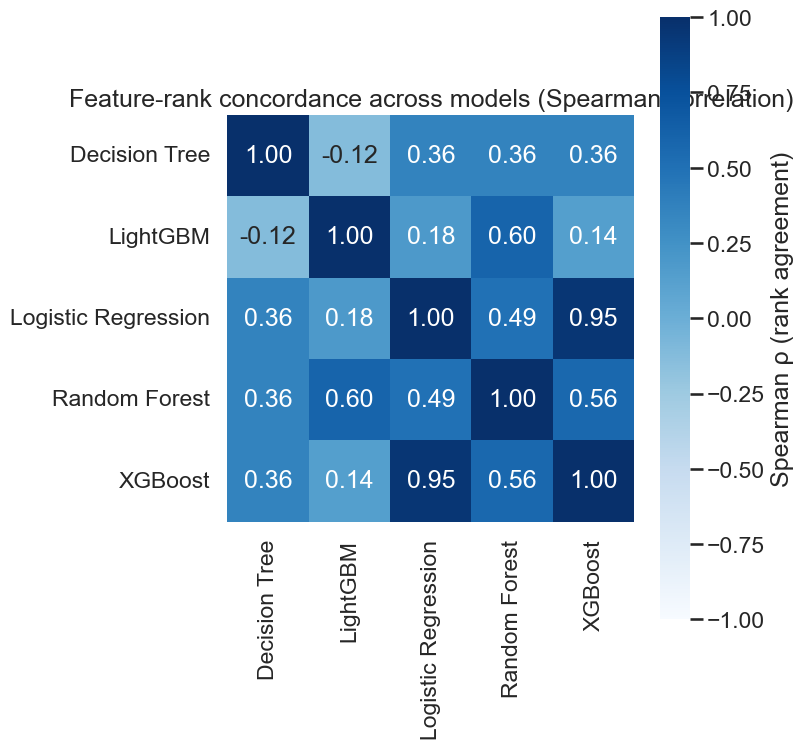

[Stage 8 | Concordance] Saved: figures/feature_rank_concordance.png
[Stage 8] Completed interpretability & feature-importance concordance analysis.


In [19]:
# ======================================================================
# STAGE 8 STEP 5 - CONCORDANCE OF FEATURE IMPORTANCE RANKS (SPEARMAN)
# ----------------------------------------------------------------------
#   We check whether different models "agree" on which RAW features matter most.
#   If two models produce similar importance rankings, their Spearman correlation
#   will be closer to +1. If they strongly disagree, it will be closer to -1.
#
# What this cell prints/saves:
#   1) A Spearman correlation table (model × model)
#   2) A heatmap visual of that table
#
# Outputs written:
#   tables/feature_rank_concordance.csv
#   figures/feature_rank_concordance.png
#
# Input expected in memory:
#   ranks_df  (columns: model, feature, rank)
# ======================================================================

# -----------------------------
# 0) Imports (only what we need)
# -----------------------------
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

sns.set_style("whitegrid")

# -----------------------------
# 1) Safety check: confirm the input table exists in memory
# -----------------------------
assert "ranks_df" in globals(), (
    "Missing `ranks_df`. Run the model-based importance step that creates it "
    "(the table with columns: model, feature, rank)."
)

# -----------------------------
# 2) Prepare a clean version of the ranking data
#    (this ensures the rank column is numeric and removes blanks)
# -----------------------------
df = ranks_df.copy()
df["model"] = df["model"].astype(str).str.strip()
df["feature"] = df["feature"].astype(str).str.strip()
df["rank"] = pd.to_numeric(df["rank"], errors="coerce")
df = df.dropna(subset=["model", "feature", "rank"])

# -----------------------------
# 3) Remove any accidental duplicates:
#    If a feature appears multiple times for the same model, keep the best rank.
#    (Lower rank = more important)
# -----------------------------
df = df.groupby(["model", "feature"], as_index=False)["rank"].min()

# -----------------------------
# 4) Build a feature × model matrix of ranks
#    - Rows are features
#    - Columns are models
#    - Each cell is "this model’s rank for this feature"
# -----------------------------
models = sorted(df["model"].unique().tolist())
features = sorted(df["feature"].unique().tolist())

rank_matrix = df.pivot(index="feature", columns="model", values="rank").reindex(index=features, columns=models)

# -----------------------------
# 5) Fill missing ranks:
#    If a model does not have a rank for a feature, we assign it a "worst rank"
#    so every model is compared on the same full list of features.
# -----------------------------
worst_rank = float(df["rank"].max() + 1)
rank_matrix = rank_matrix.fillna(worst_rank)

print(f"[Stage 8 | Concordance] Models compared: {models}")
print(f"[Stage 8 | Concordance] Features compared: {len(features)}")
print(f"[Stage 8 | Concordance] Missing ranks filled with worst_rank={worst_rank:.0f}")

# -----------------------------
# 6) Compute Spearman correlation across model columns
#    Spearman correlation measures agreement in rank ordering.
# -----------------------------
corr = rank_matrix.corr(method="spearman")

# -----------------------------
# 7) Save the correlation table for reproducibility
# -----------------------------
out_csv = "tables/feature_rank_concordance.csv"
corr.to_csv(out_csv, index=True)
print(f"[Stage 8 | Concordance] Saved: {out_csv}")

# -----------------------------
# 8) Print the table (so stakeholders can see the numeric agreement levels)
# -----------------------------
print("\n[Stage 8 | Concordance] Spearman correlation table (rounded):")
print(corr.round(3).to_string())

# -----------------------------
# 9) Plot and save a heatmap (easy-to-read visual summary)
# -----------------------------
out_png = "figures/feature_rank_concordance.png"

plt.figure(figsize=(8.2, 8.2))
ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    square=True,
    vmin=-1,
    vmax=1,
    cbar_kws={"label": "Spearman ρ (rank agreement)"}
)
ax.set_title("Feature-rank concordance across models (Spearman correlation)")
ax.set_xlabel("")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(out_png, dpi=220)
plt.show()

print(f"[Stage 8 | Concordance] Saved: {out_png}")
print("[Stage 8] Completed interpretability & feature-importance concordance analysis.")

### STAGE 9 - ERROR ANALYSIS & CALIBRATION (Post-hoc evaluation)

[Stage 9] Using `trained_pipes` from earlier stages.
[Stage 9] Best model selected for error analysis: Decision Tree


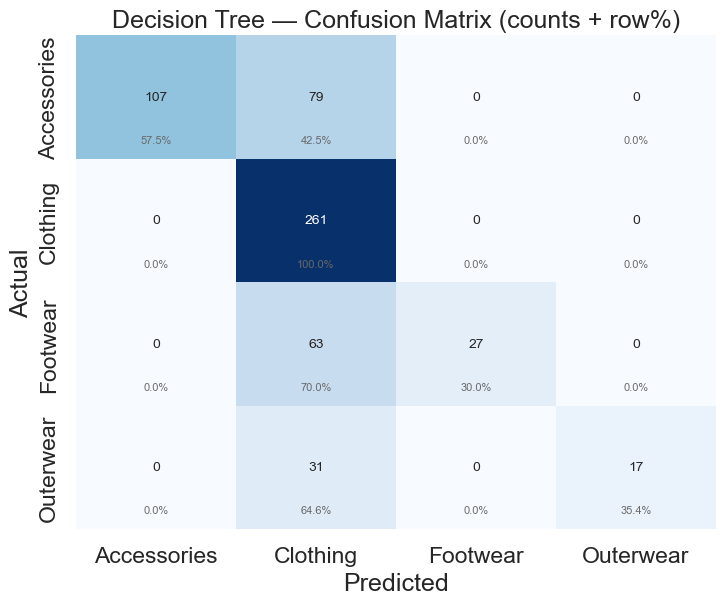

[Stage 9] Saved: figures/error_cm_best.png
[Stage 9] Saved: tables/error_per_class_ova_best.csv


,Class,TN,FP,FN,TP,Precision,Recall,F1,Specificity,BalancedAcc
0,Accessories,399,0,79,107,1.000,0.575,0.730,1.000,0.788
1,Clothing,151,173,0,261,0.601,1.000,0.751,0.466,0.733
2,Footwear,495,0,63,27,1.000,0.300,0.462,1.000,0.650
3,Outerwear,537,0,31,17,1.000,0.354,0.523,1.000,0.677


[Stage 9] Saved: tables/error_confusion_pairs_best.csv


,True,Pred,Count,Share_of_true
0,Accessories,Clothing,79,0.424731
7,Footwear,Clothing,63,0.700000
10,Outerwear,Clothing,31,0.645833
1,Accessories,Footwear,0,0.000000
2,Accessories,Outerwear,0,0.000000
3,Clothing,Accessories,0,0.000000
4,Clothing,Footwear,0,0.000000
5,Clothing,Outerwear,0,0.000000
6,Footwear,Accessories,0,0.000000
8,Footwear,Outerwear,0,0.000000


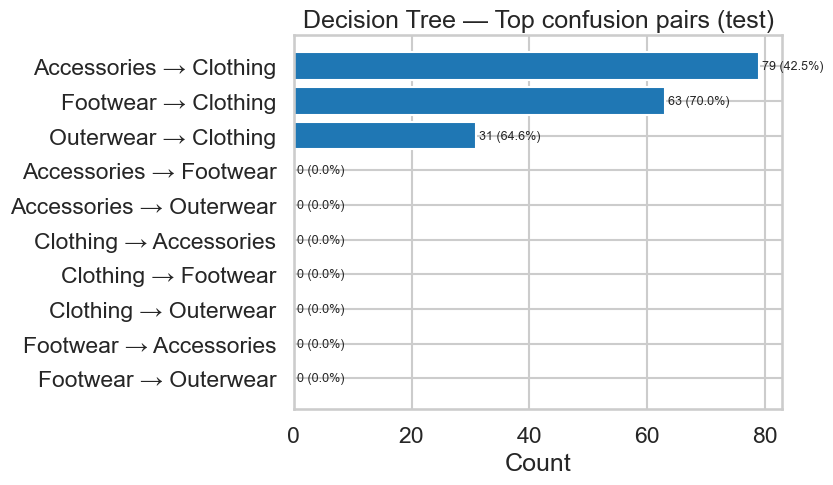

[Stage 9] Saved: figures/error_confusion_pairs_best.png


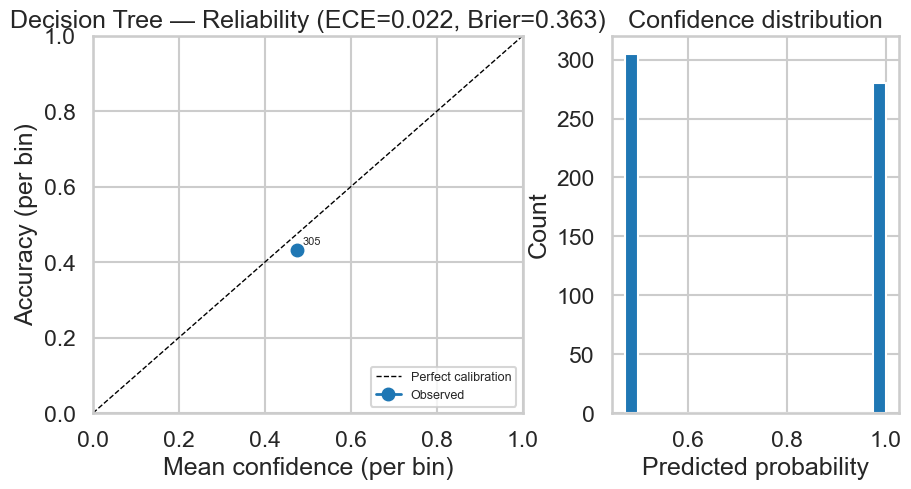

[Stage 9] Saved: figures/error_calibration_best.png
[Stage 9] Slice columns used: ['Season', 'Gender', 'Size', 'Payment Method', 'Subscription Status']
[Stage 9] Saved: tables/slice_metrics.csv


,slice_col,slice_level,support,accuracy,f1_macro
10,Payment Method,Venmo,109,0.660550,0.532302
3,Season,Summer,138,0.644928,0.536345
14,Payment Method,Bank Transfer,89,0.685393,0.548905
7,Size,L,159,0.704403,0.560990
6,Size,M,277,0.675090,0.578148
5,Gender,Female,200,0.730000,0.598785
13,Payment Method,Cash,93,0.666667,0.604405
16,Subscription Status,No,446,0.706278,0.605518
2,Season,Winter,145,0.737931,0.609816
4,Gender,Male,385,0.690909,0.619293


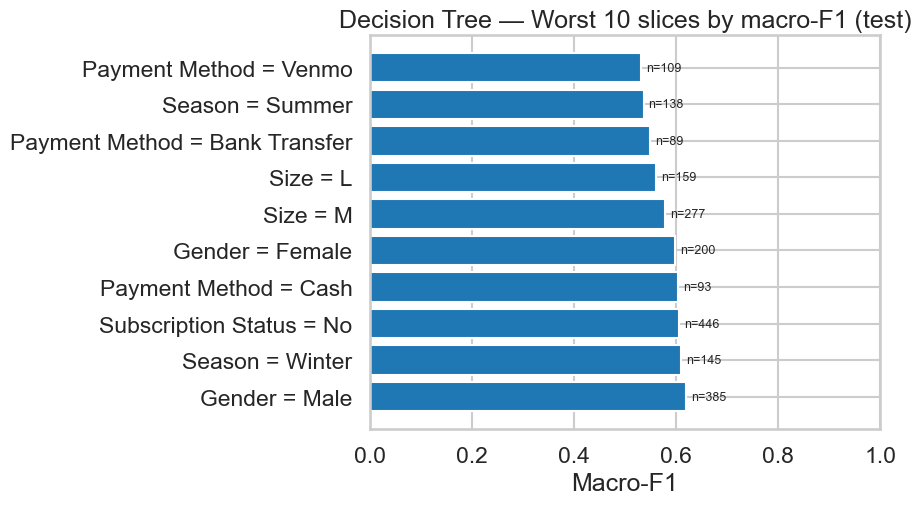

[Stage 9] Saved: figures/error_slice_bar.png

[Stage 9] Error analysis & calibration complete.


In [20]:
# ======================================================================
# STAGE 9 - ERROR ANALYSIS & CALIBRATION (Post-hoc evaluation)
# ----------------------------------------------------------------------
# This stage explains where the chosen final model makes mistakes,
# whether its probability "confidence" can be trusted, and which
# customer groups (slices) perform worst.
#
# Saved artefacts (and displayed inline):
#   figures/error_cm_best.png
#   figures/error_confusion_pairs_best.png
#   figures/error_calibration_best.png        (only if predict_proba exists)
#   figures/error_slice_bar.png
#   tables/error_per_class_ova_best.csv
#   tables/error_confusion_pairs_best.csv
#   tables/slice_metrics.csv
# ======================================================================

# -----------------------------
# 0) Imports (only what we use)
# -----------------------------
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score

sns.set_style("whitegrid")
os.makedirs("figures", exist_ok=True)
os.makedirs("tables", exist_ok=True)

# -----------------------------
# 1) Safety: confirm required data objects exist
# -----------------------------
assert "outputs" in globals(), "Missing `outputs` dict from earlier stages."

X_train = outputs["X_train"]
X_test  = outputs["X_test"]
y_train = outputs["y_train"]
y_test  = outputs["y_test"]
classes = outputs["classes"]
preprocessor = outputs["preprocessor"]

# -----------------------------
# 2) Build (or reuse) fitted model pipelines we can evaluate
# -----------------------------
# Non-technical explanation:
#   We need a trained "final model pipeline" (preprocessing + model).
#   If a trained set of pipelines already exists, we reuse it.
#   Otherwise, we rebuild a small set of finalists on the training data.
def get_fitted_pipelines():
    """
    Return a dictionary: {model_name: fitted_pipeline}.
    Priority order:
      1) best_models (if it exists)
      2) trained_pipes (if it exists)
      3) refit a deterministic set of finalists on TRAIN (fallback)
    """
    # Option 1: reuse final trained pipelines from earlier stages
    if "best_models" in globals() and isinstance(best_models, dict) and len(best_models) > 0:
        print("[Stage 9] Using `best_models` from earlier stages.")
        return best_models

    # Option 2: reuse pipelines built for interpretability in Stage 8
    if "trained_pipes" in globals() and isinstance(trained_pipes, dict) and len(trained_pipes) > 0:
        print("[Stage 9] Using `trained_pipes` from earlier stages.")
        return trained_pipes

    # Option 3: fallback refit (kept lightweight and deterministic)
    print("[Stage 9] No fitted pipelines found in memory; refitting finalists on TRAIN only.")

    from imblearn.pipeline import Pipeline
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.linear_model import LogisticRegression
    from xgboost import XGBClassifier

    # Optional LightGBM
    has_lgbm = True
    try:
        from lightgbm import LGBMClassifier
    except Exception:
        has_lgbm = False

    rng = 42
    pipes = {}

    # Decision Tree (example deterministic config)
    pipes["Decision Tree"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", DecisionTreeClassifier(max_depth=8, min_samples_split=2, min_samples_leaf=1, random_state=rng))
    ])

    # Random Forest
    pipes["Random Forest"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", RandomForestClassifier(
            n_estimators=600, max_depth=20, min_samples_split=2, min_samples_leaf=1,
            class_weight="balanced", n_jobs=-1, random_state=rng
        ))
    ])

    # Logistic Regression
    pipes["Logistic Regression"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", LogisticRegression(
            C=0.5, penalty="l2", solver="lbfgs",
            multi_class="multinomial", max_iter=2000, random_state=rng
        ))
    ])

    # XGBoost
    pipes["XGBoost"] = Pipeline([
        ("prep", preprocessor),
        ("balance", "passthrough"),
        ("clf", XGBClassifier(
            objective="multi:softprob", num_class=len(classes), eval_metric="mlogloss",
            n_estimators=300, max_depth=4, learning_rate=0.05,
            subsample=1.0, colsample_bytree=1.0, tree_method="hist",
            n_jobs=-1, random_state=rng
        ))
    ])

    # LightGBM (optional)
    if has_lgbm:
        pipes["LightGBM"] = Pipeline([
            ("prep", preprocessor),
            ("balance", "passthrough"),
            ("clf", LGBMClassifier(
                objective="multiclass", num_class=len(classes),
                n_estimators=400, num_leaves=31, learning_rate=0.05, min_child_samples=40,
                n_jobs=-1, random_state=rng
            ))
        ])

    # Fit each pipeline once (so we can evaluate on test)
    for name, pipe in pipes.items():
        pipe.fit(X_train, y_train)

    return pipes

pipes = get_fitted_pipelines()

# -----------------------------
# 3) Select the best model name using Stage 6 test metrics (if available)
# -----------------------------
# Non-technical explanation:
#   We want to analyse the same "winner" used earlier in the project.
#   If the saved Stage 6 results exist, we use them.
#   Otherwise, we compute macro-F1 on the test set here.
pivot_path = "tables/final_test_metrics_wide.csv"
best_name = None

if os.path.exists(pivot_path):
    tab = pd.read_csv(pivot_path)
    if "Model" in tab.columns and "f1_macro" in tab.columns:
        tab["f1_macro"] = pd.to_numeric(tab["f1_macro"], errors="coerce")
        tab = tab.dropna(subset=["Model", "f1_macro"])
        if len(tab):
            best_name = tab.sort_values("f1_macro", ascending=False)["Model"].iloc[0]

# If the file is missing or doesn't match expected columns, compute best here
if best_name is None or best_name not in pipes:
    scores = []
    for name, pipe in pipes.items():
        y_hat = pipe.predict(X_test)
        scores.append((name, f1_score(y_test, y_hat, average="macro")))
    best_name = sorted(scores, key=lambda t: t[1], reverse=True)[0][0]

best_pipe = pipes[best_name]
print(f"[Stage 9] Best model selected for error analysis: {best_name}")

# -----------------------------
# 4) Predict once (reused across all diagnostics)
# -----------------------------
y_pred = best_pipe.predict(X_test)
has_proba = hasattr(best_pipe, "predict_proba")
y_proba = best_pipe.predict_proba(X_test) if has_proba else None

# -----------------------------
# 5) Confusion matrix (counts + row percentages)
# -----------------------------
cm = confusion_matrix(y_test, y_pred, labels=np.arange(len(classes)))
row_totals = cm.sum(axis=1, keepdims=True)
cm_pct = np.divide(cm, np.maximum(row_totals, 1))

plt.figure(figsize=(7.6, 6.4))
ax = sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues", cbar=False,
    xticklabels=classes, yticklabels=classes, annot_kws={"fontsize": 10}
)

# Overlay row % values so the audience can see proportions, not only counts
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j + 0.5, i + 0.85, f"{100*cm_pct[i,j]:.1f}%",
                ha="center", va="center", fontsize=8, color="dimgray")

plt.title(f"{best_name} — Confusion Matrix (counts + row%)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
cm_path = "figures/error_cm_best.png"
plt.savefig(cm_path, dpi=220)
plt.show()
print(f"[Stage 9] Saved: {cm_path}")

# -----------------------------
# 6) Per-class one-vs-all table (TN/FP/FN/TP + core metrics)
# -----------------------------
def per_class_ova(cm_matrix: np.ndarray, labels: list) -> pd.DataFrame:
    total = cm_matrix.sum()
    rows = []
    for i, lab in enumerate(labels):
        tp = int(cm_matrix[i, i])
        fn = int(cm_matrix[i, :].sum() - tp)
        fp = int(cm_matrix[:, i].sum() - tp)
        tn = int(total - tp - fp - fn)

        precision = tp / (tp + fp) if (tp + fp) else 0.0
        recall    = tp / (tp + fn) if (tp + fn) else 0.0
        f1        = (2 * precision * recall) / (precision + recall) if (precision + recall) else 0.0
        specificity = tn / (tn + fp) if (tn + fp) else 0.0
        balanced_acc = 0.5 * (recall + specificity)

        rows.append({
            "Class": lab,
            "TN": tn, "FP": fp, "FN": fn, "TP": tp,
            "Precision": round(precision, 3),
            "Recall": round(recall, 3),
            "F1": round(f1, 3),
            "Specificity": round(specificity, 3),
            "BalancedAcc": round(balanced_acc, 3),
        })
    return pd.DataFrame(rows)

ova_df = per_class_ova(cm, classes)
ova_out = "tables/error_per_class_ova_best.csv"
ova_df.to_csv(ova_out, index=False)
print(f"[Stage 9] Saved: {ova_out}")
display(ova_df)

# -----------------------------
# 7) Top confusion pairs (most frequent mistakes)
# -----------------------------
pairs = []
for i, true_lab in enumerate(classes):
    for j, pred_lab in enumerate(classes):
        if i == j:
            continue
        count = int(cm[i, j])
        share = count / row_totals[i, 0] if row_totals[i, 0] else 0.0
        pairs.append({"True": true_lab, "Pred": pred_lab, "Count": count, "Share_of_true": share})

pairs_df = pd.DataFrame(pairs).sort_values(["Count", "Share_of_true"], ascending=[False, False])
pairs_out = "tables/error_confusion_pairs_best.csv"
pairs_df.to_csv(pairs_out, index=False)
print(f"[Stage 9] Saved: {pairs_out}")
display(pairs_df.head(15))

top10 = pairs_df.head(10).iloc[::-1]
labels = [f"{r['True']} → {r['Pred']}" for _, r in top10.iterrows()]

plt.figure(figsize=(8.6, 5.2))
plt.barh(labels, top10["Count"])
for y, (c, s) in enumerate(zip(top10["Count"], top10["Share_of_true"])):
    plt.text(c + 0.5, y, f"{c} ({100*s:.1f}%)", va="center", fontsize=9)
plt.title(f"{best_name} — Top confusion pairs (test)")
plt.xlabel("Count")
plt.tight_layout()
pair_fig = "figures/error_confusion_pairs_best.png"
plt.savefig(pair_fig, dpi=220)
plt.show()
print(f"[Stage 9] Saved: {pair_fig}")

# -----------------------------
# 8) Calibration (only if the model provides probabilities)
# -----------------------------
if has_proba:
    max_prob = y_proba.max(axis=1)
    correct = (y_pred == y_test).astype(int)

    def expected_calibration_error(conf, corr, n_bins=10):
        bins = np.linspace(0.0, 1.0, n_bins + 1)
        ids = np.digitize(conf, bins) - 1
        ece = 0.0
        for b in range(n_bins):
            m = (ids == b)
            if not np.any(m):
                continue
            ece += m.mean() * abs(corr[m].mean() - conf[m].mean())
        return float(ece)

    ece = expected_calibration_error(max_prob, correct, n_bins=10)

    y_onehot = np.eye(len(classes))[y_test]
    brier = float(np.mean(np.sum((y_proba - y_onehot) ** 2, axis=1)))

    bins = np.linspace(0.0, 1.0, 11)
    ids = np.digitize(max_prob, bins) - 1

    conf_by_bin, acc_by_bin, n_by_bin = [], [], []
    for b in range(10):
        m = (ids == b)
        if m.sum() == 0:
            conf_by_bin.append(np.nan); acc_by_bin.append(np.nan); n_by_bin.append(0)
        else:
            conf_by_bin.append(max_prob[m].mean())
            acc_by_bin.append(correct[m].mean())
            n_by_bin.append(int(m.sum()))

    fig = plt.figure(figsize=(10.4, 4.9))
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 2], wspace=0.25)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot([0, 1], [0, 1], "k--", lw=1, label="Perfect calibration")
    ax1.plot(conf_by_bin, acc_by_bin, marker="o", lw=2, label="Observed")
    for x, y, n in zip(conf_by_bin, acc_by_bin, n_by_bin):
        if not (np.isnan(x) or np.isnan(y)):
            ax1.annotate(n, (x, y), textcoords="offset points", xytext=(4, 4), fontsize=8)
    ax1.set_title(f"{best_name} — Reliability (ECE={ece:.3f}, Brier={brier:.3f})")
    ax1.set_xlabel("Mean confidence (per bin)")
    ax1.set_ylabel("Accuracy (per bin)")
    ax1.set_xlim(0, 1); ax1.set_ylim(0, 1)
    ax1.legend(loc="lower right", fontsize=9)

    ax2 = fig.add_subplot(gs[0, 1])
    ax2.hist(max_prob, bins=20, edgecolor="white")
    ax2.set_title("Confidence distribution")
    ax2.set_xlabel("Predicted probability")
    ax2.set_ylabel("Count")

    plt.tight_layout()
    cal_fig = "figures/error_calibration_best.png"
    plt.savefig(cal_fig, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {cal_fig}")
else:
    print(f"[Stage 9] {best_name} has no predict_proba → calibration skipped.")

# -----------------------------
# 9) Slice analysis (find groups with weaker performance)
# -----------------------------
CANDIDATE_SLICES = ["Season", "Gender", "Size", "Payment Method", "Subscription Status"]
slice_cols = [c for c in CANDIDATE_SLICES if c in X_test.columns]
print(f"[Stage 9] Slice columns used: {slice_cols}")

def slice_metrics(mask):
    if mask.sum() == 0:
        return np.nan, np.nan, 0
    yt = y_test[mask]
    yp = y_pred[mask]
    return (
        float(accuracy_score(yt, yp)),
        float(f1_score(yt, yp, average="macro", zero_division=0)),
        int(mask.sum()),
    )

rows = []
for col in slice_cols:
    top_levels = X_test[col].value_counts().head(12).index
    for level in top_levels:
        m = (X_test[col] == level).values
        acc, f1m, n = slice_metrics(m)
        rows.append({
            "slice_col": col,
            "slice_level": str(level),
            "support": n,
            "accuracy": acc,
            "f1_macro": f1m,
        })

slice_df = (
    pd.DataFrame(rows)
    .dropna()
    .sort_values(["f1_macro", "support"], ascending=[True, False])
)

slice_out = "tables/slice_metrics.csv"
slice_df.to_csv(slice_out, index=False)
print(f"[Stage 9] Saved: {slice_out}")
display(slice_df.head(15))

worst10 = slice_df.head(10).iloc[::-1]
plt.figure(figsize=(9.4, 5.4))
ylabels = [f"{r.slice_col} = {r.slice_level}" for _, r in worst10.iterrows()]
plt.barh(ylabels, worst10["f1_macro"])
for y, (f1m, n) in enumerate(zip(worst10["f1_macro"], worst10["support"])):
    plt.text(float(f1m) + 0.01, y, f"n={int(n)}", va="center", fontsize=9)
plt.title(f"{best_name} — Worst 10 slices by macro-F1 (test)")
plt.xlabel("Macro-F1")
plt.xlim(0, 1)
plt.tight_layout()
slice_fig = "figures/error_slice_bar.png"
plt.savefig(slice_fig, dpi=220)
plt.show()
print(f"[Stage 9] Saved: {slice_fig}")

print("\n[Stage 9] Error analysis & calibration complete.")

#### STAGE 9 STEP 2 - ERROR ANALYSIS & CALIBRATION (WITH vs WITHOUT "Item Purchased")


[Stage 9 • WITH Item Purchased] Models evaluated:
  - Random Forest      macro-F1 = 0.620
  - Decision Tree      macro-F1 = 0.617
  - XGBoost            macro-F1 = 0.607
  - Logistic Regression macro-F1 = 0.605
  - LightGBM           macro-F1 = 0.587
[Stage 9 • WITH Item Purchased] Selected BEST model: Random Forest (macro-F1=0.620)


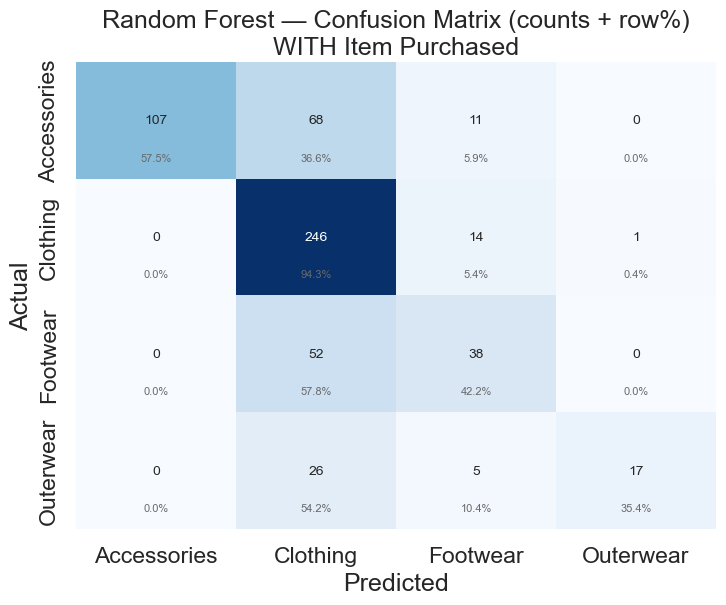

[Stage 9] Saved: figures/error_cm_WITH_Item_Purchased_Random_Forest.png
[Stage 9 • WITH Item Purchased] Saved: tables/error_per_class_ova_WITH_Item_Purchased_Random_Forest.csv

[Stage 9] Per-class (one-vs-all) metrics:


,Class,TN,FP,FN,TP,Precision,Recall,F1,Specificity,BalancedAcc
0,Accessories,399,0,79,107,1.000,0.575,0.730,1.000,0.788
1,Clothing,178,146,15,246,0.628,0.943,0.753,0.549,0.746
2,Footwear,465,30,52,38,0.559,0.422,0.481,0.939,0.681
3,Outerwear,536,1,31,17,0.944,0.354,0.515,0.998,0.676


[Stage 9] Saved: tables/error_confusion_pairs_WITH_Item_Purchased_Random_Forest.csv


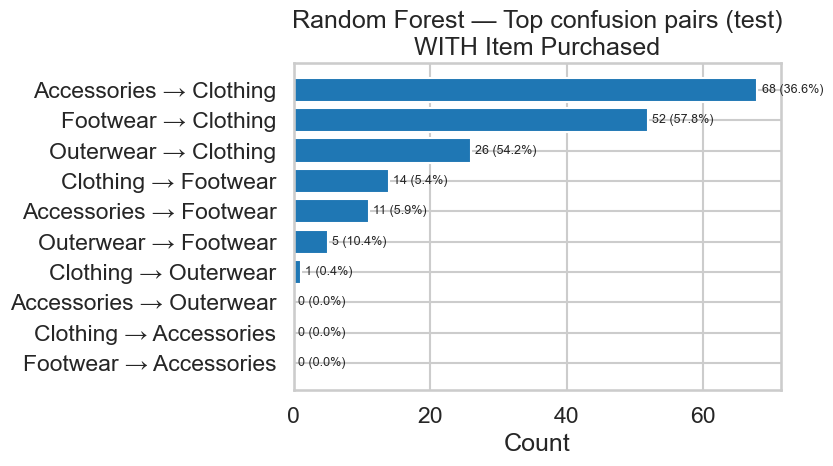

[Stage 9] Saved: figures/error_confusion_pairs_WITH_Item_Purchased_Random_Forest.png


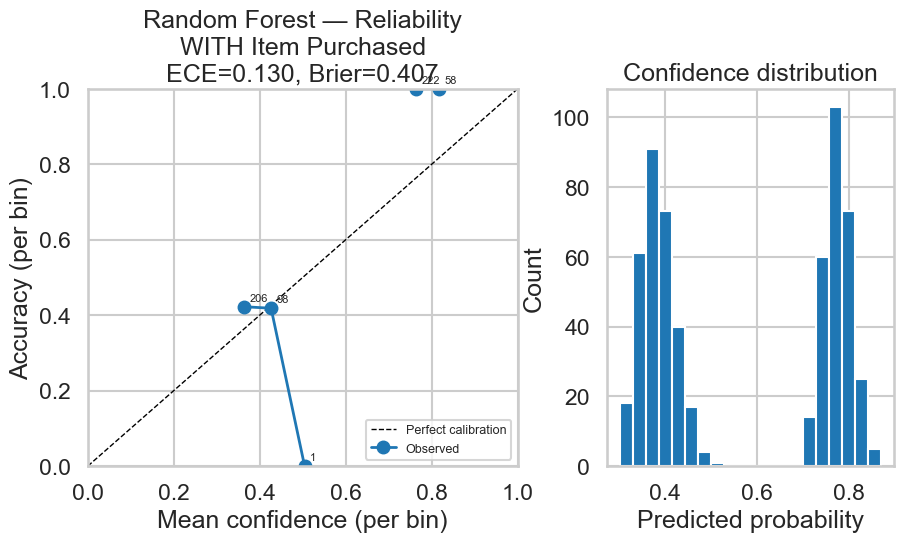

[Stage 9] Saved: figures/error_calibration_WITH_Item_Purchased_Random_Forest.png
[Stage 9] Saved: tables/slice_metrics_WITH_Item_Purchased_Random_Forest.csv

[Stage 9] Slice performance (worst first):


,slice_col,slice_level,support,accuracy,f1_macro
14,Payment Method,Bank Transfer,89,0.685393,0.560669
7,Size,L,159,0.691824,0.564398
12,Payment Method,PayPal,103,0.640777,0.574024
3,Season,Summer,138,0.652174,0.582038
10,Payment Method,Venmo,109,0.678899,0.582050
13,Payment Method,Cash,93,0.655914,0.589805
6,Size,M,277,0.671480,0.590391
2,Season,Winter,145,0.724138,0.598363
5,Gender,Female,200,0.720000,0.600932
16,Subscription Status,No,446,0.704036,0.612689


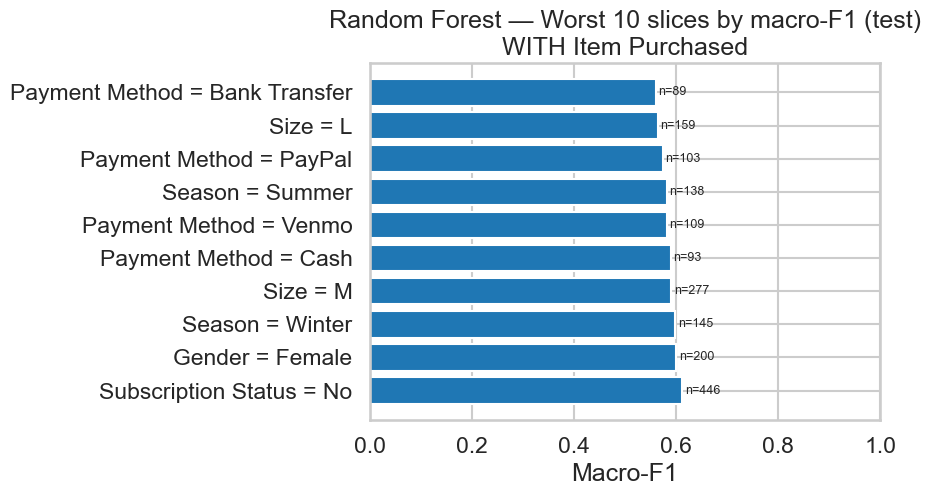

[Stage 9] Saved: figures/error_slice_bar_WITH_Item_Purchased_Random_Forest.png


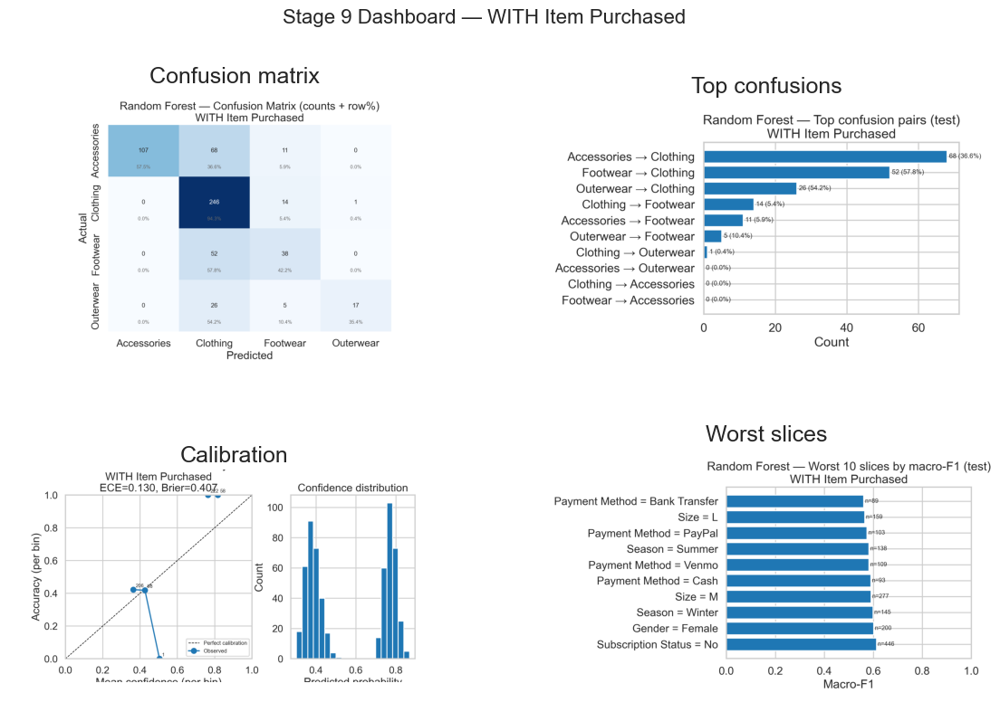

[Stage 9] Saved: figures/error_dashboard_WITH_Item_Purchased_Random_Forest.png

[Stage 9 • WITHOUT Item Purchased] Models evaluated:
  - LightGBM           macro-F1 = 0.240
  - Logistic Regression macro-F1 = 0.222
  - XGBoost            macro-F1 = 0.219
  - Decision Tree      macro-F1 = 0.206
  - Random Forest      macro-F1 = 0.192
[Stage 9 • WITHOUT Item Purchased] Selected BEST model: LightGBM (macro-F1=0.240)


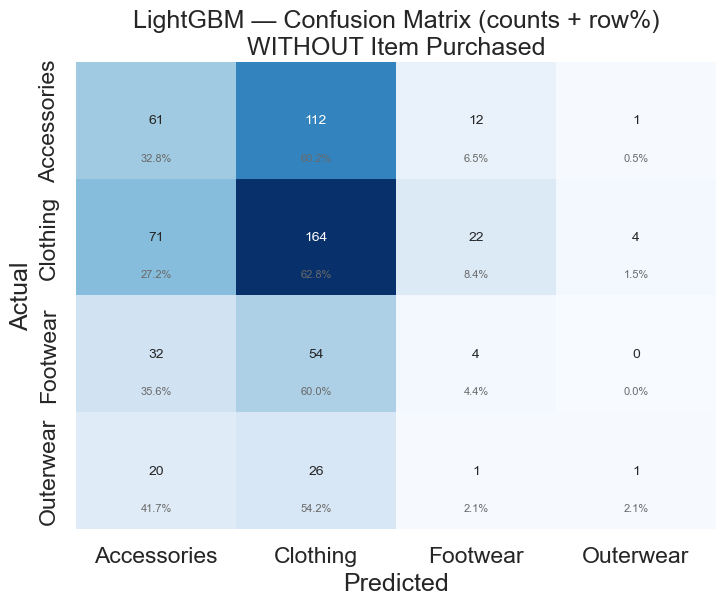

[Stage 9] Saved: figures/error_cm_WITHOUT_Item_Purchased_LightGBM.png
[Stage 9 • WITHOUT Item Purchased] Saved: tables/error_per_class_ova_WITHOUT_Item_Purchased_LightGBM.csv

[Stage 9] Per-class (one-vs-all) metrics:


,Class,TN,FP,FN,TP,Precision,Recall,F1,Specificity,BalancedAcc
0,Accessories,276,123,125,61,0.332,0.328,0.330,0.692,0.510
1,Clothing,132,192,97,164,0.461,0.628,0.532,0.407,0.518
2,Footwear,460,35,86,4,0.103,0.044,0.062,0.929,0.487
3,Outerwear,532,5,47,1,0.167,0.021,0.037,0.991,0.506


[Stage 9] Saved: tables/error_confusion_pairs_WITHOUT_Item_Purchased_LightGBM.csv


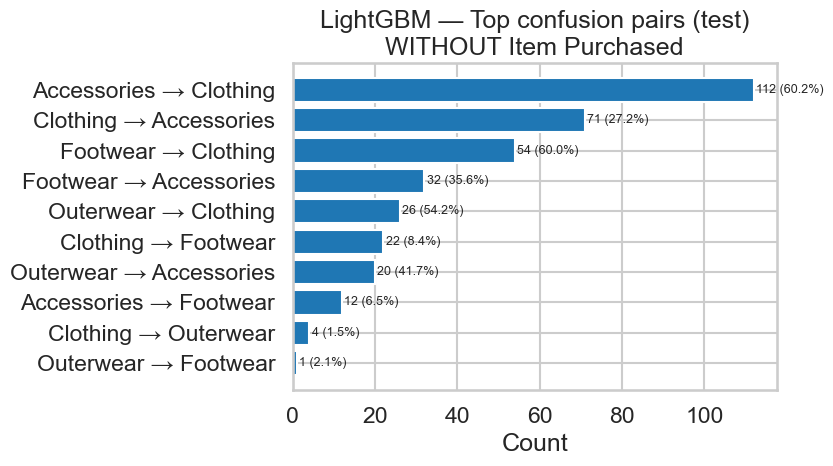

[Stage 9] Saved: figures/error_confusion_pairs_WITHOUT_Item_Purchased_LightGBM.png


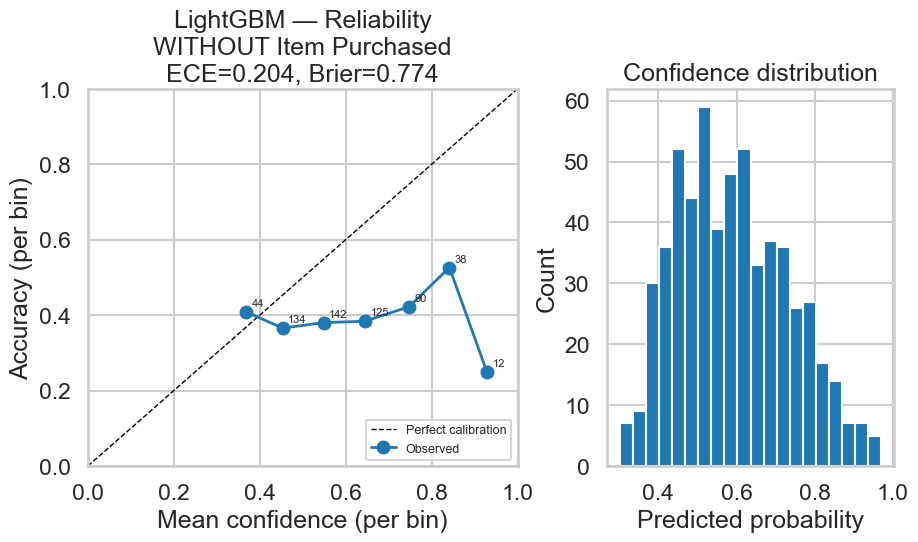

[Stage 9] Saved: figures/error_calibration_WITHOUT_Item_Purchased_LightGBM.png
[Stage 9] Saved: tables/slice_metrics_WITHOUT_Item_Purchased_LightGBM.csv

[Stage 9] Slice performance (worst first):


,slice_col,slice_level,support,accuracy,f1_macro
7,Size,L,159,0.358491,0.187974
10,Payment Method,Venmo,109,0.348624,0.193106
13,Payment Method,Cash,93,0.354839,0.203667
1,Season,Spring,148,0.358108,0.210795
8,Size,S,91,0.384615,0.211414
14,Payment Method,Bank Transfer,89,0.382022,0.215042
3,Season,Summer,138,0.362319,0.220859
2,Season,Winter,145,0.420690,0.224607
5,Gender,Female,200,0.370000,0.224669
16,Subscription Status,No,446,0.383408,0.238243


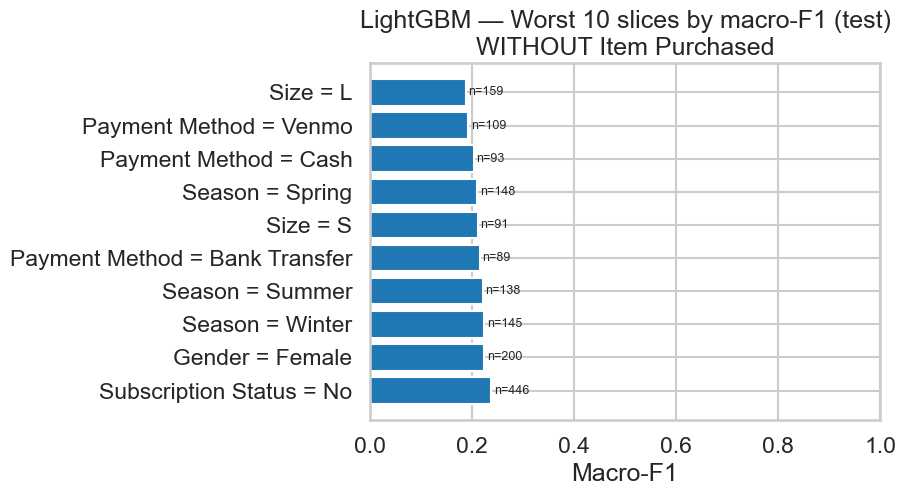

[Stage 9] Saved: figures/error_slice_bar_WITHOUT_Item_Purchased_LightGBM.png


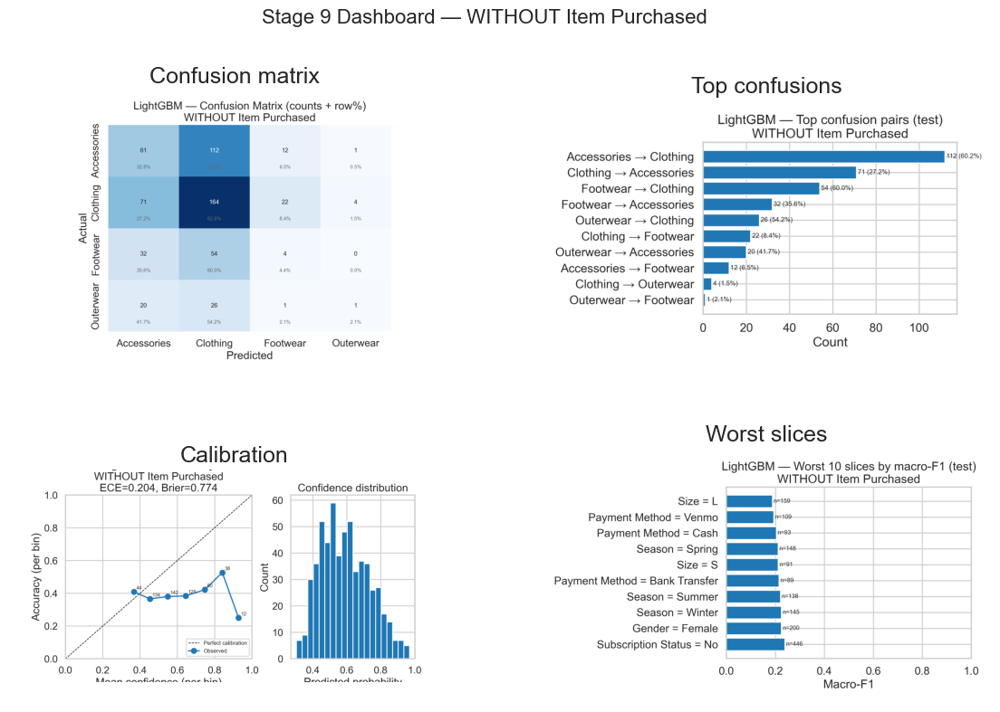

[Stage 9] Saved: figures/error_dashboard_WITHOUT_Item_Purchased_LightGBM.png

[Stage 9] Scenario comparison summary:


,scenario,best_model,macro_f1,has_proba,artefacts_tag
0,WITH Item Purchased,Random Forest,0.619996,True,WITH_Item_Purchased_Random_Forest
1,WITHOUT Item Purchased,LightGBM,0.240097,True,WITHOUT_Item_Purchased_LightGBM


[Stage 9] Saved: tables/stage9_scenario_summary.csv


In [21]:
# ======================================================================
# STAGE 9 STEP 2 - ERROR ANALYSIS & CALIBRATION (WITH vs WITHOUT "Item Purchased")
# ----------------------------------------------------------------------
# Goal:
#   After training models, we diagnose *how* the best model behaves:
#   - What it predicts correctly vs incorrectly (confusion matrix)
#   - Which mistakes happen most often (top confusion pairs)
#   - Whether predicted probabilities are trustworthy (calibration)
#   - Which customer groups perform worst (slice analysis)
#
# What this cell produces (SAVED + DISPLAYED):
#   figures/error_cm_<SCENARIO>_<MODEL>.png
#   figures/error_confusion_pairs_<SCENARIO>_<MODEL>.png
#   figures/error_calibration_<SCENARIO>_<MODEL>.png
#   figures/error_slice_bar_<SCENARIO>_<MODEL>.png
#   figures/error_dashboard_<SCENARIO>_<MODEL>.png
#
#   tables/error_per_class_ova_<SCENARIO>_<MODEL>.csv
#   tables/error_confusion_pairs_<SCENARIO>_<MODEL>.csv
#   tables/slice_metrics_<SCENARIO>_<MODEL>.csv
#   tables/stage9_scenario_summary.csv
# ======================================================================

import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Optional boosted models (only included if installed in the environment)
try:
    from xgboost import XGBClassifier
    _HAS_XGB = True
except Exception:
    _HAS_XGB = False

try:
    from lightgbm import LGBMClassifier
    _HAS_LGBM = True
except Exception:
    _HAS_LGBM = False

sns.set_style("whitegrid")


# -----------------------------
# 1) Housekeeping: folders + inputs
# -----------------------------
# We store outputs in predictable folders so GitHub users can find them easily.
os.makedirs("figures", exist_ok=True)
os.makedirs("tables", exist_ok=True)

# We use the project’s shared training/test split created earlier in the notebook.
assert "outputs" in globals(), "Missing `outputs` from earlier stages."
X_train_base = outputs["X_train"].copy()
X_test_base  = outputs["X_test"].copy()
y_train_base = np.asarray(outputs["y_train"]).ravel()
y_test_base  = np.asarray(outputs["y_test"]).ravel()
classes_base = np.asarray(outputs["classes"])


# -----------------------------
# 2) Small utilities (filenames + metrics)
# -----------------------------
def _safe_tag(text: str) -> str:
    """Make text safe for filenames (no spaces or special characters)."""
    return re.sub(r"[^A-Za-z0-9._-]+", "_", str(text)).strip("_")

def _expected_calibration_error(conf, corr, n_bins=10):
    """
    Expected Calibration Error (ECE) for top-label confidence.
    Interpretation:
      - Low ECE means confidence aligns with real accuracy.
      - High ECE means probabilities are over/under-confident.
    """
    bins = np.linspace(0.0, 1.0, n_bins + 1)
    idx = np.digitize(conf, bins) - 1
    ece = 0.0
    for b in range(n_bins):
        m = (idx == b)
        if not np.any(m):
            continue
        ece += m.mean() * abs(corr[m].mean() - conf[m].mean())
    return float(ece)

def _per_class_ova_from_cm(cm: np.ndarray, labels) -> pd.DataFrame:
    """
    One-vs-all metrics derived from the confusion matrix.
    This helps stakeholders see which categories are hardest for the model.
    """
    total = int(cm.sum())
    rows = []
    for i, lab in enumerate(labels):
        TP = int(cm[i, i])
        FN = int(cm[i, :].sum() - TP)
        FP = int(cm[:, i].sum() - TP)
        TN = int(total - TP - FP - FN)

        prec = TP / (TP + FP) if (TP + FP) else 0.0
        rec  = TP / (TP + FN) if (TP + FN) else 0.0
        f1   = (2 * prec * rec) / (prec + rec) if (prec + rec) else 0.0
        spec = TN / (TN + FP) if (TN + FP) else 0.0
        bal  = 0.5 * (rec + spec)

        rows.append({
            "Class": str(lab),
            "TN": TN, "FP": FP, "FN": FN, "TP": TP,
            "Precision": round(prec, 3),
            "Recall": round(rec, 3),
            "F1": round(f1, 3),
            "Specificity": round(spec, 3),
            "BalancedAcc": round(bal, 3),
        })
    return pd.DataFrame(rows)


# -----------------------------
# 3) Build a simple preprocessing layer from the raw dataset
# -----------------------------
def _make_preprocessor(X: pd.DataFrame) -> ColumnTransformer:
    """
    We convert categorical fields into numeric indicators (one-hot encoding),
    and scale numeric fields so linear models behave sensibly.
    """
    cat_cols = [c for c in X.columns if str(X[c].dtype) in ("object", "category")]
    num_cols = [c for c in X.columns if c not in cat_cols]

    # OneHotEncoder creates one column per category so models can use them.
    # StandardScaler helps linear models; with_mean=False works with sparse matrices.
    return ColumnTransformer(
        transformers=[
            ("cat", OneHotEncoder(handle_unknown="ignore", sparse=True), cat_cols),
            ("num", StandardScaler(with_mean=False), num_cols),
        ],
        remainder="drop",
        sparse_threshold=1.0,
        n_jobs=-1,
    )


# -----------------------------
# 4) Define a small set of "finalist" models
# -----------------------------
def _build_finalists(preproc, n_classes: int, seed: int = 42) -> dict:
    """
    We compare a few strong baseline models and boosted models (if available).
    This is not exhaustive tuning; it is a fair comparison for diagnostics.
    """
    models = {
        "Decision Tree": DecisionTreeClassifier(max_depth=8, random_state=seed),
        "Random Forest": RandomForestClassifier(
            n_estimators=500, max_depth=20, class_weight="balanced",
            n_jobs=-1, random_state=seed
        ),
        "Logistic Regression": LogisticRegression(
            C=1.0, penalty="l2", multi_class="multinomial",
            solver="lbfgs", max_iter=2000, random_state=seed
        ),
    }

    if _HAS_XGB:
        models["XGBoost"] = XGBClassifier(
            objective="multi:softprob",
            num_class=n_classes,
            eval_metric="mlogloss",
            n_estimators=350,
            max_depth=4,
            learning_rate=0.06,
            subsample=1.0,
            colsample_bytree=1.0,
            tree_method="hist",
            n_jobs=-1,
            random_state=seed,
        )

    if _HAS_LGBM:
        models["LightGBM"] = LGBMClassifier(
            objective="multiclass",
            num_class=n_classes,
            n_estimators=400,
            num_leaves=31,
            learning_rate=0.05,
            min_child_samples=40,
            n_jobs=-1,
            random_state=seed,
        )

    # Wrap each model with preprocessing so the same raw data can be used for all.
    pipes = {name: Pipeline([("prep", preproc), ("clf", clf)]) for name, clf in models.items()}
    return pipes


# -----------------------------
# 5) Plotting helpers (each plot is saved AND shown)
# -----------------------------
def _plot_confusion_matrix(cm, classes, title, out_path):
    """Confusion matrix with counts + row-percentages (so class imbalance is visible)."""
    row_sums = cm.sum(axis=1, keepdims=True).clip(min=1)
    cm_pct = cm / row_sums

    plt.figure(figsize=(7.6, 6.4))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues", cbar=False,
        xticklabels=classes, yticklabels=classes, annot_kws={"fontsize": 10}
    )
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(
                j + 0.5, i + 0.82, f"{100 * cm_pct[i, j]:.1f}%",
                ha="center", va="center", fontsize=8, color="dimgray"
            )
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.savefig(out_path, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {out_path}")

def _plot_top_confusions(cm, classes, title, out_csv, out_png):
    """
    Shows the most common misclassifications (off-diagonal confusion cells).
    This is the quickest way to explain errors to stakeholders.
    """
    row_sums = cm.sum(axis=1, keepdims=True).clip(min=1)

    pairs = []
    for i, t_lab in enumerate(classes):
        for j, p_lab in enumerate(classes):
            if i == j:
                continue
            cnt = int(cm[i, j])
            share = float(cnt / row_sums[i, 0])
            pairs.append({"True": str(t_lab), "Pred": str(p_lab), "Count": cnt, "Share_of_true": share})

    pairs_df = pd.DataFrame(pairs).sort_values(["Count", "Share_of_true"], ascending=[False, False])
    pairs_df.to_csv(out_csv, index=False)
    print(f"[Stage 9] Saved: {out_csv}")

    topk = pairs_df.head(10).iloc[::-1]  # reverse for barh
    plt.figure(figsize=(8.6, 5.0))
    labels = [f"{row['True']} → {row['Pred']}" for _, row in topk.iterrows()]
    plt.barh(labels, topk["Count"])
    for y, (c, s) in enumerate(zip(topk["Count"], topk["Share_of_true"])):
        plt.text(float(c) + 0.6, y, f"{int(c)} ({100*s:.1f}%)", va="center", fontsize=9)
    plt.title(title)
    plt.xlabel("Count")
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {out_png}")

def _plot_calibration(y_test, y_pred, y_proba, title, out_png):
    """
    Reliability diagram using top-label confidence:
      - If confidence is 0.8, we expect ~80% accuracy in that bin.
    """
    max_prob = y_proba.max(axis=1)
    correct = (y_pred == y_test).astype(int)

    ece = _expected_calibration_error(max_prob, correct, n_bins=10)

    Yb = np.eye(y_proba.shape[1])[y_test]
    brier = float(np.mean(np.sum((y_proba - Yb) ** 2, axis=1)))

    bins = np.linspace(0, 1, 11)
    ids = np.digitize(max_prob, bins) - 1

    acc_by_bin, conf_by_bin, n_by_bin = [], [], []
    for b in range(10):
        m = (ids == b)
        if m.sum() == 0:
            acc_by_bin.append(np.nan)
            conf_by_bin.append(np.nan)
            n_by_bin.append(0)
        else:
            acc_by_bin.append(float(correct[m].mean()))
            conf_by_bin.append(float(max_prob[m].mean()))
            n_by_bin.append(int(m.sum()))

    fig = plt.figure(figsize=(10.4, 4.9))
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 2], wspace=0.25)

    ax = fig.add_subplot(gs[0, 0])
    ax.plot([0, 1], [0, 1], "k--", lw=1, label="Perfect calibration")
    ax.plot(conf_by_bin, acc_by_bin, marker="o", lw=2, label="Observed")
    for x, y, n in zip(conf_by_bin, acc_by_bin, n_by_bin):
        if not (np.isnan(x) or np.isnan(y)):
            ax.annotate(n, (x, y), textcoords="offset points", xytext=(4, 4), fontsize=8)
    ax.set_title(f"{title}\nECE={ece:.3f}, Brier={brier:.3f}")
    ax.set_xlabel("Mean confidence (per bin)")
    ax.set_ylabel("Accuracy (per bin)")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend(loc="lower right", fontsize=9)

    axh = fig.add_subplot(gs[0, 1])
    axh.hist(max_prob, bins=20, edgecolor="white")
    axh.set_title("Confidence distribution")
    axh.set_xlabel("Predicted probability")
    axh.set_ylabel("Count")

    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {out_png}")

def _plot_worst_slices(X_test, y_test, y_pred, title, out_csv, out_png):
    """
    Slice analysis checks whether performance drops for specific groups
    (e.g., a Season or Payment Method category).
    """
    candidate_cols = ["Season", "Gender", "Size", "Payment Method", "Subscription Status"]
    slice_cols = [c for c in candidate_cols if c in X_test.columns]

    rows = []
    for col in slice_cols:
        counts = X_test[col].value_counts().sort_values(ascending=False)
        for level in counts.head(12).index:
            mask = (X_test[col] == level).values
            if mask.sum() == 0:
                continue
            acc = float(accuracy_score(y_test[mask], y_pred[mask]))
            f1m = float(f1_score(y_test[mask], y_pred[mask], average="macro", zero_division=0))
            rows.append({
                "slice_col": col,
                "slice_level": str(level),
                "support": int(mask.sum()),
                "accuracy": acc,
                "f1_macro": f1m
            })

    slice_df = (
        pd.DataFrame(rows)
        .dropna()
        .sort_values(["f1_macro", "support"], ascending=[True, False])
    )
    slice_df.to_csv(out_csv, index=False)
    print(f"[Stage 9] Saved: {out_csv}")

    display_cols = ["slice_col", "slice_level", "support", "accuracy", "f1_macro"]
    print("\n[Stage 9] Slice performance (worst first):")
    display(slice_df[display_cols].head(18))

    worst = slice_df.head(10).iloc[::-1]
    plt.figure(figsize=(9.4, 5.3))
    labels = [f"{row['slice_col']} = {row['slice_level']}" for _, row in worst.iterrows()]
    plt.barh(labels, worst["f1_macro"])
    for y, (f1m, n) in enumerate(zip(worst["f1_macro"], worst["support"])):
        plt.text(float(f1m) + 0.005, y, f"n={int(n)}", va="center", fontsize=9)
    plt.title(title)
    plt.xlabel("Macro-F1")
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {out_png}")

def _save_dashboard(cm_path, pairs_path, calib_path, slice_path, title, out_png):
    """
    A single “one-page” visual summary so non-technical readers can scan results fast.
    """
    import matplotlib.image as mpimg

    fig = plt.figure(figsize=(14, 9))
    gs = fig.add_gridspec(2, 2, wspace=0.18, hspace=0.22)

    ax1 = fig.add_subplot(gs[0, 0]); ax1.imshow(mpimg.imread(cm_path));    ax1.axis("off"); ax1.set_title("Confusion matrix")
    ax2 = fig.add_subplot(gs[0, 1]); ax2.imshow(mpimg.imread(pairs_path)); ax2.axis("off"); ax2.set_title("Top confusions")
    ax3 = fig.add_subplot(gs[1, 0]); ax3.imshow(mpimg.imread(calib_path)); ax3.axis("off"); ax3.set_title("Calibration")
    ax4 = fig.add_subplot(gs[1, 1]); ax4.imshow(mpimg.imread(slice_path)); ax4.axis("off"); ax4.set_title("Worst slices")

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.show()
    print(f"[Stage 9] Saved: {out_png}")


# -----------------------------
# 6) Core runner (one scenario)
# -----------------------------
def run_stage9_scenario(X_train_raw, y_train, X_test_raw, y_test, classes, scenario_label, drop_cols=None):
    """
    Runs the full diagnostic package for one scenario and returns a small summary row.
    """
    # Step A: Prepare the scenario dataset (e.g., remove "Item Purchased" if required)
    drop_cols = set(drop_cols or set())
    keep_cols = [c for c in X_train_raw.columns if c not in drop_cols]
    X_tr = X_train_raw[keep_cols].copy()
    X_te = X_test_raw[keep_cols].copy()

    # Step B: Build preprocessing for this scenario’s raw columns
    preproc = _make_preprocessor(X_tr)

    # Step C: Train and compare a few finalist models, then pick the best on macro-F1
    pipes = _build_finalists(preproc, n_classes=len(classes))
    scores = []
    for name, pipe in pipes.items():
        pipe.fit(X_tr, y_train)
        y_hat = pipe.predict(X_te)
        scores.append((name, float(f1_score(y_test, y_hat, average="macro", zero_division=0))))

    scores_sorted = sorted(scores, key=lambda t: t[1], reverse=True)
    best_name, best_f1 = scores_sorted[0]
    best_pipe = pipes[best_name]

    print(f"\n[Stage 9 • {scenario_label}] Models evaluated:")
    for n, s in scores_sorted:
        print(f"  - {n:<18} macro-F1 = {s:.3f}")
    print(f"[Stage 9 • {scenario_label}] Selected BEST model: {best_name} (macro-F1={best_f1:.3f})")

    # Step D: Generate predictions (and probabilities when available)
    y_pred = best_pipe.predict(X_te)
    has_proba = hasattr(best_pipe, "predict_proba")
    y_proba = best_pipe.predict_proba(X_te) if has_proba else None

    # Step E: Build consistent filenames for saved artefacts
    tag = f"{_safe_tag(scenario_label)}_{_safe_tag(best_name)}"

    cm_png    = f"figures/error_cm_{tag}.png"
    pairs_csv = f"tables/error_confusion_pairs_{tag}.csv"
    pairs_png = f"figures/error_confusion_pairs_{tag}.png"
    calib_png = f"figures/error_calibration_{tag}.png"
    ova_csv   = f"tables/error_per_class_ova_{tag}.csv"
    slice_csv = f"tables/slice_metrics_{tag}.csv"
    slice_png = f"figures/error_slice_bar_{tag}.png"
    dash_png  = f"figures/error_dashboard_{tag}.png"

    # Step F: Confusion matrix (counts + row%)
    cm = confusion_matrix(y_test, y_pred, labels=np.arange(len(classes)))
    _plot_confusion_matrix(
        cm=cm,
        classes=classes,
        title=f"{best_name} — Confusion Matrix (counts + row%)\n{scenario_label}",
        out_path=cm_png
    )

    # Step G: Per-class metrics (one-vs-all), saved + printed
    ova_df = _per_class_ova_from_cm(cm, classes)
    ova_df.to_csv(ova_csv, index=False)
    print(f"[Stage 9 • {scenario_label}] Saved: {ova_csv}")
    print("\n[Stage 9] Per-class (one-vs-all) metrics:")
    display(ova_df)

    # Step H: Top confusion pairs (which wrong predictions are most common)
    _plot_top_confusions(
        cm=cm,
        classes=classes,
        title=f"{best_name} — Top confusion pairs (test)\n{scenario_label}",
        out_csv=pairs_csv,
        out_png=pairs_png
    )

    # Step I: Probability calibration (only if the model provides predict_proba)
    if has_proba and y_proba is not None:
        _plot_calibration(
            y_test=y_test,
            y_pred=y_pred,
            y_proba=y_proba,
            title=f"{best_name} — Reliability\n{scenario_label}",
            out_png=calib_png
        )
    else:
        # If a model cannot output probabilities, calibration is not meaningful.
        print(f"[Stage 9 • {scenario_label}] {best_name} does not provide probabilities; calibration skipped.")
        calib_png = None

    # Step J: Slice analysis (worst groups)
    _plot_worst_slices(
        X_test=X_te,
        y_test=y_test,
        y_pred=y_pred,
        title=f"{best_name} — Worst 10 slices by macro-F1 (test)\n{scenario_label}",
        out_csv=slice_csv,
        out_png=slice_png
    )

    # Step K: One-page dashboard image (only if calibration plot exists)
    if calib_png is not None:
        _save_dashboard(
            cm_path=cm_png,
            pairs_path=pairs_png,
            calib_path=calib_png,
            slice_path=slice_png,
            title=f"Stage 9 Dashboard — {scenario_label}",
            out_png=dash_png
        )

    # Step L: Return a compact summary row for scenario comparison
    return {
        "scenario": scenario_label,
        "best_model": best_name,
        "macro_f1": best_f1,
        "has_proba": bool(has_proba),
        "artefacts_tag": tag
    }


# -----------------------------
# 7) Run both scenarios (WITH vs WITHOUT "Item Purchased")
# -----------------------------
summary_rows = []

# Scenario 1: WITH "Item Purchased" (all raw columns kept)
summary_rows.append(
    run_stage9_scenario(
        X_train_raw=X_train_base,
        y_train=y_train_base,
        X_test_raw=X_test_base,
        y_test=y_test_base,
        classes=classes_base,
        scenario_label="WITH Item Purchased",
        drop_cols=set()
    )
)

# Scenario 2: WITHOUT "Item Purchased" (drop the column if present)
drop_cols = {"Item Purchased"} & set(X_train_base.columns)
summary_rows.append(
    run_stage9_scenario(
        X_train_raw=X_train_base,
        y_train=y_train_base,
        X_test_raw=X_test_base,
        y_test=y_test_base,
        classes=classes_base,
        scenario_label="WITHOUT Item Purchased",
        drop_cols=drop_cols
    )
)

# Step: Save and show a small scenario comparison summary for quick reporting
summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv("tables/stage9_scenario_summary.csv", index=False)
print("\n[Stage 9] Scenario comparison summary:")
display(summary_df)
print("[Stage 9] Saved: tables/stage9_scenario_summary.csv")


### STAGE 10 - ROBUSTNESS & SENSITIVITY CHECKS (WITH vs WITHOUT Item Purchased)


STAGE 10 RUNNING SCENARIO: WITH Item Purchased

Models evaluated (test macro-F1):
  - Decision Tree      0.617
  - XGBoost            0.611
  - Random Forest      0.604
  - Logistic Regression 0.602
  - LightGBM           0.587

Full model comparison table:


,Model,test_macro_f1,test_accuracy
0,Decision Tree,0.616517,0.704274
3,XGBoost,0.611147,0.692308
1,Random Forest,0.604296,0.685470
2,Logistic Regression,0.601990,0.682051
4,LightGBM,0.587012,0.664957



Selected BEST model for robustness checks: Decision Tree

Headline test performance (best model): macro-F1=0.617, accuracy=0.704

Seed sensitivity (5-fold CV macro-F1):


,seed,cv_mean_f1_macro,cv_std
0,7,0.665336,0.014754
1,42,0.665566,0.028302
2,99,0.664984,0.021025
3,1337,0.658306,0.020684
4,2024,0.660031,0.014157


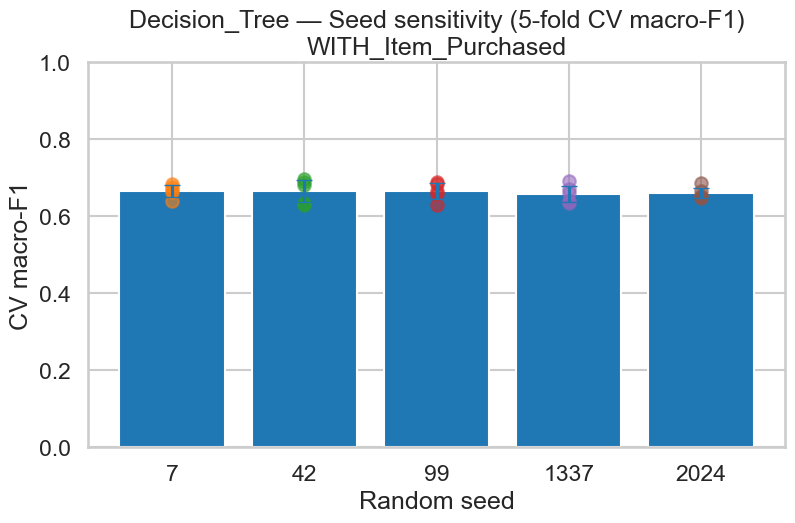

Saved: figures/stage10_seed_sensitivity_WITH_Item_Purchased_Decision_Tree.png
Saved: tables/stage10_seed_sensitivity_WITH_Item_Purchased_Decision_Tree.csv

Ablation study (CV + Test):


,ablation,dropped,cv_mean_f1_macro,cv_std,test_f1_macro,test_accuracy
0,Full (baseline),-,0.665566,0.028302,0.616517,0.704274
1,Drop interactions,"Season_Gender_Age, PaymentMethod_Season, Payme...",0.666486,0.027122,0.616517,0.704274
2,Drop numeric composites,"Purchase_Intensity, Discount_Sensitivity, Freq...",0.665171,0.028830,0.616517,0.704274
3,Drop Item Purchased,Item Purchased,0.209318,0.004023,0.196344,0.394872


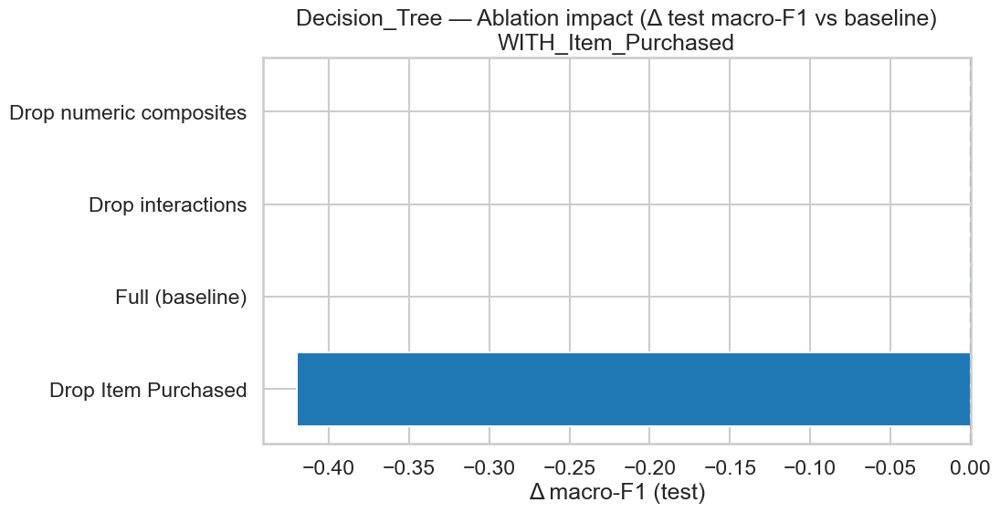

Saved: figures/stage10_ablation_WITH_Item_Purchased_Decision_Tree.png
Saved: tables/stage10_ablation_WITH_Item_Purchased_Decision_Tree.csv

Learning curve (macro-F1):


,train_size,train_mean,train_std,cv_mean,cv_std
0,218,0.741853,0.087084,0.646119,0.044795
1,499,0.682238,0.029480,0.660948,0.025479
2,780,0.696673,0.023520,0.663094,0.023828
3,1060,0.667493,0.014682,0.666822,0.026710
4,1341,0.683964,0.016865,0.662645,0.025752
5,1622,0.684238,0.018152,0.665794,0.026314
6,1903,0.676706,0.014953,0.665183,0.025637
7,2184,0.672589,0.012902,0.665566,0.028302


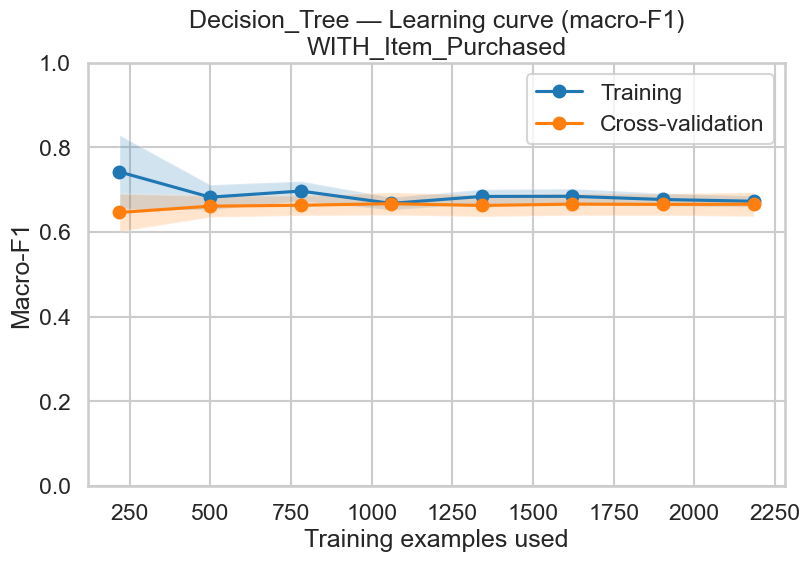

Saved: figures/stage10_learning_curve_WITH_Item_Purchased_Decision_Tree.png
Saved: tables/stage10_learning_curve_WITH_Item_Purchased_Decision_Tree.csv

STAGE 10 RUNNING SCENARIO: WITHOUT Item Purchased

Models evaluated (test macro-F1):
  - LightGBM           0.240
  - Logistic Regression 0.219
  - Random Forest      0.204
  - XGBoost            0.203
  - Decision Tree      0.196

Full model comparison table:


,Model,test_macro_f1,test_accuracy
4,LightGBM,0.240097,0.393162
2,Logistic Regression,0.219411,0.432479
1,Random Forest,0.203855,0.447863
3,XGBoost,0.202756,0.415385
0,Decision Tree,0.196344,0.394872



Selected BEST model for robustness checks: LightGBM

Headline test performance (best model): macro-F1=0.240, accuracy=0.393

Seed sensitivity (5-fold CV macro-F1):


,seed,cv_mean_f1_macro,cv_std
0,7,0.219692,0.012060
1,42,0.226471,0.023107
2,99,0.219716,0.016661
3,1337,0.232237,0.017366
4,2024,0.235153,0.008552


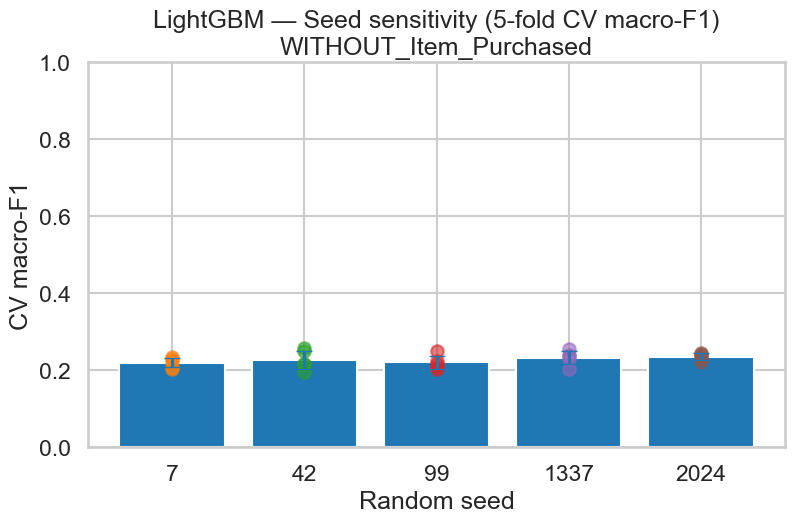

Saved: figures/stage10_seed_sensitivity_WITHOUT_Item_Purchased_LightGBM.png
Saved: tables/stage10_seed_sensitivity_WITHOUT_Item_Purchased_LightGBM.csv

Ablation study (CV + Test):


,ablation,dropped,cv_mean_f1_macro,cv_std,test_f1_macro,test_accuracy
0,Full (baseline),-,0.226471,0.023107,0.240097,0.393162
1,Drop interactions,"Season_Gender_Age, PaymentMethod_Season, Payme...",0.228392,0.011878,0.232767,0.386325
2,Drop numeric composites,"Purchase_Intensity, Discount_Sensitivity, Freq...",0.223031,0.017493,0.220478,0.381197


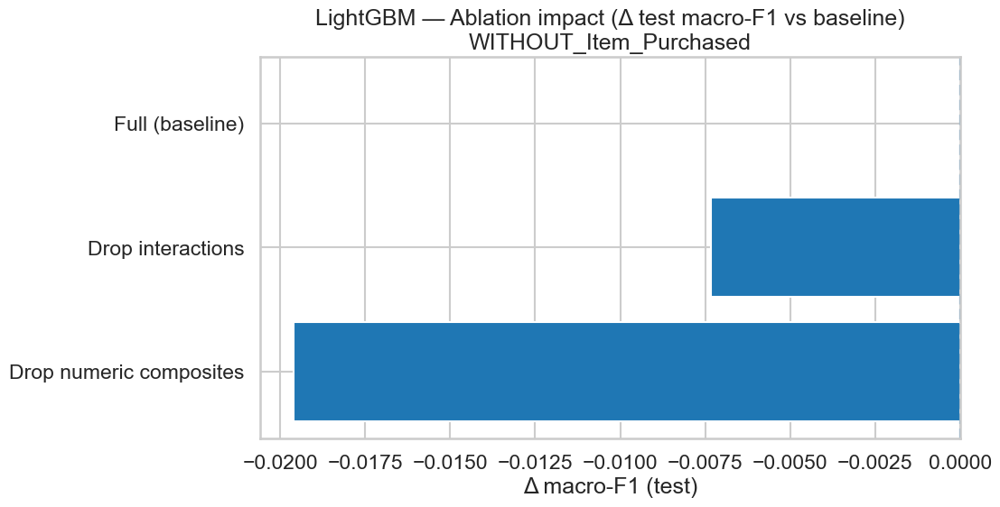

Saved: figures/stage10_ablation_WITHOUT_Item_Purchased_LightGBM.png
Saved: tables/stage10_ablation_WITHOUT_Item_Purchased_LightGBM.csv

Learning curve (macro-F1):


,train_size,train_mean,train_std,cv_mean,cv_std
0,218,0.928989,0.009826,0.229753,0.015533
1,499,0.998456,0.001463,0.245440,0.014685
2,780,0.999828,0.000345,0.234221,0.014988
3,1060,1.000000,0.000000,0.231334,0.021079
4,1341,1.000000,0.000000,0.227511,0.009976
5,1622,1.000000,0.000000,0.238396,0.017556
6,1903,0.999929,0.000141,0.229121,0.014539
7,2184,1.000000,0.000000,0.226471,0.023107


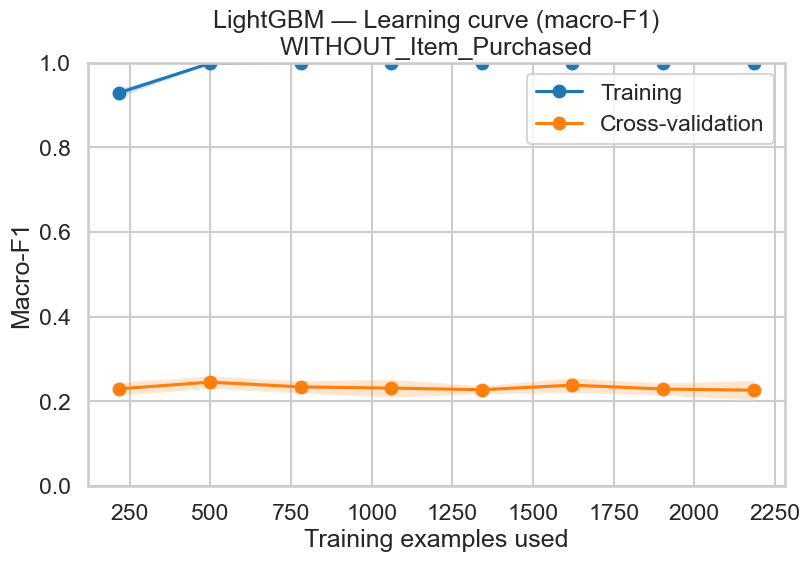

Saved: figures/stage10_learning_curve_WITHOUT_Item_Purchased_LightGBM.png
Saved: tables/stage10_learning_curve_WITHOUT_Item_Purchased_LightGBM.csv

STAGE 10 COMPLETE — Scenario summary


,scenario,best_model,test_macro_f1,test_accuracy,seed_table,ablation_table,learning_curve_table,seed_plot,ablation_plot,learning_curve_plot
0,WITH_Item_Purchased,Decision Tree,0.616517,0.704274,tables/stage10_seed_sensitivity_WITH_Item_Purc...,tables/stage10_ablation_WITH_Item_Purchased_De...,tables/stage10_learning_curve_WITH_Item_Purcha...,figures/stage10_seed_sensitivity_WITH_Item_Pur...,figures/stage10_ablation_WITH_Item_Purchased_D...,figures/stage10_learning_curve_WITH_Item_Purch...
1,WITHOUT_Item_Purchased,LightGBM,0.240097,0.393162,tables/stage10_seed_sensitivity_WITHOUT_Item_P...,tables/stage10_ablation_WITHOUT_Item_Purchased...,tables/stage10_learning_curve_WITHOUT_Item_Pur...,figures/stage10_seed_sensitivity_WITHOUT_Item_...,figures/stage10_ablation_WITHOUT_Item_Purchase...,figures/stage10_learning_curve_WITHOUT_Item_Pu...


Saved: tables/stage10_scenario_summary.csv


In [22]:
# ======================================================================
# STAGE 10 - ROBUSTNESS & SENSITIVITY CHECKS (WITH vs WITHOUT Item Purchased)
# ======================================================================
# Why this stage exists (non-technical explanation):
#   A model can look good on one train/test split by chance.
#   This stage checks if results are stable when:
#     (1) we change random seeds (seed sensitivity),
#     (2) we remove groups of engineered features (ablation),
#     (3) we vary how much training data we use (learning curve).
#
# Outputs (printed + saved):
#   - Seed sensitivity: mean CV macro-F1 across multiple seeds (with error bars)
#   - Ablation: change in test macro-F1 vs baseline when features are removed
#   - Learning curve: macro-F1 vs training size (train vs CV)
#   - Scenario summary: best model + key metrics for WITH vs WITHOUT
# ======================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold, cross_validate, learning_curve
from sklearn.metrics import f1_score, accuracy_score
from sklearn.base import clone
from sklearn.compose import ColumnTransformer

# Pipelines / models
try:
    from imblearn.pipeline import Pipeline  # supports the "balance" passthrough step cleanly
except Exception:
    from sklearn.pipeline import Pipeline

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Optional boosters (guarded imports)
try:
    from xgboost import XGBClassifier
    _HAS_XGB = True
except Exception:
    _HAS_XGB = False

try:
    from lightgbm import LGBMClassifier
    _HAS_LGBM = True
except Exception:
    _HAS_LGBM = False


# -----------------------------
# STEP 0 — Validate prerequisites
# -----------------------------
# Stakeholder note:
#   We reuse the already-prepared train/test split and preprocessing design from earlier stages.
assert "outputs" in globals(), "Stage 10 requires the Stage 4/6 `outputs` dict in memory."

X_train = outputs["X_train"]
X_test  = outputs["X_test"]
y_train = np.asarray(outputs["y_train"]).ravel()
y_test  = np.asarray(outputs["y_test"]).ravel()
classes = np.asarray(outputs["classes"])

# This is your “feature engineering + encoding” blueprint from earlier stages.
base_preprocessor = outputs["preprocessor"]

# Create folders so results are neatly stored for GitHub/report use.
os.makedirs("figures", exist_ok=True)
os.makedirs("tables", exist_ok=True)


# -----------------------------
# STEP 1 — Helpers (kept minimal)
# -----------------------------
def _slug(s: str) -> str:
    """Make filenames safe and consistent."""
    return str(s).replace(" ", "_").replace('"', "").replace("'", "")

def drop_from_preprocessor(preproc: ColumnTransformer, drop_cols):
    """
    Stakeholder note:
      This is how we fairly compare WITH vs WITHOUT a feature:
      we remove the feature from the preprocessing blueprint,
      but keep everything else identical.
    """
    drop_cols = set(drop_cols)
    new_transformers = []
    for name, trans, cols in preproc.transformers:
        if isinstance(cols, list):
            keep = [c for c in cols if c not in drop_cols]
            new_transformers.append((name, clone(trans), keep))
        else:
            new_transformers.append((name, trans, cols))
    return ColumnTransformer(
        new_transformers,
        remainder=getattr(preproc, "remainder", "drop"),
        sparse_threshold=getattr(preproc, "sparse_threshold", 0.3),
    )

def build_finalist_pipelines(preproc, n_classes: int, seed: int = 42):
    """
    Stakeholder note:
      We evaluate a small set of strong baseline models.
      We are NOT hyper-tuning here; we are checking stability.
    """
    pipes = {
        "Decision Tree": Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", DecisionTreeClassifier(max_depth=8, random_state=seed)),
        ]),
        "Random Forest": Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", RandomForestClassifier(
                n_estimators=600, max_depth=20, class_weight="balanced",
                n_jobs=-1, random_state=seed
            )),
        ]),
        "Logistic Regression": Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", LogisticRegression(
                C=0.5, multi_class="multinomial", solver="lbfgs",
                max_iter=2000, random_state=seed
            )),
        ]),
    }

    if _HAS_XGB:
        pipes["XGBoost"] = Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", XGBClassifier(
                objective="multi:softprob", num_class=n_classes, eval_metric="mlogloss",
                n_estimators=300, max_depth=4, learning_rate=0.05,
                subsample=1.0, colsample_bytree=1.0, tree_method="hist",
                n_jobs=-1, random_state=seed
            )),
        ])

    if _HAS_LGBM:
        pipes["LightGBM"] = Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", LGBMClassifier(
                objective="multiclass", num_class=n_classes,
                n_estimators=400, num_leaves=31, learning_rate=0.05,
                min_child_samples=40, n_jobs=-1, random_state=seed
            )),
        ])

    return pipes

def pick_best_model_on_test(pipes):
    """
    Stakeholder note:
      We pick the best model for robustness checks using the same held-out test set.
      This gives us one “representative best model” per scenario.
    """
    rows = []
    for name, pipe in pipes.items():
        pipe.fit(X_train, y_train)
        y_hat = pipe.predict(X_test)
        rows.append({
            "Model": name,
            "test_macro_f1": f1_score(y_test, y_hat, average="macro", zero_division=0),
            "test_accuracy": accuracy_score(y_test, y_hat),
        })
    df = pd.DataFrame(rows).sort_values("test_macro_f1", ascending=False)

    print("\nModels evaluated (test macro-F1):")
    for _, r in df.iterrows():
        print(f"  - {r['Model']:<18} {r['test_macro_f1']:.3f}")

    best_name = df.iloc[0]["Model"]
    return best_name, df

def save_and_show(fig, path):
    """Save the chart for the report and show it inline for quick inspection."""
    fig.savefig(path, dpi=220, bbox_inches="tight")
    plt.show()
    print(f"Saved: {path}")


# -----------------------------
# STEP 2 — Robustness checks (seed sensitivity, ablation, learning curve)
# -----------------------------
def seed_sensitivity(best_pipe, scenario_slug, model_slug, seeds=(7, 42, 99, 1337, 2024)):
    """
    Stakeholder note:
      If results change a lot across seeds, the model is unstable and risky to rely on.
    """
    rows = []
    per_fold = []
    for s in seeds:
        cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=s)
        out = cross_validate(
            best_pipe, X_train, y_train,
            cv=cv, scoring={"f1_macro": "f1_macro"}, n_jobs=-1
        )
        rows.append({
            "seed": s,
            "cv_mean_f1_macro": out["test_f1_macro"].mean(),
            "cv_std": out["test_f1_macro"].std(),
        })
        per_fold += [{"seed": s, "fold": i + 1, "f1_macro": v} for i, v in enumerate(out["test_f1_macro"])]

    df = pd.DataFrame(rows)
    long = pd.DataFrame(per_fold)

    # Print table
    print("\nSeed sensitivity (5-fold CV macro-F1):")
    display(df)

    # Plot
    fig = plt.figure(figsize=(9, 5))
    plt.bar(df["seed"].astype(str), df["cv_mean_f1_macro"])
    plt.errorbar(
        x=np.arange(len(df)), y=df["cv_mean_f1_macro"],
        yerr=df["cv_std"], fmt="none", capsize=6
    )
    # show individual fold points for transparency
    for s in df["seed"]:
        pts = long.loc[long["seed"] == s, "f1_macro"].values
        x = np.where(df["seed"].values == s)[0][0]
        plt.scatter([x] * len(pts), pts, alpha=0.6)

    plt.ylim(0, 1)
    plt.title(f"{model_slug} — Seed sensitivity (5-fold CV macro-F1)\n{scenario_slug}")
    plt.xlabel("Random seed")
    plt.ylabel("CV macro-F1")

    csv_path = f"tables/stage10_seed_sensitivity_{scenario_slug}_{model_slug}.csv"
    fig_path = f"figures/stage10_seed_sensitivity_{scenario_slug}_{model_slug}.png"
    df.to_csv(csv_path, index=False)

    save_and_show(fig, fig_path)
    print(f"Saved: {csv_path}")

    return csv_path, fig_path

def ablation_study(preproc, model_name, scenario_slug, include_drop_item_row):
    """
    Stakeholder note:
      Ablation shows which feature groups actually matter.
      If removing a group causes performance to collapse, that group is a key driver.
    """
    # Define feature groups to remove (you can adjust these to match your engineered feature names)
    ABLATIONS = {
        "Full (baseline)": [],
        "Drop interactions": ["Season_Gender_Age", "PaymentMethod_Season", "Payment_Shipping", "Gender_Season"],
        "Drop numeric composites": ["Purchase_Intensity", "Discount_Sensitivity", "Freq_Score"],
    }
    if include_drop_item_row:
        ABLATIONS["Drop Item Purchased"] = ["Item Purchased"]

    def make_clf(name):
        if name == "Decision Tree":
            return DecisionTreeClassifier(max_depth=8, random_state=42)
        if name == "Random Forest":
            return RandomForestClassifier(n_estimators=600, max_depth=20, class_weight="balanced", n_jobs=-1, random_state=42)
        if name == "Logistic Regression":
            return LogisticRegression(C=0.5, multi_class="multinomial", solver="lbfgs", max_iter=2000, random_state=42)
        if name == "XGBoost" and _HAS_XGB:
            return XGBClassifier(objective="multi:softprob", num_class=len(classes), eval_metric="mlogloss",
                                 n_estimators=300, max_depth=4, learning_rate=0.05, tree_method="hist",
                                 n_jobs=-1, random_state=42)
        if name == "LightGBM" and _HAS_LGBM:
            return LGBMClassifier(objective="multiclass", num_class=len(classes), n_estimators=400, num_leaves=31,
                                  learning_rate=0.05, min_child_samples=40, n_jobs=-1, random_state=42)
        raise ValueError(f"Unsupported model: {name}")

    rows = []
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for label, drops in ABLATIONS.items():
        ct_ab = drop_from_preprocessor(preproc, drops)
        pipe = Pipeline([("prep", ct_ab), ("balance", "passthrough"), ("clf", make_clf(model_name))])

        cv_out = cross_validate(pipe, X_train, y_train, cv=cv, scoring={"f1_macro": "f1_macro"}, n_jobs=-1)

        pipe.fit(X_train, y_train)
        y_hat = pipe.predict(X_test)

        rows.append({
            "ablation": label,
            "dropped": ", ".join(drops) if drops else "-",
            "cv_mean_f1_macro": cv_out["test_f1_macro"].mean(),
            "cv_std": cv_out["test_f1_macro"].std(),
            "test_f1_macro": f1_score(y_test, y_hat, average="macro", zero_division=0),
            "test_accuracy": accuracy_score(y_test, y_hat),
        })

    ab = pd.DataFrame(rows)

    # Print table
    print("\nAblation study (CV + Test):")
    display(ab)

    # Compute deltas vs baseline and plot
    baseline = float(ab.loc[ab["ablation"] == "Full (baseline)", "test_f1_macro"].values[0])
    ab["delta_vs_baseline"] = ab["test_f1_macro"] - baseline
    ab_plot = ab.sort_values("delta_vs_baseline")

    fig = plt.figure(figsize=(10, 5.5))
    plt.barh(ab_plot["ablation"], ab_plot["delta_vs_baseline"])
    plt.axvline(0, linestyle="--")
    plt.title(f"{_slug(model_name)} — Ablation impact (Δ test macro-F1 vs baseline)\n{scenario_slug}")
    plt.xlabel("Δ macro-F1 (test)")
    plt.ylabel("")

    csv_path = f"tables/stage10_ablation_{scenario_slug}_{_slug(model_name)}.csv"
    fig_path = f"figures/stage10_ablation_{scenario_slug}_{_slug(model_name)}.png"
    ab.to_csv(csv_path, index=False)

    save_and_show(fig, fig_path)
    print(f"Saved: {csv_path}")

    return csv_path, fig_path

def learning_curve_check(best_pipe, scenario_slug, model_slug):
    """
    Stakeholder note:
      The learning curve tells us whether adding more data is likely to help.
      - If CV score is still rising: more data could improve performance.
      - If it flattens: performance is capped by features/model, not data volume.
    """
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    sizes, train_scores, cv_scores = learning_curve(
        best_pipe, X_train, y_train,
        cv=cv, scoring="f1_macro",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1, shuffle=True
    )

    df = pd.DataFrame({
        "train_size": sizes,
        "train_mean": train_scores.mean(axis=1),
        "train_std": train_scores.std(axis=1),
        "cv_mean": cv_scores.mean(axis=1),
        "cv_std": cv_scores.std(axis=1),
    })

    # Print table
    print("\nLearning curve (macro-F1):")
    display(df)

    # Plot
    fig = plt.figure(figsize=(9, 5.5))
    plt.plot(sizes, df["train_mean"], marker="o", label="Training")
    plt.fill_between(sizes, df["train_mean"] - df["train_std"], df["train_mean"] + df["train_std"], alpha=0.2)

    plt.plot(sizes, df["cv_mean"], marker="o", label="Cross-validation")
    plt.fill_between(sizes, df["cv_mean"] - df["cv_std"], df["cv_mean"] + df["cv_std"], alpha=0.2)

    plt.ylim(0, 1)
    plt.title(f"{model_slug} — Learning curve (macro-F1)\n{scenario_slug}")
    plt.xlabel("Training examples used")
    plt.ylabel("Macro-F1")
    plt.legend()

    csv_path = f"tables/stage10_learning_curve_{scenario_slug}_{model_slug}.csv"
    fig_path = f"figures/stage10_learning_curve_{scenario_slug}_{model_slug}.png"
    df.to_csv(csv_path, index=False)

    save_and_show(fig, fig_path)
    print(f"Saved: {csv_path}")

    return csv_path, fig_path


# -----------------------------
# STEP 3 — Run both scenarios end-to-end (WITH vs WITHOUT)
# -----------------------------
# Stakeholder note:
#   This is the core comparison: keep everything the same except one feature.
SCENARIOS = [
    ('WITH_Item_Purchased',    []),
    ('WITHOUT_Item_Purchased', ["Item Purchased"]),
]

scenario_summary = []

for scenario_slug, drop_cols in SCENARIOS:
    print("\n" + "=" * 90)
    print(f"STAGE 10 RUNNING SCENARIO: {scenario_slug.replace('_', ' ')}")
    print("=" * 90)

    # Build scenario-specific preprocessor (same pipeline design, optionally dropping Item Purchased)
    preproc = drop_from_preprocessor(base_preprocessor, drop_cols)

    # Evaluate candidate models and pick a scenario-specific “best”
    pipes = build_finalist_pipelines(preproc, n_classes=len(classes))
    best_name, eval_df = pick_best_model_on_test(pipes)

    # Print the full evaluation table (transparency)
    print("\nFull model comparison table:")
    display(eval_df)

    best_pipe = pipes[best_name]
    model_slug = _slug(best_name)

    print(f"\nSelected BEST model for robustness checks: {best_name}")

    # Quick headline performance (easy-to-read summary)
    y_hat = best_pipe.fit(X_train, y_train).predict(X_test)
    headline_f1 = f1_score(y_test, y_hat, average="macro", zero_division=0)
    headline_acc = accuracy_score(y_test, y_hat)

    print(f"\nHeadline test performance (best model): macro-F1={headline_f1:.3f}, accuracy={headline_acc:.3f}")

    # Run robustness checks (all plots shown + saved)
    seed_csv, seed_png = seed_sensitivity(best_pipe, scenario_slug, model_slug)

    # Only include "Drop Item Purchased" ablation row in the WITH scenario
    include_drop_item_row = (len(drop_cols) == 0)
    ab_csv, ab_png = ablation_study(preproc, best_name, scenario_slug, include_drop_item_row)

    lc_csv, lc_png = learning_curve_check(best_pipe, scenario_slug, model_slug)

    scenario_summary.append({
        "scenario": scenario_slug,
        "best_model": best_name,
        "test_macro_f1": headline_f1,
        "test_accuracy": headline_acc,
        "seed_table": seed_csv,
        "ablation_table": ab_csv,
        "learning_curve_table": lc_csv,
        "seed_plot": seed_png,
        "ablation_plot": ab_png,
        "learning_curve_plot": lc_png,
    })

# Save and print scenario summary (makes GitHub/report cleaner)
summary_df = pd.DataFrame(scenario_summary)
summary_path = "tables/stage10_scenario_summary.csv"
summary_df.to_csv(summary_path, index=False)

print("\n" + "=" * 90)
print("STAGE 10 COMPLETE — Scenario summary")
print("=" * 90)
display(summary_df)
print(f"Saved: {summary_path}")

### STAGE 11 - FINAL ASSETS + WITH vs WITHOUT “Item Purchased” COMPARISON

[Stage 11] Loaded WITH test metrics (wide): tables\final_test_metrics_wide.csv | rows=5, cols=8
[Stage 11] Loaded WITHOUT test metrics (wide): without\tables\final_test_metrics_wide.csv | rows=5, cols=8
[Stage 11] Loaded WITH baseline vs models: tables\baseline_vs_models.csv | rows=10, cols=10
[Stage 11] Loaded WITH statistical tests: tables\stats_tests.csv | rows=11, cols=13
[Stage 11] Loaded WITH feature ranks: tables\feature_ranks.csv | rows=110, cols=4


,Model,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted,roc_auc_macro_ovr,pr_auc_macro
0,Decision Tree,0.704,0.900,0.557,0.617,0.681,0.852,0.626
1,LightGBM,0.679,0.687,0.562,0.595,0.666,0.852,0.693
2,Logistic Regression,0.682,0.759,0.556,0.602,0.668,0.854,0.696
3,Random Forest,0.691,0.762,0.566,0.610,0.678,0.851,0.699
4,XGBoost,0.689,0.795,0.554,0.605,0.670,0.855,0.699


,Model,accuracy,precision_macro,recall_macro,f1_macro,f1_weighted,roc_auc_macro_ovr,pr_auc_macro
0,Decision Tree,0.395,0.183,0.235,0.196,0.320,-,-
1,Random Forest,0.427,0.179,0.247,0.187,0.314,-,-
2,Logistic Regression,0.432,0.284,0.260,0.219,0.350,-,-
3,XGBoost,0.415,0.211,0.247,0.203,0.329,-,-
4,LightGBM,0.393,0.265,0.255,0.240,0.355,-,-



[Stage 11] Baseline vs Models (preview):


,metric,model,n_pairs,mean_model,mean_baseline,wilcoxon_W,p_raw,effect_size_r,p_holm,significant_0.05
0,f1_macro,Decision Tree,15,0.666396,0.154080,120.0,0.000327,0.879883,0.001637,True
1,f1_macro,LightGBM,15,0.648651,0.154080,120.0,0.000327,0.879883,0.001637,True
2,f1_macro,Logistic Regression,15,0.655837,0.154080,120.0,0.000327,0.879883,0.001637,True
3,f1_macro,Random Forest,15,0.670857,0.154080,120.0,0.000327,0.879883,0.001637,True
4,f1_macro,XGBoost,15,0.659602,0.154080,120.0,0.000327,0.879883,0.001637,True
5,accuracy,Random Forest,15,0.730525,0.445421,120.0,0.000320,0.881484,0.001601,True
6,accuracy,Decision Tree,15,0.738217,0.445421,120.0,0.000323,0.880949,0.001601,True
7,accuracy,Logistic Regression,15,0.714042,0.445421,120.0,0.000323,0.880949,0.001601,True
8,accuracy,LightGBM,15,0.702442,0.445421,120.0,0.000325,0.880415,0.001601,True
9,accuracy,XGBoost,15,0.725519,0.445421,120.0,0.000325,0.880415,0.001601,True



[Stage 11] Statistical tests (preview):


,test,metric,k_models,n_blocks,statistic,p_raw,significant_0.05,model_a,model_b,n_pairs,wilcoxon_W,effect_size_r,p_holm
0,Friedman,f1_macro,5.0,15.0,29.706667,0.000006,True,NaN,NaN,NaN,NaN,NaN,NaN
1,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.002162,True,Decision Tree,LightGBM,15.0,6.0,0.791894,0.017298
2,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.001470,True,Decision Tree,Logistic Regression,15.0,4.0,0.821224,0.013228
3,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.211476,False,Decision Tree,Random Forest,15.0,38.0,0.322624,0.422953
4,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.012453,False,Decision Tree,XGBoost,15.0,16.0,0.645247,0.062267
5,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.040888,False,LightGBM,Logistic Regression,15.0,24.0,0.527930,0.122664
6,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.000655,True,LightGBM,Random Forest,15.0,0.0,0.879883,0.006550
7,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.023096,False,LightGBM,XGBoost,15.0,20.0,0.586588,0.092383
8,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.003772,True,Logistic Regression,Random Forest,15.0,9.0,0.747900,0.026406
9,"Wilcoxon (pairwise, Holm)",f1_macro,NaN,NaN,NaN,0.334277,False,Logistic Regression,XGBoost,15.0,43.0,0.249300,0.422953



[Stage 11] Feature ranks (preview):


,model,feature,raw_importance,rank
0,Decision Tree,Item Purchased,1.0,1
1,Decision Tree,Purchase Amount (USD),0.0,2
2,Decision Tree,Payment Method,0.0,2
3,Decision Tree,Payment,0.0,2
4,Decision Tree,ReviewRating,0.0,2
...,...,...,...,...
105,LightGBM,Frequency of Purchases,2518.0,18
106,LightGBM,Subscription Status,1074.0,19
107,LightGBM,ReviewRating,833.0,20
108,LightGBM,Discount Applied,281.0,21



[Stage 11] Creating per-scenario metric charts...


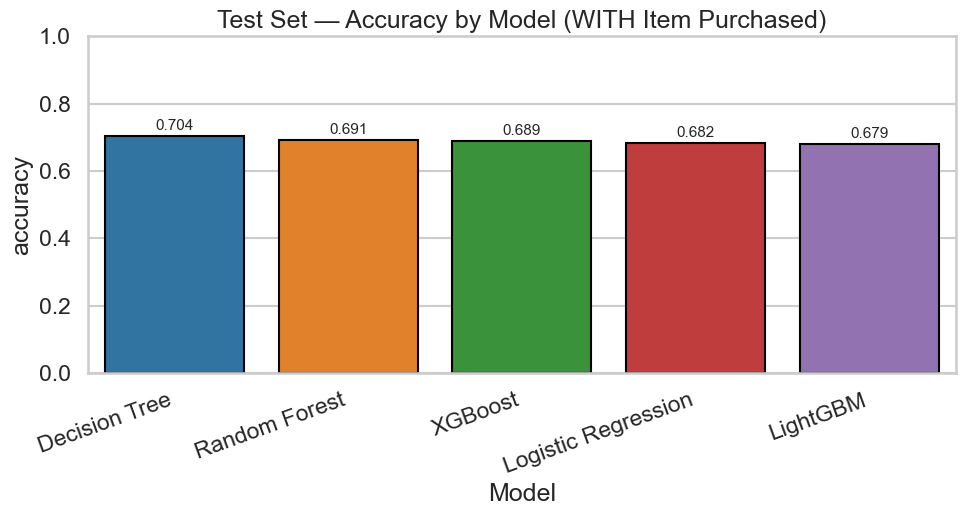

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_accuracy.png


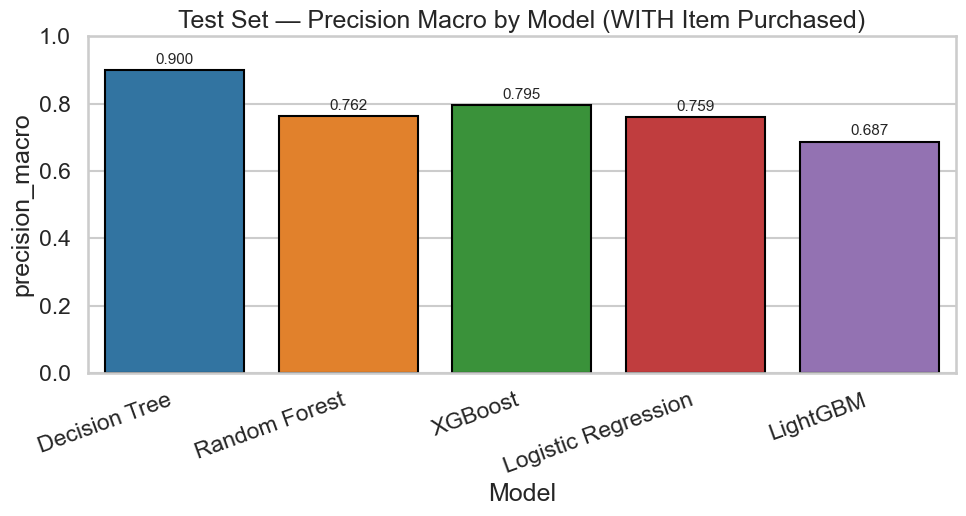

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_precision_macro.png


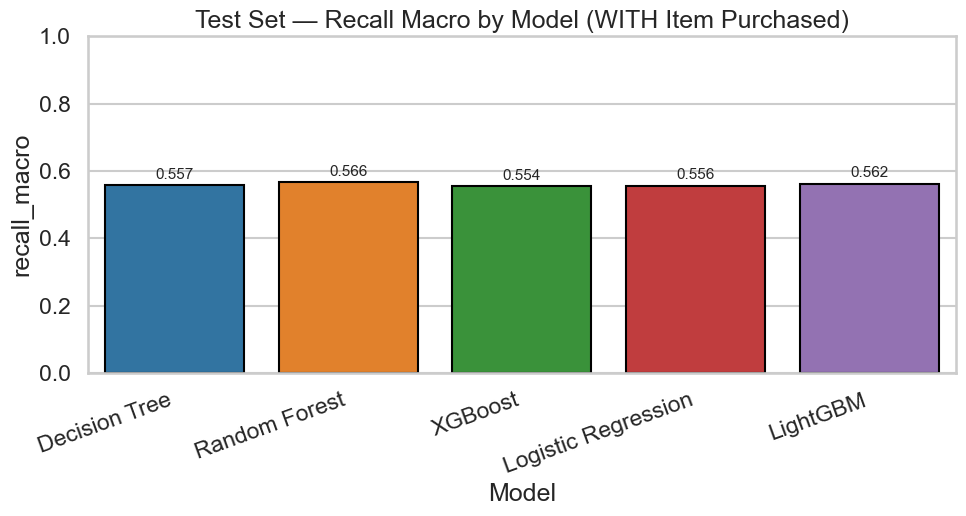

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_recall_macro.png


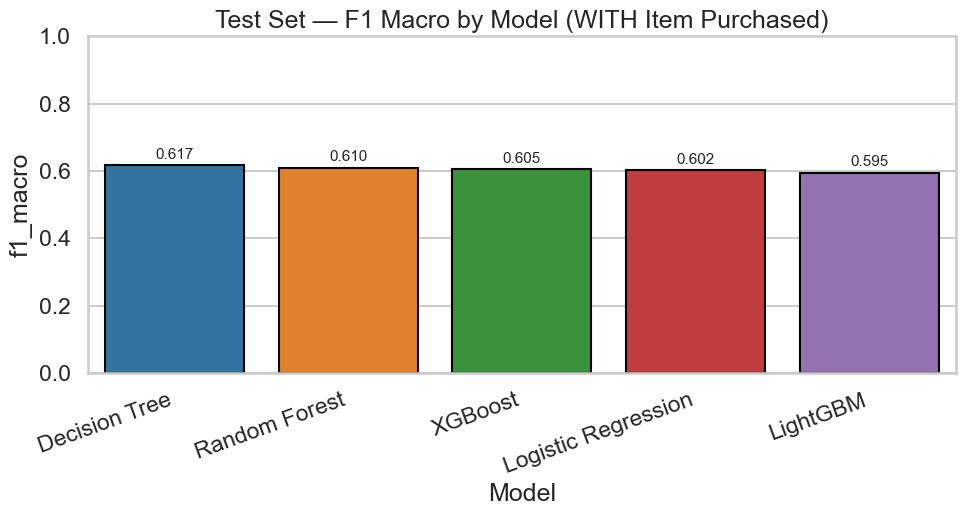

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_f1_macro.png


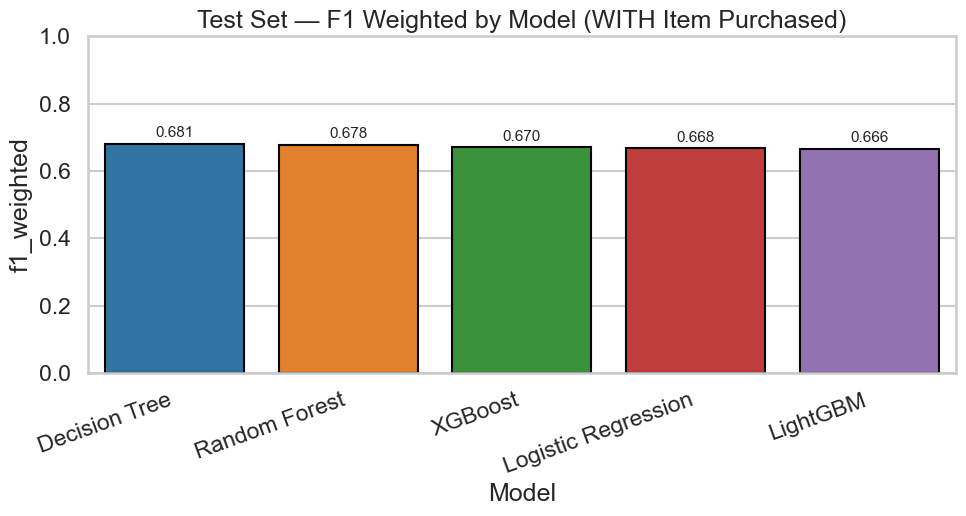

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_f1_weighted.png


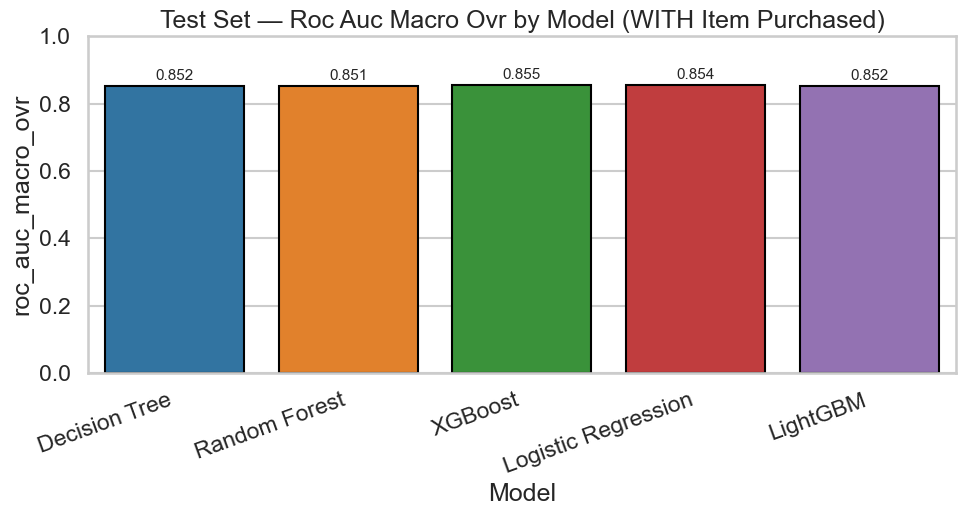

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_roc_auc_macro_ovr.png


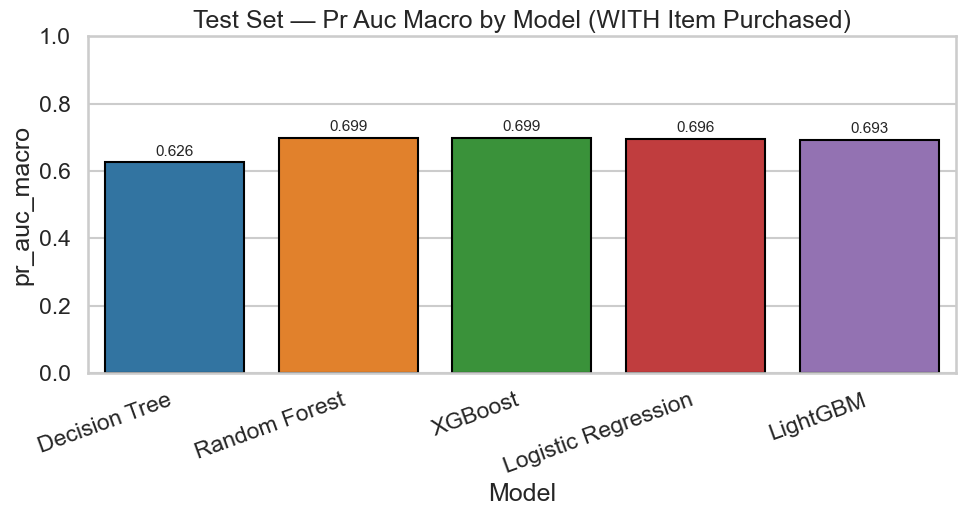

[Stage 11] Saved: figures\final\WITH_Item_Purchased_test_pr_auc_macro.png


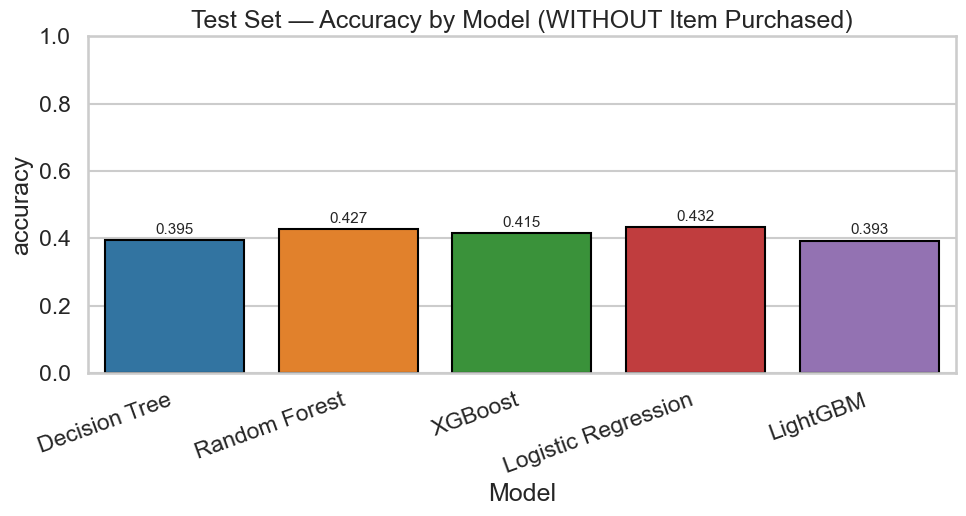

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_accuracy.png


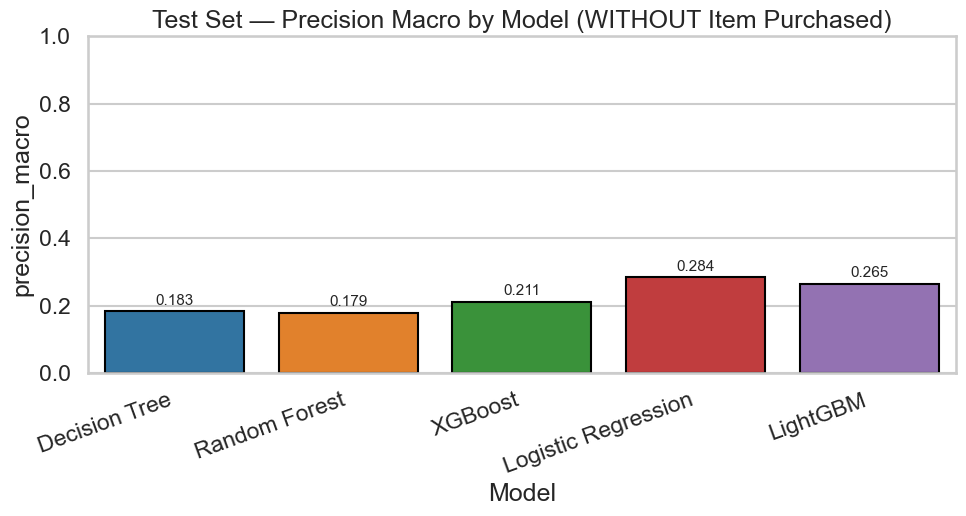

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_precision_macro.png


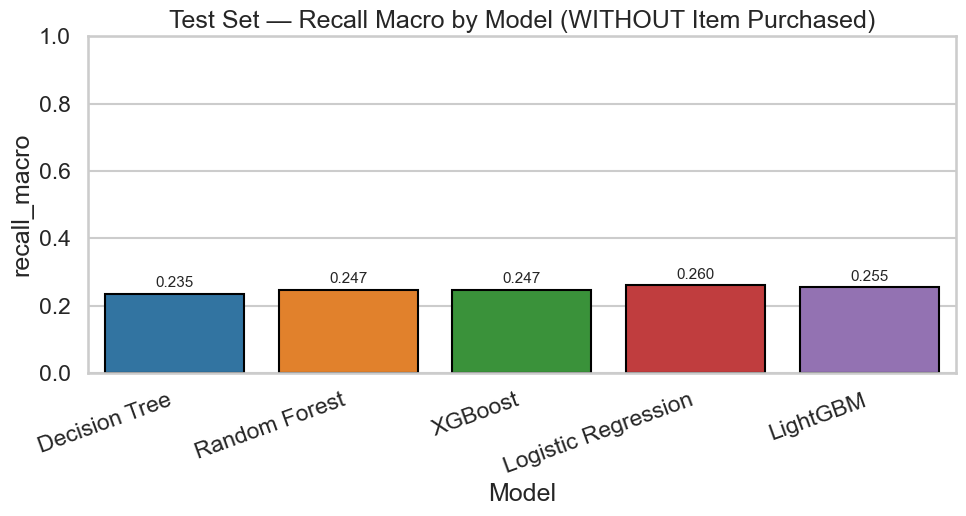

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_recall_macro.png


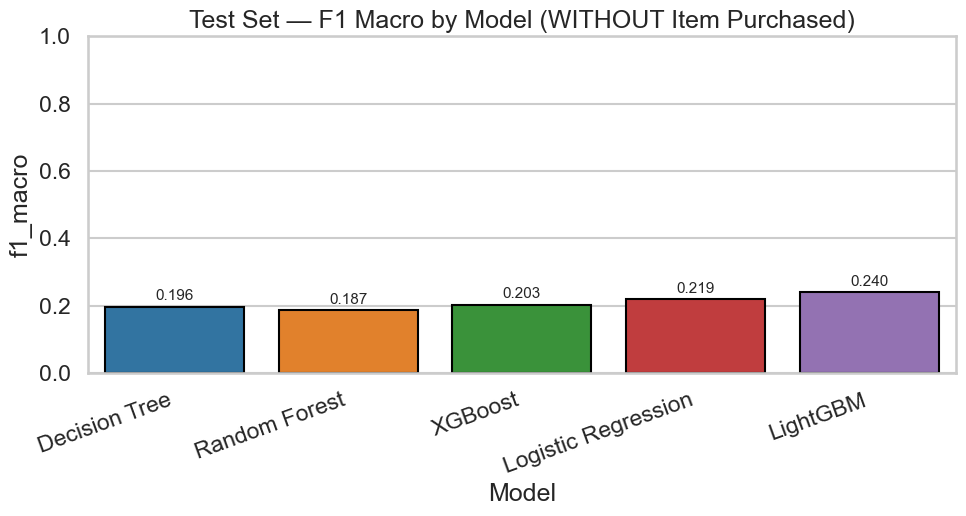

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_f1_macro.png


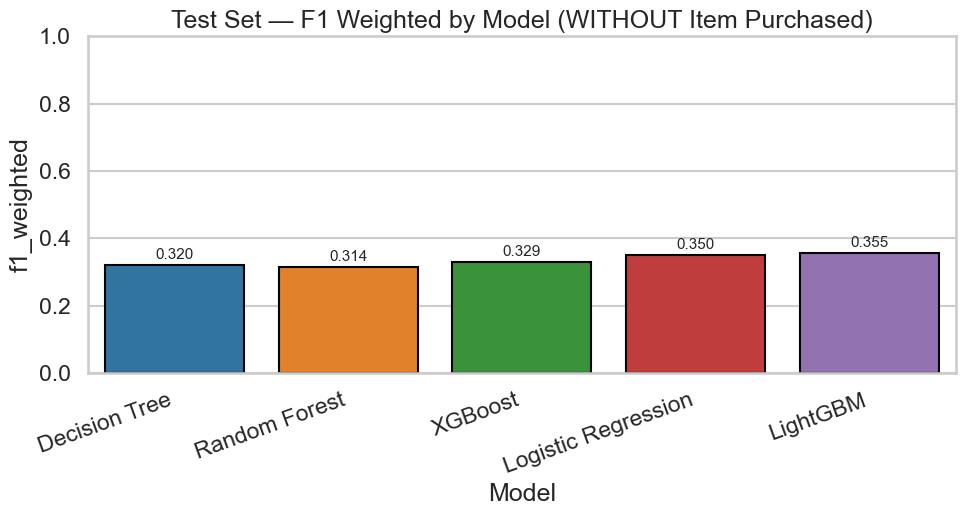

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_f1_weighted.png


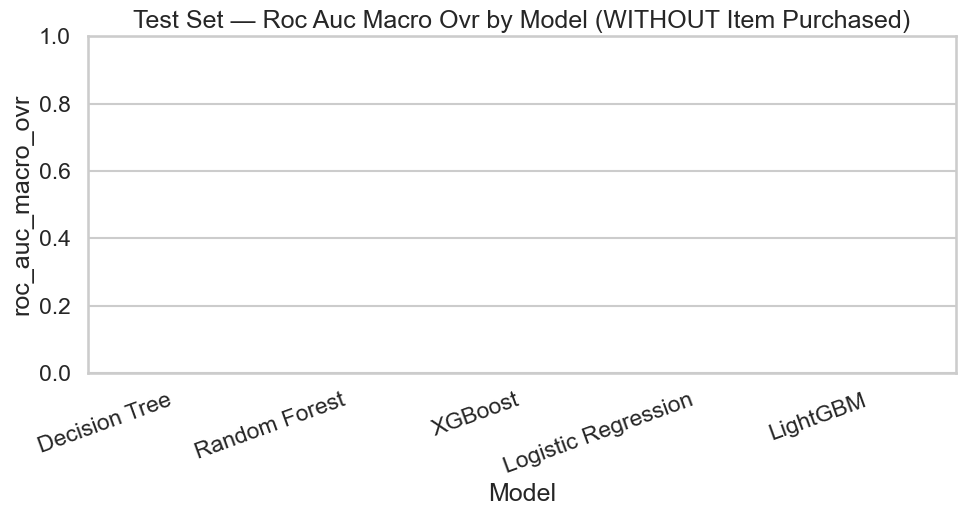

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_roc_auc_macro_ovr.png


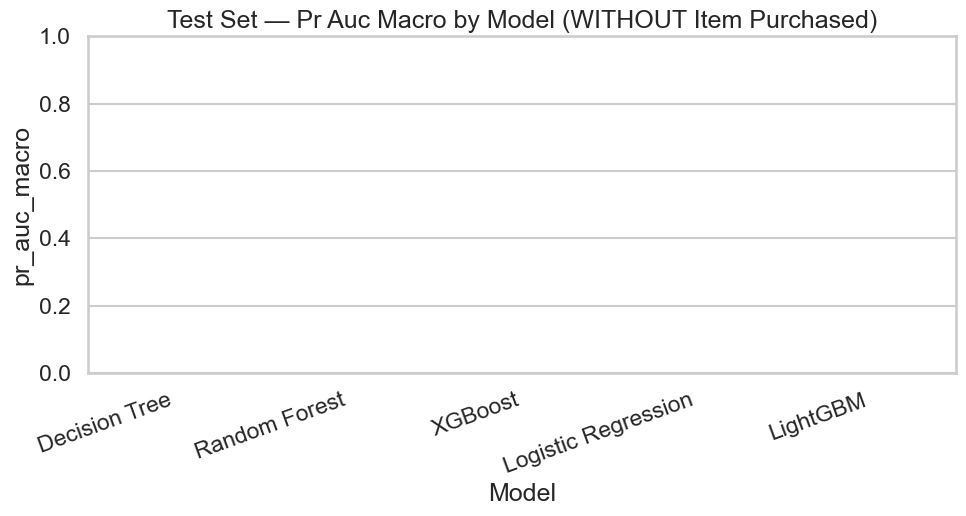

[Stage 11] Saved: figures\final\WITHOUT_Item_Purchased_test_pr_auc_macro.png

[Stage 11] Creating WITH vs WITHOUT comparison charts...


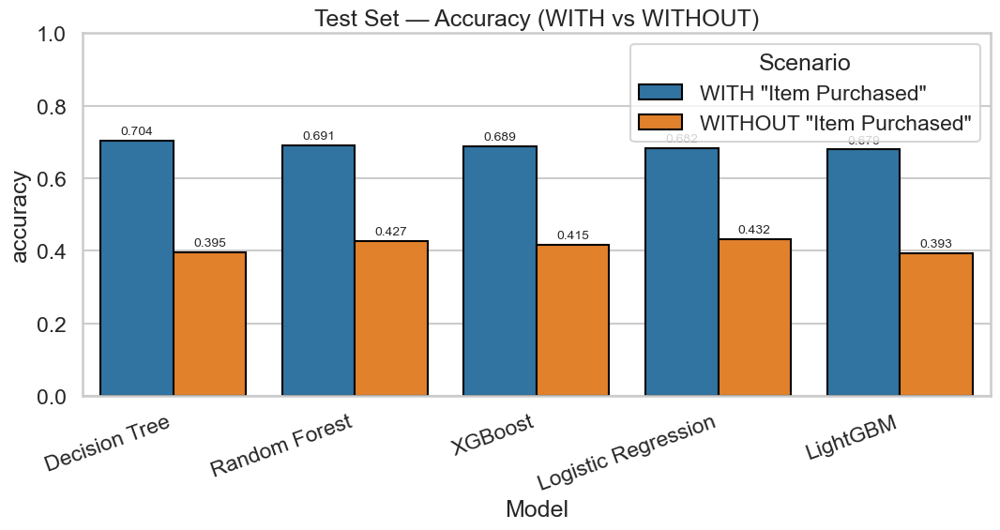

[Stage 11] Saved: figures\final\COMPARE_test_accuracy.png


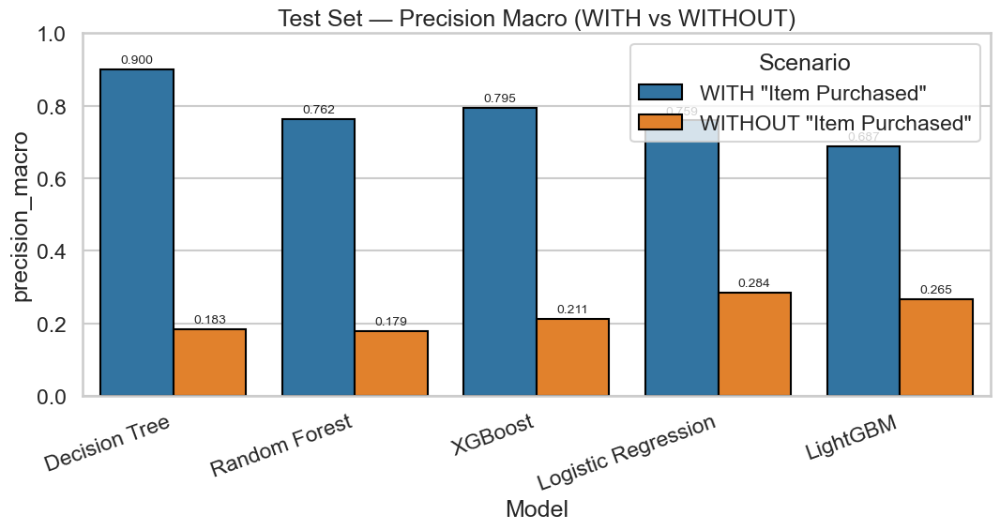

[Stage 11] Saved: figures\final\COMPARE_test_precision_macro.png


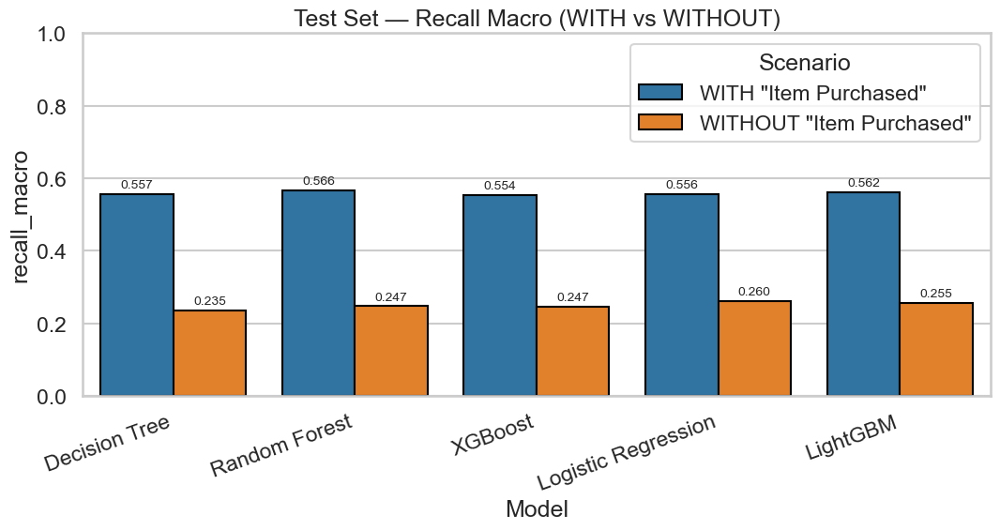

[Stage 11] Saved: figures\final\COMPARE_test_recall_macro.png


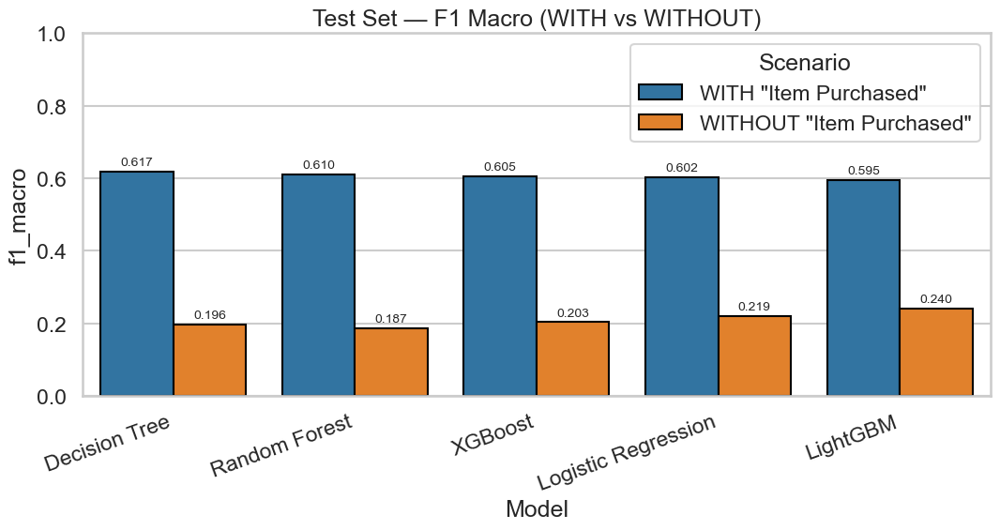

[Stage 11] Saved: figures\final\COMPARE_test_f1_macro.png


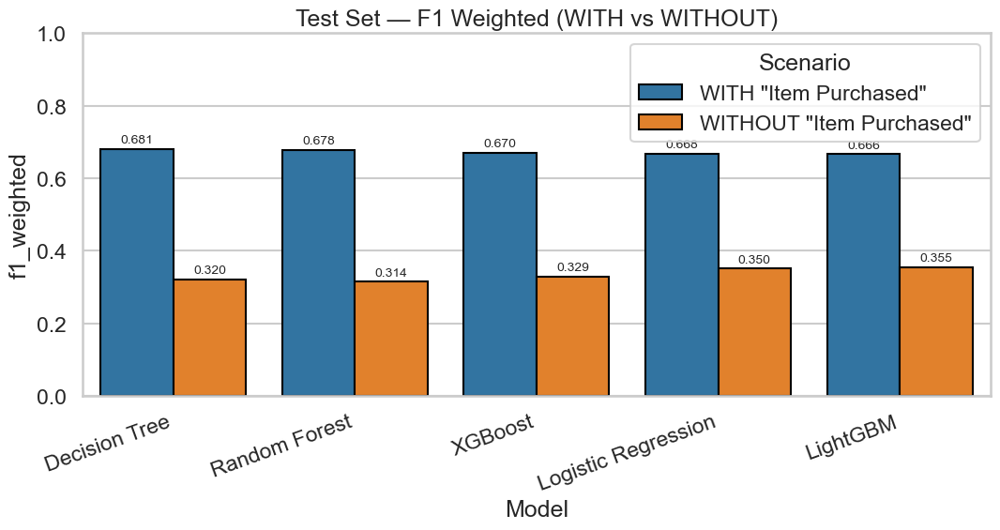

[Stage 11] Saved: figures\final\COMPARE_test_f1_weighted.png


,Scenario,Best model,macro-F1,Accuracy
0,"WITH ""Item Purchased""",Decision Tree,0.617,0.704
1,"WITHOUT ""Item Purchased""",LightGBM,0.240,0.393



[Stage 11] Saved Excel workbook: tables\final_report_tables.xlsx
[Stage 11] Saved final figures to: figures\final


In [29]:
# =============================================================================
# STAGE 11 - FINAL ASSETS + WITH vs WITHOUT “Item Purchased” COMPARISON
# =============================================================================
# Goal:
# What happens here:
#  1) Load the final results tables created in earlier stages (no retraining).
#  2) Print readable summary tables in the notebook.
#  3) Save consistent charts for each metric (WITH, WITHOUT, and comparison).
#  4) Export one Excel workbook containing the key reporting tables.
# =============================================================================

import os
import pathlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# -----------------------------------------------------------------------------
# 0) Visual style (consistent and dissertation-friendly)
# -----------------------------------------------------------------------------
sns.set_context("talk")
sns.set_style("whitegrid")
PALETTE = sns.color_palette()

# -----------------------------------------------------------------------------
# 1) Create output folders (so we don’t lose any files)
# -----------------------------------------------------------------------------
# Non-technical note: keeping outputs in predictable folders makes submission easy.
FIG_OUT = pathlib.Path("figures/final")
TAB_OUT = pathlib.Path("tables")
FIG_OUT.mkdir(parents=True, exist_ok=True)
TAB_OUT.mkdir(parents=True, exist_ok=True)

# -----------------------------------------------------------------------------
# 2) Define where the already-generated results should be located
# -----------------------------------------------------------------------------
# Non-technical note:
# - WITH scenario uses tables/...
# - WITHOUT scenario uses without/tables/... (your snapshot folder)
WITH_DIR = pathlib.Path("tables")
WITHOUT_DIR = pathlib.Path("without/tables")

WITH_TEST_PATH = WITH_DIR / "final_test_metrics_wide.csv"
WO_TEST_PATH   = WITHOUT_DIR / "final_test_metrics_wide.csv"

# Optional “nice-to-have” tables (only displayed/exported if present)
WITH_BASELINE_PATH = WITH_DIR / "baseline_vs_models.csv"
WITH_STATS_PATH    = WITH_DIR / "stats_tests.csv"
WITH_RANKS_PATH    = WITH_DIR / "feature_ranks.csv"

# -----------------------------------------------------------------------------
# 3) Define the key performance metrics we want to report
# -----------------------------------------------------------------------------
# Non-technical note: these are standard classification metrics on a 0–1 scale.
METRICS = [
    "accuracy",
    "precision_macro",
    "recall_macro",
    "f1_macro",
    "f1_weighted",
    "roc_auc_macro_ovr",
    "pr_auc_macro",
]

# -----------------------------------------------------------------------------
# 4) Helper: load CSV safely (prints status so you can confirm what loaded)
# -----------------------------------------------------------------------------
def load_csv(path: pathlib.Path, label: str):
    """Load a CSV if it exists and print what was loaded."""
    if not path.exists():
        print(f"[Stage 11] NOTE: {label} not found at: {path}")
        return None
    df = pd.read_csv(path)
    print(f"[Stage 11] Loaded {label}: {path} | rows={len(df):,}, cols={df.shape[1]}")
    return df

# -----------------------------------------------------------------------------
# 5) Helper: clean a metrics table so charts and summaries are reliable
# -----------------------------------------------------------------------------
def prepare_metrics_table(df: pd.DataFrame, metrics: list):
    """
    Non-technical note:
    This step makes sure performance columns behave as numeric values for charts.
    Any non-numeric entries become missing values (NaN) rather than breaking output.
    """
    if df is None:
        return None

    # Keep only Model + the metric columns that actually exist in the file
    keep_cols = ["Model"] + [m for m in metrics if m in df.columns]
    out = df[keep_cols].copy()

    # Convert metric columns to numbers (invalid values become NaN)
    for m in metrics:
        if m in out.columns:
            out[m] = pd.to_numeric(out[m], errors="coerce")

    return out

# -----------------------------------------------------------------------------
# 6) Helper: display a clean table without crashing on mixed types
# -----------------------------------------------------------------------------
def display_table(df: pd.DataFrame, caption: str, decimals: int = 3):
    """
    Non-technical note:
    We show '-' for missing values and only format numeric columns as decimals.
    """
    if df is None or df.empty:
        print(f"[Stage 11] NOTE: Nothing to display for: {caption}")
        return

    # Identify numeric columns only (safe to format as floats)
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    fmt = {c: f"{{:.{decimals}f}}" for c in numeric_cols}

    styled = df.style.format(fmt, na_rep="-").set_caption(caption)
    display(styled)

# -----------------------------------------------------------------------------
# 7) Helper: save a single-metric bar chart (per scenario)
# -----------------------------------------------------------------------------
def save_single_metric_bar(df: pd.DataFrame, metric: str, scenario_tag: str, order: list):
    """Save and display a bar chart for one metric within one scenario."""
    if df is None or metric not in df.columns:
        return

    # Keep model order only for models that exist in this table
    order = [m for m in order if m in df["Model"].tolist()]
    if not order:
        order = df["Model"].tolist()

    plt.figure(figsize=(10, 5.5))
    ax = sns.barplot(
        data=df, x="Model", y=metric, order=order,
        edgecolor="black", palette=PALETTE
    )
    plt.ylim(0, 1)
    plt.xticks(rotation=20, ha="right")
    plt.title(f"Test Set — {metric.replace('_',' ').title()} by Model ({scenario_tag})")

    # Add numeric labels above bars (only if the value exists)
    vals = df.set_index("Model").loc[order, metric].values
    for i, v in enumerate(vals):
        if pd.notnull(v) and np.isfinite(v):
            ax.text(i, v + 0.01, f"{v:.3f}", ha="center", va="bottom", fontsize=11)

    plt.tight_layout()
    outpath = FIG_OUT / f"{scenario_tag.replace(' ','_')}_test_{metric}.png"
    plt.savefig(outpath, dpi=220)
    plt.show()
    print(f"[Stage 11] Saved: {outpath}")

# -----------------------------------------------------------------------------
# 8) Helper: save a WITH vs WITHOUT comparison chart (grouped bars)
# -----------------------------------------------------------------------------
def save_compare_metric_bar(with_df: pd.DataFrame, wo_df: pd.DataFrame, metric: str, order: list):
    """Save and display a grouped bar chart comparing WITH vs WITHOUT."""
    if with_df is None or wo_df is None:
        return
    if metric not in with_df.columns or metric not in wo_df.columns:
        return

    # Combine into one table for plotting
    both = pd.concat(
        [
            with_df.assign(Scenario='WITH "Item Purchased"'),
            wo_df.assign(Scenario='WITHOUT "Item Purchased"'),
        ],
        ignore_index=True
    )

    order = [m for m in order if m in with_df["Model"].tolist()]
    if not order:
        order = with_df["Model"].tolist()

    plt.figure(figsize=(11, 6))
    ax = sns.barplot(
        data=both, x="Model", y=metric, hue="Scenario",
        order=order, edgecolor="black", palette=PALETTE
    )
    plt.ylim(0, 1)
    plt.xticks(rotation=20, ha="right")
    plt.title(f"Test Set — {metric.replace('_',' ').title()} (WITH vs WITHOUT)")

    # Label bars (only if numeric and present)
    for p in ax.patches:
        h = p.get_height()
        if pd.notnull(h) and np.isfinite(h) and h > 0:
            ax.text(p.get_x() + p.get_width()/2, h + 0.01, f"{h:.3f}",
                    ha="center", va="bottom", fontsize=10)

    plt.tight_layout()
    outpath = FIG_OUT / f"COMPARE_test_{metric}.png"
    plt.savefig(outpath, dpi=220)
    plt.show()
    print(f"[Stage 11] Saved: {outpath}")

# -----------------------------------------------------------------------------
# 9) Helper: pick best model in a scenario (headline result)
# -----------------------------------------------------------------------------
def best_model_summary(df: pd.DataFrame):
    """
    Non-technical note:
    We choose the “best” using macro-F1 (fair across all classes),
    otherwise fall back to accuracy if macro-F1 is unavailable.
    """
    if df is None or df.empty:
        return None
    sort_col = "f1_macro" if "f1_macro" in df.columns else "accuracy"
    best = df.sort_values(sort_col, ascending=False).iloc[0]
    return {
        "Best model": best["Model"],
        "macro-F1": float(best["f1_macro"]) if "f1_macro" in df.columns and pd.notnull(best["f1_macro"]) else np.nan,
        "Accuracy": float(best["accuracy"]) if "accuracy" in df.columns and pd.notnull(best["accuracy"]) else np.nan,
    }

# -----------------------------------------------------------------------------
# 10) Load results (WITH and WITHOUT)
# -----------------------------------------------------------------------------
with_test_raw = load_csv(WITH_TEST_PATH, 'WITH test metrics (wide)')
wo_test_raw   = load_csv(WO_TEST_PATH, 'WITHOUT test metrics (wide)')

with_master = prepare_metrics_table(with_test_raw, METRICS)
wo_master   = prepare_metrics_table(wo_test_raw, METRICS) if wo_test_raw is not None else None

# Optional extras (only if present)
with_baseline = load_csv(WITH_BASELINE_PATH, "WITH baseline vs models")
with_stats    = load_csv(WITH_STATS_PATH, "WITH statistical tests")
with_ranks    = load_csv(WITH_RANKS_PATH, "WITH feature ranks")

# -----------------------------------------------------------------------------
# 11) Print key tables (so everything is visible in the notebook)
# -----------------------------------------------------------------------------
display_table(with_master, 'Master comparison (Test) — WITH "Item Purchased"')

if wo_master is not None:
    display_table(wo_master, 'Master comparison (Test) — WITHOUT "Item Purchased"')
else:
    print('[Stage 11] NOTE: WITHOUT snapshot not available — producing WITH-only outputs.')

# Print optional supporting tables (useful for appendix / transparency)
if with_baseline is not None:
    print("\n[Stage 11] Baseline vs Models (preview):")
    display(with_baseline)

if with_stats is not None:
    print("\n[Stage 11] Statistical tests (preview):")
    display(with_stats)

if with_ranks is not None:
    print("\n[Stage 11] Feature ranks (preview):")
    display(with_ranks)

# -----------------------------------------------------------------------------
# 12) Choose a consistent model order (best-to-worst using WITH macro-F1)
# -----------------------------------------------------------------------------
if with_master is not None and "f1_macro" in with_master.columns:
    model_order = with_master.sort_values("f1_macro", ascending=False)["Model"].tolist()
else:
    model_order = with_master["Model"].tolist() if with_master is not None else []

# -----------------------------------------------------------------------------
# 13) Save per-scenario charts for each metric
# -----------------------------------------------------------------------------
print("\n[Stage 11] Creating per-scenario metric charts...")

if with_master is not None:
    for m in METRICS:
        save_single_metric_bar(with_master, m, "WITH Item Purchased", model_order)

if wo_master is not None:
    for m in METRICS:
        save_single_metric_bar(wo_master, m, "WITHOUT Item Purchased", model_order)

# -----------------------------------------------------------------------------
# 14) Save WITH vs WITHOUT comparison charts (only where possible)
# -----------------------------------------------------------------------------
if wo_master is not None:
    print("\n[Stage 11] Creating WITH vs WITHOUT comparison charts...")
    for m in METRICS:
        # Only plot if WITHOUT has at least one real number for that metric
        if m in wo_master.columns and wo_master[m].notna().any():
            save_compare_metric_bar(with_master, wo_master, m, model_order)

# -----------------------------------------------------------------------------
# 15) Executive summary (best model per scenario)
# -----------------------------------------------------------------------------
summary_rows = []
if with_master is not None:
    summary_rows.append({"Scenario": 'WITH "Item Purchased"', **best_model_summary(with_master)})
if wo_master is not None:
    summary_rows.append({"Scenario": 'WITHOUT "Item Purchased"', **best_model_summary(wo_master)})

summary_df = pd.DataFrame(summary_rows)
if not summary_df.empty:
    display_table(summary_df, "Executive Summary — Best model per scenario")

# -----------------------------------------------------------------------------
# 16) Export Excel workbook for reporting
# -----------------------------------------------------------------------------
# Non-technical note: this produces a single file you can attach or reuse in write-up.
excel_path = TAB_OUT / "final_report_tables.xlsx"

with pd.ExcelWriter(excel_path, engine="openpyxl") as xw:
    if with_master is not None:
        with_master.to_excel(xw, sheet_name="WITH_Master_Test", index=False, na_rep="-")
    if wo_master is not None:
        wo_master.to_excel(xw, sheet_name="WITHOUT_Master_Test", index=False, na_rep="-")
    if not summary_df.empty:
        summary_df.to_excel(xw, sheet_name="Summary", index=False, na_rep="-")
    if with_baseline is not None:
        with_baseline.to_excel(xw, sheet_name="Baseline_vs_Models", index=False, na_rep="-")
    if with_stats is not None:
        with_stats.to_excel(xw, sheet_name="Stats_Tests", index=False, na_rep="-")
    if with_ranks is not None:
        with_ranks.to_excel(xw, sheet_name="Feature_Ranks", index=False, na_rep="-")

print(f"\n[Stage 11] Saved Excel workbook: {excel_path}")
print(f"[Stage 11] Saved final figures to: {FIG_OUT}")

### STAGE 12 - REFINEMENTS & CREDIBILITY CHECKS (WITH vs WITHOUT "Item Purchased")


STAGE 12 RUNNING SCENARIO: WITH

[Stage 12] Training model: Decision Tree (WITH)
[Stage 12] Generating test predictions: Decision Tree (WITH)

[Stage 12] Training model: Random Forest (WITH)
[Stage 12] Generating test predictions: Random Forest (WITH)

[Stage 12] Training model: Logistic Regression (WITH)
[Stage 12] Generating test predictions: Logistic Regression (WITH)

[Stage 12] Training model: XGBoost (WITH)
[Stage 12] Generating test predictions: XGBoost (WITH)

[Stage 12] Training model: LightGBM (WITH)
[Stage 12] Generating test predictions: LightGBM (WITH)

[Stage 12] Test performance table:
              Model  accuracy  precision_macro  recall_macro  f1_macro  f1_weighted
      Decision Tree     0.704            0.900         0.557     0.617        0.681
           LightGBM     0.665            0.682         0.554     0.587        0.655
Logistic Regression     0.682            0.759         0.556     0.602        0.668
      Random Forest     0.685            0.769         

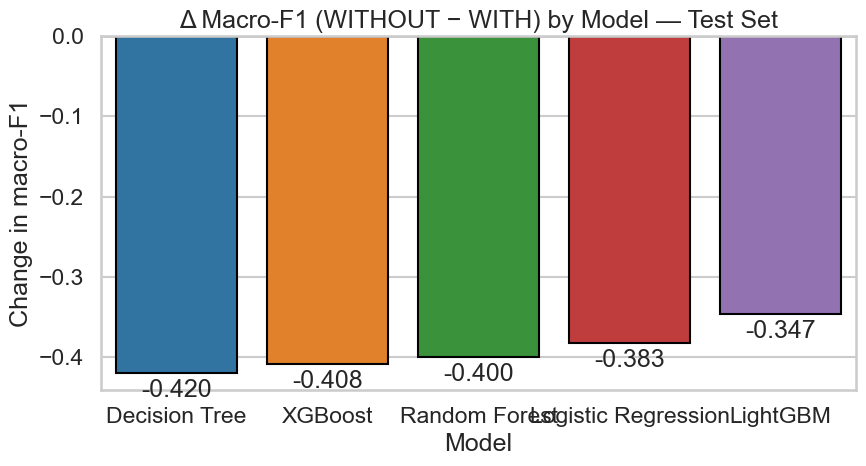

[Stage 12] Saved: figures/s12_delta_f1_macro.png

STAGE 12 BOOTSTRAP CONFIDENCE INTERVALS (UNCERTAINTY RANGES)

[Stage 12] Bootstrapping: Decision Tree (WITH)

[Stage 12] Bootstrapping: Random Forest (WITH)

[Stage 12] Bootstrapping: Logistic Regression (WITH)

[Stage 12] Bootstrapping: XGBoost (WITH)

[Stage 12] Bootstrapping: LightGBM (WITH)
[Stage 12] Saved: tables/s12_bootstrap_ci_with.csv


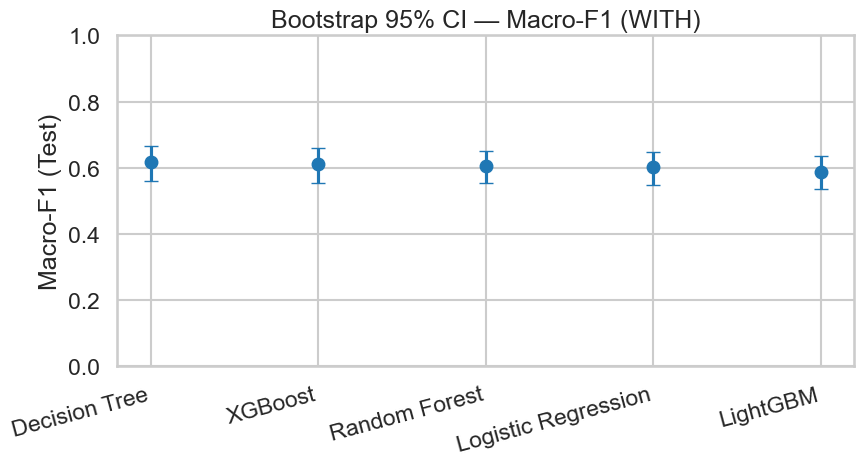

[Stage 12] Saved: figures/s12_bootstrap_ci_f1_with.png

[Stage 12] Bootstrapping: Decision Tree (WITHOUT)

[Stage 12] Bootstrapping: Random Forest (WITHOUT)

[Stage 12] Bootstrapping: Logistic Regression (WITHOUT)

[Stage 12] Bootstrapping: XGBoost (WITHOUT)

[Stage 12] Bootstrapping: LightGBM (WITHOUT)
[Stage 12] Saved: tables/s12_bootstrap_ci_without.csv


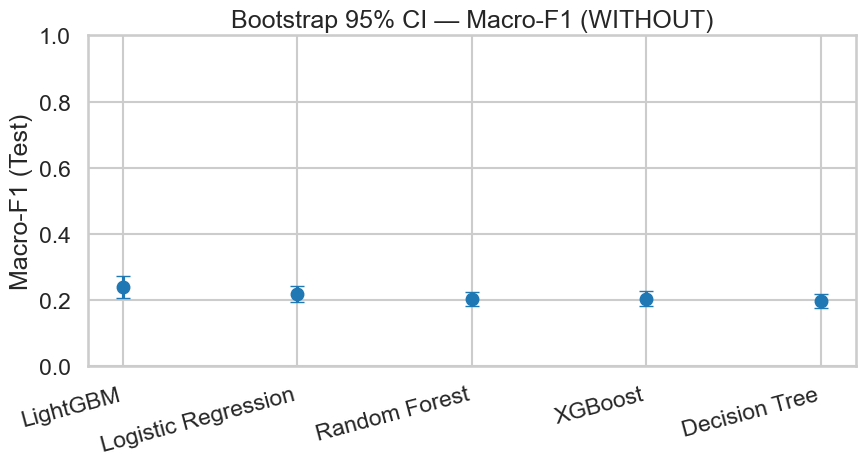

[Stage 12] Saved: figures/s12_bootstrap_ci_f1_without.png

STAGE 12 MCNEMAR TESTS (PAIRWISE SIGNIFICANCE)

[Stage 12] McNemar within WITH: Decision Tree vs XGBoost
Scenario       model_A model_B  b(A✓,B✗)  c(A✗,B✓)  n  p_mcnemar
    WITH Decision Tree XGBoost        12         5 17     0.1435
[Stage 12] Saved: tables/s12_mcnemar_top2_with.csv


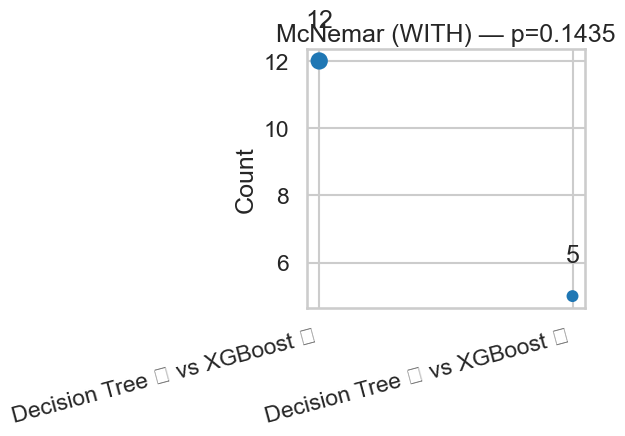

[Stage 12] Saved: figures/s12_mcnemar_bubble_with.png

[Stage 12] McNemar within WITHOUT: LightGBM vs Logistic Regression
Scenario  model_A             model_B  b(A✓,B✗)  c(A✗,B✓)   n  p_mcnemar
 WITHOUT LightGBM Logistic Regression        66        89 155     0.0769
[Stage 12] Saved: tables/s12_mcnemar_top2_without.csv


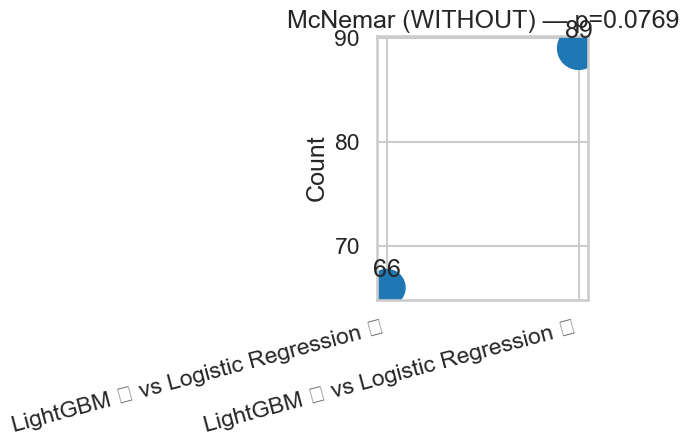

[Stage 12] Saved: figures/s12_mcnemar_bubble_without.png

[Stage 12] McNemar cross-scenario (same model WITH vs WITHOUT):
              Model  b(A✓,B✗)  c(A✗,B✓)   n  p_mcnemar
      Decision Tree       195        14 209        0.0
            XGBoost       186        24 210        0.0
      Random Forest       159        20 179        0.0
           LightGBM       197        38 235        0.0
Logistic Regression       175        29 204        0.0
[Stage 12] Saved: tables/s12_mcnemar_same_model_with_vs_without.csv

STAGE 12 OPTIONAL SLICE PARITY CHECKS

[Stage 12] Slice parity (WITH) — Gender | gap=0.021
 level  support  macro_f1
Female      200     0.599
  Male      385     0.619
[Stage 12] Saved: tables/s12_parity_Gender_with.csv


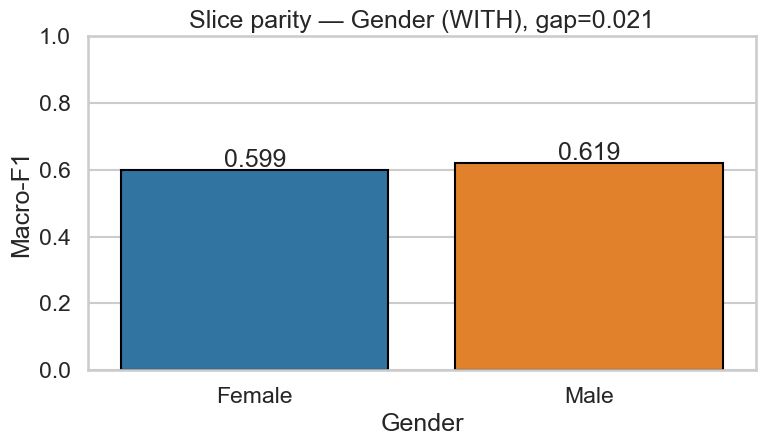

[Stage 12] Saved: figures/s12_parity_Gender_with.png

[Stage 12] Slice parity (WITH) — Season | gap=0.125
 level  support  macro_f1
Summer      138     0.536
Winter      145     0.610
  Fall      154     0.649
Spring      148     0.662
[Stage 12] Saved: tables/s12_parity_Season_with.csv


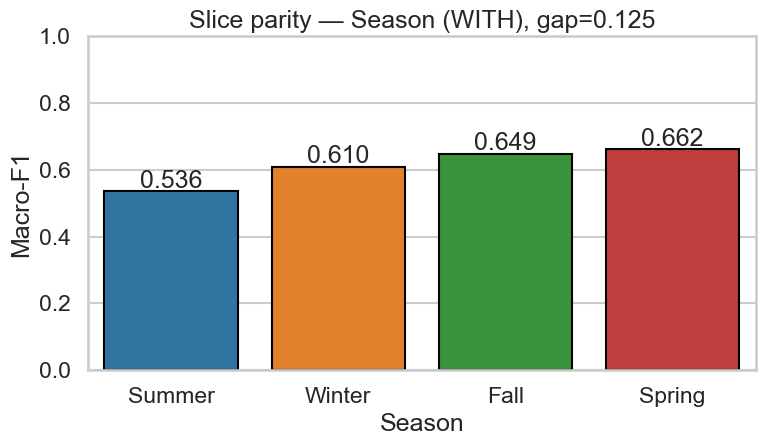

[Stage 12] Saved: figures/s12_parity_Season_with.png

[Stage 12] Slice parity (WITH) — Location | gap=0.733
        level  support  macro_f1
   New Mexico        6     0.267
       Nevada       14     0.296
West Virginia        7     0.303
     Delaware       10     0.304
     Nebraska       12     0.407
     New York       11     0.450
  Mississippi       14     0.451
 North Dakota       10     0.469
    Louisiana       16     0.516
        Maine       10     0.525
      Montana       14     0.548
   California       10     0.552
    Minnesota       11     0.571
        Other      385     0.622
     Maryland       13     0.683
     Arkansas       10     0.700
         Ohio        8     0.714
        Idaho       17     0.808
     Illinois        7     1.000
[Stage 12] Saved: tables/s12_parity_Location_with.csv


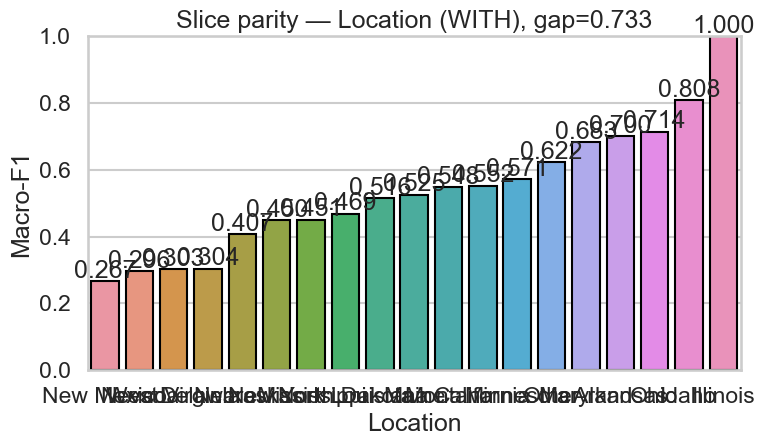

[Stage 12] Saved: figures/s12_parity_Location_with.png

[Stage 12] Slice parity (WITHOUT) — Gender | gap=0.019
 level  support  macro_f1
Female      200     0.225
  Male      385     0.244
[Stage 12] Saved: tables/s12_parity_Gender_without.csv


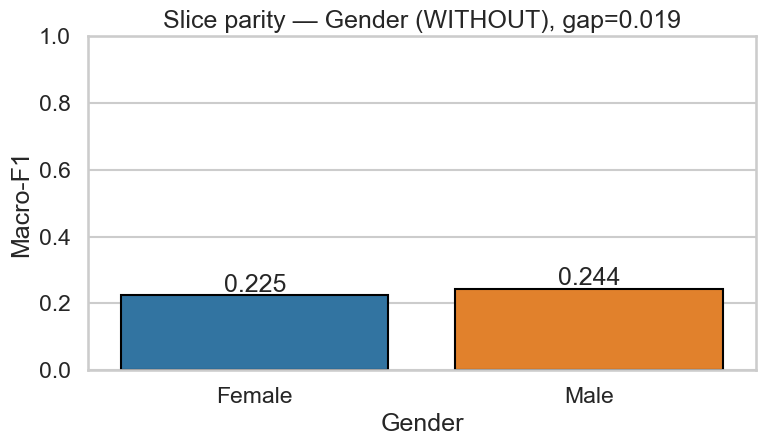

[Stage 12] Saved: figures/s12_parity_Gender_without.png

[Stage 12] Slice parity (WITHOUT) — Season | gap=0.083
 level  support  macro_f1
Spring      148     0.211
Summer      138     0.221
Winter      145     0.225
  Fall      154     0.293
[Stage 12] Saved: tables/s12_parity_Season_without.csv


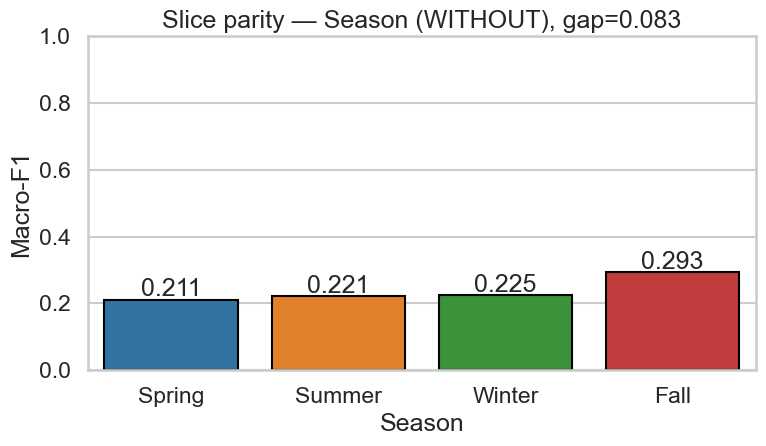

[Stage 12] Saved: figures/s12_parity_Season_without.png

[Stage 12] Slice parity (WITHOUT) — Location | gap=0.500
        level  support  macro_f1
        Maine       10     0.083
       Nevada       14     0.107
     Maryland       13     0.133
West Virginia        7     0.150
        Idaho       17     0.152
     Delaware       10     0.208
     Arkansas       10     0.217
    Louisiana       16     0.232
        Other      385     0.236
    Minnesota       11     0.237
         Ohio        8     0.238
   New Mexico        6     0.244
   California       10     0.265
  Mississippi       14     0.279
 North Dakota       10     0.308
      Montana       14     0.309
     Nebraska       12     0.338
     New York       11     0.351
     Illinois        7     0.583
[Stage 12] Saved: tables/s12_parity_Location_without.csv


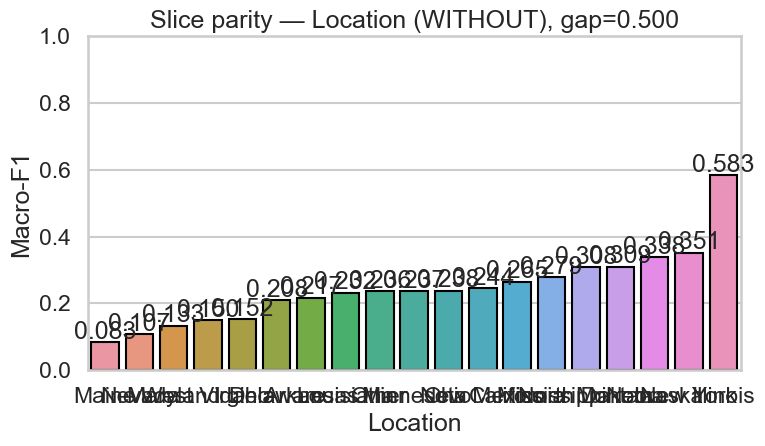

[Stage 12] Saved: figures/s12_parity_Location_without.png

[Stage 12] Credibility checks complete — tables/figures saved in /tables and /figures.


In [24]:
# =============================================================================
# STAGE 12 - Refinements & Credibility Checks (WITH vs WITHOUT "Item Purchased")
# =============================================================================
# This stage checks whether our conclusions are trustworthy.
# We compare model behaviour in two situations:
#   1) WITH  "Item Purchased"  (the strongest predictor is available)
#   2) WITHOUT "Item Purchased" (we remove it to test reliance / sensitivity)
#
# What we produce:
#   - Test metrics per model per scenario
#   - Cross-scenario deltas (WITHOUT minus WITH)
#   - Bootstrap confidence intervals (uncertainty ranges)
#   - McNemar tests (is one model truly different from another?)
#   - Optional slice parity checks (do results vary by groups like Gender/Season?)
# =============================================================================

import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.pipeline import Pipeline
from scipy.stats import binomtest

sns.set_context("talk")
sns.set_style("whitegrid")

# -----------------------------------------------------------------------------
# 1) Create folders so results are saved in a predictable place
# -----------------------------------------------------------------------------
os.makedirs("tables", exist_ok=True)
os.makedirs("figures", exist_ok=True)

# -----------------------------------------------------------------------------
# 2) Confirm required inputs exist (these come from your earlier stages)
# -----------------------------------------------------------------------------
# Non-technical note: this ensures we are evaluating the exact same training/test split.
assert "outputs" in globals(), "Stage 12 requires Stage outputs in memory (X_train/X_test/y_train/y_test/preprocessor)."

X_train, X_test = outputs["X_train"], outputs["X_test"]
y_train, y_test = outputs["y_train"], outputs["y_test"]
preprocessor    = outputs["preprocessor"]  # design ColumnTransformer (unfitted)
classes         = list(outputs["classes"])

FINALISTS = ["Decision Tree","Random Forest","Logistic Regression","XGBoost","LightGBM"]
DROP_COLS = ["Item Purchased"]  # removed only in the WITHOUT scenario

METRICS = ["accuracy","precision_macro","recall_macro","f1_macro","f1_weighted"]

# -----------------------------------------------------------------------------
# 3) Helper: safely drop columns from the ColumnTransformer design
# -----------------------------------------------------------------------------
# Non-technical note: this lets us run the same workflow, with one column removed.
def drop_features_from_preprocessor(design_ct: ColumnTransformer, drops):
    ct = copy.deepcopy(design_ct)
    new_transformers = []
    drop_set = set(drops)

    for name, trans, cols in ct.transformers:
        # If transformer uses no explicit columns, keep it unchanged
        if cols in (None, "drop", "passthrough"):
            new_transformers.append((name, trans, cols))
        else:
            # Remove dropped columns from the list
            remain = [c for c in list(cols) if c not in drop_set]
            new_transformers.append((name, trans, remain))

    return ColumnTransformer(
        new_transformers,
        remainder=ct.remainder,
        sparse_threshold=ct.sparse_threshold,
        n_jobs=ct.n_jobs,
        transformer_weights=ct.transformer_weights,
        verbose=ct.verbose,
    )

preproc_WITH    = preprocessor
preproc_WITHOUT = drop_features_from_preprocessor(preprocessor, DROP_COLS)

# -----------------------------------------------------------------------------
# 4) Helper: build the finalist model pipelines (same hyperparameters as before)
# -----------------------------------------------------------------------------
# Non-technical note: we are not “tuning again” — we reuse your fixed finalists.
def build_finalists(preproc, n_classes):
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.linear_model import LogisticRegression

    # Optional libraries
    try:
        from xgboost import XGBClassifier
        has_xgb = True
    except Exception:
        has_xgb = False

    try:
        from lightgbm import LGBMClassifier
        has_lgbm = True
    except Exception:
        has_lgbm = False

    rng = 42
    models = {}

    models["Decision Tree"] = Pipeline([
        ("prep", preproc),
        ("balance", "passthrough"),
        ("clf", DecisionTreeClassifier(max_depth=8, random_state=rng))
    ])

    models["Random Forest"] = Pipeline([
        ("prep", preproc),
        ("balance", "passthrough"),
        ("clf", RandomForestClassifier(
            n_estimators=600, max_depth=20,
            class_weight="balanced",
            n_jobs=-1, random_state=rng
        ))
    ])

    models["Logistic Regression"] = Pipeline([
        ("prep", preproc),
        ("balance", "passthrough"),
        ("clf", LogisticRegression(
            C=0.5, solver="lbfgs",
            multi_class="multinomial",
            max_iter=2000,
            random_state=rng
        ))
    ])

    if has_xgb:
        models["XGBoost"] = Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", XGBClassifier(
                objective="multi:softprob",
                num_class=n_classes,
                eval_metric="mlogloss",
                n_estimators=300,
                max_depth=4,
                learning_rate=0.05,
                tree_method="hist",
                n_jobs=-1,
                random_state=rng
            ))
        ])

    if has_lgbm:
        models["LightGBM"] = Pipeline([
            ("prep", preproc),
            ("balance", "passthrough"),
            ("clf", LGBMClassifier(
                objective="multiclass",
                num_class=n_classes,
                n_estimators=400,
                num_leaves=31,
                learning_rate=0.05,
                min_child_samples=40,
                n_jobs=-1,
                random_state=rng
            ))
        ])

    # Keep only those that exist in this environment
    return {k: v for k, v in models.items() if k in FINALISTS}

# -----------------------------------------------------------------------------
# 5) Helper: compute test metrics from predictions (no probabilities required)
# -----------------------------------------------------------------------------
def compute_metrics(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted", zero_division=0),
    }

# -----------------------------------------------------------------------------
# 6) Helper: bootstrap confidence intervals using fixed predictions
# -----------------------------------------------------------------------------
# Non-technical note: this estimates uncertainty without repeatedly retraining models.
def bootstrap_ci(y_true, y_pred, B=1000, seed=2024):
    rs = np.random.RandomState(seed)
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    n = len(y_true)

    base = compute_metrics(y_true, y_pred)
    samples = {k: [] for k in base.keys()}

    for _ in range(B):
        idx = rs.randint(0, n, n)
        m = compute_metrics(y_true[idx], y_pred[idx])
        for k, v in m.items():
            samples[k].append(v)

    rows = []
    for k, arr in samples.items():
        lo, hi = np.percentile(arr, [2.5, 97.5])
        rows.append({"Metric": k, "Test": base[k], "CI_low": lo, "CI_high": hi})
    return pd.DataFrame(rows)

# -----------------------------------------------------------------------------
# 7) Helper: McNemar test (paired comparison on the same test set)
# -----------------------------------------------------------------------------
# Non-technical note: this checks if two models differ beyond random chance.
def mcnemar(y_true, pred_A, pred_B):
    y_true = np.asarray(y_true)
    A_corr = (np.asarray(pred_A) == y_true)
    B_corr = (np.asarray(pred_B) == y_true)

    b = int((A_corr & ~B_corr).sum())  # A correct, B wrong
    c = int((~A_corr & B_corr).sum())  # A wrong, B correct
    n = b + c

    p = binomtest(min(b, c), n=n, p=0.5, alternative="two-sided").pvalue if n > 0 else np.nan
    return {"b(A✓,B✗)": b, "c(A✗,B✓)": c, "n": n, "p_mcnemar": p}

# -----------------------------------------------------------------------------
# 8) Run BOTH scenarios: fit finalists, predict, save metrics
# -----------------------------------------------------------------------------
scenarios = {
    "WITH": preproc_WITH,
    "WITHOUT": preproc_WITHOUT
}

all_metrics = {}
all_preds = {}

for scen_name, scen_preproc in scenarios.items():
    print("\n" + "="*90)
    print(f"STAGE 12 RUNNING SCENARIO: {scen_name}")
    print("="*90)

    # Build the model set for this scenario
    models = build_finalists(scen_preproc, n_classes=len(classes))

    # Fit each model and store test predictions
    preds = {}
    rows = []

    for model_name, pipe in models.items():
        print(f"\n[Stage 12] Training model: {model_name} ({scen_name})")
        pipe.fit(X_train, y_train)

        print(f"[Stage 12] Generating test predictions: {model_name} ({scen_name})")
        yhat = pipe.predict(X_test)
        preds[model_name] = yhat

        # Compute and store metrics
        m = compute_metrics(y_test, yhat)
        rows.append({"Model": model_name, **m})

    df_metrics = pd.DataFrame(rows).sort_values("Model").reset_index(drop=True)
    all_metrics[scen_name] = df_metrics
    all_preds[scen_name] = preds

    # Print table in notebook
    print("\n[Stage 12] Test performance table:")
    print(df_metrics.round(3).to_string(index=False))

    # Save table to disk
    out_csv = f"tables/s12_{scen_name.lower()}_metrics.csv"
    df_metrics.to_csv(out_csv, index=False)
    print(f"[Stage 12] Saved: {out_csv}")

# -----------------------------------------------------------------------------
# 9) Cross-scenario deltas (WITHOUT minus WITH)
# -----------------------------------------------------------------------------
print("\n" + "="*90)
print("STAGE 12 CROSS-SCENARIO DELTAS (WITHOUT − WITH)")
print("="*90)

with_df = all_metrics["WITH"].copy()
wo_df   = all_metrics["WITHOUT"].copy()

delta = wo_df.merge(with_df, on="Model", suffixes=("_wo", "_with"))

for m in METRICS:
    delta[f"Δ_{m}"] = delta[f"{m}_wo"] - delta[f"{m}_with"]

delta_out = delta[["Model"] + [f"Δ_{m}" for m in METRICS]].sort_values("Model").reset_index(drop=True)
print("\n[Stage 12] Delta table (WITHOUT − WITH):")
print(delta_out.round(3).to_string(index=False))

delta_out.to_csv("tables/s12_delta_without_minus_with.csv", index=False)
print("[Stage 12] Saved: tables/s12_delta_without_minus_with.csv")

# Plot delta macro-F1
plt.figure(figsize=(9, 5))
order = delta_out.sort_values("Δ_f1_macro")["Model"].tolist()
vals  = delta_out.set_index("Model").loc[order, "Δ_f1_macro"].values

sns.barplot(x=order, y=vals, edgecolor="black")
plt.axhline(0, color="black", lw=1)
plt.title("Δ Macro-F1 (WITHOUT − WITH) by Model — Test Set")
plt.xlabel("Model")
plt.ylabel("Change in macro-F1")

for i, v in enumerate(vals):
    plt.text(i, v + (0.01 if v >= 0 else -0.03), f"{v:+.3f}", ha="center")

plt.tight_layout()
plt.savefig("figures/s12_delta_f1_macro.png", dpi=220)
plt.show()
print("[Stage 12] Saved: figures/s12_delta_f1_macro.png")

# -----------------------------------------------------------------------------
# 10) Bootstrap confidence intervals (macro-F1 focus)
# -----------------------------------------------------------------------------
print("\n" + "="*90)
print("STAGE 12 BOOTSTRAP CONFIDENCE INTERVALS (UNCERTAINTY RANGES)")
print("="*90)

for scen_name in ["WITH", "WITHOUT"]:
    boot_rows = []
    for model_name in all_preds[scen_name].keys():
        print(f"\n[Stage 12] Bootstrapping: {model_name} ({scen_name})")
        ci = bootstrap_ci(y_test, all_preds[scen_name][model_name], B=1000, seed=2024)
        ci["Model"] = model_name
        ci["Scenario"] = scen_name
        boot_rows.append(ci)

    boot_df = pd.concat(boot_rows, ignore_index=True)
    out_csv = f"tables/s12_bootstrap_ci_{scen_name.lower()}.csv"
    boot_df.to_csv(out_csv, index=False)
    print(f"[Stage 12] Saved: {out_csv}")

    # Plot macro-F1 confidence intervals
    sub = boot_df[boot_df["Metric"] == "f1_macro"].copy()
    sub = sub.sort_values("Test", ascending=False)

    plt.figure(figsize=(9, 5))
    x = np.arange(len(sub))
    means = sub["Test"].values
    lo = sub["CI_low"].values
    hi = sub["CI_high"].values

    plt.errorbar(
        x=x, y=means,
        yerr=[means - lo, hi - means],
        fmt="o", capsize=5
    )
    plt.xticks(x, sub["Model"].tolist(), rotation=15, ha="right")
    plt.ylim(0, 1)
    plt.ylabel("Macro-F1 (Test)")
    plt.title(f"Bootstrap 95% CI — Macro-F1 ({scen_name})")
    plt.tight_layout()

    out_fig = f"figures/s12_bootstrap_ci_f1_{scen_name.lower()}.png"
    plt.savefig(out_fig, dpi=220)
    plt.show()
    print(f"[Stage 12] Saved: {out_fig}")

# -----------------------------------------------------------------------------
# 11) McNemar tests
# -----------------------------------------------------------------------------
print("\n" + "="*90)
print("STAGE 12 MCNEMAR TESTS (PAIRWISE SIGNIFICANCE)")
print("="*90)

# (A) Within each scenario: top-2 models by macro-F1
for scen_name in ["WITH", "WITHOUT"]:
    df = all_metrics[scen_name].copy()
    top2 = df.sort_values("f1_macro", ascending=False).head(2)["Model"].tolist()
    A, B = top2[0], top2[1]

    res = mcnemar(y_test, all_preds[scen_name][A], all_preds[scen_name][B])
    row = {"Scenario": scen_name, "model_A": A, "model_B": B, **res}

    out = pd.DataFrame([row])
    out_csv = f"tables/s12_mcnemar_top2_{scen_name.lower()}.csv"
    out.to_csv(out_csv, index=False)

    print(f"\n[Stage 12] McNemar within {scen_name}: {A} vs {B}")
    print(out.round(4).to_string(index=False))
    print(f"[Stage 12] Saved: {out_csv}")

    # Simple bubble plot (visual summary)
    plt.figure(figsize=(6.2, 4.8))
    b = res["b(A✓,B✗)"]
    c = res["c(A✗,B✓)"]
    plt.scatter([0, 1], [b, c], s=[max(50, 10*b), max(50, 10*c)])
    plt.xticks([0, 1], [f"{A} ✓ vs {B} ✗", f"{A} ✗ vs {B} ✓"], rotation=15, ha="right")
    plt.ylabel("Count")
    plt.title(f"McNemar ({scen_name}) — p={res['p_mcnemar']:.4f}")
    plt.text(0, b + 1, str(b), ha="center")
    plt.text(1, c + 1, str(c), ha="center")
    plt.tight_layout()

    out_fig = f"figures/s12_mcnemar_bubble_{scen_name.lower()}.png"
    plt.savefig(out_fig, dpi=220)
    plt.show()
    print(f"[Stage 12] Saved: {out_fig}")

# (B) Cross-scenario: same model WITH vs WITHOUT
rows = []
common_models = sorted(set(all_preds["WITH"].keys()).intersection(all_preds["WITHOUT"].keys()))
for model_name in common_models:
    res = mcnemar(y_test, all_preds["WITH"][model_name], all_preds["WITHOUT"][model_name])
    rows.append({"Model": model_name, **res})

mcn_same = pd.DataFrame(rows).sort_values("p_mcnemar")
mcn_same.to_csv("tables/s12_mcnemar_same_model_with_vs_without.csv", index=False)

print("\n[Stage 12] McNemar cross-scenario (same model WITH vs WITHOUT):")
print(mcn_same.round(4).to_string(index=False))
print("[Stage 12] Saved: tables/s12_mcnemar_same_model_with_vs_without.csv")

# -----------------------------------------------------------------------------
# 12) Optional: slice parity checks (only if slice columns exist)
# -----------------------------------------------------------------------------
print("\n" + "="*90)
print("STAGE 12 OPTIONAL SLICE PARITY CHECKS")
print("="*90)

# Non-technical note: slices check whether performance is uneven across groups.
candidate_slices = ["Gender", "Season", "Location"]
slice_cols = [c for c in candidate_slices if c in X_test.columns]

def slice_macro_f1(pipe, X, y, col):
    y_series = y if isinstance(y, pd.Series) and y.index.equals(X.index) else pd.Series(y, index=X.index)
    yhat = pd.Series(pipe.predict(X), index=X.index)
    groups = X[col].astype(str)

    out = []
    for level, idx in groups.groupby(groups).groups.items():
        idx = list(idx)
        out.append({
            "level": level,
            "support": len(idx),
            "macro_f1": f1_score(y_series.loc[idx], yhat.loc[idx], average="macro", zero_division=0)
        })

    df = pd.DataFrame(out).sort_values("macro_f1")
    gap = (df["macro_f1"].iloc[-1] - df["macro_f1"].iloc[0]) if len(df) >= 2 else np.nan
    return df, gap

if not slice_cols:
    print("[Stage 12] No slice columns found in X_test — slice parity checks skipped.")
else:
    # We reuse the best model by macro-F1 in each scenario
    for scen_name in ["WITH", "WITHOUT"]:
        best_model = all_metrics[scen_name].sort_values("f1_macro", ascending=False).iloc[0]["Model"]
        pipe = build_finalists(scenarios[scen_name], n_classes=len(classes))[best_model]
        pipe.fit(X_train, y_train)

        for col in slice_cols:
            df, gap = slice_macro_f1(pipe, X_test, y_test, col)
            out_csv = f"tables/s12_parity_{col}_{scen_name.lower()}.csv"
            df.to_csv(out_csv, index=False)

            print(f"\n[Stage 12] Slice parity ({scen_name}) — {col} | gap={gap:.3f}")
            print(df.round(3).to_string(index=False))
            print(f"[Stage 12] Saved: {out_csv}")

            plt.figure(figsize=(8, 4.8))
            sns.barplot(data=df, x="level", y="macro_f1", edgecolor="black")
            plt.ylim(0, 1)
            plt.xlabel(col)
            plt.ylabel("Macro-F1")
            plt.title(f"Slice parity — {col} ({scen_name}), gap={gap:.3f}")

            for i, v in enumerate(df["macro_f1"].values):
                plt.text(i, v + 0.01, f"{v:.3f}", ha="center")

            plt.tight_layout()
            out_fig = f"figures/s12_parity_{col}_{scen_name.lower()}.png"
            plt.savefig(out_fig, dpi=220)
            plt.show()
            print(f"[Stage 12] Saved: {out_fig}")

print("\n[Stage 12] Credibility checks complete — tables/figures saved in /tables and /figures.")

### STAGE 12 STEP 2B - Visualising Final Model Accuracy


[WITH] Accuracy table used for charts:
              Model  accuracy
      Decision Tree     0.704
      Random Forest     0.691
Logistic Regression     0.682
            XGBoost     0.689
           LightGBM     0.679

[WITHOUT] Accuracy table used for charts:
              Model  accuracy
      Decision Tree     0.395
      Random Forest     0.427
Logistic Regression     0.432
            XGBoost     0.415
           LightGBM     0.393


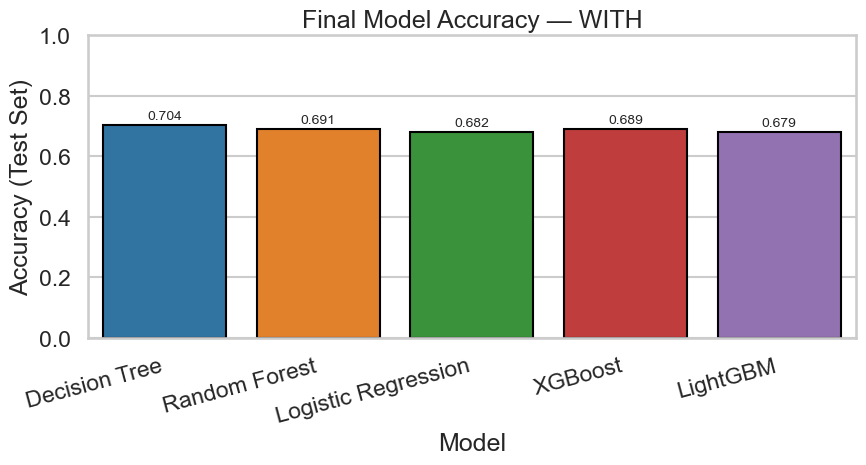

[Saved] figures/final\accuracy_bar_WITH.png


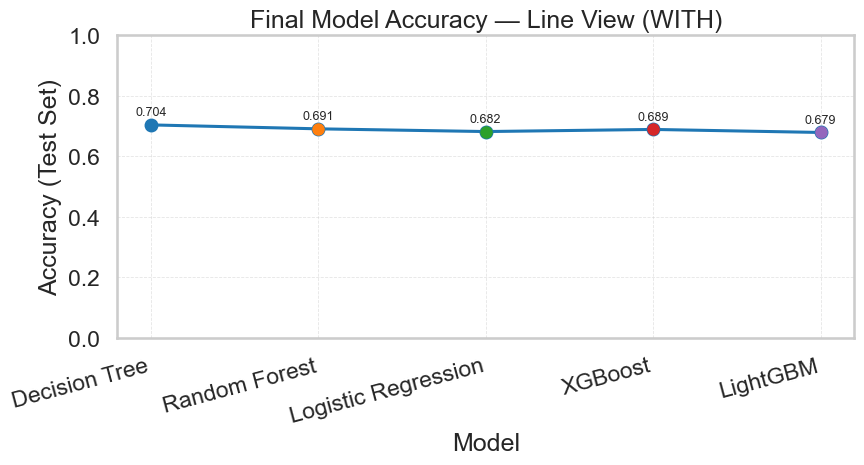

[Saved] figures/final\accuracy_line_WITH.png


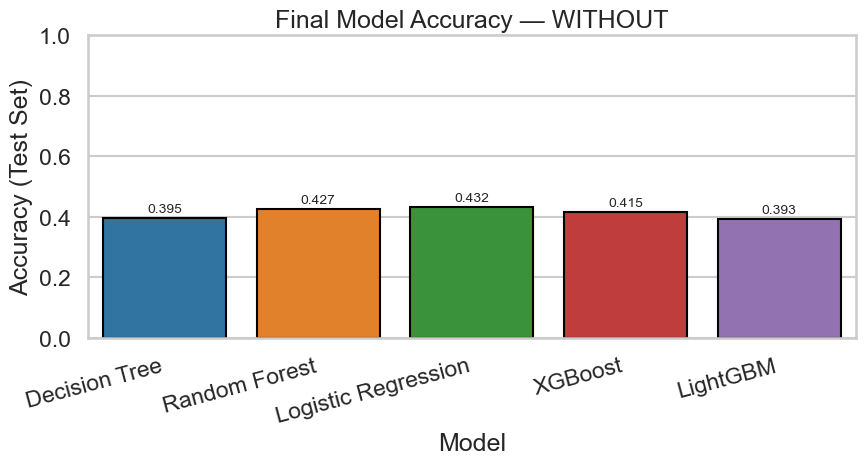

[Saved] figures/final\accuracy_bar_WITHOUT.png


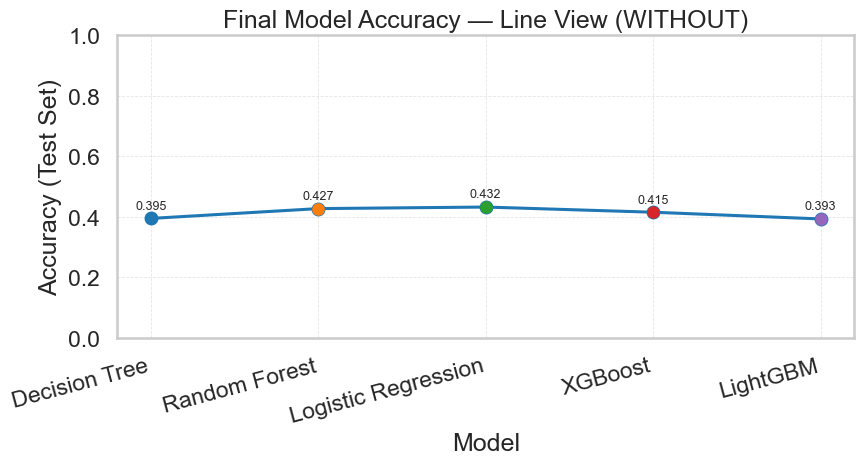

[Saved] figures/final\accuracy_line_WITHOUT.png


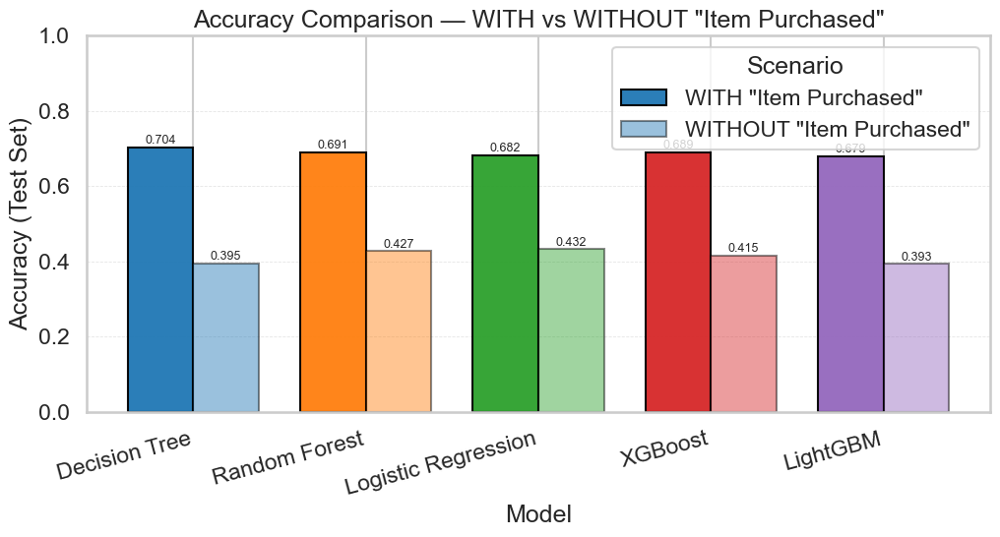

[Saved] figures/final\accuracy_bar_GROUPED.png


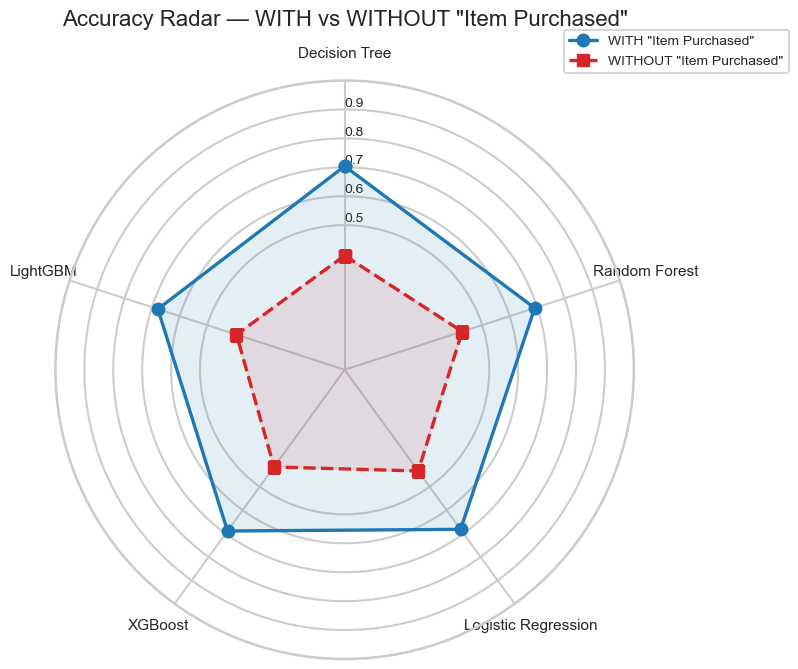

[Saved] figures/final\accuracy_radar_COMPARE.png


In [25]:
# =============================================================================
# STAGE 12 STEP 2B - Visualising Final Model Accuracy
# Comparison: WITH vs WITHOUT "Item Purchased"
# =============================================================================
# Summary:
# This step produces clear charts that show how accurate each final model is
# under two conditions:
#   1) WITH  "Item Purchased"  (full feature set)
#   2) WITHOUT "Item Purchased" (dominant feature removed)
#
# Why this matters:
# If performance drops sharply WITHOUT the feature, it indicates the system is
# heavily dependent on that variable, which is important for credibility.
#
# Inputs (created earlier in Stage 11 / Stage 10 snapshot):
#   • tables/final_test_metrics_wide.csv
#   • without/tables/final_test_metrics_wide.csv
#
# Outputs (saved + displayed in notebook):
#   • figures/final/accuracy_bar_WITH.png
#   • figures/final/accuracy_bar_WITHOUT.png
#   • figures/final/accuracy_bar_GROUPED.png
#   • figures/final/accuracy_line_WITH.png
#   • figures/final/accuracy_line_WITHOUT.png
#   • figures/final/accuracy_radar_COMPARE.png
# =============================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------------------------------
# 1) Set a consistent visual style (same look across your whole dissertation)
# -----------------------------------------------------------------------------
sns.set_context("talk")
sns.set_style("whitegrid")
PALETTE = sns.color_palette()  # reuse your existing palette (consistent project branding)

# -----------------------------------------------------------------------------
# 2) Define where to read inputs from and where to save outputs
# -----------------------------------------------------------------------------
OUT_DIR = "figures/final"
os.makedirs(OUT_DIR, exist_ok=True)

WITH_PATH = "tables/final_test_metrics_wide.csv"
WITHOUT_PATH = "without/tables/final_test_metrics_wide.csv"

# -----------------------------------------------------------------------------
# 3) Fix a consistent model order (keeps charts comparable across scenarios)
# -----------------------------------------------------------------------------
MODEL_ORDER = ["Decision Tree", "Random Forest", "Logistic Regression", "XGBoost", "LightGBM"]

# -----------------------------------------------------------------------------
# 4) Assign stable colours per model (so “Decision Tree” always looks the same)
# -----------------------------------------------------------------------------
MODEL_COLORS = {m: PALETTE[i % len(PALETTE)] for i, m in enumerate(MODEL_ORDER)}

# -----------------------------------------------------------------------------
# 5) Assign scenario colours (used in charts that overlay WITH vs WITHOUT)
# -----------------------------------------------------------------------------
SCENARIO_COLORS = {"WITH": PALETTE[0], "WITHOUT": PALETTE[3]}

# -----------------------------------------------------------------------------
# 6) Helper: load accuracy safely and return a clean table (Model + accuracy)
# -----------------------------------------------------------------------------
def load_accuracy_table(path):
    """
    Non-technical note:
    This reads the saved test-results table and extracts ONLY what we need for
    this visualisation: model names and accuracy.

    It also ensures:
    - values are numeric
    - values stay within 0–1
    - models appear in a consistent order
    """
    if not os.path.exists(path):
        return None

    df = pd.read_csv(path)

    # If required columns are missing, we stop safely
    if not {"Model", "accuracy"}.issubset(df.columns):
        return None

    # Keep only the known finalist models, in the same order everywhere
    df = df[df["Model"].isin(MODEL_ORDER)].copy()
    df["Model"] = pd.Categorical(df["Model"], categories=MODEL_ORDER, ordered=True)
    df = df.sort_values("Model")

    # Convert accuracy to numeric (non-numeric becomes NaN), then clip to [0,1]
    df["accuracy"] = pd.to_numeric(df["accuracy"], errors="coerce").clip(lower=0, upper=1)

    return df[["Model", "accuracy"]]

# -----------------------------------------------------------------------------
# 7) Helper: add value labels to bars (skips missing values)
# -----------------------------------------------------------------------------
def annotate_bars(ax, values, dy=0.01):
    """
    Non-technical note:
    We print the exact accuracy value on top of each bar to make charts easy
    to read for stakeholders.
    """
    for i, v in enumerate(values):
        if pd.notnull(v) and np.isfinite(v):
            ax.text(i, v + dy, f"{v:.3f}", ha="center", va="bottom", fontsize=10)

# -----------------------------------------------------------------------------
# 8) Plot 1: Accuracy bar chart for ONE scenario (WITH or WITHOUT)
# -----------------------------------------------------------------------------
def plot_accuracy_bar(df, scenario_tag):
    """
    Non-technical note:
    This chart answers: “Which model is most accurate in this scenario?”
    """
    models = df["Model"].tolist()
    acc = df["accuracy"].to_numpy()
    colors = [MODEL_COLORS[m] for m in models]

    plt.figure(figsize=(9, 5))
    ax = plt.gca()
    sns.barplot(x=models, y=acc, palette=colors, edgecolor="black")

    ax.set_ylim(0, 1)
    ax.set_ylabel("Accuracy (Test Set)")
    ax.set_xlabel("Model")
    ax.set_title(f"Final Model Accuracy — {scenario_tag}")
    plt.xticks(rotation=15, ha="right")

    annotate_bars(ax, acc)

    plt.tight_layout()
    out = os.path.join(OUT_DIR, f"accuracy_bar_{scenario_tag}.png")
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Saved] {out}")

# -----------------------------------------------------------------------------
# 9) Plot 2: Accuracy line chart for ONE scenario (WITH or WITHOUT)
# -----------------------------------------------------------------------------
def plot_accuracy_line(df, scenario_tag):
    """
    Non-technical note:
    This is the same information as the bar chart, but presented as a line
    to highlight differences between models more clearly.
    """
    models = df["Model"].tolist()
    acc = df["accuracy"].to_numpy()
    xs = np.arange(len(models))

    plt.figure(figsize=(9, 5))
    ax = plt.gca()
    ax.plot(xs, acc, linewidth=2.2, marker="o")

    # Colour each point using the model’s stable colour
    for x, y, m in zip(xs, acc, models):
        if pd.notnull(y) and np.isfinite(y):
            ax.plot([x], [y], marker="o", markersize=8, color=MODEL_COLORS[m])
            ax.annotate(f"{y:.3f}", (x, y), textcoords="offset points", xytext=(0, 7),
                        ha="center", fontsize=9)

    ax.set_xticks(xs)
    ax.set_xticklabels(models, rotation=15, ha="right")
    ax.set_ylim(0, 1)
    ax.set_ylabel("Accuracy (Test Set)")
    ax.set_xlabel("Model")
    ax.set_title(f"Final Model Accuracy — Line View ({scenario_tag})")
    ax.grid(True, linestyle="--", linewidth=0.6, alpha=0.5)

    plt.tight_layout()
    out = os.path.join(OUT_DIR, f"accuracy_line_{scenario_tag}.png")
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Saved] {out}")

# -----------------------------------------------------------------------------
# 10) Plot 3: Grouped bar chart (WITH vs WITHOUT side-by-side)
# -----------------------------------------------------------------------------
def plot_accuracy_grouped(with_df, wo_df):
    """
    Non-technical note:
    This chart answers: “How much does accuracy drop when we remove
    ‘Item Purchased’?”
    """
    common = MODEL_ORDER
    x = np.arange(len(common))
    width = 0.38

    with_vals = with_df.set_index("Model").loc[common, "accuracy"].to_numpy()
    wo_vals = wo_df.set_index("Model").loc[common, "accuracy"].to_numpy()

    plt.figure(figsize=(10.5, 5.8))
    ax = plt.gca()

    for i, model in enumerate(common):
        c = MODEL_COLORS[model]
        ax.bar(x[i] - width / 2, with_vals[i], width, color=c, alpha=0.95,
               edgecolor="black", label='WITH "Item Purchased"' if i == 0 else None)
        ax.bar(x[i] + width / 2, wo_vals[i], width, color=c, alpha=0.45,
               edgecolor="black", label='WITHOUT "Item Purchased"' if i == 0 else None)

        # Print values above bars
        if pd.notnull(with_vals[i]) and np.isfinite(with_vals[i]):
            ax.text(x[i] - width / 2, with_vals[i] + 0.01, f"{with_vals[i]:.3f}",
                    ha="center", fontsize=9)
        if pd.notnull(wo_vals[i]) and np.isfinite(wo_vals[i]):
            ax.text(x[i] + width / 2, wo_vals[i] + 0.01, f"{wo_vals[i]:.3f}",
                    ha="center", fontsize=9)

    ax.set_xticks(x)
    ax.set_xticklabels(common, rotation=15, ha="right")
    ax.set_ylim(0, 1)
    ax.set_ylabel("Accuracy (Test Set)")
    ax.set_xlabel("Model")
    ax.set_title('Accuracy Comparison — WITH vs WITHOUT "Item Purchased"')
    ax.grid(True, axis="y", linestyle="--", linewidth=0.6, alpha=0.5)
    ax.legend(title="Scenario", frameon=True)

    plt.tight_layout()
    out = os.path.join(OUT_DIR, "accuracy_bar_GROUPED.png")
    plt.savefig(out, dpi=220)
    plt.show()
    print(f"[Saved] {out}")

# -----------------------------------------------------------------------------
# 11) Plot 4: Radar chart (scenario comparison across model “axes”)
# -----------------------------------------------------------------------------
def plot_accuracy_radar(with_df, wo_df):
    """
    Non-technical note:
    Radar charts are a compact way to compare two scenarios across all models.
    Each spoke is a model; the distance from the centre is accuracy.
    """
    labels = MODEL_ORDER
    with_vals = with_df.set_index("Model").loc[labels, "accuracy"].astype(float).tolist()
    wo_vals = wo_df.set_index("Model").loc[labels, "accuracy"].astype(float).tolist()

    n = len(labels)
    angles = np.linspace(0, 2 * np.pi, n, endpoint=False)
    angles = np.concatenate([angles, angles[:1]])

    wv = np.array(with_vals + with_vals[:1])
    zv = np.array(wo_vals + wo_vals[:1])

    fig = plt.figure(figsize=(9, 7))
    ax = plt.subplot(111, polar=True)
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    ax.set_thetagrids(angles[:-1] * 180 / np.pi, labels, fontsize=11)
    ax.set_ylim(0, 1)
    ax.set_yticks([0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels([f"{t:.1f}" for t in [0.5, 0.6, 0.7, 0.8, 0.9]], fontsize=10)
    ax.set_rlabel_position(0)

    # WITH polygon
    ax.plot(angles, wv, linewidth=2.4, marker="o",
            label='WITH "Item Purchased"', color=SCENARIO_COLORS["WITH"])
    ax.fill(angles, wv, alpha=0.12, color=SCENARIO_COLORS["WITH"])

    # WITHOUT polygon
    ax.plot(angles, zv, linewidth=2.4, marker="s", linestyle="--",
            label='WITHOUT "Item Purchased"', color=SCENARIO_COLORS["WITHOUT"])
    ax.fill(angles, zv, alpha=0.10, color=SCENARIO_COLORS["WITHOUT"])

    ax.legend(loc="upper right", bbox_to_anchor=(1.28, 1.10), frameon=True, fontsize=10)
    ax.set_title('Accuracy Radar — WITH vs WITHOUT "Item Purchased"', y=1.08, fontsize=16)

    plt.tight_layout()
    out = os.path.join(OUT_DIR, "accuracy_radar_COMPARE.png")
    plt.savefig(out, dpi=220, bbox_inches="tight")
    plt.show()
    print(f"[Saved] {out}")

# -----------------------------------------------------------------------------
# 12) RUN: load data, print tables, generate charts, save outputs
# -----------------------------------------------------------------------------
df_with = load_accuracy_table(WITH_PATH)
df_wo = load_accuracy_table(WITHOUT_PATH)

# Print the exact numbers used (so results are transparent and traceable)
if df_with is not None:
    print("\n[WITH] Accuracy table used for charts:")
    print(df_with.round(3).to_string(index=False))
else:
    print("\n[WITH] WARNING: Missing or invalid input table — no WITH charts will be created.")

if df_wo is not None:
    print("\n[WITHOUT] Accuracy table used for charts:")
    print(df_wo.round(3).to_string(index=False))
else:
    print("\n[WITHOUT] NOTE: Missing or invalid input table — WITHOUT-only and comparison charts will be skipped.")

# Create charts for each scenario
if df_with is not None:
    plot_accuracy_bar(df_with, "WITH")
    plot_accuracy_line(df_with, "WITH")

if df_wo is not None:
    plot_accuracy_bar(df_wo, "WITHOUT")
    plot_accuracy_line(df_wo, "WITHOUT")

# Create comparison charts only if BOTH scenarios exist
if (df_with is not None) and (df_wo is not None):
    plot_accuracy_grouped(df_with, df_wo)
    plot_accuracy_radar(df_with, df_wo)